In [121]:
import pandas as pd
import numpy as np
import networkx as nx
import sys
import matplotlib.pyplot as plt
import random
import time
from nxsim import BaseNetworkAgent
nx.__version__

'2.2'

In [122]:
read_data = pd.read_csv("pnas.1713568115.sd01.txt") #read the data file, no cleaning required
read_data = read_data[read_data['trial'] == 1]  #take the data for the 1st trial only
data = read_data
data.head(10)
#print(len(data))
#type(data)

data['time'] = data['end'] - data['begin']#store the diff btw begin and end to get total time for each trans. in ms
data['time'] = data['time']/1000.0 #change 'ms' to 's'
data['time'] = data['time'].map(lambda x: [x]) #convert the time attr to list as as there are multiple iteractions between two bees

In [123]:
data.head(20) #print the first ten

,trial,id1,id2,begin,end,time
0,1,201,219,1.373105e+12,1.373105e+12,[2.0]
1,1,201,219,1.373109e+12,1.373109e+12,[42.0]
2,1,201,242,1.373119e+12,1.373119e+12,[2.0]
3,1,201,242,1.373119e+12,1.373119e+12,[2.999]
4,1,201,255,1.372958e+12,1.372958e+12,[41.999]
5,1,201,259,1.372937e+12,1.372937e+12,[15.0]
6,1,201,259,1.373041e+12,1.373041e+12,[3.0]
7,1,201,259,1.373240e+12,1.373240e+12,[8.0]
8,1,201,262,1.373360e+12,1.373360e+12,[27.999]
9,1,201,263,1.373178e+12,1.373178e+12,[2.0]


In [124]:
id1_unique = data['id1'].unique() #the food transferring bee
id2_unique = data['id2'].unique() #the food receiving bee
len(id2_unique)

1159

In [125]:
data = data.groupby(['id1','id2']).agg({'time': 'sum'}) #group by id1 and id2 as nodes and time as a list of weights
data.head(100)

time
id1 id2                                                   
201 219                                        [2.0, 42.0]
    242                                       [2.0, 2.999]
    255                                           [41.999]
    259                                   [15.0, 3.0, 8.0]
    262                                           [27.999]
    263                                              [2.0]
    264                                              [3.0]
    267                                              [2.0]
    268                                         [5.0, 3.0]
    271                             [3.0, 13.0, 8.0, 13.0]
    272                                 [26.999, 2.0, 8.0]
    275                                        [12.0, 4.0]
    277                                              [3.0]
    279                                         [2.0, 2.0]
    280                                              [5.0]
    288                                           [10.999]
    289                                              [2.0]
    301                                         [2.0, 2.0]
    315                                   [18.0, 3.0, 2.0]
    332                                  [5.0, 7.999, 5.0]
    334                                             [19.0]
    335                                            [6.999]
    336                                         [2.0, 3.0]
    338                                              [2.0]
    340                                              [6.0]
    342                                       [4.0, 3.999]
    344                                              [2.0]
    347                                              [4.0]
    351                                              [2.0]
    355                                         [3.0, 5.0]
...                                                    ...
    495                                              [4.0]
    496                                              [4.0]
    498                                              [2.0]
    509                                              [4.0]
    511                                              [3.0]
    513                                         [7.0, 3.0]
    518                                              [2.0]
    520  [13.0, 2.0, 4.0, 2.0, 4.0, 4.0, 16.0, 10.0, 86...
    522                                              [6.0]
    549                                         [2.0, 2.0]
    555                                       [3.0, 9.999]
    556                              [3.0, 2.0, 4.0, 10.0]
    557                                    [7.0, 2.0, 2.0]
    564                                        [13.0, 2.0]
    567                                              [2.0]
    575                                              [2.0]
    576                                              [3.0]
    578                                             [10.0]
    594                                              [5.0]
    604                                              [4.0]
    608                                         [3.0, 3.0]
    613                                              [4.0]
    622                                              [3.0]
    623                                              [2.0]
    636                                              [2.0]
    637                                      [2.999, 26.0]
    639                             [42.0, 11.999, 18.999]
    640                                              [4.0]
    645                                              [3.0]
    647                                              [2.0]

[100 rows x 1 columns]

In [126]:
data = data.reset_index() #reset index after group by as there are some none values for column id1

In [127]:
data.head(10)

,id1,id2,time
0,201,219,"[2.0, 42.0]"
1,201,242,"[2.0, 2.999]"
2,201,255,[41.999]
3,201,259,"[15.0, 3.0, 8.0]"
4,201,262,[27.999]
5,201,263,[2.0]
6,201,264,[3.0]
7,201,267,[2.0]
8,201,268,"[5.0, 3.0]"
9,201,271,"[3.0, 13.0, 8.0, 13.0]"


In [128]:
for index, row in data.iterrows():
        print(row[0],row[1],row[2])

201 219 [2.0, 42.0]
201 242 [2.0, 2.999]
201 255 [41.999]
201 259 [15.0, 3.0, 8.0]
201 262 [27.999]
201 263 [2.0]
201 264 [3.0]
201 267 [2.0]
201 268 [5.0, 3.0]
201 271 [3.0, 13.0, 8.0, 13.0]
201 272 [26.999, 2.0, 8.0]
201 275 [12.0, 4.0]
201 277 [3.0]
201 279 [2.0, 2.0]
201 280 [5.0]
201 288 [10.999]
201 289 [2.0]
201 301 [2.0, 2.0]
201 315 [18.0, 3.0, 2.0]
201 332 [5.0, 7.999, 5.0]
201 334 [19.0]
201 335 [6.999]
201 336 [2.0, 3.0]
201 338 [2.0]
201 340 [6.0]
201 342 [4.0, 3.999]
201 344 [2.0]
201 347 [4.0]
201 351 [2.0]
201 355 [3.0, 5.0]
201 357 [2.0]
201 360 [2.0, 3.0]
201 361 [2.0, 7.999]
201 363 [3.0, 2.0]
201 370 [48.999]
201 376 [2.0, 8.999]
201 380 [2.0, 2.0, 2.0]
201 382 [2.0, 2.0, 2.0]
201 384 [2.0]
201 391 [2.0]
201 393 [3.0, 16.0, 4.0, 4.0, 27.0]
201 404 [3.0]
201 408 [2.0]
201 411 [11.0]
201 417 [9.999]
201 421 [2.0, 2.0]
201 422 [6.0]
201 426 [2.0]
201 430 [2.0]
201 432 [2.0]
201 433 [2.0, 4.0, 4.0, 2.0]
201 434 [11.0]
201 438 [2.0]
201 439 [2.0, 2.0]
201 444 [3.0]
201 4

207 1324 [5.0]
207 1336 [3.0]
207 1338 [5.0, 3.0, 2.0]
207 1339 [2.0]
207 1343 [2.0, 2.0, 4.0]
207 1344 [4.0]
207 1347 [4.999]
207 1350 [7.999]
207 1356 [12.0]
207 1364 [11.0, 3.0, 2.0, 2.0]
207 1365 [13.0]
207 1392 [3.0]
207 1422 [2.0]
207 1441 [5.0]
207 1442 [2.0]
207 1448 [2.0]
207 1449 [2.0, 5.0, 3.0, 4.0]
207 1466 [4.0]
207 1470 [2.0, 3.0, 2.0]
207 1479 [2.0]
207 1480 [31.999, 2.0, 2.0]
207 1489 [2.0]
207 1495 [3.0]
207 1498 [2.0]
207 1502 [10.0, 2.0]
207 1508 [2.0]
207 1510 [3.0]
207 1513 [2.0, 2.0, 2.0]
207 1514 [2.0, 2.0, 2.0]
207 1517 [5.0, 7.0, 8.0, 1.999]
207 1518 [5.0]
207 1529 [2.0]
207 1533 [2.0, 2.0]
207 1536 [5.0]
207 1542 [2.0]
207 1548 [2.0]
207 1551 [3.0]
207 1554 [2.0]
207 1561 [2.0]
207 1562 [6.0]
207 1563 [3.0]
207 1570 [3.0]
207 1581 [3.0]
207 1584 [3.0, 2.0, 2.0]
207 1585 [3.0]
207 1590 [2.0]
207 1593 [2.0]
207 1607 [2.0]
207 1614 [2.001, 15.999]
207 1618 [2.0]
207 1619 [2.0]
207 1622 [5.0]
207 1630 [2.0]
207 1632 [2.0]
207 1634 [2.0]
207 1635 [7.0]
207 1636 [2.

219 1987 [14.999]
219 1989 [10.0]
219 1990 [2.0]
219 1991 [2.0, 2.0]
219 1994 [3.0]
219 1997 [2.999, 3.0, 2.0, 2.0]
219 1999 [23.0]
219 2005 [15.0]
219 2007 [2.0]
219 2011 [2.0]
219 2018 [11.0, 2.0, 8.0, 2.0]
219 2022 [2.0]
219 2028 [3.0]
219 2045 [2.0, 3.0, 5.0, 9.0, 2.0, 2.0]
236 242 [3.0]
236 243 [4.0]
236 256 [4.0, 1.999]
236 263 [1.999]
236 266 [3.0]
236 268 [13.0]
236 276 [9.0, 1.999, 3.0]
236 278 [3.0]
236 282 [11.0, 3.0, 8.999, 8.0]
236 287 [2.0]
236 292 [3.0]
236 297 [2.0]
236 298 [3.0]
236 329 [4.0]
236 331 [4.0]
236 336 [2.0, 5.0]
236 337 [2.0]
236 347 [2.0]
236 355 [2.0]
236 359 [2.0]
236 361 [2.0]
236 363 [2.0]
236 376 [2.0]
236 382 [3.0]
236 408 [8.0]
236 417 [27.0]
236 422 [1.999]
236 429 [4.0, 2.0]
236 433 [2.0]
236 455 [3.0]
236 460 [2.0, 3.0]
236 464 [20.999]
236 470 [4.0]
236 471 [32.0]
236 480 [6.0]
236 487 [3.0, 2.0]
236 494 [4.0]
236 497 [2.0]
236 556 [17.0]
236 571 [3.0]
236 578 [2.0]
236 601 [2.999, 2.0]
236 603 [2.0]
236 612 [2.0]
236 620 [7.0]
236 643 [2.0]
23

242 1280 [4.0, 3.0, 2.0, 2.999, 5.0]
242 1282 [3.0, 26.999]
242 1284 [2.0]
242 1285 [2.0]
242 1286 [3.0]
242 1302 [15.0, 2.0]
242 1305 [20.0]
242 1306 [3.0, 5.999]
242 1312 [2.0]
242 1316 [10.999]
242 1318 [2.0, 9.0]
242 1323 [2.0]
242 1327 [3.0, 3.0]
242 1330 [4.0]
242 1336 [4.0]
242 1338 [2.0]
242 1339 [2.0]
242 1340 [2.0, 6.0, 11.999]
242 1360 [3.0]
242 1378 [3.0]
242 1383 [3.0]
242 1390 [6.999]
242 1396 [9.999]
242 1415 [30.999, 2.0]
242 1422 [11.0, 102.999, 4.0]
242 1438 [4.0]
242 1441 [99.999]
242 1442 [2.999, 2.0, 2.0]
242 1446 [2.0, 5.0, 6.0]
242 1448 [3.0]
242 1450 [7.0]
242 1452 [2.0]
242 1454 [6.999]
242 1455 [4.0]
242 1456 [2.0, 2.999]
242 1461 [24.0]
242 1466 [2.0]
242 1468 [3.0, 11.0]
242 1469 [2.0]
242 1470 [3.0, 3.0]
242 1473 [14.0, 2.0]
242 1479 [4.0]
242 1481 [2.0, 2.0, 2.0]
242 1484 [2.0, 2.0, 6.0]
242 1489 [4.0, 2.0, 3.0]
242 1490 [2.0]
242 1498 [4.0]
242 1500 [8.0]
242 1503 [2.0]
242 1508 [2.0, 2.0]
242 1511 [16.999]
242 1517 [2.0]
242 1524 [9.0]
242 1529 [8.0]
242

245 969 [2.0]
245 977 [2.0, 2.0, 2.0]
245 984 [3.0]
245 989 [3.0, 5.0]
245 991 [2.0, 3.0]
245 995 [36.999]
245 1008 [3.0]
245 1014 [42.999, 3.0]
245 1015 [4.0]
245 1029 [11.999, 2.0]
245 1031 [6.0]
245 1033 [3.0]
245 1036 [2.0, 5.0]
245 1041 [2.0, 5.999]
245 1046 [27.0, 13.0, 4.0, 3.0, 2.001, 9.0]
245 1048 [3.0]
245 1054 [3.0]
245 1055 [2.0]
245 1057 [4.0]
245 1059 [54.999, 2.0]
245 1061 [3.0]
245 1073 [1.999]
245 1078 [2.0]
245 1089 [3.0, 2.0, 2.0]
245 1096 [7.0, 2.0]
245 1110 [4.0]
245 1115 [4.0]
245 1124 [21.999, 8.0, 2.0, 3.0]
245 1151 [3.0]
245 1154 [2.0]
245 1157 [3.999]
245 1159 [2.0]
245 1167 [2.0]
245 1177 [17.0, 2.0, 2.0]
245 1188 [2.0, 6.0]
245 1189 [3.0, 9.999]
245 1190 [5.0]
245 1192 [4.0, 2.0, 3.0]
245 1195 [5.0]
245 1197 [22.0, 4.0]
245 1199 [4.0]
245 1205 [18.999]
245 1206 [2.0, 2.0, 3.0]
245 1214 [11.0, 2.0]
245 1216 [2.0, 2.0, 3.0]
245 1222 [3.0]
245 1225 [5.0]
245 1228 [7.0]
245 1242 [9.0]
245 1244 [2.0]
245 1245 [122.998]
245 1247 [3.0]
245 1251 [2.0, 2.0]
245 1255 

246 1808 [2.0, 2.0, 2.0, 2.0]
246 1809 [2.0, 4.0, 2.0]
246 1810 [2.0]
246 1811 [3.0]
246 1816 [10.0, 7.0, 2.0]
246 1819 [2.0]
246 1821 [2.0, 3.0]
246 1823 [7.0, 8.0]
246 1826 [2.0, 2.0]
246 1828 [2.0, 3.0]
246 1829 [26.0]
246 1833 [2.0]
246 1842 [3.0, 2.0, 11.0, 3.0]
246 1851 [2.0, 1.999]
246 1854 [3.0, 2.0]
246 1856 [3.0]
246 1857 [2.0]
246 1859 [9.0, 2.0]
246 1865 [2.0]
246 1875 [6.0, 2.0]
246 1888 [2.0]
246 1892 [13.999]
246 1897 [2.0, 9.0]
246 1923 [1.999, 2.0, 14.0]
246 1924 [8.0]
246 1926 [2.0, 2.0, 7.0]
246 1929 [13.0, 6.0]
246 1931 [5.0]
246 1945 [4.0]
246 1948 [3.0, 3.0]
246 1955 [2.0]
246 1959 [2.0]
246 1960 [4.0]
246 1965 [2.0]
246 1966 [11.0, 11.0]
246 1968 [3.0, 3.0, 6.0, 2.0, 2.0, 5.0]
246 1969 [14.0, 6.999]
246 1973 [2.0, 3.0]
246 1984 [3.0]
246 1985 [2.999]
246 1990 [2.0, 7.999]
246 1993 [7.0, 21.999]
246 1994 [6.0, 3.999, 4.0, 6.0, 2.0]
246 1996 [5.0]
246 1999 [29.0, 3.0, 14.0, 24.999]
246 2001 [2.0]
246 2002 [3.0, 23.999]
246 2003 [3.0]
246 2004 [2.0]
246 2007 [3.0, 2

255 1290 [3.0]
255 1291 [2.0]
255 1294 [3.0]
255 1312 [47.999]
255 1327 [12.0]
255 1339 [8.0, 2.0]
255 1346 [7.0, 8.0]
255 1347 [10.0, 173.996]
255 1356 [2.0]
255 1360 [3.0]
255 1364 [2.0, 5.0, 22.999, 4.0]
255 1367 [19.0]
255 1397 [8.0]
255 1441 [7.999]
255 1450 [2.0]
255 1460 [23.999]
255 1469 [6.0, 11.0]
255 1473 [2.0]
255 1482 [2.0, 2.0]
255 1499 [6.0]
255 1500 [32.0, 13.999, 6.0]
255 1502 [1.999]
255 1505 [2.0]
255 1510 [28.0]
255 1524 [2.0]
255 1529 [18.0]
255 1533 [3.0]
255 1541 [4.999]
255 1544 [3.0]
255 1545 [6.0]
255 1548 [2.0, 2.0]
255 1552 [2.0]
255 1554 [3.0]
255 1556 [5.0]
255 1582 [8.0]
255 1586 [2.0]
255 1619 [3.0]
255 1621 [31.0, 2.0]
255 1622 [9.0]
255 1626 [2.0]
255 1630 [9.0, 7.0]
255 1635 [11.0, 83.999, 4.0, 6.999, 3.0, 3.0, 3.0, 10.0, 2.0]
255 1638 [2.0, 2.0]
255 1646 [6.0]
255 1651 [2.0]
255 1655 [26.0]
255 1664 [2.0]
255 1665 [2.0, 8.0, 2.0, 2.0, 8.0, 5.0]
255 1667 [29.0, 4.0]
255 1669 [2.0]
255 1685 [2.0, 4.0, 15.0, 2.0]
255 1691 [2.0, 2.0]
255 1695 [4.0]
255 1

257 1590 [2.0]
257 1591 [2.0, 15.999, 2.0]
257 1600 [4.0]
257 1616 [2.0]
257 1619 [7.0]
257 1623 [19.0]
257 1625 [4.0]
257 1626 [11.999, 7.0]
257 1634 [10.0]
257 1648 [2.0]
257 1649 [6.0]
257 1651 [2.0]
257 1653 [2.0]
257 1654 [21.0]
257 1655 [2.0, 10.999]
257 1658 [2.0]
257 1665 [2.0]
257 1670 [3.0]
257 1671 [4.0, 12.0]
257 1672 [51.999]
257 1675 [3.0, 3.0, 3.999, 4.0]
257 1680 [15.0, 4.0]
257 1688 [11.999, 3.0, 2.0]
257 1691 [2.0]
257 1696 [2.0, 10.0]
257 1705 [5.0]
257 1708 [6.999]
257 1710 [7.0]
257 1715 [4.0, 4.0]
257 1718 [3.0]
257 1728 [2.0]
257 1732 [3.0]
257 1734 [5.0]
257 1735 [2.0]
257 1746 [3.0, 2.0, 4.0]
257 1751 [3.0, 10.0]
257 1754 [5.0, 17.0, 11.0, 5.0, 79.998, 1.999, 3.0, 14.999]
257 1758 [2.0]
257 1759 [2.0]
257 1764 [4.0]
257 1767 [19.0]
257 1780 [2.0]
257 1784 [2.0]
257 1785 [7.0]
257 1786 [5.0]
257 1792 [31.999]
257 1800 [6.0]
257 1802 [2.0, 55.999, 2.0]
257 1806 [16.0]
257 1807 [4.0, 2.0]
257 1808 [4.0]
257 1813 [15.0]
257 1814 [2.0]
257 1816 [4.0, 6.0, 5.0]
257 1

KeyboardInterrupt: 

In [129]:
import copy
def make_graph(data): #make a graph out of the dataframe structure
    G = nx.Graph() #initialize the graph
    for index, row in data.iterrows():
        #print(row[0],row[1],row[2])
        G.add_edge(row[0],row[1], weight = copy.deepcopy(row[2])) #add node1,node2,weight list iteratively to the graph
    
    return G




In [130]:
G = make_graph(data)
k = G[201][219]['weight']


In [131]:
k.pop(0)

2.0

In [132]:
data.head(2)

,id1,id2,time
0,201,219,"[2.0, 42.0]"
1,201,242,"[2.0, 2.999]"


In [74]:

G = make_graph(data)
nodes = list(G.nodes)
len(set(nodes)) #number of unique nodes

201 219 [2.0]
201 242 [2.0]
201 255 []
201 259 []
201 262 []
201 263 [2.0]
201 264 []
201 267 [2.0]
201 268 []
201 271 []
201 272 [2.0]
201 275 []
201 277 []
201 279 [2.0, 2.0]
201 280 []
201 288 []
201 289 [2.0]
201 301 [2.0, 2.0]
201 315 [2.0]
201 332 []
201 334 []
201 335 []
201 336 [2.0]
201 338 [2.0]
201 340 []
201 342 []
201 344 [2.0]
201 347 []
201 351 [2.0]
201 355 []
201 357 [2.0]
201 360 [2.0]
201 361 [2.0]
201 363 [2.0]
201 370 []
201 376 [2.0]
201 380 [2.0, 2.0, 2.0]
201 382 [2.0, 2.0, 2.0]
201 384 [2.0]
201 391 [2.0]
201 393 []
201 404 []
201 408 [2.0]
201 411 []
201 417 []
201 421 [2.0, 2.0]
201 422 []
201 426 [2.0]
201 430 [2.0]
201 432 [2.0]
201 433 [2.0, 2.0]
201 434 []
201 438 [2.0]
201 439 [2.0, 2.0]
201 444 []
201 449 []
201 450 []
201 461 []
201 466 [2.0]
201 468 []
201 472 [2.0]
201 474 []
201 475 []
201 480 []
201 481 [2.0, 2.0]
201 482 [2.0]
201 483 [2.0]
201 491 [2.0]
201 492 []
201 494 []
201 495 []
201 496 []
201 498 [2.0]
201 509 []
201 511 []
201 513 []
201

207 1105 []
207 1114 [2.0]
207 1124 []
207 1126 [2.0]
207 1128 [2.0]
207 1138 []
207 1152 []
207 1163 [2.0]
207 1167 []
207 1179 [2.0]
207 1188 []
207 1189 [2.0, 2.0]
207 1194 [2.0]
207 1195 [2.0]
207 1199 [1.999]
207 1208 []
207 1209 []
207 1213 [2.0]
207 1220 [2.0]
207 1225 [2.0]
207 1229 [2.0]
207 1233 [2.0]
207 1236 []
207 1244 [2.0, 2.0]
207 1245 []
207 1249 [2.0]
207 1268 [2.0, 2.0]
207 1269 []
207 1270 [2.0]
207 1278 []
207 1279 []
207 1284 [2.0]
207 1305 []
207 1306 []
207 1311 [2.0]
207 1315 []
207 1318 []
207 1324 []
207 1336 []
207 1338 [2.0]
207 1339 [2.0]
207 1343 [2.0, 2.0]
207 1344 []
207 1347 []
207 1350 []
207 1356 []
207 1364 [2.0, 2.0]
207 1365 []
207 1392 []
207 1422 [2.0]
207 1441 []
207 1442 [2.0]
207 1448 [2.0]
207 1449 [2.0]
207 1466 []
207 1470 [2.0, 2.0]
207 1479 [2.0]
207 1480 [2.0, 2.0]
207 1489 [2.0]
207 1495 []
207 1498 [2.0]
207 1502 [2.0]
207 1508 [2.0]
207 1510 []
207 1513 [2.0, 2.0, 2.0]
207 1514 [2.0, 2.0, 2.0]
207 1517 [1.999]
207 1518 []
207 1529 [2

242 258 [2.0]
242 262 [2.0]
242 268 []
242 271 []
242 275 [2.0]
242 276 []
242 277 []
242 279 [1.999]
242 280 []
242 282 [2.0]
242 286 [2.0]
242 290 []
242 293 [2.0, 1.999]
242 314 []
242 315 [2.0]
242 328 []
242 330 []
242 331 [2.0]
242 336 [2.0]
242 337 []
242 340 [2.0]
242 344 [2.0]
242 345 [2.0]
242 353 []
242 359 [2.0]
242 361 [2.0]
242 366 []
242 367 [2.0]
242 370 []
242 384 [2.0]
242 386 []
242 417 []
242 422 [2.0]
242 429 []
242 430 [2.0, 2.0]
242 433 [2.0]
242 434 []
242 436 []
242 447 [2.0]
242 449 []
242 450 [2.0]
242 451 [2.0]
242 453 []
242 454 []
242 458 [2.0]
242 460 [2.0]
242 464 []
242 465 [2.0]
242 477 [2.0]
242 484 [2.0]
242 485 [2.0]
242 492 [2.0]
242 494 [2.0, 2.0]
242 495 [2.0]
242 499 [2.0]
242 502 []
242 505 []
242 511 [2.0]
242 513 []
242 515 [2.0]
242 516 []
242 522 []
242 537 []
242 539 []
242 556 []
242 557 [2.0]
242 559 []
242 562 [2.0]
242 565 [2.0]
242 578 []
242 594 [2.0]
242 598 [2.0]
242 599 [2.0]
242 600 [2.0, 2.0]
242 612 [2.0, 2.0]
242 615 []
242 61

246 468 []
246 470 []
246 474 []
246 475 [2.0]
246 479 []
246 483 []
246 485 [2.0, 2.0]
246 495 [2.0]
246 497 [2.0]
246 499 [2.0]
246 501 [2.0]
246 503 [1.999]
246 506 []
246 511 []
246 513 []
246 515 []
246 522 [2.0]
246 523 [2.0]
246 537 []
246 538 [2.0]
246 539 [2.0, 2.0]
246 541 []
246 546 []
246 549 []
246 556 [2.0]
246 557 [2.0]
246 567 [2.0]
246 575 [2.0]
246 578 [1.999]
246 601 []
246 604 []
246 608 [2.0]
246 609 []
246 611 []
246 613 [2.0]
246 614 []
246 615 []
246 619 [2.0]
246 620 [2.0]
246 621 []
246 623 [2.0]
246 625 []
246 631 [2.0]
246 632 [2.0]
246 640 []
246 645 []
246 647 [2.0, 2.0]
246 648 [2.0, 2.0]
246 649 [2.0]
246 659 [2.0]
246 660 [2.0]
246 661 [2.0]
246 664 [2.0]
246 667 [2.0]
246 670 [2.0]
246 677 []
246 687 []
246 688 [2.0, 2.0]
246 692 [2.0, 2.0, 2.0]
246 693 [2.0]
246 694 [2.0]
246 700 [2.0]
246 701 []
246 705 [2.0, 2.0, 2.0]
246 706 [2.0, 1.999]
246 712 []
246 713 []
246 715 [2.0]
246 717 []
246 728 [2.0]
246 733 [2.0, 2.0]
246 735 []
246 736 [2.0]
246 738

249 1878 []
249 1897 []
249 1923 []
249 1926 []
249 1947 []
249 1973 []
249 1983 []
249 1988 []
249 1993 []
249 2013 []
249 2014 []
249 2017 []
249 2027 []
249 2028 []
252 257 [2.0]
252 258 []
252 264 [2.0]
252 265 []
252 268 []
252 272 [2.0]
252 273 []
252 276 []
252 283 []
252 298 []
252 315 [2.0]
252 329 []
252 331 [2.0]
252 334 []
252 335 []
252 339 [2.0]
252 342 [2.0]
252 344 []
252 347 []
252 351 [2.0]
252 355 []
252 359 []
252 363 []
252 370 []
252 422 []
252 426 [2.0]
252 436 []
252 444 [2.0]
252 454 [2.0]
252 461 [2.0]
252 466 []
252 477 [2.0]
252 479 []
252 481 []
252 494 []
252 497 [2.0, 2.0]
252 511 [2.0]
252 555 [2.0, 2.0]
252 557 []
252 564 [2.0]
252 571 [2.0]
252 577 [1.999]
252 585 [2.0, 2.0]
252 594 [2.0]
252 601 [2.0]
252 603 []
252 618 []
252 623 [2.0]
252 632 [2.0]
252 640 [1.999]
252 649 []
252 655 [2.0]
252 660 [2.0]
252 661 []
252 665 [2.0]
252 667 [2.0]
252 673 []
252 678 []
252 688 []
252 693 [2.0]
252 694 [2.0]
252 695 []
252 702 [2.0]
252 717 []
252 720 []
25

257 1734 []
257 1735 []
257 1746 []
257 1751 []
257 1754 [1.999]
257 1758 []
257 1759 []
257 1764 []
257 1767 []
257 1780 []
257 1784 []
257 1785 []
257 1786 []
257 1792 []
257 1800 []
257 1802 []
257 1806 []
257 1807 []
257 1808 []
257 1813 []
257 1814 []
257 1816 []
257 1818 []
257 1819 []
257 1828 []
257 1829 []
257 1831 []
257 1836 []
257 1838 []
257 1840 []
257 1855 []
257 1857 []
257 1869 []
257 1875 []
257 1878 []
257 1923 []
257 1924 []
257 1931 []
257 1943 []
257 1955 []
257 1959 []
257 1960 []
257 1966 []
257 1969 []
257 1973 []
257 1989 []
257 1995 []
257 2003 []
257 2005 []
257 2007 []
257 2008 []
257 2010 []
257 2016 []
257 2017 []
257 2019 []
257 2020 []
257 2023 []
257 2034 []
257 2037 []
257 2045 []
258 259 [2.0, 2.0]
258 263 [2.0, 2.0]
258 264 []
258 266 [2.0]
258 267 [2.0]
258 271 []
258 278 []
258 280 []
258 282 [2.0]
258 284 [2.0, 2.0]
258 286 []
258 288 []
258 290 []
258 301 [2.0, 2.0, 2.0, 2.0]
258 330 []
258 332 []
258 334 []
258 337 []
258 338 []
258 339 [2.0]
2

262 1200 [2.0]
262 1201 []
262 1204 []
262 1206 []
262 1208 []
262 1209 []
262 1214 []
262 1218 []
262 1220 [2.0]
262 1222 [2.0]
262 1225 []
262 1229 [2.0]
262 1230 []
262 1236 [2.0]
262 1241 [2.0]
262 1244 [2.0]
262 1248 []
262 1251 []
262 1255 [2.0]
262 1257 []
262 1258 []
262 1259 [2.0, 2.0]
262 1268 []
262 1270 [2.0, 2.0]
262 1271 []
262 1273 []
262 1276 []
262 1280 []
262 1284 []
262 1285 [2.0]
262 1286 [2.0]
262 1287 [2.0]
262 1289 [2.0]
262 1290 [2.0]
262 1294 [2.0]
262 1299 []
262 1307 [2.0]
262 1315 []
262 1316 [2.0]
262 1318 [2.0]
262 1322 []
262 1327 [2.0, 2.0]
262 1330 []
262 1336 [2.0, 2.0]
262 1356 [2.0]
262 1357 [2.0]
262 1367 [2.0]
262 1368 []
262 1372 []
262 1373 [2.0]
262 1383 [2.0]
262 1384 []
262 1388 []
262 1390 []
262 1395 []
262 1415 []
262 1431 []
262 1436 []
262 1442 [2.0, 2.0]
262 1443 [2.0, 2.0]
262 1445 []
262 1447 []
262 1449 [2.0, 2.0]
262 1455 [2.0]
262 1456 [2.0]
262 1464 [2.0]
262 1465 []
262 1467 [2.0, 2.0]
262 1470 [2.0]
262 1475 [1.999]
262 1477 [2.0

264 737 []
264 739 [2.0]
264 750 [2.0]
264 751 []
264 755 []
264 757 []
264 759 []
264 763 []
264 764 []
264 768 [1.999]
264 769 [2.0]
264 771 [2.0]
264 772 []
264 774 []
264 778 []
264 779 []
264 780 [2.0]
264 782 [2.0]
264 783 [2.0]
264 786 [2.0]
264 797 []
264 800 []
264 801 []
264 803 []
264 804 []
264 808 []
264 815 []
264 834 []
264 840 []
264 842 []
264 845 [2.0]
264 859 [2.0]
264 861 [2.0]
264 863 [2.0]
264 866 [2.0]
264 868 [2.0]
264 873 []
264 875 []
264 876 [2.0]
264 877 [2.0]
264 879 [2.0]
264 880 []
264 883 []
264 890 [2.0, 2.0]
264 893 [2.0]
264 897 [2.0, 2.0]
264 899 []
264 903 []
264 904 []
264 905 []
264 909 []
264 911 [2.0]
264 912 []
264 913 []
264 916 [2.0]
264 917 []
264 918 []
264 921 [2.0]
264 923 []
264 927 []
264 939 [2.0]
264 943 []
264 945 [2.0]
264 947 []
264 948 []
264 949 []
264 952 [2.0]
264 957 [2.0]
264 959 [2.0]
264 961 []
264 971 [2.0]
264 984 []
264 989 [2.0]
264 997 [2.0]
264 998 []
264 1005 []
264 1006 [2.0]
264 1015 []
264 1016 [2.0]
264 1030 []
2

266 520 []
266 537 []
266 543 []
266 546 [1.999]
266 550 [2.0]
266 562 [2.0]
266 571 []
266 578 []
266 607 [2.0]
266 611 [2.0]
266 617 [2.0]
266 637 []
266 654 []
266 655 []
266 661 [2.0, 1.999]
266 668 [2.0]
266 669 [1.999]
266 673 []
266 693 [2.0]
266 722 []
266 733 []
266 734 []
266 744 [2.0]
266 749 []
266 751 []
266 761 []
266 767 [2.0]
266 773 []
266 778 [2.0]
266 792 []
266 793 []
266 808 []
266 833 [2.0]
266 842 [2.0]
266 850 []
266 866 [2.0]
266 873 []
266 880 []
266 887 []
266 901 [2.0]
266 907 []
266 912 []
266 918 [2.0]
266 920 [2.0]
266 952 [2.0]
266 953 []
266 970 []
266 983 []
266 989 [2.0]
266 1005 []
266 1027 [2.0]
266 1036 []
266 1044 [2.0]
266 1057 [2.0]
266 1065 []
266 1084 []
266 1129 []
266 1148 []
266 1159 [2.0]
266 1168 []
266 1181 [2.0]
266 1187 []
266 1188 [2.0]
266 1195 []
266 1200 [2.0]
266 1207 [2.0]
266 1213 [2.0]
266 1216 [2.0]
266 1228 []
266 1236 [1.999]
266 1242 [2.0]
266 1282 [2.0]
266 1295 []
266 1323 [2.0]
266 1339 [2.0]
266 1344 [2.0]
266 1350 []
2

268 421 []
268 422 [2.0, 2.0]
268 423 [2.0]
268 429 [2.0]
268 432 []
268 438 []
268 439 []
268 444 []
268 454 [2.0]
268 456 [2.0]
268 464 [2.0]
268 466 [2.0]
268 468 [2.0]
268 475 []
268 477 [2.0]
268 480 []
268 481 [2.0]
268 489 []
268 491 []
268 492 [2.0]
268 494 [2.0]
268 498 []
268 506 [2.0]
268 510 [2.0]
268 518 [1.999, 2.0, 2.0]
268 520 [2.0, 2.0]
268 537 [2.0]
268 543 [2.0]
268 549 [1.999]
268 550 [2.0]
268 561 []
268 577 []
268 594 [2.0]
268 599 []
268 602 [2.0]
268 603 [2.0]
268 618 [2.0]
268 631 [2.0]
268 633 [2.0]
268 636 []
268 637 []
268 638 [2.0]
268 641 []
268 643 []
268 647 [2.0]
268 648 []
268 649 [2.0]
268 650 []
268 652 [2.0]
268 658 []
268 660 [2.0]
268 664 []
268 665 [2.0]
268 670 []
268 678 [2.0, 2.0]
268 693 []
268 694 []
268 695 []
268 700 [2.0]
268 702 [2.0, 2.0]
268 710 []
268 715 [2.0]
268 729 [2.0]
268 733 []
268 735 []
268 738 [2.0]
268 740 []
268 741 []
268 742 []
268 744 []
268 748 []
268 749 []
268 750 []
268 751 []
268 753 []
268 758 []
268 761 []
268 7

271 1302 [2.0]
271 1303 []
271 1307 [2.0]
271 1310 [2.0]
271 1315 [2.0]
271 1318 [2.0]
271 1320 [2.0]
271 1325 [1.999]
271 1330 [2.0]
271 1337 []
271 1339 []
271 1340 [2.0]
271 1343 []
271 1347 [2.0]
271 1367 [2.0]
271 1373 []
271 1382 [2.0]
271 1384 []
271 1406 []
271 1435 []
271 1436 [2.0]
271 1438 []
271 1441 []
271 1442 []
271 1445 []
271 1446 []
271 1447 [2.0]
271 1448 [2.0]
271 1449 [2.0]
271 1456 []
271 1461 [2.0]
271 1464 [2.0, 2.0]
271 1465 []
271 1466 []
271 1467 []
271 1468 []
271 1470 [2.0]
271 1480 []
271 1482 [2.0]
271 1483 []
271 1484 [2.0]
271 1491 [2.0]
271 1493 []
271 1495 []
271 1497 []
271 1498 [2.0, 2.0]
271 1503 []
271 1508 []
271 1514 [2.0]
271 1518 []
271 1521 []
271 1522 [2.0]
271 1524 []
271 1529 [2.0]
271 1533 [2.0, 2.0, 2.0]
271 1534 []
271 1535 []
271 1536 []
271 1541 []
271 1543 []
271 1545 []
271 1550 []
271 1551 []
271 1558 []
271 1562 []
271 1570 []
271 1576 []
271 1584 []
271 1586 []
271 1590 []
271 1591 []
271 1593 []
271 1594 []
271 1600 []
271 1603 

273 521 []
273 537 []
273 546 []
273 556 [2.0]
273 575 []
273 577 [2.0]
273 578 []
273 585 []
273 598 [2.0]
273 599 []
273 609 [2.0]
273 611 [2.0]
273 612 []
273 616 [2.0, 2.0]
273 617 []
273 618 []
273 619 [1.999]
273 622 [2.0]
273 623 [2.0]
273 628 [2.0]
273 631 []
273 635 []
273 637 []
273 638 []
273 639 [2.0]
273 643 []
273 650 [2.0]
273 660 []
273 667 []
273 677 [2.0, 2.0]
273 691 []
273 705 [2.0, 2.0]
273 706 []
273 725 []
273 726 []
273 729 []
273 733 [2.0]
273 736 []
273 744 []
273 747 [2.0]
273 748 [2.0]
273 753 []
273 762 []
273 763 []
273 768 [2.0]
273 774 []
273 777 [2.0]
273 778 [2.0]
273 782 []
273 793 []
273 797 [2.0]
273 801 [2.0]
273 811 []
273 829 []
273 834 [2.0]
273 838 [2.0]
273 847 []
273 853 []
273 865 []
273 867 [1.999]
273 868 []
273 874 []
273 875 []
273 876 []
273 879 []
273 880 [2.0]
273 883 [2.0]
273 892 []
273 903 [2.0]
273 904 []
273 911 [2.0, 1.999, 2.0, 2.0]
273 912 [2.0]
273 915 []
273 927 []
273 928 [2.0]
273 935 []
273 936 []
273 937 [2.0]
273 938 [2

275 1760 []
275 1764 []
275 1766 []
275 1767 []
275 1768 []
275 1770 []
275 1772 []
275 1777 []
275 1782 []
275 1786 []
275 1788 []
275 1790 []
275 1792 []
275 1793 []
275 1795 []
275 1799 []
275 1804 []
275 1813 []
275 1814 []
275 1816 []
275 1817 []
275 1818 []
275 1825 []
275 1827 []
275 1829 []
275 1831 []
275 1832 []
275 1833 []
275 1835 []
275 1836 []
275 1837 []
275 1840 []
275 1846 []
275 1847 []
275 1851 []
275 1852 []
275 1854 []
275 1855 []
275 1856 []
275 1857 []
275 1858 []
275 1860 []
275 1869 []
275 1873 []
275 1875 []
275 1922 []
275 1929 []
275 1943 []
275 1945 []
275 1948 []
275 1959 []
275 1962 []
275 1964 []
275 1966 []
275 1984 []
275 1988 []
275 1996 []
275 1998 []
275 2003 []
275 2007 []
275 2011 []
275 2012 []
275 2013 []
275 2016 []
275 2018 []
275 2019 []
275 2023 []
275 2024 []
275 2027 []
275 2028 []
275 2036 []
275 2038 []
275 2039 []
275 2043 []
275 2047 []
276 279 []
276 282 [2.0]
276 298 [2.0]
276 328 [2.0, 2.0]
276 334 [2.0]
276 345 [2.0]
276 356 []
276

277 1630 []
277 1635 []
277 1636 []
277 1639 []
277 1642 []
277 1644 []
277 1645 []
277 1646 []
277 1654 []
277 1655 []
277 1657 []
277 1660 []
277 1661 []
277 1665 []
277 1667 []
277 1669 []
277 1672 []
277 1673 []
277 1678 []
277 1691 []
277 1692 []
277 1714 []
277 1716 []
277 1721 []
277 1731 []
277 1734 []
277 1744 []
277 1746 []
277 1747 []
277 1752 []
277 1753 []
277 1756 []
277 1760 []
277 1765 []
277 1771 []
277 1782 []
277 1784 []
277 1785 []
277 1788 []
277 1795 []
277 1804 []
277 1806 []
277 1808 []
277 1809 []
277 1813 []
277 1814 []
277 1816 []
277 1817 []
277 1818 []
277 1819 []
277 1824 []
277 1826 []
277 1827 []
277 1828 []
277 1831 []
277 1837 []
277 1842 []
277 1844 []
277 1848 []
277 1851 []
277 1852 []
277 1854 []
277 1855 []
277 1856 []
277 1858 []
277 1860 []
277 1865 []
277 1869 []
277 1873 []
277 1875 []
277 1919 []
277 1922 []
277 1923 []
277 1943 []
277 1955 []
277 1960 []
277 1965 []
277 1966 []
277 1968 []
277 1969 []
277 1973 []
277 1989 []
277 1990 []
277 

279 916 [2.0]
279 917 []
279 925 [2.0]
279 928 []
279 931 []
279 937 [2.0]
279 938 []
279 942 []
279 943 []
279 945 [2.0]
279 947 []
279 949 [2.0]
279 955 []
279 956 [2.0]
279 957 []
279 959 [2.0]
279 961 []
279 965 [2.0]
279 971 []
279 972 [2.0]
279 977 []
279 983 [2.0]
279 989 [2.0]
279 1005 []
279 1006 []
279 1008 []
279 1011 [2.0]
279 1016 []
279 1021 [2.0]
279 1023 []
279 1024 [2.0]
279 1030 []
279 1033 [2.0]
279 1035 []
279 1037 [2.0]
279 1047 []
279 1054 [2.0]
279 1055 [2.0]
279 1059 []
279 1061 []
279 1063 [2.0, 2.0]
279 1072 [2.0]
279 1074 []
279 1075 [2.0]
279 1081 [2.0]
279 1089 [2.0]
279 1090 [2.0]
279 1105 []
279 1110 [2.0]
279 1114 []
279 1125 []
279 1144 [1.999]
279 1148 [2.0, 2.0]
279 1151 [2.0, 2.0]
279 1152 [2.0]
279 1154 [2.0]
279 1157 [2.0]
279 1159 []
279 1163 [2.0]
279 1181 [2.0, 2.0, 2.0]
279 1188 []
279 1189 []
279 1190 [2.0]
279 1191 []
279 1192 []
279 1194 [2.0]
279 1205 [2.0]
279 1206 [2.0]
279 1210 []
279 1215 []
279 1216 []
279 1218 [2.0, 2.0]
279 1219 [2.0

282 783 [2.0]
282 788 []
282 801 [2.0, 2.0]
282 803 [2.0]
282 808 [2.0]
282 810 [2.0]
282 811 [2.0]
282 815 [2.0]
282 817 [2.0]
282 828 [2.0]
282 833 []
282 835 [2.0]
282 840 [2.0]
282 847 [2.0]
282 848 []
282 850 []
282 851 []
282 854 []
282 859 [2.0]
282 860 []
282 863 [2.0]
282 865 []
282 867 []
282 868 []
282 874 [2.0]
282 876 [2.0]
282 879 []
282 880 [2.0]
282 883 [2.0]
282 891 []
282 892 []
282 901 []
282 902 []
282 903 [2.0]
282 907 []
282 910 []
282 911 [2.0]
282 912 [2.0]
282 917 [2.0]
282 918 [2.0]
282 923 [2.0]
282 928 []
282 937 [2.0]
282 939 []
282 940 []
282 945 []
282 949 [2.0]
282 953 [2.0, 2.0, 2.0]
282 957 [2.0]
282 972 [2.0]
282 977 []
282 984 [2.0]
282 987 [2.0]
282 991 [2.0]
282 998 []
282 1001 [2.0]
282 1005 []
282 1014 [2.0]
282 1015 []
282 1022 [2.0]
282 1024 []
282 1027 []
282 1032 [2.0]
282 1039 []
282 1044 [2.0]
282 1046 []
282 1047 [2.0]
282 1048 []
282 1049 []
282 1057 []
282 1060 []
282 1064 [2.0]
282 1066 []
282 1072 []
282 1073 []
282 1075 []
282 1089 [2

283 1678 []
283 1680 []
283 1682 []
283 1686 []
283 1688 []
283 1691 []
283 1698 []
283 1705 []
283 1707 []
283 1708 []
283 1713 []
283 1718 []
283 1719 []
283 1721 []
283 1728 []
283 1731 []
283 1732 []
283 1733 []
283 1734 []
283 1735 []
283 1738 []
283 1739 []
283 1742 []
283 1747 []
283 1751 []
283 1753 []
283 1755 []
283 1759 []
283 1760 []
283 1764 []
283 1770 []
283 1782 []
283 1785 []
283 1786 []
283 1787 []
283 1788 []
283 1795 []
283 1796 []
283 1800 []
283 1811 []
283 1815 []
283 1816 []
283 1818 []
283 1821 []
283 1824 []
283 1825 []
283 1827 []
283 1829 []
283 1835 []
283 1837 []
283 1841 []
283 1858 []
283 1875 []
283 1878 []
283 1919 []
283 1924 []
283 1941 []
283 1947 []
283 1948 []
283 1955 []
283 1960 []
283 1962 []
283 1966 []
283 1983 []
283 1984 []
283 1988 []
283 1989 []
283 1990 []
283 1991 []
283 1999 []
283 2000 []
283 2001 []
283 2004 []
283 2005 []
283 2006 []
283 2009 []
283 2011 []
283 2015 []
283 2016 []
283 2017 []
283 2019 []
283 2020 []
283 2023 []
283 

285 1632 []
285 1641 []
285 1653 []
285 1654 []
285 1655 []
285 1667 []
285 1671 []
285 1674 []
285 1695 []
285 1698 []
285 1706 []
285 1710 []
285 1718 []
285 1719 []
285 1738 []
285 1741 []
285 1743 []
285 1747 []
285 1751 []
285 1766 []
285 1769 []
285 1784 []
285 1792 []
285 1793 []
285 1794 []
285 1796 []
285 1806 []
285 1807 []
285 1809 []
285 1811 []
285 1815 []
285 1827 []
285 1828 []
285 1832 []
285 1836 []
285 1837 []
285 1838 []
285 1840 []
285 1841 []
285 1846 []
285 1851 []
285 1852 []
285 1857 []
285 1859 []
285 1865 []
285 1875 []
285 1922 []
285 1943 []
285 1948 []
285 1955 []
285 1959 []
285 1960 []
285 1962 []
285 1968 []
285 1973 []
285 1982 []
285 1987 []
285 1999 []
285 2011 []
285 2012 []
285 2013 []
285 2016 []
285 2018 []
285 2020 []
285 2025 []
285 2037 []
285 2039 []
285 2043 []
286 296 [2.0]
286 299 []
286 315 [2.0]
286 330 []
286 338 []
286 340 []
286 345 [2.0]
286 347 [2.0]
286 351 []
286 363 []
286 376 [2.0]
286 394 [2.0, 2.0]
286 411 []
286 421 []
286 422

288 658 [2.0]
288 665 [2.0]
288 667 []
288 670 []
288 673 [2.0]
288 677 [2.0]
288 688 []
288 691 []
288 692 [2.0]
288 695 []
288 706 []
288 712 [1.999, 2.0]
288 713 [2.0]
288 714 []
288 715 []
288 717 [2.0]
288 720 [2.0]
288 721 [2.0, 2.0]
288 724 [2.0]
288 726 [2.0]
288 728 [1.999]
288 734 []
288 738 [2.0]
288 739 [2.0]
288 740 []
288 742 []
288 747 [2.0]
288 750 []
288 751 [2.0]
288 753 [2.0]
288 755 [2.0]
288 756 [2.0]
288 757 [2.0]
288 761 []
288 762 []
288 763 [2.0]
288 772 []
288 773 [2.0, 2.0]
288 777 [2.0]
288 779 []
288 786 [2.0, 2.0]
288 792 []
288 800 [2.0]
288 801 [2.0]
288 803 []
288 804 []
288 810 []
288 835 [2.0]
288 838 [2.0]
288 849 []
288 854 []
288 859 []
288 860 [1.999]
288 861 []
288 862 []
288 866 []
288 867 []
288 868 []
288 870 []
288 872 []
288 873 [2.0]
288 876 [2.0]
288 880 []
288 881 []
288 885 []
288 887 []
288 889 [2.0]
288 892 []
288 901 [2.0]
288 904 []
288 905 [2.0]
288 906 []
288 909 [2.0]
288 912 [2.0]
288 915 []
288 916 []
288 921 [2.0]
288 925 [2.0]

290 343 []
290 344 []
290 345 []
290 347 [2.0]
290 349 [1.999]
290 359 []
290 361 [2.0]
290 363 [2.0]
290 367 []
290 376 [2.0]
290 391 [2.0]
290 394 []
290 404 []
290 417 []
290 422 [2.0]
290 439 [2.0]
290 447 []
290 451 [2.0]
290 453 []
290 454 []
290 457 [2.0]
290 458 [2.0]
290 460 []
290 464 []
290 475 [2.0]
290 479 [2.0]
290 480 [2.0]
290 485 []
290 492 []
290 493 []
290 494 [1.999]
290 496 []
290 498 [2.0]
290 511 [2.0]
290 518 [2.0]
290 521 [2.0]
290 522 []
290 523 [2.0]
290 538 []
290 555 []
290 557 []
290 561 [2.0]
290 564 [2.0]
290 565 []
290 576 []
290 594 []
290 600 [2.0]
290 613 [2.0]
290 621 [2.0]
290 623 []
290 625 [2.0]
290 629 []
290 634 []
290 637 [2.0]
290 638 [2.0]
290 639 [2.0, 2.0]
290 645 [2.0]
290 648 [2.0]
290 656 []
290 658 [2.0]
290 660 [2.0]
290 661 []
290 665 []
290 667 []
290 668 [2.0]
290 669 [2.0]
290 670 []
290 673 [2.0]
290 677 []
290 687 []
290 695 []
290 705 [2.0]
290 711 []
290 712 []
290 713 [2.0, 2.0]
290 723 []
290 728 [2.0, 2.0]
290 730 [2.0]
290

292 1716 []
292 1718 []
292 1721 []
292 1726 []
292 1735 []
292 1739 []
292 1742 []
292 1744 []
292 1747 []
292 1748 []
292 1754 []
292 1756 [1.999]
292 1758 []
292 1759 []
292 1760 []
292 1761 []
292 1764 []
292 1766 []
292 1769 []
292 1770 []
292 1772 []
292 1785 []
292 1788 []
292 1793 []
292 1794 []
292 1798 []
292 1802 []
292 1804 []
292 1805 []
292 1806 []
292 1810 []
292 1811 []
292 1820 []
292 1821 []
292 1823 []
292 1825 []
292 1826 []
292 1831 []
292 1832 []
292 1833 []
292 1837 []
292 1838 []
292 1841 []
292 1842 []
292 1846 []
292 1847 []
292 1851 []
292 1854 []
292 1855 []
292 1858 []
292 1859 []
292 1863 []
292 1888 []
292 1897 []
292 1923 []
292 1924 []
292 1928 []
292 1931 []
292 1943 []
292 1947 []
292 1959 []
292 1960 []
292 1962 []
292 1973 []
292 1985 []
292 1987 []
292 1988 []
292 1990 []
292 1993 []
292 1997 []
292 1999 []
292 2005 []
292 2008 []
292 2010 []
292 2011 []
292 2012 []
292 2017 []
292 2019 []
292 2020 []
292 2023 []
292 2025 []
292 2027 []
292 2032 []

296 1661 []
296 1664 []
296 1665 []
296 1666 []
296 1667 []
296 1676 []
296 1679 []
296 1680 []
296 1698 []
296 1706 []
296 1713 []
296 1721 []
296 1725 []
296 1739 []
296 1742 []
296 1743 []
296 1749 []
296 1751 []
296 1752 []
296 1753 []
296 1756 []
296 1765 []
296 1769 []
296 1770 []
296 1777 []
296 1784 []
296 1790 []
296 1793 []
296 1795 []
296 1802 []
296 1809 []
296 1821 []
296 1825 []
296 1827 []
296 1828 []
296 1831 []
296 1833 []
296 1836 []
296 1848 []
296 1851 []
296 1854 []
296 1855 [1.999]
296 1869 []
296 1878 []
296 1888 []
296 1923 []
296 1926 []
296 1928 []
296 1931 []
296 1943 []
296 1945 []
296 1947 []
296 1948 []
296 1959 []
296 1960 []
296 1965 []
296 1991 []
296 2000 []
296 2001 []
296 2002 []
296 2003 []
296 2004 []
296 2007 []
296 2010 []
296 2011 []
296 2013 []
296 2016 []
296 2017 []
296 2026 []
296 2040 []
297 298 [2.0]
297 301 []
297 315 []
297 328 []
297 331 []
297 334 []
297 335 []
297 338 []
297 340 [2.0]
297 351 [2.0]
297 359 []
297 370 []
297 380 [2.0]


298 1745 []
298 1746 []
298 1752 []
298 1755 []
298 1756 []
298 1764 []
298 1766 []
298 1770 []
298 1782 []
298 1784 []
298 1785 []
298 1788 []
298 1790 []
298 1791 []
298 1792 []
298 1793 []
298 1796 [1.999]
298 1802 []
298 1803 []
298 1804 []
298 1809 []
298 1814 []
298 1817 []
298 1819 []
298 1826 []
298 1827 []
298 1829 []
298 1836 []
298 1837 []
298 1838 []
298 1842 []
298 1851 []
298 1852 []
298 1854 []
298 1855 []
298 1865 []
298 1875 []
298 1892 []
298 1945 []
298 1948 []
298 1962 []
298 1964 []
298 1966 []
298 1985 []
298 1989 []
298 1990 []
298 1993 []
298 1994 []
298 1995 []
298 1996 []
298 2000 []
298 2002 []
298 2003 []
298 2005 []
298 2007 []
298 2008 []
298 2009 []
298 2012 []
298 2020 [1.999]
298 2024 []
298 2032 []
298 2034 []
298 2037 []
298 2038 []
298 2039 []
299 314 []
299 338 []
299 345 [2.0]
299 351 [2.0]
299 361 []
299 370 []
299 384 []
299 411 []
299 412 [2.0]
299 426 []
299 444 []
299 449 []
299 455 []
299 465 []
299 466 []
299 471 []
299 480 []
299 481 []
299

300 1989 []
300 1993 []
300 1995 []
300 2006 []
300 2012 []
300 2016 []
300 2020 []
300 2026 []
300 2036 []
300 2037 []
300 2038 []
300 2043 []
300 2047 []
301 330 [2.0, 2.0]
301 331 []
301 332 []
301 335 [2.0]
301 336 []
301 337 [2.0]
301 347 []
301 351 []
301 360 []
301 361 [1.999]
301 376 []
301 380 []
301 382 []
301 384 [2.0]
301 391 []
301 411 [2.0, 2.0]
301 423 []
301 433 [2.0]
301 439 [2.0]
301 456 [2.0]
301 466 []
301 475 [2.0]
301 481 []
301 486 []
301 489 [2.0, 2.0]
301 495 []
301 496 [2.0, 2.0]
301 497 []
301 503 []
301 505 [2.0]
301 518 [2.0]
301 522 [2.0]
301 543 [2.0, 2.0]
301 549 [2.0]
301 559 []
301 565 [2.0]
301 600 []
301 603 []
301 604 []
301 607 []
301 609 []
301 616 []
301 617 []
301 618 [2.0]
301 620 []
301 623 [2.0, 2.0]
301 634 [2.0]
301 635 []
301 636 [2.0]
301 644 [2.0]
301 647 []
301 648 [2.0]
301 651 []
301 654 []
301 660 [2.0]
301 661 [2.0]
301 670 [2.0]
301 677 [2.0]
301 688 []
301 693 []
301 694 [1.999]
301 695 []
301 700 []
301 701 [2.0]
301 702 [2.0]
30

314 497 [2.0]
314 498 [2.0]
314 501 []
314 505 []
314 506 []
314 518 [2.0]
314 537 []
314 539 []
314 541 []
314 546 [2.0, 2.0]
314 550 [2.0]
314 553 []
314 555 []
314 556 [2.0, 2.0, 2.0]
314 562 []
314 565 [2.0]
314 571 [2.0]
314 578 []
314 585 [1.999]
314 594 []
314 600 [2.0]
314 601 []
314 608 [2.0]
314 611 []
314 619 [2.0]
314 622 [2.0]
314 623 [2.0, 2.0]
314 625 [2.0]
314 629 []
314 631 [2.0]
314 635 [2.0]
314 645 [2.0]
314 647 []
314 648 [2.0]
314 654 [2.0]
314 667 [2.0]
314 678 []
314 688 [2.0]
314 691 []
314 693 []
314 706 []
314 710 []
314 711 [2.0]
314 715 []
314 720 []
314 723 []
314 724 []
314 729 []
314 742 []
314 744 []
314 752 [2.0]
314 756 []
314 757 []
314 762 []
314 768 []
314 769 [2.0]
314 770 []
314 771 [2.0]
314 781 []
314 782 [2.0]
314 783 [2.0]
314 786 [2.0]
314 788 []
314 797 [2.0, 2.0]
314 802 []
314 811 [2.0]
314 815 []
314 828 []
314 833 []
314 841 []
314 851 []
314 853 []
314 867 [2.0]
314 868 [2.0]
314 870 []
314 875 [2.0]
314 880 [2.0]
314 883 [2.0]
314 885

315 2003 []
315 2007 []
315 2009 []
315 2011 []
315 2014 []
315 2022 []
315 2025 []
315 2037 []
315 2038 []
315 2040 []
328 331 [2.0]
328 332 []
328 333 []
328 335 []
328 346 [2.0]
328 351 []
328 354 [2.0]
328 359 [1.999, 2.0]
328 376 []
328 380 []
328 382 [2.0]
328 386 []
328 422 []
328 423 []
328 436 [2.0]
328 446 []
328 447 [2.0]
328 450 []
328 455 []
328 460 [2.0]
328 461 []
328 465 []
328 471 [2.0]
328 472 []
328 482 [2.0]
328 485 [2.0, 2.0]
328 486 [2.0]
328 487 [2.0]
328 489 [2.0]
328 492 [2.0]
328 494 []
328 495 [2.0]
328 499 [2.0]
328 501 [2.0]
328 502 []
328 505 []
328 506 []
328 511 []
328 520 [2.0]
328 521 []
328 538 []
328 539 []
328 544 [2.0]
328 546 []
328 550 []
328 564 []
328 565 []
328 567 [2.0]
328 571 []
328 594 []
328 598 []
328 599 [2.0]
328 604 []
328 609 [2.0]
328 610 [2.0]
328 611 [2.0]
328 615 []
328 616 [2.0]
328 634 []
328 637 []
328 638 [2.0]
328 640 [2.0]
328 643 [2.0]
328 647 []
328 649 []
328 659 [2.0]
328 660 []
328 677 [2.0]
328 691 []
328 692 [2.0]
32

331 1667 []
331 1669 []
331 1670 []
331 1672 []
331 1673 []
331 1676 []
331 1680 []
331 1707 []
331 1715 []
331 1718 []
331 1719 []
331 1729 []
331 1731 []
331 1739 []
331 1743 []
331 1744 []
331 1746 []
331 1753 []
331 1754 []
331 1755 [1.999]
331 1756 []
331 1758 []
331 1764 []
331 1768 []
331 1792 []
331 1798 []
331 1805 []
331 1813 []
331 1814 []
331 1821 []
331 1826 []
331 1832 []
331 1838 []
331 1841 []
331 1844 []
331 1854 []
331 1875 []
331 1922 []
331 1924 []
331 1943 []
331 1959 []
331 1962 []
331 1963 []
331 1985 []
331 1989 [1.999]
331 1990 []
331 1993 []
331 1994 []
331 1996 []
331 2008 []
331 2009 []
331 2012 []
331 2023 []
331 2037 []
332 335 [2.0]
332 336 [2.0]
332 337 [2.0]
332 338 []
332 343 []
332 344 [2.0]
332 347 [2.0]
332 355 []
332 356 []
332 359 [2.0]
332 361 []
332 370 []
332 376 []
332 380 [2.0]
332 382 [2.0, 2.0]
332 391 [2.0]
332 393 [2.0]
332 404 [2.0]
332 408 []
332 417 []
332 421 [2.0]
332 422 []
332 426 []
332 427 []
332 429 [1.999]
332 430 []
332 433 []

333 1070 []
333 1073 []
333 1084 []
333 1105 []
333 1114 []
333 1126 [2.0]
333 1138 []
333 1144 [2.0]
333 1196 [2.0]
333 1197 [2.0]
333 1213 []
333 1218 [2.0]
333 1220 []
333 1221 []
333 1236 [2.0]
333 1253 [2.0]
333 1280 [2.0]
333 1282 []
333 1291 []
333 1294 []
333 1322 []
333 1323 []
333 1327 []
333 1338 []
333 1350 [2.0]
333 1357 []
333 1364 [2.0]
333 1373 []
333 1378 []
333 1380 []
333 1388 []
333 1396 []
333 1406 []
333 1438 []
333 1449 []
333 1460 []
333 1479 []
333 1483 []
333 1484 []
333 1490 []
333 1492 []
333 1502 []
333 1512 []
333 1546 []
333 1559 []
333 1562 []
333 1569 []
333 1574 []
333 1584 []
333 1595 []
333 1612 []
333 1613 []
333 1614 []
333 1616 []
333 1630 []
333 1631 []
333 1633 []
333 1637 []
333 1639 []
333 1644 []
333 1651 []
333 1664 []
333 1685 []
333 1695 []
333 1708 []
333 1718 []
333 1742 []
333 1744 []
333 1749 []
333 1752 []
333 1753 []
333 1756 []
333 1758 []
333 1764 []
333 1766 []
333 1772 []
333 1803 []
333 1809 []
333 1816 []
333 1818 []
333 1831 [

335 1084 []
335 1089 []
335 1097 []
335 1105 [2.0, 2.0]
335 1110 []
335 1114 []
335 1124 []
335 1125 [2.0, 2.0, 2.0]
335 1128 [2.0]
335 1138 []
335 1148 []
335 1154 []
335 1157 []
335 1159 []
335 1163 [2.0]
335 1164 [2.0]
335 1166 []
335 1172 []
335 1185 [2.0]
335 1189 [2.0]
335 1191 [1.999]
335 1192 []
335 1200 []
335 1204 []
335 1207 [2.0]
335 1209 [2.0, 2.0]
335 1210 []
335 1215 [2.0, 2.0]
335 1217 []
335 1218 []
335 1219 []
335 1223 [2.0]
335 1227 []
335 1229 [2.0]
335 1230 [2.0]
335 1233 []
335 1236 []
335 1239 []
335 1244 []
335 1247 []
335 1251 []
335 1255 []
335 1258 [2.0]
335 1259 [2.0, 2.0]
335 1266 [2.0]
335 1267 [2.0, 2.0, 2.0]
335 1269 []
335 1271 [1.999]
335 1273 []
335 1276 [2.0]
335 1285 []
335 1290 []
335 1294 [2.0]
335 1299 []
335 1302 [2.0, 1.999]
335 1303 []
335 1307 []
335 1310 []
335 1311 []
335 1312 []
335 1314 [2.0]
335 1325 []
335 1327 []
335 1336 []
335 1339 []
335 1340 []
335 1344 [2.0]
335 1353 []
335 1357 [2.0]
335 1365 []
335 1383 [2.0]
335 1395 []
335 139

337 652 []
337 654 []
337 655 []
337 658 []
337 660 []
337 664 [2.0, 2.0]
337 667 [2.0]
337 670 []
337 677 []
337 691 []
337 694 [2.0]
337 700 []
337 702 []
337 706 []
337 712 []
337 713 [2.0]
337 714 [2.0]
337 717 []
337 723 [2.0]
337 726 []
337 728 []
337 730 []
337 733 [2.0]
337 735 []
337 736 []
337 738 [2.0, 2.0]
337 740 []
337 747 []
337 748 []
337 749 []
337 756 [2.0]
337 757 []
337 761 [2.0, 2.0]
337 763 [2.0]
337 768 []
337 770 []
337 772 []
337 777 []
337 778 [2.0]
337 781 []
337 788 []
337 789 [2.0]
337 792 [2.0]
337 793 [2.0]
337 801 []
337 803 [2.0]
337 810 [2.0]
337 812 []
337 833 []
337 834 []
337 835 [2.0]
337 840 [2.0]
337 841 [2.0]
337 845 [2.0]
337 847 []
337 848 []
337 849 []
337 857 [2.0]
337 859 [2.0]
337 863 []
337 867 [2.0]
337 868 [2.0, 2.0]
337 874 [2.0]
337 875 [2.0]
337 880 []
337 883 []
337 901 [2.0]
337 905 [2.0]
337 909 []
337 910 []
337 911 []
337 916 [2.0]
337 918 [2.0]
337 920 []
337 922 [2.0, 2.0]
337 923 [2.0]
337 937 [2.0]
337 938 []
337 942 []
337 

338 1679 []
338 1680 []
338 1686 []
338 1688 []
338 1689 []
338 1691 []
338 1692 []
338 1693 []
338 1698 []
338 1707 []
338 1713 []
338 1714 []
338 1716 []
338 1718 []
338 1721 [1.999]
338 1726 []
338 1728 []
338 1731 []
338 1734 []
338 1735 []
338 1737 []
338 1738 []
338 1741 []
338 1742 []
338 1745 []
338 1746 []
338 1749 []
338 1751 []
338 1753 []
338 1755 []
338 1756 []
338 1760 []
338 1764 []
338 1772 []
338 1780 []
338 1782 []
338 1784 []
338 1785 []
338 1788 []
338 1792 []
338 1795 []
338 1796 []
338 1799 []
338 1800 []
338 1803 []
338 1809 []
338 1813 []
338 1814 []
338 1815 []
338 1817 []
338 1819 []
338 1826 []
338 1828 []
338 1829 []
338 1831 []
338 1832 []
338 1837 []
338 1838 []
338 1842 []
338 1846 []
338 1848 []
338 1851 []
338 1854 []
338 1855 []
338 1856 []
338 1857 []
338 1858 []
338 1875 []
338 1878 []
338 1888 []
338 1923 []
338 1931 []
338 1941 []
338 1943 []
338 1945 []
338 1948 []
338 1959 []
338 1964 []
338 1965 []
338 1968 []
338 1969 []
338 1973 []
338 1982 []

342 577 [1.999]
342 578 [2.0, 2.0]
342 594 [2.0]
342 598 []
342 599 []
342 612 []
342 615 []
342 617 [2.0]
342 618 []
342 623 []
342 636 [2.0]
342 637 [2.0]
342 638 []
342 648 [1.999]
342 665 []
342 668 [2.0]
342 677 []
342 679 [2.0]
342 692 []
342 702 [2.0]
342 705 [2.0, 1.999]
342 706 [2.0]
342 713 []
342 719 []
342 720 [2.0]
342 724 [2.0, 2.0]
342 741 []
342 742 []
342 747 []
342 748 [2.0]
342 756 [2.0]
342 768 []
342 769 [2.0]
342 770 [2.0]
342 775 [2.0]
342 778 [2.0]
342 780 [2.0]
342 781 []
342 800 [2.0]
342 802 []
342 808 []
342 811 [2.0]
342 813 [2.0]
342 815 []
342 842 [2.0]
342 848 [2.0]
342 849 [2.0]
342 864 []
342 870 [2.0]
342 873 [1.999]
342 876 [2.0]
342 881 []
342 883 []
342 892 []
342 893 [2.0]
342 899 []
342 906 [2.0]
342 907 []
342 909 []
342 910 [2.0]
342 911 [2.0, 2.0]
342 913 []
342 918 [2.0]
342 925 [2.0, 2.0]
342 931 []
342 939 []
342 940 [2.0]
342 949 [2.0]
342 972 []
342 995 [2.0]
342 1004 [2.0]
342 1008 []
342 1021 []
342 1030 []
342 1041 []
342 1049 []
342 1

344 891 []
344 897 []
344 902 []
344 904 []
344 905 [2.0]
344 906 []
344 909 []
344 910 []
344 931 []
344 935 []
344 942 [2.0]
344 943 [2.0]
344 946 []
344 947 []
344 949 [2.0]
344 950 [2.0]
344 952 [2.0]
344 956 [2.0]
344 972 []
344 986 [2.0]
344 987 []
344 989 []
344 991 [2.0]
344 996 []
344 998 []
344 1006 []
344 1011 []
344 1015 [2.0]
344 1018 [2.0]
344 1020 []
344 1026 [2.0]
344 1030 []
344 1039 []
344 1042 [2.0]
344 1043 []
344 1046 [2.0]
344 1047 []
344 1048 []
344 1057 []
344 1071 [2.0]
344 1072 []
344 1073 []
344 1075 []
344 1084 []
344 1087 []
344 1089 []
344 1090 [2.0]
344 1111 [1.999]
344 1114 []
344 1118 []
344 1125 []
344 1128 []
344 1147 []
344 1148 []
344 1152 [2.0]
344 1157 [2.0]
344 1168 []
344 1185 []
344 1189 []
344 1190 []
344 1191 [2.0]
344 1192 [2.0]
344 1193 []
344 1194 []
344 1195 []
344 1201 []
344 1203 [2.0]
344 1204 []
344 1207 []
344 1213 [2.0]
344 1219 [2.0]
344 1223 [2.0]
344 1225 []
344 1229 [2.0]
344 1230 []
344 1231 []
344 1233 []
344 1241 []
344 1251 

345 1744 []
345 1747 []
345 1751 []
345 1752 []
345 1753 []
345 1754 []
345 1760 []
345 1764 []
345 1766 []
345 1767 []
345 1768 []
345 1784 []
345 1788 []
345 1789 []
345 1790 []
345 1791 []
345 1795 []
345 1799 []
345 1800 []
345 1804 []
345 1806 []
345 1811 []
345 1814 []
345 1817 []
345 1821 []
345 1823 []
345 1824 []
345 1826 []
345 1831 []
345 1832 []
345 1837 []
345 1842 []
345 1844 []
345 1848 []
345 1851 []
345 1854 []
345 1855 []
345 1878 []
345 1888 []
345 1892 []
345 1926 []
345 1929 []
345 1943 [1.999]
345 1945 []
345 1947 []
345 1948 []
345 1955 []
345 1960 []
345 1963 []
345 1964 []
345 1966 [1.999]
345 1969 []
345 1973 []
345 1985 []
345 1987 []
345 1988 []
345 1989 []
345 1991 []
345 1993 [1.999]
345 1995 []
345 1997 []
345 1999 []
345 2001 []
345 2006 []
345 2010 []
345 2011 []
345 2015 []
345 2017 []
345 2018 []
345 2025 []
345 2026 []
345 2034 []
345 2037 [1.999]
345 2040 []
345 2043 []
346 351 [2.0]
346 355 []
346 360 [2.0]
346 404 []
346 430 [2.0]
346 432 []
346 4

347 1726 []
347 1727 []
347 1728 []
347 1731 []
347 1732 []
347 1733 []
347 1735 []
347 1737 []
347 1739 []
347 1742 []
347 1743 []
347 1744 []
347 1745 []
347 1747 []
347 1753 []
347 1754 []
347 1759 []
347 1764 []
347 1766 []
347 1767 []
347 1768 []
347 1769 []
347 1770 []
347 1771 []
347 1780 []
347 1784 []
347 1788 []
347 1790 []
347 1792 []
347 1793 []
347 1795 []
347 1796 []
347 1802 []
347 1804 []
347 1806 []
347 1807 []
347 1809 []
347 1810 []
347 1813 []
347 1814 []
347 1818 []
347 1820 []
347 1821 []
347 1823 []
347 1824 []
347 1828 []
347 1829 [1.999]
347 1832 []
347 1836 []
347 1837 []
347 1839 []
347 1840 []
347 1841 []
347 1844 []
347 1846 []
347 1847 []
347 1851 []
347 1852 []
347 1855 []
347 1856 []
347 1857 []
347 1860 []
347 1863 []
347 1865 []
347 1869 []
347 1875 []
347 1878 []
347 1903 []
347 1924 []
347 1926 []
347 1928 []
347 1931 []
347 1941 []
347 1945 []
347 1947 []
347 1948 []
347 1955 []
347 1960 []
347 1962 []
347 1964 []
347 1966 []
347 1968 []
347 1969 []

351 984 [2.0, 2.0]
351 987 []
351 995 [2.0]
351 996 []
351 997 [2.0]
351 998 [2.0]
351 1001 []
351 1003 []
351 1006 []
351 1011 []
351 1014 []
351 1015 [2.0]
351 1018 [2.0]
351 1020 [2.0]
351 1021 []
351 1022 []
351 1027 [2.0]
351 1029 [2.0]
351 1030 []
351 1031 [2.0, 2.0, 2.0]
351 1033 [2.0, 2.0]
351 1034 [2.0]
351 1035 [2.0]
351 1036 [2.0]
351 1042 [2.0, 2.0]
351 1045 []
351 1046 [2.0]
351 1047 []
351 1048 []
351 1054 [2.0]
351 1057 [2.0]
351 1059 []
351 1062 [2.0]
351 1063 [2.0]
351 1070 [2.0, 2.0, 2.0, 2.0]
351 1072 [2.0]
351 1073 []
351 1075 [2.0]
351 1081 [2.0]
351 1084 []
351 1089 [2.0]
351 1096 []
351 1111 []
351 1112 []
351 1114 [2.0]
351 1115 []
351 1123 []
351 1124 []
351 1125 []
351 1143 []
351 1157 [1.999]
351 1163 [2.0]
351 1166 [2.0, 2.0]
351 1167 [2.0]
351 1168 [2.0]
351 1181 []
351 1187 [2.0, 2.0, 2.0]
351 1190 [2.0]
351 1191 []
351 1194 [2.0]
351 1197 []
351 1201 []
351 1207 []
351 1209 []
351 1214 []
351 1215 []
351 1216 []
351 1218 []
351 1220 [2.0]
351 1221 []
351 

354 1789 []
354 1796 []
354 1808 []
354 1827 []
354 1851 []
354 1854 []
354 1865 []
354 1875 []
354 1888 []
354 1892 []
354 1943 []
354 1959 []
354 1966 []
354 1969 []
354 1973 []
354 1984 []
354 1990 []
354 1996 []
354 1997 []
354 2005 []
354 2009 []
354 2019 []
354 2026 []
354 2038 []
354 2039 []
355 360 [2.0, 2.0]
355 372 []
355 380 [2.0]
355 382 []
355 384 []
355 386 []
355 406 []
355 408 [2.0]
355 412 [2.0]
355 434 [2.0, 2.0]
355 436 []
355 446 []
355 454 [2.0]
355 460 [2.0]
355 468 []
355 475 [2.0]
355 480 []
355 481 [2.0]
355 483 [2.0]
355 485 [2.0]
355 498 []
355 513 []
355 516 []
355 522 [2.0]
355 523 [2.0]
355 524 []
355 534 [2.0]
355 538 []
355 549 [2.0]
355 555 [2.0]
355 556 [2.0]
355 557 [2.0]
355 565 [2.0]
355 594 []
355 598 []
355 602 []
355 608 [2.0]
355 617 []
355 618 []
355 621 [2.0]
355 622 []
355 634 []
355 641 [2.0, 2.0]
355 645 [2.0]
355 649 [2.0]
355 650 [2.0]
355 651 []
355 655 []
355 665 [2.0]
355 669 [2.0]
355 677 [2.0]
355 694 []
355 701 [2.0]
355 720 []
355 

357 1990 []
357 1998 []
357 1999 []
357 2000 []
357 2010 []
357 2011 []
357 2014 []
357 2022 []
357 2023 []
358 376 []
358 380 [2.0]
358 427 [2.0]
358 431 []
358 447 [2.0]
358 610 [2.0]
358 669 [2.0]
358 838 [2.0]
358 989 []
358 1070 [2.0]
358 1481 []
358 1551 []
358 1600 []
358 1627 []
358 1999 []
359 360 [2.0]
359 386 [2.0]
359 393 []
359 404 []
359 408 []
359 412 [2.0, 2.0]
359 426 [2.0]
359 427 [2.0]
359 430 []
359 436 [2.0]
359 439 []
359 453 [2.0]
359 461 [2.0]
359 464 []
359 465 [2.0]
359 474 [2.0]
359 480 [2.0]
359 481 []
359 482 [2.0]
359 483 [2.0]
359 485 []
359 486 []
359 487 []
359 491 [1.999]
359 496 []
359 503 [2.0, 2.0]
359 505 []
359 509 []
359 510 [2.0]
359 513 []
359 516 []
359 521 []
359 537 []
359 555 []
359 556 []
359 559 []
359 565 [2.0, 2.0]
359 576 [2.0]
359 598 []
359 601 [2.0]
359 604 [2.0]
359 607 []
359 610 []
359 613 [2.0]
359 615 []
359 616 []
359 621 [2.0]
359 633 []
359 635 []
359 636 []
359 638 []
359 639 [2.0]
359 640 []
359 659 []
359 660 []
359 664 [

360 1636 []
360 1638 []
360 1639 []
360 1642 []
360 1645 []
360 1646 []
360 1648 []
360 1649 []
360 1650 []
360 1651 []
360 1653 [1.999]
360 1654 []
360 1655 []
360 1656 []
360 1659 []
360 1660 []
360 1661 []
360 1665 [1.999]
360 1666 []
360 1668 []
360 1670 []
360 1671 []
360 1672 []
360 1673 []
360 1676 []
360 1677 []
360 1678 []
360 1688 []
360 1689 []
360 1691 [1.999]
360 1697 []
360 1705 []
360 1706 []
360 1707 []
360 1708 []
360 1715 []
360 1719 []
360 1721 []
360 1726 []
360 1728 []
360 1732 []
360 1733 []
360 1738 []
360 1745 []
360 1751 []
360 1752 []
360 1754 []
360 1756 []
360 1764 []
360 1767 []
360 1772 []
360 1782 []
360 1784 []
360 1790 []
360 1791 []
360 1792 []
360 1793 []
360 1795 []
360 1796 []
360 1799 []
360 1800 []
360 1804 []
360 1805 []
360 1807 [1.999]
360 1809 []
360 1817 []
360 1818 []
360 1824 []
360 1825 []
360 1826 []
360 1827 []
360 1828 []
360 1829 []
360 1832 []
360 1837 []
360 1851 []
360 1854 []
360 1855 []
360 1857 []
360 1897 []
360 1903 []
360 1923

363 1491 []
363 1492 []
363 1499 []
363 1517 []
363 1532 []
363 1533 []
363 1535 []
363 1541 []
363 1542 []
363 1546 []
363 1548 []
363 1556 []
363 1566 []
363 1582 []
363 1584 []
363 1590 []
363 1591 []
363 1594 []
363 1595 []
363 1605 []
363 1610 []
363 1612 [1.999]
363 1613 []
363 1616 []
363 1623 []
363 1626 []
363 1634 []
363 1635 []
363 1636 []
363 1637 []
363 1638 [1.999]
363 1647 []
363 1650 []
363 1655 []
363 1661 [1.999]
363 1662 []
363 1664 []
363 1670 []
363 1671 []
363 1672 []
363 1673 []
363 1688 []
363 1691 []
363 1693 []
363 1698 []
363 1711 []
363 1713 []
363 1721 []
363 1726 []
363 1733 []
363 1735 []
363 1742 []
363 1745 []
363 1747 []
363 1751 []
363 1755 []
363 1756 []
363 1758 []
363 1760 []
363 1764 []
363 1768 []
363 1770 []
363 1771 []
363 1777 []
363 1782 []
363 1786 []
363 1791 []
363 1799 []
363 1806 []
363 1813 []
363 1814 []
363 1817 []
363 1818 []
363 1821 []
363 1823 []
363 1826 []
363 1827 []
363 1829 []
363 1831 []
363 1832 []
363 1852 []
363 1854 []
3

367 1528 []
367 1529 []
367 1533 []
367 1535 []
367 1543 []
367 1545 []
367 1550 []
367 1551 []
367 1562 []
367 1564 []
367 1574 []
367 1584 []
367 1585 []
367 1593 []
367 1594 []
367 1595 []
367 1596 []
367 1607 []
367 1616 []
367 1626 [1.999]
367 1627 []
367 1630 []
367 1632 []
367 1633 []
367 1638 []
367 1641 []
367 1646 []
367 1648 []
367 1649 []
367 1653 []
367 1655 []
367 1660 []
367 1661 []
367 1665 []
367 1667 []
367 1668 []
367 1669 []
367 1670 []
367 1671 []
367 1673 []
367 1674 []
367 1675 []
367 1676 []
367 1682 []
367 1688 []
367 1691 []
367 1692 []
367 1696 []
367 1698 []
367 1705 []
367 1710 []
367 1713 []
367 1714 []
367 1716 []
367 1718 []
367 1721 []
367 1722 []
367 1728 []
367 1735 []
367 1745 []
367 1750 []
367 1753 []
367 1754 []
367 1760 []
367 1766 []
367 1768 []
367 1770 []
367 1771 []
367 1780 []
367 1784 []
367 1785 []
367 1787 []
367 1789 []
367 1793 []
367 1796 []
367 1798 []
367 1802 []
367 1804 []
367 1808 []
367 1816 []
367 1817 []
367 1820 []
367 1823 []

372 1143 []
372 1147 [2.0]
372 1148 []
372 1152 [2.0]
372 1154 []
372 1157 []
372 1163 []
372 1166 []
372 1179 []
372 1189 []
372 1193 []
372 1197 []
372 1199 [2.0]
372 1202 [2.0]
372 1205 [2.0]
372 1207 [2.0]
372 1209 [2.0]
372 1219 []
372 1220 [2.0]
372 1227 []
372 1229 []
372 1230 []
372 1245 []
372 1249 []
372 1251 []
372 1253 []
372 1259 [2.0]
372 1271 [2.0, 2.0]
372 1273 []
372 1276 [2.0, 2.0]
372 1285 [2.0]
372 1286 [2.0]
372 1290 []
372 1294 [2.0]
372 1303 [2.0]
372 1306 []
372 1318 []
372 1323 []
372 1325 []
372 1327 [2.0]
372 1330 []
372 1336 [2.0, 2.0]
372 1337 []
372 1338 []
372 1347 []
372 1378 [2.0]
372 1380 []
372 1396 []
372 1406 []
372 1431 []
372 1435 []
372 1436 []
372 1442 []
372 1450 []
372 1452 []
372 1453 []
372 1456 []
372 1464 []
372 1466 []
372 1470 []
372 1473 []
372 1477 []
372 1484 []
372 1490 []
372 1497 []
372 1503 []
372 1514 []
372 1515 []
372 1518 []
372 1525 []
372 1541 []
372 1543 []
372 1549 []
372 1550 []
372 1551 []
372 1556 []
372 1558 []
372 156

380 564 []
380 567 [2.0]
380 594 []
380 601 [1.999]
380 602 [2.0]
380 603 []
380 609 []
380 610 [2.0]
380 611 [2.0, 2.0]
380 617 []
380 618 [2.0]
380 628 [2.0]
380 631 [2.0]
380 634 []
380 640 [2.0]
380 641 []
380 643 []
380 647 [2.0]
380 658 [2.0]
380 660 []
380 661 []
380 664 []
380 667 []
380 670 [2.0]
380 678 [2.0]
380 691 []
380 692 []
380 693 []
380 695 []
380 701 []
380 702 []
380 705 []
380 713 [2.0]
380 715 []
380 722 [2.0]
380 724 [2.0]
380 729 []
380 730 []
380 733 []
380 736 [2.0]
380 739 []
380 742 [2.0, 2.0]
380 749 [2.0]
380 750 []
380 754 []
380 764 []
380 767 [2.0]
380 774 []
380 777 []
380 793 []
380 797 []
380 799 [2.0]
380 802 [2.0, 2.0, 2.0, 1.999, 2.0]
380 803 []
380 811 [1.999]
380 813 [2.0]
380 815 [2.0]
380 828 []
380 835 [2.0]
380 840 []
380 841 []
380 848 [2.0, 2.0, 1.999]
380 851 [2.0]
380 853 []
380 854 []
380 855 []
380 859 [2.0]
380 861 [2.0, 2.0]
380 868 [2.0, 2.0]
380 874 [2.0]
380 875 []
380 876 [2.0]
380 892 [2.0]
380 893 []
380 899 []
380 902 []
380 

384 481 [2.0]
384 483 []
384 485 [2.0]
384 489 [2.0]
384 491 [2.0]
384 493 []
384 494 []
384 511 []
384 513 [2.0]
384 516 [2.0]
384 518 []
384 522 []
384 524 [2.0]
384 537 []
384 538 [2.0]
384 543 []
384 544 []
384 550 []
384 556 []
384 557 []
384 561 []
384 567 [2.0]
384 578 []
384 594 []
384 598 []
384 600 []
384 603 [2.0]
384 614 []
384 619 [1.999]
384 634 []
384 635 [2.0]
384 638 []
384 648 []
384 649 []
384 650 [2.0]
384 655 []
384 659 []
384 661 [2.0]
384 669 [2.0]
384 677 [2.0]
384 693 [2.0]
384 702 [2.0]
384 712 []
384 715 []
384 721 [2.0]
384 723 [2.0]
384 724 []
384 726 []
384 733 [2.0, 2.0]
384 734 [2.0]
384 736 []
384 738 [2.0]
384 747 [2.0]
384 749 [2.0]
384 750 []
384 754 []
384 755 [2.0]
384 764 []
384 774 [2.0]
384 775 []
384 779 []
384 780 [2.0, 2.0, 2.0, 2.0, 2.0, 2.0]
384 781 [2.0]
384 782 []
384 788 [2.0, 2.0]
384 800 []
384 812 []
384 815 []
384 829 []
384 834 [2.0]
384 835 [2.0, 2.0, 2.0]
384 840 []
384 841 [2.0]
384 848 []
384 849 [2.0]
384 850 []
384 855 []
384 

391 915 [2.0]
391 918 []
391 922 [2.0]
391 935 []
391 938 [2.0, 2.0]
391 939 []
391 940 []
391 944 []
391 945 [2.0]
391 946 [2.0]
391 948 []
391 949 [2.0]
391 952 []
391 953 []
391 972 [2.0]
391 977 [2.0]
391 983 [2.0]
391 986 [2.0, 2.0]
391 989 [2.0, 2.0, 2.0]
391 991 []
391 996 []
391 1001 [2.0]
391 1003 [2.0]
391 1008 []
391 1014 [2.0]
391 1021 []
391 1024 []
391 1027 []
391 1029 [2.0]
391 1034 [2.0]
391 1035 [1.999]
391 1036 [2.0]
391 1042 [2.0]
391 1043 []
391 1048 []
391 1055 [2.0, 2.0]
391 1063 []
391 1066 []
391 1070 []
391 1071 []
391 1090 []
391 1103 [2.0]
391 1105 [2.0]
391 1111 [2.0]
391 1112 []
391 1123 [2.0]
391 1124 []
391 1125 []
391 1138 []
391 1143 [2.0]
391 1152 []
391 1154 []
391 1159 []
391 1164 []
391 1166 [2.0]
391 1168 [2.0]
391 1187 []
391 1189 []
391 1192 []
391 1197 [1.999]
391 1200 []
391 1204 [2.0]
391 1205 []
391 1206 []
391 1207 [2.0]
391 1220 []
391 1221 []
391 1222 [1.999]
391 1224 [2.0]
391 1236 []
391 1251 [2.0]
391 1254 [2.0]
391 1259 [2.0]
391 1266 

394 1055 [2.0]
394 1059 []
394 1062 []
394 1063 []
394 1065 []
394 1067 [2.0]
394 1074 [2.0, 2.0, 2.0, 2.0, 2.0]
394 1090 []
394 1103 []
394 1114 []
394 1125 []
394 1138 [2.0, 2.0, 2.0]
394 1144 []
394 1157 []
394 1159 [2.0]
394 1164 [2.0]
394 1167 []
394 1185 []
394 1192 []
394 1194 []
394 1213 [2.0]
394 1224 [1.999]
394 1227 []
394 1236 []
394 1239 []
394 1243 []
394 1244 [2.0]
394 1247 [2.0]
394 1253 [2.0]
394 1258 [2.0]
394 1266 [2.0]
394 1268 [2.0, 2.0]
394 1276 [2.0, 2.0]
394 1279 []
394 1282 [2.0]
394 1284 []
394 1285 []
394 1289 []
394 1290 [2.0]
394 1294 [2.0]
394 1295 []
394 1302 [2.0]
394 1311 [2.0, 2.0]
394 1318 []
394 1324 [2.0]
394 1333 []
394 1336 []
394 1340 []
394 1378 []
394 1382 []
394 1431 []
394 1432 [1.999]
394 1435 []
394 1438 []
394 1442 []
394 1448 []
394 1461 []
394 1466 []
394 1468 []
394 1470 []
394 1479 []
394 1482 []
394 1493 []
394 1502 []
394 1503 []
394 1507 []
394 1511 []
394 1512 []
394 1521 []
394 1533 []
394 1535 []
394 1539 []
394 1542 []
394 1544 

406 998 [2.0]
406 1001 [2.0]
406 1011 [2.0]
406 1014 [2.0]
406 1018 []
406 1022 [1.999]
406 1025 [2.0, 2.0]
406 1026 []
406 1027 []
406 1030 [2.0]
406 1033 []
406 1043 []
406 1045 [2.0, 2.0]
406 1054 []
406 1057 [1.999]
406 1061 [2.0]
406 1062 [2.0]
406 1064 []
406 1070 []
406 1071 []
406 1087 []
406 1089 [2.0]
406 1096 []
406 1110 []
406 1123 [2.0]
406 1125 [2.0]
406 1143 []
406 1144 []
406 1147 []
406 1154 [2.0]
406 1159 [2.0]
406 1163 [2.0]
406 1172 [2.0]
406 1187 []
406 1189 []
406 1190 [2.0]
406 1194 [2.0]
406 1204 []
406 1213 [2.0]
406 1220 [2.0]
406 1228 [2.0]
406 1230 []
406 1242 [2.0]
406 1247 []
406 1254 [2.0]
406 1259 []
406 1266 [2.0]
406 1270 [1.999, 2.0]
406 1276 []
406 1279 []
406 1306 []
406 1316 []
406 1318 []
406 1323 [2.0]
406 1333 []
406 1367 [2.0]
406 1372 [2.0, 2.0, 2.0]
406 1373 []
406 1397 []
406 1431 []
406 1442 []
406 1444 []
406 1446 []
406 1452 []
406 1453 []
406 1454 []
406 1460 []
406 1466 []
406 1484 []
406 1491 []
406 1495 []
406 1502 []
406 1503 []
406 

411 1897 []
411 1923 []
411 1924 []
411 1928 []
411 1929 []
411 1948 []
411 1954 []
411 1955 []
411 1966 []
411 1984 []
411 1991 []
411 1995 []
411 2002 []
411 2008 []
411 2011 []
411 2012 []
411 2013 []
411 2017 []
411 2027 []
411 2040 []
412 426 [2.0, 2.0, 2.0]
412 427 [2.0]
412 438 [2.0]
412 456 []
412 471 []
412 475 []
412 488 [2.0]
412 490 []
412 494 []
412 515 []
412 522 [2.0]
412 534 [2.0]
412 539 []
412 549 [2.0]
412 557 []
412 598 [2.0]
412 599 []
412 601 [2.0]
412 610 []
412 615 [2.0]
412 616 []
412 617 []
412 637 []
412 639 [2.0]
412 645 []
412 648 [2.0]
412 649 []
412 659 [2.0]
412 661 []
412 664 []
412 665 []
412 667 [2.0]
412 688 []
412 693 []
412 694 [2.0]
412 695 [2.0]
412 726 [2.0]
412 732 [2.0]
412 735 []
412 747 []
412 756 [2.0]
412 761 [2.0]
412 767 [2.0]
412 768 []
412 772 []
412 773 [2.0]
412 788 []
412 812 []
412 833 [2.0]
412 835 [2.0, 2.0, 2.0, 2.0, 2.0]
412 845 [2.0]
412 847 [2.0]
412 854 []
412 859 [2.0]
412 860 [2.0]
412 868 []
412 875 []
412 877 [2.0]
412 9

421 1029 []
421 1033 [2.0]
421 1034 [2.0]
421 1041 []
421 1049 []
421 1054 [2.0]
421 1057 []
421 1059 []
421 1060 [2.0]
421 1061 []
421 1063 [2.0]
421 1066 [2.0]
421 1070 [2.0]
421 1096 [2.0]
421 1103 [2.0]
421 1114 []
421 1123 [2.0]
421 1124 []
421 1128 []
421 1152 [2.0]
421 1156 []
421 1163 [2.0]
421 1187 []
421 1189 [2.0]
421 1193 [1.999]
421 1203 [2.0]
421 1204 []
421 1205 [2.0, 2.0]
421 1206 []
421 1210 []
421 1213 [1.999]
421 1217 []
421 1227 [2.0]
421 1228 []
421 1229 []
421 1231 []
421 1245 []
421 1249 []
421 1251 [2.0]
421 1252 []
421 1259 []
421 1279 []
421 1280 []
421 1282 []
421 1291 []
421 1294 []
421 1302 []
421 1306 [2.0]
421 1318 []
421 1322 [2.0]
421 1343 []
421 1357 []
421 1360 []
421 1364 []
421 1380 []
421 1395 []
421 1435 []
421 1438 []
421 1442 []
421 1446 []
421 1448 []
421 1450 []
421 1453 []
421 1464 []
421 1468 []
421 1469 []
421 1477 []
421 1489 []
421 1503 []
421 1508 []
421 1512 []
421 1518 []
421 1528 []
421 1533 []
421 1543 []
421 1548 []
421 1553 []
421 

423 772 []
423 774 []
423 777 []
423 801 [2.0]
423 810 [2.0]
423 811 [2.0]
423 824 [2.0]
423 833 [2.0]
423 835 []
423 840 []
423 855 []
423 857 [2.0]
423 861 [2.0]
423 866 []
423 868 []
423 892 [1.999]
423 903 [2.0, 2.0]
423 911 [2.0]
423 915 []
423 922 []
423 923 [2.0]
423 928 [2.0]
423 931 [2.0]
423 935 [2.0]
423 936 [2.0]
423 937 [2.0]
423 938 []
423 944 []
423 945 []
423 946 [2.0]
423 947 []
423 949 [2.0]
423 952 []
423 953 []
423 959 [2.0]
423 961 [2.0]
423 969 [2.0]
423 970 []
423 972 []
423 986 []
423 989 [2.0]
423 1003 [2.0]
423 1006 []
423 1021 [2.0]
423 1024 [2.0]
423 1027 []
423 1031 [2.0]
423 1041 []
423 1045 [2.0]
423 1046 [2.0]
423 1048 [2.0, 2.0]
423 1066 []
423 1110 []
423 1114 [2.0]
423 1123 []
423 1129 []
423 1148 []
423 1177 []
423 1188 [2.0]
423 1193 [2.0]
423 1202 []
423 1203 [2.0]
423 1205 []
423 1216 []
423 1222 [2.0]
423 1227 []
423 1231 [2.0]
423 1233 []
423 1236 [2.0]
423 1244 [2.0]
423 1247 [1.999]
423 1248 [2.0]
423 1259 []
423 1269 []
423 1270 [2.0]
423 127

427 987 []
427 991 []
427 1004 [2.0]
427 1005 []
427 1015 []
427 1017 [2.0]
427 1018 []
427 1026 []
427 1027 []
427 1031 []
427 1032 [2.0]
427 1036 [2.0, 2.0]
427 1039 [2.0]
427 1042 [2.0]
427 1054 [2.0]
427 1061 [2.0, 2.0, 2.0]
427 1063 [2.0]
427 1065 [2.0]
427 1066 [2.0]
427 1067 [2.0]
427 1073 []
427 1074 []
427 1082 [2.0]
427 1097 []
427 1111 [2.0]
427 1123 []
427 1124 []
427 1125 []
427 1126 []
427 1148 []
427 1157 []
427 1161 [2.0]
427 1163 [2.0]
427 1164 []
427 1181 []
427 1187 []
427 1188 [2.0]
427 1191 [2.0]
427 1195 [2.0]
427 1197 []
427 1199 []
427 1202 [2.0]
427 1203 []
427 1204 [2.0]
427 1206 [2.0]
427 1207 [2.0]
427 1214 []
427 1218 []
427 1219 []
427 1220 []
427 1228 []
427 1229 [2.0]
427 1230 [2.0]
427 1231 [2.0]
427 1233 [2.0]
427 1245 [2.0]
427 1247 [2.0]
427 1252 []
427 1255 []
427 1266 [2.0]
427 1270 []
427 1282 [2.0]
427 1286 [2.0]
427 1287 [2.0]
427 1291 []
427 1294 [2.0]
427 1299 []
427 1305 []
427 1306 []
427 1315 []
427 1316 []
427 1323 []
427 1325 []
427 1327 

430 944 []
430 952 []
430 953 []
430 955 []
430 971 [2.0]
430 996 []
430 997 [2.0]
430 998 []
430 1003 []
430 1005 [2.0, 2.0, 2.0, 2.0]
430 1016 []
430 1026 []
430 1031 []
430 1033 []
430 1035 []
430 1036 [2.0]
430 1049 [2.0]
430 1054 [2.0]
430 1061 []
430 1065 []
430 1071 [2.0]
430 1081 [2.0]
430 1082 [2.0, 2.0]
430 1087 []
430 1090 [2.0]
430 1096 []
430 1114 []
430 1144 []
430 1152 [2.0]
430 1154 [2.0]
430 1156 [2.0]
430 1163 [2.0, 2.0]
430 1167 []
430 1172 [2.0]
430 1191 [2.0]
430 1204 []
430 1205 []
430 1214 []
430 1222 [2.0]
430 1236 []
430 1243 [2.0]
430 1245 [2.0, 2.0, 2.0]
430 1247 [2.0]
430 1251 [2.0]
430 1254 [2.0]
430 1255 []
430 1269 [2.0]
430 1276 [2.0]
430 1285 []
430 1294 []
430 1295 [2.0]
430 1323 []
430 1324 []
430 1325 []
430 1330 []
430 1337 []
430 1340 []
430 1344 []
430 1357 []
430 1360 []
430 1382 []
430 1388 []
430 1395 []
430 1431 []
430 1432 []
430 1443 []
430 1447 []
430 1448 []
430 1452 []
430 1454 [1.999]
430 1456 []
430 1464 []
430 1479 []
430 1484 []
430 1

433 1156 []
433 1157 []
433 1159 []
433 1161 [2.0]
433 1168 [2.0]
433 1185 [2.0]
433 1189 [2.0]
433 1193 []
433 1196 []
433 1199 []
433 1200 [2.0]
433 1204 []
433 1205 [2.0, 2.0]
433 1206 []
433 1207 [2.0]
433 1208 []
433 1213 []
433 1214 [2.0]
433 1217 []
433 1218 []
433 1225 []
433 1228 [1.999]
433 1233 [2.0]
433 1252 []
433 1268 []
433 1269 [2.0, 2.0]
433 1270 []
433 1285 []
433 1286 []
433 1287 [2.0]
433 1290 []
433 1294 []
433 1299 []
433 1302 [2.0]
433 1303 []
433 1305 []
433 1306 []
433 1312 []
433 1314 []
433 1315 []
433 1316 []
433 1318 []
433 1323 []
433 1325 []
433 1333 []
433 1340 []
433 1347 []
433 1353 []
433 1364 []
433 1367 []
433 1373 []
433 1383 []
433 1384 []
433 1385 []
433 1395 []
433 1415 []
433 1431 []
433 1441 [1.999]
433 1447 []
433 1450 []
433 1454 []
433 1460 []
433 1461 []
433 1466 []
433 1467 []
433 1469 []
433 1470 []
433 1473 []
433 1481 []
433 1483 []
433 1489 []
433 1491 []
433 1492 []
433 1497 []
433 1502 []
433 1509 []
433 1513 []
433 1515 []
433 1532

436 1664 []
436 1665 []
436 1672 []
436 1674 []
436 1675 []
436 1677 []
436 1682 []
436 1689 []
436 1695 []
436 1705 []
436 1706 []
436 1710 []
436 1711 []
436 1713 []
436 1714 []
436 1715 []
436 1716 []
436 1718 []
436 1722 []
436 1732 []
436 1733 []
436 1742 []
436 1744 []
436 1749 []
436 1751 []
436 1754 []
436 1756 []
436 1758 []
436 1771 []
436 1784 []
436 1786 []
436 1789 []
436 1791 []
436 1792 []
436 1798 []
436 1802 []
436 1803 []
436 1805 []
436 1808 []
436 1813 []
436 1815 []
436 1820 []
436 1826 []
436 1828 []
436 1833 []
436 1848 []
436 1854 []
436 1856 []
436 1857 []
436 1869 []
436 1878 []
436 1888 []
436 1926 []
436 1960 []
436 1964 []
436 1966 []
436 1987 []
436 1988 []
436 1991 []
436 1994 []
436 1995 []
436 1997 []
436 2002 []
436 2008 []
436 2009 []
436 2011 []
436 2014 []
436 2017 []
436 2022 []
436 2036 []
436 2040 []
438 444 []
438 446 [2.0]
438 454 []
438 457 []
438 462 []
438 464 []
438 477 []
438 480 []
438 484 [2.0]
438 485 []
438 491 [2.0]
438 492 [2.0]
438 

439 1821 []
439 1826 []
439 1827 []
439 1829 []
439 1837 []
439 1841 []
439 1842 []
439 1847 []
439 1851 []
439 1855 []
439 1856 []
439 1857 []
439 1858 []
439 1860 []
439 1865 []
439 1888 []
439 1923 []
439 1928 []
439 1941 []
439 1947 []
439 1964 []
439 1968 []
439 1973 []
439 1983 []
439 1988 []
439 1994 []
439 1995 []
439 1998 []
439 2005 []
439 2007 []
439 2012 []
439 2013 []
439 2015 [1.999]
439 2018 []
439 2019 []
439 2024 []
439 2027 []
439 2038 []
439 2039 []
439 2045 []
439 2047 []
444 454 []
444 456 [2.0, 2.0]
444 457 []
444 460 []
444 464 []
444 465 []
444 471 [2.0]
444 474 []
444 481 [1.999]
444 485 [2.0]
444 488 []
444 492 []
444 493 [2.0]
444 495 []
444 496 [2.0]
444 497 []
444 498 []
444 499 [1.999]
444 501 []
444 502 [2.0]
444 505 [2.0]
444 518 [2.0]
444 537 [2.0, 2.0]
444 538 []
444 539 [2.0]
444 543 []
444 549 [2.0]
444 559 []
444 562 []
444 564 []
444 565 []
444 577 [2.0]
444 578 [2.0]
444 585 [2.0]
444 594 [2.0]
444 602 [1.999]
444 603 [2.0]
444 604 []
444 610 [2.0

446 1562 []
446 1563 []
446 1564 []
446 1566 []
446 1567 []
446 1569 []
446 1584 []
446 1585 []
446 1588 []
446 1593 []
446 1607 []
446 1613 []
446 1618 []
446 1621 []
446 1626 [1.999]
446 1630 []
446 1633 []
446 1639 []
446 1651 []
446 1652 []
446 1654 []
446 1655 []
446 1657 []
446 1661 []
446 1664 []
446 1667 []
446 1668 []
446 1670 []
446 1672 []
446 1677 []
446 1685 []
446 1691 []
446 1695 [1.999]
446 1697 []
446 1705 []
446 1706 []
446 1708 []
446 1713 []
446 1715 []
446 1718 []
446 1721 []
446 1722 []
446 1727 []
446 1728 [1.999]
446 1734 []
446 1735 []
446 1737 []
446 1738 []
446 1745 []
446 1752 []
446 1753 []
446 1758 []
446 1768 []
446 1769 []
446 1792 []
446 1800 []
446 1802 []
446 1803 []
446 1807 []
446 1813 []
446 1814 []
446 1815 []
446 1821 []
446 1825 []
446 1828 []
446 1837 []
446 1846 []
446 1854 []
446 1855 []
446 1858 []
446 1869 []
446 1878 []
446 1922 []
446 1929 []
446 1931 []
446 1941 []
446 1943 []
446 1948 []
446 1955 []
446 1959 []
446 1965 []
446 1968 []
4

450 793 []
450 801 [2.0]
450 804 []
450 810 []
450 835 []
450 848 [2.0]
450 851 [2.0]
450 859 []
450 860 [2.0]
450 864 []
450 868 []
450 878 [2.0]
450 880 [2.0]
450 882 []
450 891 [2.0]
450 897 [2.0]
450 901 []
450 904 []
450 905 [2.0]
450 907 [2.0]
450 909 [2.0]
450 910 []
450 915 []
450 931 [2.0]
450 937 [2.0]
450 944 [2.0]
450 945 []
450 948 []
450 950 [2.0]
450 952 []
450 956 []
450 959 [2.0]
450 986 [2.0]
450 994 []
450 998 [2.0]
450 1001 []
450 1003 [2.0]
450 1016 []
450 1018 []
450 1025 []
450 1028 [2.0]
450 1033 []
450 1034 []
450 1035 [2.0]
450 1036 []
450 1046 []
450 1047 []
450 1049 []
450 1054 []
450 1057 []
450 1071 []
450 1074 [2.0]
450 1089 []
450 1096 []
450 1103 []
450 1110 []
450 1114 [1.999]
450 1138 []
450 1147 []
450 1148 [2.0]
450 1157 [2.0]
450 1187 [2.0]
450 1194 []
450 1203 []
450 1207 []
450 1213 [2.0]
450 1218 []
450 1228 [2.0]
450 1230 []
450 1231 [2.0]
450 1257 []
450 1266 [2.0]
450 1267 []
450 1270 [2.0]
450 1271 []
450 1276 [2.0]
450 1279 []
450 1280 []
4

454 694 [2.0]
454 701 []
454 705 []
454 706 []
454 711 []
454 712 []
454 722 [2.0]
454 723 [2.0, 2.0, 2.0]
454 726 [2.0, 2.0]
454 732 [2.0]
454 738 [2.0]
454 739 []
454 740 [2.0]
454 745 []
454 747 []
454 748 [2.0]
454 749 []
454 752 [2.0]
454 767 []
454 768 [2.0]
454 770 []
454 771 []
454 773 [2.0]
454 775 []
454 779 []
454 783 []
454 797 [1.999]
454 800 [2.0]
454 808 [2.0]
454 810 [2.0]
454 811 []
454 829 [2.0]
454 833 []
454 835 [2.0]
454 842 [2.0]
454 847 [2.0]
454 851 [2.0]
454 855 []
454 862 []
454 863 []
454 865 [2.0]
454 872 []
454 873 []
454 876 [2.0]
454 878 [2.0]
454 879 [2.0]
454 880 [2.0]
454 885 []
454 890 [2.0]
454 893 []
454 897 []
454 903 []
454 904 [2.0, 2.0]
454 905 []
454 912 []
454 920 [2.0]
454 923 []
454 925 [2.0]
454 928 []
454 936 []
454 937 [2.0]
454 939 []
454 940 []
454 942 []
454 953 []
454 957 []
454 959 []
454 984 []
454 989 [2.0]
454 991 [2.0]
454 995 [2.0]
454 996 []
454 997 []
454 1006 []
454 1015 []
454 1017 [2.0]
454 1018 [2.0]
454 1020 []
454 1021 [

456 763 [2.0]
456 767 []
456 768 []
456 770 [2.0]
456 775 [2.0]
456 779 [2.0]
456 783 [2.0]
456 801 []
456 803 []
456 808 [2.0]
456 810 []
456 815 []
456 824 [2.0]
456 828 []
456 829 [2.0]
456 833 []
456 840 [2.0]
456 841 []
456 845 [2.0]
456 847 []
456 855 []
456 859 [2.0]
456 861 [2.0]
456 862 [2.0]
456 864 []
456 872 []
456 873 [2.0, 2.0]
456 874 [2.0]
456 875 []
456 879 [2.0]
456 880 []
456 881 [2.0]
456 891 [2.0]
456 897 []
456 899 []
456 901 [2.0]
456 905 []
456 906 []
456 909 []
456 911 [2.0]
456 913 [2.0]
456 918 []
456 922 [2.0]
456 923 []
456 928 []
456 935 [2.0]
456 939 [2.0]
456 942 []
456 943 []
456 944 [2.0]
456 945 []
456 946 []
456 947 [2.0]
456 948 [2.0]
456 950 [2.0]
456 953 [2.0]
456 955 [2.0]
456 957 []
456 961 [2.0, 2.0]
456 969 []
456 971 [2.0]
456 987 []
456 996 []
456 997 []
456 1006 []
456 1015 [2.0]
456 1018 []
456 1029 [2.0]
456 1034 []
456 1035 [2.0]
456 1036 []
456 1039 []
456 1041 []
456 1042 [2.0]
456 1043 []
456 1047 []
456 1061 []
456 1063 [2.0]
456 106

458 1189 [2.0]
458 1191 [2.0]
458 1192 []
458 1195 [2.0]
458 1202 [2.0]
458 1204 [2.0]
458 1207 [2.0]
458 1210 []
458 1216 [2.0]
458 1223 []
458 1231 [2.0]
458 1236 [2.0]
458 1244 []
458 1245 [1.999, 2.0, 1.999]
458 1248 []
458 1254 []
458 1266 [2.0]
458 1268 [2.0]
458 1276 []
458 1279 [2.0]
458 1291 []
458 1294 []
458 1299 []
458 1312 []
458 1324 []
458 1327 []
458 1336 []
458 1344 []
458 1347 []
458 1350 []
458 1360 []
458 1378 []
458 1384 []
458 1385 []
458 1436 []
458 1442 []
458 1454 []
458 1456 []
458 1490 [1.999]
458 1492 []
458 1502 []
458 1504 []
458 1510 []
458 1527 []
458 1528 []
458 1536 []
458 1543 []
458 1545 []
458 1546 []
458 1552 []
458 1556 []
458 1558 []
458 1559 []
458 1562 []
458 1581 []
458 1582 []
458 1584 []
458 1586 []
458 1588 []
458 1590 []
458 1591 []
458 1596 []
458 1603 []
458 1605 []
458 1607 []
458 1623 []
458 1627 []
458 1632 []
458 1634 []
458 1635 []
458 1639 []
458 1648 []
458 1654 []
458 1662 []
458 1664 []
458 1665 []
458 1672 []
458 1673 []
458 16

461 1191 [2.0]
461 1192 [2.0]
461 1195 [2.0]
461 1205 [2.0, 2.0]
461 1209 [2.0]
461 1214 [2.0]
461 1216 []
461 1219 []
461 1220 [2.0]
461 1223 [2.0]
461 1230 []
461 1231 []
461 1233 []
461 1239 []
461 1244 [2.0]
461 1251 [2.0]
461 1252 []
461 1257 []
461 1259 []
461 1269 []
461 1270 [2.0]
461 1279 [2.0]
461 1282 [2.0]
461 1294 []
461 1299 []
461 1306 []
461 1311 []
461 1312 []
461 1316 [1.999]
461 1318 []
461 1322 []
461 1339 []
461 1350 []
461 1353 []
461 1357 []
461 1367 []
461 1373 []
461 1380 []
461 1384 []
461 1385 []
461 1390 []
461 1422 []
461 1435 []
461 1441 []
461 1442 []
461 1446 []
461 1449 []
461 1461 []
461 1465 []
461 1466 []
461 1467 []
461 1468 []
461 1476 []
461 1479 []
461 1481 []
461 1482 []
461 1483 []
461 1484 []
461 1498 []
461 1510 []
461 1511 []
461 1512 []
461 1513 []
461 1518 []
461 1520 []
461 1525 []
461 1529 []
461 1535 []
461 1541 []
461 1543 []
461 1544 []
461 1548 []
461 1549 []
461 1550 []
461 1562 []
461 1564 []
461 1565 []
461 1566 []
461 1582 []
461

464 1269 []
464 1270 []
464 1271 [2.0]
464 1280 [2.0]
464 1282 [2.0]
464 1284 []
464 1285 []
464 1290 []
464 1291 []
464 1302 []
464 1303 []
464 1305 []
464 1306 []
464 1310 []
464 1318 []
464 1320 []
464 1324 []
464 1325 []
464 1327 []
464 1336 []
464 1338 []
464 1340 []
464 1353 []
464 1357 []
464 1367 [1.999]
464 1378 []
464 1382 []
464 1384 []
464 1390 []
464 1395 []
464 1406 []
464 1438 []
464 1441 []
464 1443 []
464 1447 []
464 1448 []
464 1450 []
464 1455 []
464 1456 []
464 1461 []
464 1465 []
464 1468 []
464 1473 []
464 1479 []
464 1481 []
464 1484 []
464 1486 []
464 1489 []
464 1491 []
464 1500 []
464 1503 []
464 1513 []
464 1517 []
464 1518 []
464 1529 []
464 1533 []
464 1543 []
464 1546 []
464 1548 []
464 1550 []
464 1552 []
464 1553 []
464 1554 []
464 1556 []
464 1564 []
464 1567 []
464 1569 []
464 1570 []
464 1576 []
464 1588 []
464 1591 []
464 1593 []
464 1606 []
464 1610 []
464 1613 []
464 1614 []
464 1618 []
464 1619 []
464 1621 []
464 1623 []
464 1626 []
464 1629 []
46

466 1066 [2.0, 2.0]
466 1069 []
466 1071 [2.0, 2.0, 2.0]
466 1072 []
466 1074 [2.0]
466 1078 []
466 1082 []
466 1090 [2.0]
466 1096 []
466 1105 []
466 1112 [2.0, 2.0]
466 1114 [2.0]
466 1115 [2.0]
466 1118 [2.0]
466 1125 []
466 1138 [2.0]
466 1143 []
466 1144 [2.0]
466 1147 [2.0]
466 1148 [2.0]
466 1149 [2.0]
466 1154 [1.999]
466 1156 [2.0]
466 1157 [2.0, 2.0]
466 1166 [2.0]
466 1167 []
466 1168 []
466 1172 []
466 1181 [2.0]
466 1185 [2.0]
466 1193 [2.0]
466 1194 [2.0]
466 1197 []
466 1199 []
466 1201 [2.0]
466 1203 [2.0]
466 1204 []
466 1205 []
466 1206 [2.0, 2.0]
466 1208 [2.0]
466 1213 []
466 1216 []
466 1217 []
466 1218 []
466 1221 []
466 1222 []
466 1227 []
466 1230 []
466 1233 [2.0]
466 1236 [2.0]
466 1239 [2.0]
466 1243 [2.0]
466 1244 []
466 1245 []
466 1248 []
466 1254 []
466 1258 []
466 1259 []
466 1266 []
466 1267 []
466 1269 []
466 1276 []
466 1279 []
466 1282 []
466 1284 []
466 1285 []
466 1290 []
466 1291 []
466 1302 []
466 1303 []
466 1305 []
466 1311 []
466 1314 []
466 1

470 1144 [2.0]
470 1151 []
470 1154 [2.0, 2.0]
470 1166 [2.0]
470 1168 []
470 1185 []
470 1220 []
470 1222 [2.0]
470 1224 []
470 1228 []
470 1255 []
470 1257 []
470 1259 []
470 1268 []
470 1271 []
470 1276 []
470 1278 []
470 1284 []
470 1299 []
470 1302 []
470 1303 []
470 1306 []
470 1314 []
470 1315 []
470 1320 []
470 1330 []
470 1365 []
470 1406 []
470 1432 []
470 1435 []
470 1446 []
470 1457 []
470 1465 []
470 1480 []
470 1483 []
470 1484 []
470 1495 []
470 1511 []
470 1518 []
470 1524 []
470 1536 []
470 1542 []
470 1543 []
470 1545 []
470 1549 []
470 1550 []
470 1552 []
470 1562 []
470 1593 []
470 1610 []
470 1616 []
470 1619 []
470 1626 []
470 1642 []
470 1648 []
470 1653 []
470 1655 []
470 1667 []
470 1669 []
470 1689 []
470 1697 [1.999]
470 1705 []
470 1707 []
470 1708 []
470 1710 []
470 1721 []
470 1731 []
470 1732 []
470 1739 []
470 1743 []
470 1744 []
470 1751 []
470 1754 []
470 1760 []
470 1764 []
470 1765 []
470 1782 []
470 1785 []
470 1793 []
470 1796 []
470 1803 []
470 18

474 1453 []
474 1456 []
474 1461 []
474 1465 []
474 1466 []
474 1470 []
474 1473 []
474 1475 []
474 1481 []
474 1483 []
474 1484 []
474 1486 []
474 1491 []
474 1495 []
474 1499 []
474 1500 []
474 1503 []
474 1509 []
474 1511 []
474 1512 []
474 1513 []
474 1515 []
474 1518 []
474 1522 []
474 1524 []
474 1529 [1.999]
474 1533 []
474 1541 []
474 1542 []
474 1543 []
474 1546 []
474 1548 []
474 1549 []
474 1552 []
474 1558 []
474 1559 []
474 1562 []
474 1563 []
474 1564 []
474 1584 []
474 1591 []
474 1596 []
474 1610 []
474 1616 []
474 1618 []
474 1619 []
474 1625 []
474 1629 []
474 1630 []
474 1632 []
474 1637 []
474 1648 []
474 1652 []
474 1655 []
474 1659 []
474 1660 []
474 1661 []
474 1662 []
474 1664 []
474 1671 []
474 1673 []
474 1674 []
474 1675 []
474 1676 []
474 1679 []
474 1689 []
474 1695 []
474 1696 []
474 1697 []
474 1698 []
474 1706 []
474 1707 []
474 1708 []
474 1710 []
474 1713 []
474 1716 []
474 1722 []
474 1725 []
474 1726 []
474 1732 []
474 1738 []
474 1741 []
474 1742 []

477 1048 [2.0]
477 1049 [2.0]
477 1061 [2.0, 2.0]
477 1063 []
477 1069 []
477 1072 []
477 1087 []
477 1089 [2.0]
477 1090 []
477 1105 [2.0]
477 1127 []
477 1129 []
477 1143 [2.0]
477 1163 []
477 1166 [2.0]
477 1168 []
477 1172 [2.0]
477 1188 []
477 1189 [2.0]
477 1199 []
477 1203 []
477 1204 []
477 1205 [2.0]
477 1206 []
477 1210 []
477 1214 []
477 1216 [2.0]
477 1220 []
477 1227 []
477 1229 []
477 1230 []
477 1245 []
477 1267 []
477 1270 []
477 1280 []
477 1290 []
477 1302 []
477 1311 []
477 1314 []
477 1318 []
477 1327 []
477 1339 []
477 1353 []
477 1356 []
477 1360 []
477 1373 []
477 1378 []
477 1397 []
477 1435 []
477 1442 []
477 1446 []
477 1449 []
477 1457 []
477 1467 []
477 1470 []
477 1475 []
477 1480 []
477 1484 []
477 1502 []
477 1508 []
477 1513 []
477 1523 []
477 1525 []
477 1526 []
477 1527 []
477 1532 []
477 1533 []
477 1543 []
477 1546 []
477 1553 []
477 1556 []
477 1581 []
477 1582 []
477 1585 []
477 1590 []
477 1591 []
477 1593 []
477 1595 []
477 1603 []
477 1607 []
47

480 1919 []
480 1941 []
480 1943 []
480 1954 [1.999]
480 1955 []
480 1966 []
480 1985 []
480 1987 []
480 1991 []
480 1995 []
480 1997 [1.999]
480 1999 []
480 2002 []
480 2004 []
480 2010 []
480 2012 []
480 2013 []
480 2016 []
480 2017 []
480 2024 []
480 2027 []
480 2034 []
480 2036 [1.999]
480 2037 []
480 2038 []
480 2043 []
480 2047 []
481 482 [2.0]
481 483 []
481 484 []
481 486 []
481 489 [2.0]
481 491 []
481 495 [2.0]
481 496 [2.0, 2.0]
481 498 [2.0]
481 499 [2.0]
481 502 []
481 505 []
481 506 []
481 509 [2.0]
481 518 [2.0]
481 522 []
481 524 [2.0]
481 534 [2.0]
481 537 [1.999]
481 543 []
481 549 [2.0]
481 556 []
481 559 []
481 561 []
481 565 [2.0]
481 585 [2.0]
481 594 []
481 602 []
481 603 [2.0]
481 607 []
481 608 []
481 609 []
481 611 [1.999]
481 618 []
481 619 [2.0]
481 623 []
481 628 []
481 629 []
481 635 [2.0, 2.0, 2.0, 2.0]
481 638 []
481 645 [2.0]
481 647 []
481 648 []
481 654 []
481 655 []
481 658 []
481 659 [2.0]
481 660 []
481 661 [2.0]
481 664 [2.0]
481 665 [2.0]
481 667

483 494 []
483 495 []
483 499 [2.0]
483 505 [2.0]
483 518 [2.0]
483 524 []
483 538 [2.0, 2.0]
483 544 [2.0]
483 556 [2.0]
483 557 [2.0]
483 561 []
483 577 []
483 594 []
483 598 [2.0]
483 600 []
483 601 []
483 607 []
483 614 [2.0]
483 615 []
483 616 [2.0]
483 617 []
483 620 []
483 623 [2.0]
483 639 []
483 643 []
483 644 []
483 645 [2.0]
483 648 []
483 649 [2.0, 2.0]
483 652 []
483 658 [2.0, 2.0]
483 660 []
483 667 []
483 670 [2.0, 2.0, 2.0]
483 678 [2.0]
483 695 [2.0]
483 702 []
483 710 [2.0]
483 717 [2.0]
483 719 []
483 734 [2.0, 2.0]
483 739 []
483 744 []
483 749 []
483 753 [2.0]
483 756 []
483 768 [2.0]
483 769 []
483 771 [2.0, 2.0]
483 773 []
483 775 []
483 780 []
483 788 [2.0]
483 792 [2.0]
483 797 []
483 800 [2.0]
483 802 [1.999]
483 811 []
483 812 [2.0]
483 824 [1.999, 1.999]
483 826 []
483 833 []
483 835 [2.0]
483 845 []
483 847 [2.0]
483 854 []
483 859 [2.0]
483 860 [2.0, 2.0]
483 863 []
483 864 []
483 867 []
483 868 []
483 876 [2.0]
483 880 [2.0]
483 883 [2.0]
483 885 [2.0]
48

485 1037 [2.0]
485 1041 [2.0]
485 1042 []
485 1045 [2.0, 2.0]
485 1047 [1.999]
485 1048 []
485 1061 []
485 1062 [2.0]
485 1066 [2.0, 2.0]
485 1070 [2.0]
485 1071 []
485 1073 []
485 1075 [2.0]
485 1084 [2.0, 2.0]
485 1087 [2.0, 2.0, 2.0]
485 1096 []
485 1103 []
485 1105 []
485 1110 []
485 1111 []
485 1112 []
485 1125 []
485 1126 [2.0]
485 1151 []
485 1154 []
485 1159 [2.0, 2.0]
485 1181 [2.0]
485 1187 [2.0]
485 1189 []
485 1190 [2.0]
485 1192 [2.0]
485 1193 [2.0, 2.0]
485 1194 [2.0]
485 1199 []
485 1201 [2.0]
485 1204 [2.0]
485 1209 [2.0]
485 1215 []
485 1219 []
485 1222 []
485 1223 []
485 1228 []
485 1233 []
485 1236 []
485 1239 []
485 1247 []
485 1255 []
485 1259 []
485 1271 []
485 1276 []
485 1279 []
485 1280 []
485 1285 [1.999]
485 1286 []
485 1290 []
485 1294 []
485 1302 []
485 1306 []
485 1310 []
485 1311 []
485 1312 []
485 1314 []
485 1318 []
485 1319 []
485 1325 []
485 1327 []
485 1336 []
485 1347 []
485 1350 []
485 1357 []
485 1360 []
485 1367 []
485 1372 [1.999]
485 1373 []
48

487 1566 []
487 1569 []
487 1574 []
487 1588 []
487 1591 []
487 1596 []
487 1612 []
487 1614 []
487 1618 []
487 1629 []
487 1631 []
487 1634 []
487 1639 []
487 1642 []
487 1644 []
487 1647 []
487 1648 []
487 1668 []
487 1671 []
487 1676 []
487 1682 []
487 1688 []
487 1692 []
487 1695 []
487 1696 []
487 1697 []
487 1718 []
487 1721 []
487 1727 []
487 1728 []
487 1729 []
487 1737 []
487 1742 []
487 1744 []
487 1746 []
487 1751 []
487 1758 []
487 1759 []
487 1764 []
487 1765 []
487 1768 []
487 1769 []
487 1780 []
487 1782 []
487 1788 []
487 1791 []
487 1793 []
487 1794 [1.999]
487 1803 []
487 1806 []
487 1808 []
487 1814 []
487 1815 []
487 1816 []
487 1821 []
487 1825 []
487 1829 []
487 1833 []
487 1844 []
487 1860 []
487 1863 [1.999]
487 1922 []
487 1929 []
487 1955 []
487 1959 []
487 1960 []
487 1962 []
487 1966 []
487 1983 []
487 1995 []
487 1996 []
487 1998 []
487 1999 []
487 2004 []
487 2005 []
487 2018 []
487 2020 []
487 2025 []
487 2034 []
487 2037 []
488 559 [2.0]
488 621 []
488 6

491 1448 []
491 1453 []
491 1454 []
491 1456 []
491 1466 []
491 1468 []
491 1473 []
491 1476 []
491 1481 []
491 1489 []
491 1498 []
491 1500 []
491 1502 []
491 1503 []
491 1511 []
491 1512 []
491 1522 []
491 1529 []
491 1530 []
491 1533 []
491 1542 []
491 1546 []
491 1550 []
491 1554 []
491 1564 [1.999]
491 1565 []
491 1576 []
491 1584 []
491 1590 []
491 1612 []
491 1624 [1.999]
491 1627 []
491 1628 []
491 1630 []
491 1631 []
491 1635 []
491 1636 []
491 1638 []
491 1641 []
491 1649 []
491 1651 []
491 1652 []
491 1653 []
491 1654 []
491 1656 []
491 1660 []
491 1661 []
491 1664 []
491 1665 []
491 1667 []
491 1670 []
491 1672 []
491 1675 []
491 1688 []
491 1696 []
491 1697 [1.999]
491 1705 []
491 1708 []
491 1718 []
491 1719 []
491 1744 []
491 1751 []
491 1756 []
491 1758 []
491 1764 []
491 1767 []
491 1771 []
491 1772 []
491 1777 []
491 1784 []
491 1785 []
491 1789 []
491 1790 []
491 1795 []
491 1799 []
491 1800 []
491 1802 []
491 1806 []
491 1809 []
491 1813 []
491 1814 []
491 1815 []
4

493 1734 []
493 1737 []
493 1745 []
493 1747 []
493 1752 []
493 1755 []
493 1760 []
493 1766 []
493 1768 []
493 1777 []
493 1780 []
493 1784 []
493 1785 []
493 1796 []
493 1798 []
493 1800 []
493 1802 []
493 1807 []
493 1813 []
493 1817 []
493 1820 []
493 1825 []
493 1829 []
493 1831 []
493 1836 []
493 1846 []
493 1847 []
493 1851 []
493 1854 []
493 1855 []
493 1856 []
493 1858 []
493 1875 []
493 1878 []
493 1888 []
493 1892 []
493 1903 []
493 1922 []
493 1923 []
493 1926 []
493 1941 []
493 1947 []
493 1955 []
493 1960 []
493 1962 []
493 1966 []
493 1969 []
493 1973 []
493 1987 []
493 1989 [1.999]
493 1993 []
493 1994 []
493 1995 []
493 1997 []
493 2003 []
493 2012 []
493 2013 []
493 2014 []
493 2024 []
493 2025 []
493 2026 []
493 2033 []
493 2036 []
493 2043 []
494 495 [2.0, 2.0]
494 496 [2.0]
494 505 [2.0]
494 516 [2.0, 2.0]
494 518 [2.0]
494 522 [2.0]
494 537 []
494 538 [2.0, 2.0, 2.0]
494 539 [2.0]
494 550 [2.0]
494 555 []
494 559 [2.0]
494 561 [2.0]
494 564 [2.0]
494 565 []
494 57

495 1188 []
495 1191 []
495 1192 []
495 1195 [2.0]
495 1204 [2.0, 2.0]
495 1205 []
495 1207 [2.0]
495 1209 [2.0, 2.0]
495 1210 [2.0]
495 1213 []
495 1214 [2.0]
495 1215 []
495 1216 []
495 1222 [2.0]
495 1226 []
495 1228 []
495 1233 []
495 1236 []
495 1242 []
495 1243 []
495 1244 []
495 1245 []
495 1251 []
495 1258 []
495 1266 []
495 1268 []
495 1270 []
495 1276 []
495 1279 []
495 1280 []
495 1284 []
495 1287 []
495 1290 []
495 1294 []
495 1295 []
495 1299 []
495 1306 []
495 1307 []
495 1310 []
495 1311 [1.999]
495 1312 []
495 1318 []
495 1325 []
495 1327 []
495 1333 []
495 1338 []
495 1340 []
495 1344 []
495 1346 []
495 1347 []
495 1353 []
495 1356 []
495 1364 []
495 1367 []
495 1372 []
495 1373 []
495 1380 []
495 1382 []
495 1395 []
495 1397 [1.999]
495 1415 []
495 1438 []
495 1444 []
495 1446 []
495 1449 []
495 1454 []
495 1455 []
495 1461 []
495 1470 []
495 1473 []
495 1475 []
495 1476 []
495 1477 []
495 1481 []
495 1482 []
495 1484 []
495 1486 []
495 1492 []
495 1493 []
495 1494 [1

497 1444 []
497 1445 []
497 1450 []
497 1452 []
497 1460 []
497 1464 []
497 1468 []
497 1476 []
497 1479 []
497 1489 []
497 1490 []
497 1497 []
497 1498 []
497 1502 []
497 1503 []
497 1509 []
497 1510 []
497 1513 []
497 1518 []
497 1536 []
497 1542 []
497 1543 []
497 1546 []
497 1548 []
497 1549 []
497 1550 []
497 1556 []
497 1562 []
497 1564 []
497 1566 []
497 1574 []
497 1584 []
497 1588 []
497 1590 []
497 1593 []
497 1606 []
497 1607 []
497 1613 []
497 1616 []
497 1618 []
497 1619 []
497 1623 []
497 1627 []
497 1629 []
497 1630 []
497 1636 []
497 1637 []
497 1638 []
497 1640 []
497 1648 []
497 1655 []
497 1656 []
497 1659 []
497 1664 []
497 1665 []
497 1666 []
497 1667 []
497 1669 []
497 1670 []
497 1671 []
497 1677 []
497 1686 []
497 1689 []
497 1691 []
497 1692 []
497 1696 []
497 1706 []
497 1718 [1.999]
497 1728 []
497 1731 []
497 1743 []
497 1744 []
497 1746 []
497 1752 []
497 1755 []
497 1759 []
497 1760 []
497 1764 []
497 1765 []
497 1768 []
497 1770 []
497 1782 []
497 1806 []

499 2016 []
499 2020 []
499 2023 []
499 2024 []
499 2036 []
499 2040 []
499 2045 []
499 2047 []
501 502 [2.0]
501 506 []
501 509 []
501 513 [2.0]
501 516 [2.0]
501 522 [2.0]
501 534 []
501 543 [2.0, 2.0]
501 549 [2.0]
501 559 [2.0, 2.0]
501 561 [2.0]
501 565 [2.0]
501 576 []
501 577 []
501 578 []
501 585 [2.0, 1.999]
501 599 []
501 613 []
501 614 [2.0]
501 615 [2.0, 2.0]
501 623 [2.0]
501 625 []
501 631 [1.999, 2.0]
501 633 [2.0, 2.0]
501 638 []
501 640 [2.0]
501 641 []
501 643 []
501 645 []
501 648 [2.0]
501 658 [2.0]
501 660 [2.0]
501 661 []
501 669 [2.0]
501 673 []
501 692 [2.0]
501 694 []
501 701 [2.0]
501 702 [2.0]
501 705 [1.999]
501 712 []
501 715 []
501 724 []
501 728 []
501 732 []
501 733 [2.0]
501 734 []
501 739 []
501 747 [2.0]
501 750 []
501 754 [2.0]
501 761 [2.0]
501 771 []
501 772 [2.0]
501 773 [2.0]
501 775 [2.0]
501 779 [2.0]
501 781 [2.0]
501 788 [2.0]
501 793 [2.0]
501 799 [2.0]
501 800 [2.0]
501 801 []
501 804 []
501 808 []
501 812 []
501 817 []
501 824 []
501 828 [

503 1181 []
503 1205 []
503 1209 []
503 1229 []
503 1252 []
503 1254 []
503 1290 []
503 1295 []
503 1357 []
503 1397 []
503 1457 []
503 1477 [1.999]
503 1486 []
503 1495 []
503 1513 []
503 1541 []
503 1545 []
503 1613 []
503 1624 []
503 1633 []
503 1634 []
503 1649 []
503 1667 []
503 1732 []
503 1763 []
503 1784 []
503 1793 []
503 1798 []
503 1819 []
503 1826 []
503 1829 []
503 1833 []
503 1835 []
503 1838 []
503 1840 []
503 1863 []
503 1999 []
503 2007 []
503 2014 []
503 2023 []
503 2034 []
505 506 []
505 522 [1.999]
505 524 []
505 537 []
505 562 []
505 564 []
505 565 []
505 578 []
505 594 [2.0]
505 598 []
505 601 [2.0]
505 608 [1.999]
505 611 [2.0]
505 618 [2.0]
505 631 []
505 635 [2.0]
505 639 [2.0]
505 648 []
505 650 [2.0]
505 651 [1.999]
505 655 [1.999, 2.0]
505 664 []
505 670 [2.0]
505 677 []
505 678 [2.0]
505 693 []
505 694 [2.0]
505 706 []
505 712 [2.0]
505 713 []
505 722 []
505 724 []
505 726 [2.0]
505 733 [2.0]
505 738 [2.0, 2.0]
505 739 []
505 740 []
505 741 []
505 742 []
50

506 2018 []
506 2020 []
506 2023 []
506 2028 []
506 2033 []
506 2037 []
506 2040 []
506 2043 []
506 2045 []
508 538 []
508 555 [2.0]
508 603 []
508 604 []
508 620 [2.0]
508 623 []
508 654 []
508 656 [2.0]
508 669 [1.999]
508 673 []
508 687 [2.0]
508 705 [2.0]
508 715 []
508 736 []
508 752 []
508 754 [2.0]
508 770 []
508 775 []
508 786 []
508 793 []
508 812 []
508 834 [2.0]
508 855 []
508 864 [2.0]
508 897 []
508 905 [2.0]
508 910 []
508 927 [2.0]
508 945 []
508 984 []
508 986 [2.0]
508 1003 []
508 1008 [2.0]
508 1016 [2.0]
508 1030 []
508 1096 [2.0]
508 1147 [2.0]
508 1157 []
508 1191 []
508 1202 []
508 1219 []
508 1222 []
508 1226 []
508 1231 []
508 1251 []
508 1282 []
508 1333 []
508 1343 []
508 1385 []
508 1441 []
508 1443 []
508 1448 []
508 1452 []
508 1477 []
508 1495 []
508 1496 []
508 1538 []
508 1564 []
508 1582 []
508 1593 []
508 1607 []
508 1625 []
508 1640 []
508 1641 []
508 1647 []
508 1652 []
508 1654 []
508 1665 []
508 1669 []
508 1672 []
508 1677 []
508 1678 []
508 1698 

511 1048 []
511 1054 [2.0]
511 1055 []
511 1064 [2.0]
511 1067 []
511 1074 []
511 1087 []
511 1110 [2.0]
511 1111 [2.0]
511 1112 [2.0]
511 1115 [2.0, 2.0, 2.0]
511 1118 []
511 1124 [1.999]
511 1144 []
511 1148 []
511 1152 [2.0]
511 1157 []
511 1159 []
511 1163 []
511 1172 [2.0]
511 1189 []
511 1197 []
511 1204 []
511 1207 []
511 1209 []
511 1215 [2.0]
511 1216 []
511 1219 []
511 1228 []
511 1229 []
511 1230 []
511 1231 []
511 1239 []
511 1243 []
511 1244 []
511 1251 []
511 1258 []
511 1259 []
511 1266 []
511 1267 []
511 1268 []
511 1269 []
511 1276 []
511 1278 []
511 1280 []
511 1282 []
511 1285 []
511 1311 []
511 1312 []
511 1322 []
511 1327 []
511 1330 []
511 1336 []
511 1338 []
511 1347 []
511 1350 []
511 1353 []
511 1367 []
511 1372 []
511 1378 []
511 1380 []
511 1384 []
511 1395 []
511 1397 []
511 1442 []
511 1455 []
511 1456 []
511 1461 []
511 1464 []
511 1470 []
511 1475 []
511 1476 []
511 1479 []
511 1481 []
511 1495 []
511 1498 []
511 1499 []
511 1505 []
511 1508 []
511 1510 [

515 1227 []
515 1229 []
515 1251 []
515 1254 []
515 1258 []
515 1266 []
515 1269 []
515 1285 []
515 1303 []
515 1316 []
515 1319 []
515 1324 []
515 1360 []
515 1378 []
515 1395 []
515 1431 []
515 1438 []
515 1446 []
515 1455 []
515 1464 []
515 1470 []
515 1482 []
515 1483 []
515 1484 []
515 1489 []
515 1502 []
515 1510 []
515 1511 []
515 1515 []
515 1524 []
515 1533 []
515 1552 []
515 1553 []
515 1559 []
515 1584 []
515 1614 []
515 1623 []
515 1639 []
515 1640 []
515 1641 []
515 1642 []
515 1652 []
515 1653 []
515 1654 []
515 1659 []
515 1675 []
515 1691 []
515 1697 []
515 1698 []
515 1705 []
515 1707 []
515 1708 []
515 1728 []
515 1735 []
515 1739 []
515 1752 []
515 1753 []
515 1764 []
515 1784 []
515 1790 []
515 1800 []
515 1809 []
515 1814 []
515 1816 []
515 1823 []
515 1828 []
515 1832 []
515 1837 []
515 1838 []
515 1841 []
515 1851 []
515 1854 []
515 1860 []
515 1869 []
515 1878 []
515 1926 []
515 1945 []
515 1959 []
515 1966 []
515 1984 []
515 1987 []
515 1991 []
515 1998 []
515 

518 1686 []
518 1688 []
518 1691 []
518 1693 []
518 1696 []
518 1697 []
518 1710 []
518 1713 []
518 1716 []
518 1718 []
518 1722 [1.999]
518 1725 [1.999]
518 1726 []
518 1728 []
518 1729 []
518 1731 []
518 1733 []
518 1739 []
518 1742 []
518 1743 []
518 1744 []
518 1752 []
518 1753 []
518 1754 []
518 1756 []
518 1764 []
518 1765 []
518 1766 []
518 1777 []
518 1780 []
518 1784 []
518 1792 []
518 1795 []
518 1802 []
518 1803 []
518 1804 []
518 1821 []
518 1825 []
518 1827 []
518 1828 []
518 1836 []
518 1839 []
518 1841 []
518 1847 []
518 1854 []
518 1856 []
518 1858 []
518 1859 []
518 1869 []
518 1873 []
518 1875 []
518 1923 []
518 1924 []
518 1928 []
518 1929 []
518 1931 []
518 1943 []
518 1945 []
518 1947 []
518 1955 []
518 1960 []
518 1962 []
518 1964 []
518 1969 []
518 1983 []
518 1989 []
518 1995 []
518 1998 []
518 2003 []
518 2012 []
518 2018 []
518 2020 []
518 2023 [1.999]
518 2025 []
518 2026 []
518 2028 []
518 2032 []
518 2036 []
518 2038 []
518 2039 []
520 522 []
520 523 []
520

522 1651 []
522 1661 []
522 1664 []
522 1665 []
522 1666 []
522 1668 []
522 1669 []
522 1673 []
522 1674 [1.999]
522 1682 []
522 1689 []
522 1692 []
522 1696 []
522 1698 []
522 1705 []
522 1707 []
522 1708 []
522 1718 []
522 1719 []
522 1732 []
522 1745 [1.999]
522 1746 []
522 1749 []
522 1759 []
522 1760 []
522 1761 []
522 1782 []
522 1784 []
522 1786 []
522 1788 []
522 1791 []
522 1792 []
522 1798 []
522 1802 []
522 1804 []
522 1813 []
522 1816 []
522 1817 []
522 1819 []
522 1825 []
522 1826 []
522 1828 []
522 1835 []
522 1836 []
522 1837 []
522 1844 []
522 1846 []
522 1851 []
522 1855 []
522 1856 []
522 1858 []
522 1869 []
522 1873 []
522 1875 []
522 1919 []
522 1922 []
522 1923 []
522 1926 []
522 1929 []
522 1943 []
522 1945 []
522 1947 []
522 1948 []
522 1964 []
522 1973 []
522 1984 []
522 1993 []
522 1994 []
522 1996 []
522 2004 []
522 2005 []
522 2007 []
522 2014 []
522 2015 []
522 2018 []
522 2022 []
522 2025 []
522 2028 []
522 2037 []
522 2038 []
522 2039 []
522 2043 []
523 55

537 745 []
537 749 [2.0]
537 750 []
537 751 [2.0]
537 755 [2.0]
537 756 [2.0]
537 761 [2.0, 2.0]
537 763 []
537 767 [2.0]
537 773 []
537 774 []
537 778 [2.0, 2.0]
537 779 []
537 780 []
537 782 []
537 797 [2.0, 2.0]
537 800 [2.0]
537 803 [2.0]
537 804 [2.0]
537 808 [2.0]
537 810 [2.0]
537 811 []
537 815 []
537 829 []
537 842 []
537 847 [2.0]
537 851 []
537 855 [2.0]
537 857 [2.0]
537 860 []
537 863 []
537 870 [2.0]
537 872 []
537 876 [2.0]
537 880 []
537 885 []
537 890 [2.0, 2.0]
537 893 []
537 901 [2.0]
537 903 []
537 905 []
537 909 []
537 910 []
537 911 [2.0]
537 912 []
537 920 []
537 922 []
537 937 []
537 944 [2.0]
537 945 []
537 946 []
537 949 [2.0]
537 950 [2.0]
537 953 [2.0]
537 955 []
537 959 []
537 961 []
537 965 [2.0]
537 971 []
537 977 [2.0]
537 987 []
537 989 []
537 991 [2.0]
537 995 [2.0]
537 996 [2.0]
537 1001 [2.0, 2.0]
537 1003 []
537 1004 []
537 1005 []
537 1008 []
537 1011 []
537 1016 []
537 1018 []
537 1020 []
537 1027 [2.0]
537 1030 []
537 1031 []
537 1033 [2.0]
537 1

539 769 [2.0]
539 770 []
539 771 []
539 772 []
539 775 [2.0]
539 778 [2.0]
539 779 [2.0]
539 780 []
539 786 []
539 788 []
539 789 [2.0]
539 793 [2.0]
539 799 []
539 812 []
539 815 []
539 829 []
539 834 []
539 841 []
539 847 []
539 849 []
539 851 [1.999, 2.0]
539 855 [2.0]
539 859 [2.0]
539 861 [2.0]
539 868 []
539 880 []
539 881 []
539 885 []
539 892 []
539 897 [2.0]
539 901 []
539 904 [2.0]
539 905 []
539 912 []
539 918 []
539 920 [2.0]
539 922 [2.0]
539 923 []
539 925 [2.0]
539 938 [2.0]
539 942 [2.0]
539 944 []
539 945 [2.0, 2.0]
539 948 [2.0]
539 949 []
539 961 []
539 965 []
539 969 [2.0]
539 984 [2.0]
539 989 [2.0]
539 991 []
539 1001 []
539 1006 []
539 1011 [2.0]
539 1016 []
539 1018 [1.999]
539 1020 []
539 1022 []
539 1029 []
539 1030 [2.0]
539 1032 []
539 1035 [2.0, 2.0]
539 1044 []
539 1045 [2.0, 2.0]
539 1046 [2.0]
539 1047 []
539 1048 [2.0]
539 1049 [2.0]
539 1054 []
539 1059 [2.0]
539 1066 []
539 1070 []
539 1073 []
539 1082 [2.0]
539 1084 []
539 1087 []
539 1089 [2.0, 2.0]

543 1252 []
543 1254 []
543 1258 []
543 1268 []
543 1269 []
543 1273 []
543 1276 []
543 1280 []
543 1291 []
543 1294 []
543 1302 []
543 1303 []
543 1311 []
543 1312 []
543 1315 []
543 1325 []
543 1327 []
543 1330 []
543 1336 []
543 1337 []
543 1338 []
543 1339 []
543 1367 []
543 1372 []
543 1373 []
543 1378 []
543 1380 []
543 1382 []
543 1384 []
543 1390 []
543 1395 []
543 1396 []
543 1406 []
543 1415 []
543 1422 []
543 1431 []
543 1432 []
543 1442 []
543 1443 []
543 1444 []
543 1452 []
543 1455 []
543 1456 []
543 1461 []
543 1464 []
543 1465 []
543 1468 []
543 1469 []
543 1470 []
543 1476 []
543 1486 []
543 1489 []
543 1494 []
543 1495 []
543 1498 []
543 1500 []
543 1502 []
543 1505 []
543 1513 []
543 1518 []
543 1522 []
543 1523 []
543 1529 []
543 1541 []
543 1542 []
543 1545 []
543 1551 []
543 1552 []
543 1553 []
543 1554 []
543 1559 []
543 1563 []
543 1564 []
543 1566 []
543 1570 []
543 1584 []
543 1586 []
543 1590 []
543 1593 []
543 1594 []
543 1600 []
543 1610 []
543 1626 []
543 

546 1496 []
546 1504 []
546 1510 []
546 1518 []
546 1524 []
546 1533 []
546 1534 []
546 1536 []
546 1546 []
546 1550 []
546 1554 []
546 1556 []
546 1558 []
546 1559 []
546 1562 []
546 1563 []
546 1576 []
546 1582 []
546 1584 []
546 1605 []
546 1619 []
546 1623 []
546 1626 []
546 1627 []
546 1630 []
546 1641 []
546 1642 []
546 1644 []
546 1646 []
546 1649 []
546 1652 [1.999]
546 1653 []
546 1656 []
546 1657 []
546 1660 []
546 1667 []
546 1670 []
546 1671 []
546 1674 []
546 1675 []
546 1686 []
546 1691 []
546 1695 []
546 1697 []
546 1707 [1.999]
546 1708 []
546 1721 []
546 1726 []
546 1731 []
546 1734 []
546 1739 []
546 1744 []
546 1745 []
546 1751 []
546 1752 []
546 1756 []
546 1758 []
546 1769 []
546 1782 []
546 1788 []
546 1790 []
546 1795 []
546 1809 []
546 1813 []
546 1814 []
546 1815 []
546 1817 []
546 1820 []
546 1823 []
546 1827 []
546 1828 []
546 1831 []
546 1832 []
546 1835 []
546 1836 []
546 1837 []
546 1838 []
546 1848 []
546 1858 []
546 1860 []
546 1869 []
546 1875 []
546 18

550 1595 []
550 1605 []
550 1616 []
550 1621 []
550 1625 []
550 1626 []
550 1627 []
550 1630 []
550 1631 []
550 1635 []
550 1638 []
550 1640 []
550 1647 []
550 1649 []
550 1651 []
550 1655 []
550 1659 []
550 1661 []
550 1665 []
550 1667 [1.999]
550 1668 []
550 1669 []
550 1685 [1.999]
550 1688 []
550 1692 []
550 1695 []
550 1696 []
550 1697 []
550 1705 []
550 1706 []
550 1713 []
550 1718 []
550 1721 []
550 1728 []
550 1731 []
550 1732 []
550 1734 []
550 1735 []
550 1739 []
550 1742 []
550 1748 []
550 1749 []
550 1752 []
550 1753 []
550 1756 [1.999]
550 1764 []
550 1765 []
550 1770 []
550 1777 []
550 1785 []
550 1787 []
550 1791 []
550 1800 []
550 1802 []
550 1804 []
550 1810 []
550 1814 []
550 1815 []
550 1820 []
550 1823 []
550 1825 []
550 1826 []
550 1827 []
550 1829 []
550 1837 []
550 1851 []
550 1852 []
550 1855 []
550 1856 []
550 1857 []
550 1875 []
550 1878 []
550 1888 []
550 1897 []
550 1928 []
550 1931 []
550 1943 []
550 1945 []
550 1948 []
550 1955 [1.999]
550 1962 []
550 1966

556 744 [2.0]
556 747 []
556 749 []
556 750 [2.0]
556 751 [2.0]
556 760 [2.0, 2.0]
556 761 [2.0, 2.0, 2.0, 2.0]
556 767 [2.0]
556 770 [1.999]
556 772 [2.0]
556 773 [2.0]
556 781 [2.0]
556 782 []
556 800 []
556 801 [2.0, 2.0]
556 812 [2.0]
556 813 []
556 815 []
556 824 []
556 826 [2.0]
556 829 [2.0]
556 833 []
556 834 [2.0]
556 849 []
556 855 []
556 857 [2.0]
556 859 [2.0]
556 864 []
556 866 []
556 867 []
556 872 []
556 878 []
556 883 [2.0, 2.0]
556 885 []
556 891 []
556 892 []
556 893 [2.0]
556 897 []
556 902 []
556 905 [2.0]
556 906 [2.0]
556 911 []
556 913 [2.0]
556 916 [2.0]
556 918 [2.0]
556 920 [2.0, 2.0]
556 922 []
556 928 []
556 935 [2.0]
556 936 [2.0, 2.0]
556 937 [2.0]
556 938 [1.999]
556 939 []
556 944 []
556 945 [2.0, 2.0]
556 949 []
556 952 [2.0, 2.0]
556 959 []
556 970 []
556 971 []
556 984 []
556 991 []
556 996 [2.0]
556 998 []
556 1006 [2.0]
556 1011 []
556 1015 [2.0]
556 1017 []
556 1021 []
556 1028 [2.0]
556 1031 [2.0]
556 1035 [2.0]
556 1041 [2.0]
556 1044 [2.0]
556 1

557 1804 []
557 1807 []
557 1813 []
557 1815 []
557 1816 []
557 1819 []
557 1827 []
557 1833 []
557 1837 []
557 1838 []
557 1839 []
557 1841 [1.999]
557 1844 []
557 1846 []
557 1854 []
557 1856 []
557 1863 []
557 1869 []
557 1875 []
557 1878 []
557 1888 []
557 1892 []
557 1919 []
557 1922 []
557 1924 []
557 1943 []
557 1945 []
557 1947 []
557 1955 []
557 1966 []
557 1969 []
557 1982 []
557 1983 []
557 1984 []
557 1985 []
557 1991 []
557 1995 []
557 1996 []
557 1998 []
557 1999 []
557 2001 []
557 2005 []
557 2009 []
557 2011 []
557 2012 []
557 2014 []
557 2016 []
557 2017 []
557 2018 []
557 2023 []
557 2025 []
557 2026 []
557 2034 []
557 2036 []
557 2038 []
557 2039 []
557 2043 []
557 2045 []
557 2047 []
559 565 [2.0]
559 567 []
559 575 []
559 576 []
559 577 [2.0]
559 600 [2.0]
559 604 [2.0, 2.0]
559 609 []
559 610 []
559 617 [2.0]
559 619 []
559 623 [1.999, 2.0, 2.0]
559 629 []
559 631 []
559 633 [2.0]
559 634 []
559 635 []
559 637 []
559 641 [2.0]
559 648 [1.999, 2.0]
559 652 [2.0]
55

561 1582 []
561 1584 []
561 1588 []
561 1590 []
561 1610 []
561 1623 [1.999]
561 1630 []
561 1632 []
561 1635 []
561 1636 []
561 1639 []
561 1642 []
561 1644 []
561 1647 []
561 1648 []
561 1649 []
561 1655 []
561 1656 []
561 1660 []
561 1664 []
561 1665 []
561 1666 []
561 1667 []
561 1669 []
561 1671 []
561 1673 []
561 1678 []
561 1680 []
561 1688 []
561 1695 []
561 1696 []
561 1697 []
561 1698 []
561 1708 [1.999]
561 1716 []
561 1718 [1.999]
561 1731 []
561 1732 []
561 1733 []
561 1734 []
561 1738 []
561 1742 []
561 1744 []
561 1746 []
561 1747 []
561 1752 []
561 1753 []
561 1754 []
561 1756 []
561 1759 []
561 1760 []
561 1761 []
561 1764 []
561 1765 []
561 1767 []
561 1770 []
561 1772 []
561 1780 []
561 1784 []
561 1792 []
561 1793 []
561 1799 []
561 1800 []
561 1802 []
561 1804 []
561 1805 []
561 1808 []
561 1809 []
561 1813 []
561 1820 []
561 1827 []
561 1828 []
561 1840 []
561 1841 []
561 1854 []
561 1856 []
561 1857 []
561 1863 []
561 1873 []
561 1875 []
561 1922 []
561 1926 []
5

565 578 [2.0]
565 585 [2.0]
565 601 [2.0]
565 603 [2.0]
565 604 []
565 608 [2.0]
565 614 [2.0]
565 615 [2.0]
565 616 [2.0]
565 628 [1.999]
565 629 []
565 635 []
565 636 [2.0]
565 637 []
565 639 []
565 647 []
565 649 []
565 654 []
565 665 []
565 668 [2.0]
565 670 []
565 678 []
565 688 []
565 693 [2.0]
565 694 []
565 695 []
565 705 [2.0]
565 710 [2.0]
565 712 []
565 724 []
565 730 []
565 733 []
565 737 []
565 738 [2.0]
565 739 [2.0]
565 750 [2.0]
565 751 [2.0]
565 752 [2.0, 2.0]
565 753 []
565 757 []
565 761 []
565 763 []
565 768 [2.0]
565 770 [2.0]
565 772 [2.0]
565 775 [2.0]
565 779 []
565 781 []
565 786 []
565 797 []
565 799 [2.0]
565 800 [2.0, 1.999]
565 801 [2.0]
565 810 [2.0]
565 812 [2.0, 2.0]
565 828 [2.0]
565 833 []
565 840 [2.0]
565 842 []
565 848 []
565 851 []
565 857 [2.0]
565 863 []
565 865 []
565 867 []
565 870 [2.0]
565 872 [2.0]
565 873 []
565 874 []
565 878 []
565 881 []
565 885 []
565 889 []
565 890 []
565 893 []
565 901 []
565 905 [2.0]
565 906 []
565 911 [2.0, 2.0]
56

571 712 [2.0]
571 725 [2.0]
571 734 [2.0]
571 741 []
571 750 [2.0]
571 757 [2.0]
571 758 []
571 763 []
571 774 [2.0]
571 780 [2.0]
571 800 [2.0, 2.0]
571 840 []
571 845 [2.0]
571 847 [2.0]
571 849 [2.0]
571 855 [2.0]
571 862 []
571 876 []
571 879 []
571 880 [2.0]
571 882 []
571 897 []
571 901 [2.0, 1.999]
571 904 []
571 912 []
571 913 []
571 917 []
571 918 [2.0]
571 922 [2.0]
571 944 []
571 959 []
571 965 [2.0]
571 972 [2.0]
571 986 []
571 987 [2.0]
571 1003 []
571 1014 [2.0]
571 1022 [2.0]
571 1026 [2.0]
571 1029 []
571 1035 [2.0]
571 1045 []
571 1084 []
571 1110 [2.0]
571 1118 [2.0]
571 1124 []
571 1127 []
571 1152 []
571 1181 []
571 1188 []
571 1196 []
571 1202 []
571 1204 []
571 1205 []
571 1207 []
571 1213 []
571 1214 []
571 1215 []
571 1217 []
571 1223 []
571 1242 []
571 1257 []
571 1267 []
571 1269 []
571 1270 []
571 1273 []
571 1279 []
571 1289 []
571 1294 []
571 1305 []
571 1314 []
571 1315 []
571 1323 []
571 1330 []
571 1337 []
571 1339 []
571 1344 []
571 1347 []
571 1357 []


577 1065 []
577 1066 []
577 1070 []
577 1072 []
577 1075 [2.0]
577 1078 []
577 1089 [2.0]
577 1114 [2.0]
577 1115 []
577 1127 []
577 1138 []
577 1143 []
577 1168 []
577 1195 []
577 1200 []
577 1202 []
577 1204 []
577 1205 []
577 1206 []
577 1208 []
577 1213 []
577 1216 []
577 1222 []
577 1223 []
577 1227 []
577 1229 []
577 1230 []
577 1231 []
577 1243 []
577 1244 []
577 1251 []
577 1252 []
577 1254 []
577 1273 []
577 1276 []
577 1279 []
577 1280 []
577 1290 []
577 1302 []
577 1314 []
577 1323 []
577 1324 []
577 1337 []
577 1340 []
577 1353 []
577 1367 []
577 1372 []
577 1373 []
577 1382 []
577 1395 []
577 1397 []
577 1406 []
577 1435 []
577 1436 []
577 1441 []
577 1450 []
577 1454 []
577 1470 []
577 1479 []
577 1484 [1.999]
577 1496 []
577 1503 []
577 1508 []
577 1511 []
577 1513 []
577 1517 []
577 1521 []
577 1522 []
577 1526 []
577 1533 []
577 1536 []
577 1539 []
577 1541 []
577 1544 []
577 1546 [1.999]
577 1552 []
577 1559 []
577 1563 []
577 1569 []
577 1581 []
577 1591 []
577 1593 

585 783 []
585 789 []
585 793 [2.0]
585 797 []
585 800 []
585 810 [2.0]
585 812 []
585 828 []
585 829 []
585 834 [2.0]
585 835 [2.0, 2.0]
585 837 [2.0]
585 841 [2.0, 2.0]
585 848 []
585 849 []
585 855 []
585 860 [2.0]
585 861 [2.0]
585 864 []
585 872 []
585 873 []
585 874 [2.0]
585 878 [1.999]
585 879 []
585 880 []
585 883 []
585 885 []
585 892 []
585 901 [2.0]
585 903 []
585 906 []
585 909 []
585 916 []
585 920 [2.0]
585 921 [1.999]
585 925 []
585 927 []
585 931 []
585 935 [2.0, 2.0]
585 937 [2.0]
585 938 []
585 939 [2.0]
585 940 []
585 945 []
585 948 [1.999]
585 949 [2.0]
585 952 [2.0]
585 956 [2.0]
585 971 []
585 972 []
585 977 []
585 987 [2.0]
585 991 []
585 995 []
585 1003 [2.0]
585 1004 []
585 1005 []
585 1006 []
585 1008 []
585 1014 []
585 1015 [2.0, 2.0]
585 1016 []
585 1020 [2.0]
585 1024 [2.0]
585 1025 []
585 1027 [2.0]
585 1029 []
585 1030 [2.0]
585 1047 []
585 1054 [2.0]
585 1055 []
585 1060 [2.0]
585 1063 []
585 1064 []
585 1067 []
585 1070 [2.0]
585 1074 [2.0, 2.0]
585 10

594 1960 []
594 1964 []
594 1973 []
594 1995 []
594 1997 []
594 1998 []
594 1999 []
594 2000 []
594 2007 []
594 2010 []
594 2012 []
594 2014 []
594 2022 []
594 2023 []
594 2024 []
594 2025 []
594 2026 []
594 2036 []
594 2038 []
594 2040 []
598 600 []
598 601 []
598 613 []
598 615 []
598 616 []
598 617 [2.0]
598 618 []
598 619 []
598 625 []
598 633 [2.0]
598 636 [2.0]
598 637 []
598 638 []
598 641 []
598 647 []
598 652 [2.0]
598 658 [2.0]
598 661 [2.0]
598 665 [2.0]
598 669 []
598 692 [2.0]
598 693 []
598 706 [2.0, 2.0]
598 710 [2.0, 2.0]
598 714 [2.0]
598 724 []
598 730 [2.0]
598 735 []
598 736 [2.0]
598 739 []
598 740 []
598 744 []
598 750 [2.0]
598 753 [2.0]
598 754 []
598 755 []
598 757 []
598 760 []
598 761 [2.0]
598 764 [2.0]
598 767 [2.0, 2.0]
598 768 []
598 771 []
598 773 [2.0, 2.0]
598 777 [2.0]
598 778 [2.0]
598 781 []
598 782 [2.0]
598 797 []
598 799 []
598 803 [2.0]
598 804 []
598 810 []
598 811 [2.0, 2.0]
598 812 []
598 815 []
598 824 [2.0]
598 828 []
598 838 []
598 841 [2.

600 936 [2.0]
600 937 []
600 938 []
600 943 []
600 944 [1.999]
600 946 []
600 949 [2.0]
600 950 [2.0]
600 952 [2.0]
600 956 []
600 957 []
600 959 []
600 965 []
600 972 []
600 984 []
600 987 []
600 989 []
600 996 []
600 1005 []
600 1006 [2.0]
600 1011 [2.0]
600 1014 []
600 1018 []
600 1020 []
600 1022 [2.0]
600 1026 [2.0]
600 1032 [2.0]
600 1034 [2.0]
600 1035 []
600 1039 []
600 1044 []
600 1045 [2.0]
600 1047 [2.0]
600 1059 [2.0]
600 1060 []
600 1061 []
600 1063 []
600 1064 [2.0]
600 1070 [2.0, 1.999]
600 1071 [2.0]
600 1074 [2.0]
600 1096 [2.0]
600 1105 [2.0]
600 1110 [2.0]
600 1111 []
600 1114 [2.0]
600 1115 []
600 1118 []
600 1124 []
600 1144 []
600 1148 []
600 1152 []
600 1156 []
600 1161 []
600 1163 []
600 1166 []
600 1167 []
600 1172 []
600 1179 []
600 1187 []
600 1188 []
600 1191 []
600 1192 []
600 1197 []
600 1200 []
600 1203 [1.999]
600 1207 []
600 1208 []
600 1216 []
600 1217 []
600 1218 []
600 1219 []
600 1220 []
600 1223 []
600 1225 []
600 1227 []
600 1228 []
600 1229 []
60

602 739 []
602 744 [2.0, 2.0]
602 745 []
602 747 [2.0]
602 751 [2.0]
602 753 [2.0]
602 759 [2.0, 2.0, 2.0]
602 762 []
602 763 []
602 764 [2.0]
602 767 [2.0]
602 770 [2.0]
602 774 [2.0]
602 779 []
602 782 []
602 783 [2.0]
602 786 [2.0]
602 789 [2.0]
602 797 [2.0]
602 803 []
602 808 []
602 824 [2.0]
602 829 [2.0]
602 833 [2.0]
602 835 []
602 841 [2.0]
602 842 [2.0]
602 847 []
602 848 []
602 854 []
602 855 []
602 857 [2.0]
602 862 [2.0]
602 864 [2.0]
602 865 []
602 868 [2.0]
602 874 [2.0]
602 878 []
602 879 []
602 881 [2.0]
602 882 []
602 883 []
602 892 []
602 897 []
602 901 []
602 904 [2.0]
602 905 []
602 910 [2.0]
602 912 [2.0]
602 915 [2.0]
602 916 []
602 918 [2.0]
602 920 []
602 923 []
602 925 [2.0]
602 928 []
602 935 [2.0]
602 939 []
602 940 []
602 942 []
602 943 [2.0]
602 944 [2.0]
602 945 []
602 949 []
602 956 []
602 957 []
602 959 [2.0, 2.0]
602 961 []
602 965 []
602 969 []
602 971 [2.0]
602 977 [2.0, 2.0]
602 986 []
602 987 [2.0]
602 996 [2.0]
602 998 []
602 1001 [2.0]
602 1011 [

604 1231 []
604 1233 []
604 1241 []
604 1243 []
604 1247 []
604 1249 []
604 1258 []
604 1259 []
604 1266 []
604 1267 []
604 1268 []
604 1270 []
604 1276 []
604 1279 []
604 1289 []
604 1291 []
604 1294 []
604 1302 []
604 1305 []
604 1306 []
604 1312 []
604 1315 []
604 1324 []
604 1327 []
604 1330 []
604 1337 []
604 1338 []
604 1340 []
604 1344 []
604 1347 []
604 1357 []
604 1364 []
604 1372 []
604 1373 []
604 1378 []
604 1382 []
604 1385 []
604 1390 []
604 1396 []
604 1422 []
604 1436 []
604 1438 []
604 1441 []
604 1446 []
604 1447 []
604 1449 [1.999]
604 1453 []
604 1454 []
604 1455 []
604 1456 []
604 1461 []
604 1466 []
604 1468 []
604 1470 []
604 1473 []
604 1480 []
604 1481 []
604 1483 []
604 1484 []
604 1490 []
604 1492 []
604 1496 []
604 1502 []
604 1507 [1.999]
604 1512 []
604 1517 []
604 1518 []
604 1522 []
604 1529 []
604 1533 []
604 1542 []
604 1543 []
604 1545 []
604 1546 []
604 1548 []
604 1550 []
604 1551 []
604 1556 []
604 1559 []
604 1565 []
604 1566 []
604 1569 []
604 15

609 701 [2.0]
609 706 [2.0]
609 708 []
609 710 [2.0]
609 712 [2.0]
609 713 [2.0]
609 714 [2.0]
609 717 [2.0]
609 722 [2.0]
609 724 []
609 728 []
609 736 []
609 737 [2.0]
609 738 [2.0, 2.0]
609 739 []
609 741 [2.0]
609 744 [2.0]
609 747 []
609 751 []
609 756 []
609 757 []
609 759 [2.0, 2.0]
609 760 []
609 761 [2.0, 2.0, 2.0]
609 764 []
609 767 [2.0]
609 768 [2.0]
609 772 [2.0]
609 773 []
609 777 [2.0]
609 780 []
609 782 [2.0]
609 783 []
609 786 [2.0]
609 800 [2.0]
609 802 []
609 803 [2.0]
609 804 []
609 810 [2.0]
609 824 []
609 829 [2.0]
609 834 []
609 835 []
609 841 []
609 842 []
609 849 []
609 854 []
609 855 [2.0]
609 859 []
609 861 []
609 862 [2.0, 2.0]
609 866 []
609 867 [2.0]
609 870 []
609 873 [2.0]
609 876 [2.0]
609 878 []
609 880 [2.0, 2.0]
609 883 [2.0, 2.0]
609 887 [1.999, 2.0]
609 890 []
609 902 [2.0]
609 904 []
609 905 [2.0]
609 910 []
609 911 [2.0]
609 912 []
609 918 [2.0]
609 925 [2.0]
609 927 []
609 931 []
609 935 [2.0]
609 937 []
609 939 [2.0]
609 940 [2.0, 1.999]
609 94

611 1047 [2.0]
611 1048 []
611 1055 [2.0]
611 1059 []
611 1066 []
611 1071 [2.0]
611 1074 [2.0]
611 1078 [2.0]
611 1084 [2.0]
611 1089 [2.0]
611 1103 []
611 1105 []
611 1110 []
611 1115 []
611 1124 []
611 1125 []
611 1143 []
611 1148 []
611 1152 []
611 1159 []
611 1163 []
611 1166 []
611 1191 []
611 1200 []
611 1201 []
611 1204 []
611 1209 []
611 1213 []
611 1219 []
611 1223 []
611 1225 []
611 1229 []
611 1231 []
611 1233 []
611 1239 []
611 1243 []
611 1244 []
611 1248 []
611 1254 []
611 1255 []
611 1259 []
611 1269 []
611 1270 []
611 1271 [1.999]
611 1276 []
611 1280 []
611 1282 []
611 1289 []
611 1290 []
611 1294 []
611 1295 []
611 1302 []
611 1303 []
611 1310 []
611 1314 []
611 1315 []
611 1318 []
611 1319 []
611 1322 []
611 1323 []
611 1325 []
611 1336 []
611 1337 []
611 1347 []
611 1356 []
611 1357 []
611 1367 []
611 1372 []
611 1373 []
611 1382 []
611 1396 [1.999]
611 1422 []
611 1432 []
611 1435 []
611 1438 []
611 1441 []
611 1442 []
611 1443 []
611 1446 []
611 1449 []
611 1452 

613 1561 []
613 1574 []
613 1584 []
613 1585 []
613 1586 []
613 1590 []
613 1596 []
613 1600 []
613 1606 []
613 1607 []
613 1623 []
613 1629 []
613 1630 []
613 1632 []
613 1635 []
613 1640 []
613 1642 []
613 1644 []
613 1649 []
613 1651 []
613 1654 []
613 1655 []
613 1656 []
613 1661 []
613 1668 []
613 1669 []
613 1671 []
613 1676 []
613 1680 []
613 1682 []
613 1691 []
613 1695 []
613 1698 []
613 1707 []
613 1718 []
613 1721 []
613 1725 []
613 1726 []
613 1731 []
613 1735 []
613 1739 []
613 1745 []
613 1751 []
613 1753 []
613 1759 []
613 1771 []
613 1784 []
613 1786 []
613 1793 []
613 1794 []
613 1803 []
613 1805 []
613 1813 []
613 1814 []
613 1817 []
613 1819 []
613 1824 []
613 1826 []
613 1827 []
613 1836 []
613 1838 []
613 1851 []
613 1854 []
613 1858 []
613 1869 []
613 1875 []
613 1892 []
613 1903 []
613 1923 [1.999]
613 1928 []
613 1947 []
613 1954 []
613 1955 []
613 1962 []
613 1964 []
613 1966 []
613 1973 []
613 1981 []
613 1984 []
613 1990 []
613 1994 []
613 1995 []
613 1999 []

616 774 [2.0]
616 778 []
616 783 []
616 792 []
616 802 [2.0]
616 803 [2.0]
616 804 [2.0]
616 810 []
616 811 [2.0]
616 812 [2.0]
616 824 []
616 833 [2.0]
616 840 []
616 845 []
616 847 []
616 849 [2.0]
616 859 [2.0]
616 866 [2.0]
616 867 []
616 868 []
616 872 [2.0]
616 882 []
616 887 [2.0]
616 891 []
616 897 []
616 902 []
616 907 [2.0]
616 910 []
616 918 [2.0]
616 920 []
616 923 []
616 927 [2.0]
616 928 []
616 945 []
616 946 []
616 949 []
616 952 []
616 959 []
616 969 [2.0]
616 971 [2.0]
616 972 []
616 998 [2.0]
616 1005 []
616 1006 []
616 1015 [2.0]
616 1030 [2.0]
616 1035 [2.0]
616 1041 []
616 1043 []
616 1045 []
616 1047 []
616 1049 [2.0]
616 1060 []
616 1066 []
616 1074 []
616 1078 []
616 1089 [2.0]
616 1096 []
616 1110 []
616 1112 []
616 1123 []
616 1124 []
616 1144 []
616 1148 []
616 1156 []
616 1166 []
616 1167 []
616 1168 []
616 1177 []
616 1189 []
616 1191 []
616 1195 []
616 1203 []
616 1208 []
616 1210 []
616 1213 []
616 1216 []
616 1219 []
616 1223 []
616 1224 []
616 1228 []
6

621 669 []
621 677 []
621 678 [2.0]
621 692 [2.0]
621 693 [2.0]
621 712 [2.0]
621 719 []
621 724 []
621 726 [2.0]
621 728 []
621 733 []
621 734 [2.0]
621 738 []
621 744 [2.0, 2.0]
621 745 [2.0]
621 749 [1.999]
621 751 [2.0, 2.0]
621 752 []
621 756 [2.0]
621 763 [2.0]
621 767 [2.0, 2.0]
621 773 []
621 775 []
621 782 []
621 792 []
621 793 [2.0]
621 811 [2.0]
621 813 []
621 824 [2.0]
621 829 [2.0]
621 834 []
621 835 []
621 840 []
621 845 []
621 859 []
621 860 [2.0]
621 866 [2.0]
621 872 [2.0]
621 875 [2.0]
621 876 []
621 883 []
621 885 [2.0]
621 890 []
621 891 [2.0]
621 909 []
621 911 [2.0]
621 912 [2.0]
621 913 []
621 918 []
621 920 []
621 923 [2.0]
621 928 []
621 935 []
621 942 []
621 946 []
621 949 [1.999]
621 952 []
621 955 []
621 959 []
621 964 [2.0]
621 968 [2.0]
621 970 [2.0]
621 987 []
621 1015 []
621 1020 [2.0]
621 1022 [2.0]
621 1029 [2.0]
621 1037 [2.0]
621 1042 []
621 1047 []
621 1059 []
621 1075 []
621 1081 []
621 1089 []
621 1096 []
621 1097 []
621 1103 []
621 1105 []
621 11

623 1693 []
623 1697 []
623 1705 []
623 1706 []
623 1707 []
623 1708 []
623 1713 []
623 1719 []
623 1721 []
623 1725 []
623 1728 []
623 1732 []
623 1733 []
623 1734 []
623 1735 []
623 1738 []
623 1739 []
623 1742 []
623 1744 []
623 1746 []
623 1747 []
623 1750 []
623 1751 []
623 1754 []
623 1756 []
623 1758 []
623 1759 []
623 1764 []
623 1766 []
623 1767 []
623 1768 []
623 1770 []
623 1777 []
623 1784 []
623 1785 []
623 1786 []
623 1790 []
623 1791 []
623 1792 []
623 1793 []
623 1795 []
623 1800 []
623 1805 []
623 1809 []
623 1814 []
623 1815 []
623 1816 []
623 1818 []
623 1820 []
623 1825 []
623 1826 []
623 1829 []
623 1831 []
623 1832 []
623 1833 []
623 1835 []
623 1837 []
623 1838 []
623 1839 []
623 1841 []
623 1842 []
623 1846 []
623 1847 []
623 1851 [1.999]
623 1859 []
623 1863 []
623 1865 []
623 1869 []
623 1878 []
623 1892 []
623 1924 []
623 1926 []
623 1929 []
623 1931 []
623 1941 []
623 1947 []
623 1948 []
623 1955 []
623 1959 []
623 1962 []
623 1963 []
623 1965 []
623 1966 []

629 1750 []
629 1765 []
629 1770 []
629 1785 []
629 1792 []
629 1807 []
629 1808 []
629 1811 []
629 1813 []
629 1815 []
629 1819 []
629 1826 []
629 1827 []
629 1828 []
629 1831 []
629 1832 []
629 1836 []
629 1848 []
629 1852 []
629 1854 []
629 1855 []
629 1856 []
629 1857 []
629 1859 []
629 1863 []
629 1875 []
629 1878 []
629 1924 []
629 1926 []
629 1943 []
629 1947 []
629 1964 []
629 1965 []
629 1968 []
629 1981 []
629 1993 []
629 1994 []
629 1996 []
629 1998 []
629 2017 []
629 2022 []
629 2024 []
629 2026 []
629 2028 []
629 2047 []
631 635 []
631 649 []
631 656 []
631 659 [2.0]
631 664 []
631 669 []
631 687 [2.0]
631 691 []
631 695 []
631 702 []
631 705 []
631 706 []
631 711 []
631 712 [2.0, 2.0, 2.0, 2.0]
631 717 []
631 719 []
631 723 [2.0]
631 724 []
631 728 [2.0]
631 730 []
631 732 []
631 734 []
631 735 []
631 738 []
631 739 [2.0]
631 747 [2.0]
631 751 []
631 754 [2.0]
631 761 []
631 764 [2.0]
631 767 [2.0]
631 775 [2.0]
631 778 []
631 779 [2.0]
631 780 [2.0]
631 781 []
631 782 []

634 739 []
634 741 [2.0]
634 751 []
634 753 []
634 754 [2.0]
634 757 []
634 761 [2.0]
634 779 [2.0]
634 804 [2.0]
634 811 []
634 812 [2.0]
634 833 []
634 853 [2.0]
634 854 []
634 857 []
634 861 []
634 866 [2.0]
634 875 [2.0]
634 883 [2.0]
634 889 []
634 890 [2.0]
634 893 []
634 901 [2.0]
634 902 []
634 904 [2.0]
634 905 []
634 906 [2.0]
634 915 [2.0]
634 916 []
634 917 [2.0, 2.0]
634 923 [2.0]
634 927 []
634 938 []
634 939 [2.0]
634 942 [2.0]
634 965 []
634 984 []
634 995 []
634 996 [2.0]
634 1001 []
634 1006 [2.0]
634 1015 [2.0]
634 1024 []
634 1039 [2.0]
634 1044 []
634 1054 []
634 1055 [2.0]
634 1057 []
634 1065 []
634 1070 [2.0]
634 1073 []
634 1074 []
634 1075 []
634 1090 []
634 1105 []
634 1110 []
634 1114 []
634 1138 []
634 1143 []
634 1166 [1.999]
634 1194 []
634 1195 []
634 1204 []
634 1205 []
634 1209 []
634 1210 []
634 1213 []
634 1222 []
634 1227 []
634 1228 []
634 1230 []
634 1245 []
634 1251 []
634 1268 [1.999]
634 1269 []
634 1270 []
634 1302 []
634 1305 []
634 1316 []
6

636 1339 []
636 1344 []
636 1347 []
636 1382 []
636 1383 []
636 1396 []
636 1397 []
636 1422 []
636 1431 []
636 1432 []
636 1435 []
636 1436 []
636 1441 []
636 1447 []
636 1448 []
636 1457 []
636 1460 []
636 1461 []
636 1470 []
636 1475 []
636 1477 []
636 1481 []
636 1491 []
636 1492 []
636 1493 []
636 1494 []
636 1498 []
636 1500 []
636 1502 []
636 1503 []
636 1504 []
636 1511 []
636 1513 []
636 1517 []
636 1522 []
636 1524 []
636 1525 []
636 1533 []
636 1541 []
636 1543 []
636 1546 []
636 1549 []
636 1556 []
636 1570 []
636 1590 []
636 1591 []
636 1614 []
636 1621 []
636 1623 []
636 1627 []
636 1630 []
636 1634 []
636 1636 []
636 1642 []
636 1647 []
636 1650 []
636 1651 []
636 1652 []
636 1653 []
636 1655 []
636 1666 []
636 1671 []
636 1673 []
636 1678 []
636 1693 []
636 1695 []
636 1705 []
636 1706 []
636 1708 []
636 1714 []
636 1715 []
636 1716 []
636 1728 []
636 1735 []
636 1744 []
636 1746 []
636 1751 []
636 1752 []
636 1753 []
636 1755 []
636 1758 []
636 1759 []
636 1764 []
636 

640 1364 []
640 1365 []
640 1383 []
640 1390 []
640 1395 []
640 1422 []
640 1435 []
640 1447 []
640 1448 []
640 1466 [1.999]
640 1468 []
640 1470 []
640 1477 []
640 1483 []
640 1484 []
640 1496 []
640 1511 []
640 1513 []
640 1523 []
640 1525 []
640 1526 []
640 1528 []
640 1532 []
640 1534 []
640 1542 []
640 1543 []
640 1552 []
640 1556 []
640 1561 []
640 1562 []
640 1569 []
640 1570 []
640 1581 []
640 1585 []
640 1590 []
640 1593 []
640 1595 []
640 1600 []
640 1614 []
640 1623 []
640 1625 []
640 1632 []
640 1636 []
640 1640 []
640 1641 []
640 1646 []
640 1651 []
640 1653 []
640 1654 []
640 1655 []
640 1656 []
640 1660 []
640 1668 []
640 1680 []
640 1685 []
640 1688 []
640 1698 []
640 1705 []
640 1708 []
640 1718 []
640 1728 []
640 1734 []
640 1742 []
640 1743 []
640 1744 []
640 1746 [1.999]
640 1756 []
640 1758 []
640 1759 []
640 1760 []
640 1761 []
640 1764 []
640 1782 []
640 1784 [1.999]
640 1788 []
640 1791 []
640 1792 []
640 1793 []
640 1798 []
640 1804 []
640 1805 []
640 1813 []
6

648 754 [2.0]
648 757 [2.0]
648 759 [2.0]
648 761 [1.999]
648 764 [2.0]
648 767 [2.0, 2.0]
648 768 [2.0]
648 769 [1.999]
648 770 []
648 772 []
648 773 []
648 778 []
648 779 [2.0]
648 781 [2.0, 2.0]
648 782 [2.0]
648 783 []
648 786 [2.0]
648 792 []
648 804 []
648 808 [2.0]
648 810 [2.0]
648 815 []
648 817 []
648 824 []
648 826 []
648 833 []
648 834 [2.0]
648 841 []
648 842 [2.0]
648 848 []
648 859 [2.0]
648 860 []
648 861 []
648 866 []
648 868 []
648 872 [2.0]
648 876 [2.0]
648 879 []
648 880 [2.0]
648 889 []
648 892 []
648 893 [2.0]
648 897 [2.0]
648 899 []
648 902 []
648 904 []
648 905 []
648 909 [2.0]
648 910 []
648 911 [2.0]
648 912 []
648 913 []
648 915 []
648 916 [2.0]
648 918 []
648 920 [2.0]
648 925 []
648 928 []
648 931 [2.0]
648 938 [2.0]
648 939 [2.0]
648 940 [2.0]
648 944 [2.0]
648 945 [2.0]
648 946 []
648 947 [2.0, 2.0]
648 948 []
648 950 [2.0]
648 952 []
648 953 []
648 955 [1.999]
648 961 []
648 969 [2.0]
648 971 [2.0]
648 972 []
648 977 []
648 983 [2.0, 2.0]
648 984 []
64

650 1465 []
650 1467 []
650 1469 []
650 1484 []
650 1517 []
650 1524 []
650 1529 []
650 1532 []
650 1533 []
650 1535 []
650 1542 []
650 1543 []
650 1552 []
650 1570 []
650 1630 []
650 1633 []
650 1635 []
650 1638 []
650 1651 []
650 1660 []
650 1667 []
650 1668 []
650 1672 []
650 1675 []
650 1677 []
650 1695 []
650 1711 []
650 1734 []
650 1750 []
650 1758 []
650 1760 []
650 1766 []
650 1777 []
650 1785 []
650 1788 []
650 1800 []
650 1807 []
650 1808 []
650 1811 []
650 1846 []
650 1852 []
650 1865 []
650 1919 []
650 1966 []
650 1990 []
650 1993 []
650 1994 []
650 1997 []
650 2001 []
650 2022 []
650 2047 []
651 654 []
651 656 []
651 661 []
651 667 []
651 669 []
651 677 []
651 687 []
651 688 [2.0]
651 692 [2.0, 2.0]
651 700 []
651 705 []
651 710 []
651 712 []
651 713 [2.0]
651 717 []
651 719 []
651 733 [2.0]
651 734 []
651 738 [2.0, 2.0]
651 747 []
651 750 []
651 752 []
651 753 []
651 756 [2.0, 2.0]
651 761 []
651 762 [1.999]
651 763 []
651 768 []
651 769 []
651 772 [2.0]
651 774 [2.0]
651

660 1524 []
660 1525 []
660 1526 []
660 1533 []
660 1541 []
660 1543 [1.999]
660 1544 []
660 1548 []
660 1551 []
660 1554 []
660 1559 []
660 1564 []
660 1566 []
660 1567 []
660 1569 []
660 1584 []
660 1588 [1.999]
660 1590 []
660 1591 []
660 1593 []
660 1595 []
660 1607 []
660 1614 []
660 1616 []
660 1619 [1.999]
660 1623 []
660 1624 []
660 1625 []
660 1629 []
660 1635 []
660 1637 []
660 1640 []
660 1645 []
660 1648 []
660 1650 []
660 1651 []
660 1652 []
660 1653 []
660 1654 []
660 1655 []
660 1664 []
660 1665 []
660 1667 []
660 1668 []
660 1670 []
660 1672 []
660 1673 []
660 1677 []
660 1679 []
660 1685 []
660 1688 []
660 1689 []
660 1691 []
660 1692 []
660 1693 []
660 1695 []
660 1697 []
660 1698 []
660 1705 []
660 1706 []
660 1715 []
660 1718 []
660 1719 []
660 1729 []
660 1731 [1.999]
660 1735 []
660 1739 []
660 1742 []
660 1746 []
660 1749 []
660 1751 []
660 1753 []
660 1754 []
660 1755 [1.999]
660 1756 []
660 1760 []
660 1764 []
660 1766 []
660 1782 []
660 1785 []
660 1786 []
660

664 1148 []
664 1152 []
664 1156 []
664 1159 []
664 1163 []
664 1167 []
664 1172 []
664 1179 []
664 1187 []
664 1190 []
664 1191 []
664 1193 []
664 1195 []
664 1197 []
664 1201 []
664 1204 []
664 1206 []
664 1207 []
664 1208 []
664 1209 []
664 1215 []
664 1218 []
664 1221 []
664 1222 []
664 1223 []
664 1224 []
664 1225 []
664 1227 []
664 1228 []
664 1229 []
664 1230 []
664 1233 []
664 1236 []
664 1241 []
664 1243 []
664 1244 []
664 1247 []
664 1248 []
664 1251 []
664 1254 []
664 1258 []
664 1266 []
664 1267 []
664 1268 []
664 1279 []
664 1280 []
664 1284 []
664 1286 []
664 1290 []
664 1295 []
664 1299 []
664 1303 []
664 1305 []
664 1312 []
664 1314 []
664 1323 []
664 1336 []
664 1347 []
664 1353 []
664 1356 []
664 1364 []
664 1365 []
664 1367 []
664 1372 []
664 1382 []
664 1397 []
664 1406 []
664 1415 []
664 1422 []
664 1431 []
664 1435 []
664 1443 []
664 1446 []
664 1452 []
664 1455 []
664 1456 []
664 1457 []
664 1461 []
664 1464 []
664 1465 [1.999]
664 1468 []
664 1470 []
664 1475 []

670 789 [2.0]
670 803 []
670 810 [2.0]
670 812 []
670 817 []
670 834 []
670 850 [2.0]
670 860 [2.0, 2.0]
670 868 []
670 870 []
670 875 [2.0]
670 876 []
670 877 []
670 880 []
670 890 []
670 901 []
670 904 []
670 907 []
670 916 []
670 922 []
670 923 []
670 925 [2.0]
670 938 [2.0]
670 942 []
670 943 [2.0]
670 946 []
670 947 []
670 952 []
670 956 []
670 965 [2.0]
670 968 []
670 969 [2.0]
670 971 [2.0]
670 972 [2.0]
670 977 []
670 984 [2.0]
670 989 [2.0]
670 995 [2.0]
670 997 []
670 998 []
670 1005 []
670 1017 []
670 1020 [2.0, 2.0]
670 1022 []
670 1025 []
670 1027 []
670 1029 []
670 1036 []
670 1046 []
670 1047 []
670 1054 []
670 1060 []
670 1066 []
670 1067 []
670 1073 []
670 1084 []
670 1087 []
670 1089 []
670 1090 []
670 1103 []
670 1111 []
670 1114 []
670 1118 []
670 1124 []
670 1127 []
670 1144 []
670 1149 []
670 1163 []
670 1164 []
670 1179 []
670 1190 []
670 1196 []
670 1201 []
670 1209 []
670 1210 []
670 1215 []
670 1216 []
670 1218 []
670 1220 []
670 1222 []
670 1223 []
670 1227 [

677 1550 [1.999]
677 1552 []
677 1559 []
677 1562 []
677 1563 []
677 1566 []
677 1567 []
677 1570 []
677 1576 []
677 1584 []
677 1586 []
677 1591 []
677 1593 []
677 1595 []
677 1605 []
677 1606 []
677 1619 []
677 1625 []
677 1626 []
677 1627 []
677 1630 []
677 1633 []
677 1634 []
677 1636 []
677 1638 []
677 1639 []
677 1644 []
677 1645 []
677 1652 []
677 1654 []
677 1656 []
677 1658 []
677 1659 []
677 1661 []
677 1662 []
677 1666 []
677 1667 []
677 1668 []
677 1669 []
677 1670 []
677 1671 [1.999]
677 1672 []
677 1674 []
677 1675 []
677 1676 []
677 1686 []
677 1688 []
677 1689 []
677 1691 []
677 1693 []
677 1695 []
677 1696 []
677 1698 []
677 1705 []
677 1706 []
677 1707 []
677 1708 []
677 1710 []
677 1713 []
677 1714 []
677 1716 []
677 1718 []
677 1721 []
677 1726 []
677 1733 []
677 1734 []
677 1735 []
677 1738 []
677 1743 []
677 1745 []
677 1751 []
677 1753 []
677 1754 []
677 1755 []
677 1756 []
677 1759 []
677 1760 [1.999]
677 1763 []
677 1764 []
677 1766 []
677 1770 []
677 1777 []
6

688 722 []
688 724 [2.0]
688 725 [1.999]
688 726 []
688 733 [2.0]
688 734 [2.0]
688 737 []
688 738 []
688 742 [2.0]
688 750 []
688 752 []
688 753 [2.0]
688 755 [2.0]
688 763 []
688 764 [2.0]
688 770 []
688 772 [2.0]
688 773 []
688 781 [2.0]
688 782 [2.0, 2.0]
688 783 []
688 793 []
688 800 []
688 804 [2.0]
688 808 [2.0]
688 810 [2.0]
688 815 []
688 829 []
688 833 [1.999, 2.0, 2.0, 2.0]
688 838 [2.0]
688 840 [2.0]
688 845 [2.0, 2.0]
688 847 []
688 848 []
688 851 []
688 857 [2.0]
688 859 []
688 860 [2.0]
688 861 [2.0]
688 863 []
688 865 []
688 867 []
688 870 [2.0, 2.0]
688 872 []
688 875 []
688 876 [2.0]
688 877 []
688 880 [2.0, 2.0]
688 881 [2.0]
688 883 []
688 887 []
688 889 [2.0]
688 890 [2.0]
688 891 []
688 892 [2.0, 2.0]
688 897 [2.0]
688 899 []
688 902 []
688 903 []
688 905 [2.0]
688 906 [2.0]
688 907 [2.0]
688 910 [2.0]
688 911 [2.0]
688 912 [2.0]
688 917 [2.0, 2.0]
688 920 [2.0, 2.0]
688 927 [2.0]
688 928 [2.0]
688 931 [2.0]
688 943 [2.0]
688 945 [2.0, 2.0]
688 946 []
688 947 []
6

691 1855 []
691 1857 []
691 1858 []
691 1863 []
691 1869 []
691 1875 []
691 1878 []
691 1888 []
691 1892 []
691 1903 []
691 1926 []
691 1929 []
691 1931 []
691 1941 []
691 1948 []
691 1960 []
691 1965 []
691 1966 []
691 1968 []
691 1969 []
691 1973 []
691 1981 []
691 1985 []
691 1987 []
691 1990 []
691 1991 []
691 1993 []
691 1995 []
691 1999 []
691 2003 []
691 2005 []
691 2007 []
691 2009 [1.999]
691 2010 []
691 2012 []
691 2018 []
691 2022 []
691 2027 []
691 2032 []
691 2043 []
691 2045 []
692 694 []
692 695 []
692 700 []
692 701 []
692 713 [2.0]
692 726 [2.0]
692 732 [2.0, 2.0, 2.0]
692 733 []
692 734 [2.0]
692 737 [2.0, 2.0]
692 738 [2.0]
692 744 []
692 749 []
692 752 [2.0]
692 753 [2.0]
692 761 []
692 762 []
692 768 []
692 774 [2.0]
692 781 [2.0]
692 789 [2.0]
692 792 [2.0, 2.0]
692 800 [2.0]
692 810 [2.0, 2.0]
692 811 [2.0]
692 812 [2.0, 2.0]
692 837 []
692 849 [2.0]
692 850 []
692 851 []
692 860 []
692 861 [2.0]
692 864 [2.0]
692 873 [2.0]
692 874 [2.0]
692 877 [2.0]
692 878 []


694 892 []
694 904 [2.0]
694 905 [2.0]
694 909 [2.0]
694 913 []
694 918 [2.0]
694 920 [2.0]
694 921 [2.0]
694 922 []
694 925 [2.0]
694 927 [2.0]
694 928 [2.0]
694 931 [2.0]
694 935 []
694 937 [2.0]
694 938 []
694 940 [2.0]
694 942 []
694 943 []
694 945 []
694 948 [2.0]
694 957 [2.0]
694 959 [2.0]
694 961 [2.0]
694 965 [2.0]
694 968 [2.0]
694 971 []
694 972 []
694 977 [2.0]
694 983 []
694 984 []
694 986 []
694 987 []
694 991 [2.0]
694 1001 [2.0]
694 1005 []
694 1014 []
694 1015 []
694 1018 []
694 1021 [2.0]
694 1022 []
694 1029 [1.999]
694 1039 []
694 1042 []
694 1043 []
694 1046 []
694 1047 []
694 1054 []
694 1055 []
694 1057 []
694 1066 []
694 1071 []
694 1087 []
694 1089 []
694 1090 []
694 1096 []
694 1103 []
694 1114 []
694 1115 []
694 1123 []
694 1129 []
694 1138 []
694 1143 []
694 1148 []
694 1151 []
694 1152 []
694 1154 [1.999]
694 1159 []
694 1164 []
694 1166 []
694 1167 []
694 1168 []
694 1177 []
694 1179 []
694 1181 []
694 1189 []
694 1190 []
694 1191 []
694 1192 []
694 1193 [

700 801 []
700 812 []
700 815 [2.0, 2.0]
700 826 [2.0]
700 829 [2.0]
700 851 []
700 859 [2.0, 2.0, 2.0]
700 861 [2.0]
700 865 []
700 870 []
700 873 []
700 874 []
700 875 []
700 876 [2.0]
700 880 []
700 881 [2.0]
700 883 []
700 889 [2.0]
700 892 []
700 901 [2.0]
700 903 []
700 904 []
700 905 []
700 909 [2.0, 2.0]
700 911 []
700 913 []
700 917 [2.0, 2.0, 2.0]
700 928 []
700 935 []
700 937 []
700 939 [2.0]
700 943 [2.0]
700 946 [2.0]
700 948 [2.0]
700 949 [2.0]
700 952 [2.0]
700 959 []
700 961 []
700 965 []
700 972 [2.0]
700 977 [2.0]
700 986 []
700 987 []
700 989 []
700 991 []
700 995 []
700 996 [2.0]
700 1001 [2.0]
700 1003 []
700 1004 []
700 1014 [2.0, 2.0]
700 1015 []
700 1016 []
700 1018 []
700 1020 []
700 1023 []
700 1031 []
700 1042 []
700 1045 []
700 1048 []
700 1054 []
700 1055 []
700 1059 []
700 1063 []
700 1064 []
700 1065 []
700 1070 []
700 1072 []
700 1074 []
700 1075 []
700 1078 []
700 1081 []
700 1084 []
700 1089 []
700 1097 []
700 1111 []
700 1112 []
700 1125 []
700 1154 [

702 1018 []
702 1023 []
702 1025 [2.0]
702 1026 []
702 1032 []
702 1036 []
702 1043 []
702 1047 []
702 1049 []
702 1059 []
702 1063 []
702 1072 []
702 1078 []
702 1082 []
702 1087 []
702 1089 []
702 1103 []
702 1105 []
702 1112 []
702 1115 []
702 1123 []
702 1130 []
702 1138 []
702 1144 []
702 1149 []
702 1151 []
702 1156 []
702 1159 [1.999]
702 1167 []
702 1179 []
702 1187 []
702 1191 []
702 1203 []
702 1205 []
702 1206 []
702 1208 []
702 1209 []
702 1215 []
702 1227 []
702 1228 [1.999]
702 1231 []
702 1244 []
702 1247 []
702 1254 []
702 1255 []
702 1258 []
702 1266 []
702 1268 []
702 1269 []
702 1273 []
702 1276 []
702 1282 []
702 1284 []
702 1285 []
702 1291 []
702 1295 []
702 1303 []
702 1310 []
702 1312 []
702 1315 []
702 1318 []
702 1330 []
702 1338 []
702 1347 []
702 1353 []
702 1382 []
702 1384 []
702 1406 []
702 1422 []
702 1438 []
702 1447 []
702 1448 []
702 1461 []
702 1465 []
702 1466 []
702 1473 [1.999]
702 1475 []
702 1477 []
702 1484 []
702 1489 []
702 1491 [1.999]
702 1

706 1067 []
706 1071 []
706 1072 []
706 1081 []
706 1082 []
706 1089 []
706 1090 []
706 1097 []
706 1103 []
706 1114 []
706 1123 []
706 1125 []
706 1127 []
706 1138 []
706 1144 []
706 1147 []
706 1148 []
706 1151 []
706 1156 []
706 1161 []
706 1164 []
706 1181 []
706 1185 []
706 1190 []
706 1200 []
706 1205 []
706 1209 []
706 1215 []
706 1216 []
706 1217 []
706 1228 []
706 1229 []
706 1230 []
706 1231 []
706 1239 []
706 1243 []
706 1244 []
706 1251 []
706 1252 []
706 1255 []
706 1257 []
706 1258 []
706 1268 []
706 1273 []
706 1280 []
706 1282 []
706 1284 []
706 1287 []
706 1291 []
706 1295 []
706 1302 []
706 1311 []
706 1315 []
706 1318 []
706 1319 []
706 1333 []
706 1337 []
706 1360 []
706 1367 []
706 1378 []
706 1383 []
706 1406 []
706 1435 []
706 1442 []
706 1443 []
706 1444 []
706 1445 []
706 1448 []
706 1452 []
706 1453 []
706 1454 []
706 1456 []
706 1461 []
706 1468 []
706 1470 []
706 1475 []
706 1477 []
706 1480 []
706 1481 []
706 1482 []
706 1484 []
706 1495 []
706 1498 []
706 

713 1347 []
713 1357 []
713 1364 []
713 1372 []
713 1373 []
713 1378 []
713 1382 []
713 1390 []
713 1395 []
713 1422 []
713 1431 []
713 1435 []
713 1436 []
713 1441 []
713 1442 []
713 1444 []
713 1445 []
713 1446 []
713 1447 []
713 1449 []
713 1450 []
713 1453 []
713 1455 []
713 1457 []
713 1461 []
713 1464 []
713 1466 []
713 1468 []
713 1473 []
713 1479 []
713 1484 []
713 1489 []
713 1492 []
713 1493 []
713 1496 []
713 1497 []
713 1502 []
713 1504 []
713 1505 []
713 1508 []
713 1511 []
713 1512 []
713 1527 []
713 1528 []
713 1529 []
713 1533 []
713 1535 []
713 1541 []
713 1542 []
713 1543 []
713 1544 []
713 1545 []
713 1546 []
713 1548 []
713 1550 []
713 1552 []
713 1554 [1.999]
713 1556 []
713 1562 []
713 1563 []
713 1576 []
713 1582 []
713 1584 []
713 1585 []
713 1586 []
713 1590 []
713 1591 [1.999]
713 1594 []
713 1595 []
713 1605 []
713 1613 []
713 1614 []
713 1619 []
713 1624 []
713 1626 []
713 1630 []
713 1632 []
713 1634 []
713 1635 []
713 1636 []
713 1637 []
713 1641 []
713 16

715 1562 []
715 1566 []
715 1584 []
715 1585 []
715 1590 []
715 1593 []
715 1594 []
715 1595 []
715 1600 []
715 1603 []
715 1606 [1.999]
715 1616 []
715 1624 []
715 1633 []
715 1640 []
715 1642 []
715 1645 []
715 1649 []
715 1656 []
715 1658 []
715 1661 []
715 1664 []
715 1668 []
715 1669 []
715 1671 []
715 1672 []
715 1673 []
715 1675 []
715 1679 []
715 1682 []
715 1692 []
715 1693 []
715 1696 []
715 1697 []
715 1698 []
715 1708 []
715 1719 []
715 1721 []
715 1731 []
715 1734 []
715 1735 []
715 1739 []
715 1745 []
715 1753 []
715 1754 []
715 1755 []
715 1756 []
715 1759 [1.999, 1.999]
715 1764 []
715 1766 []
715 1768 []
715 1772 []
715 1777 []
715 1780 []
715 1790 []
715 1791 []
715 1792 []
715 1793 []
715 1794 []
715 1795 []
715 1799 []
715 1804 []
715 1806 []
715 1807 [1.999]
715 1808 []
715 1809 []
715 1810 []
715 1815 []
715 1823 []
715 1824 []
715 1825 []
715 1828 []
715 1829 []
715 1831 []
715 1846 []
715 1848 []
715 1852 []
715 1856 []
715 1857 [1.999]
715 1860 []
715 1865 []
7

723 1504 []
723 1508 []
723 1513 []
723 1517 []
723 1524 []
723 1526 []
723 1529 []
723 1548 []
723 1550 []
723 1551 []
723 1552 []
723 1559 []
723 1562 []
723 1564 []
723 1565 []
723 1585 []
723 1590 []
723 1593 []
723 1600 []
723 1603 []
723 1605 []
723 1606 [1.999]
723 1607 []
723 1610 []
723 1618 []
723 1619 []
723 1622 []
723 1623 []
723 1632 []
723 1640 []
723 1648 []
723 1653 []
723 1656 []
723 1661 []
723 1667 []
723 1671 []
723 1672 []
723 1676 []
723 1678 []
723 1686 []
723 1691 []
723 1692 []
723 1696 []
723 1707 []
723 1708 []
723 1716 []
723 1721 [1.999]
723 1722 []
723 1726 []
723 1738 []
723 1742 []
723 1748 []
723 1749 []
723 1751 []
723 1752 []
723 1754 []
723 1756 []
723 1760 []
723 1764 []
723 1769 []
723 1771 []
723 1777 []
723 1782 []
723 1785 []
723 1790 []
723 1792 []
723 1793 []
723 1794 []
723 1804 []
723 1809 []
723 1816 []
723 1824 []
723 1828 []
723 1837 []
723 1846 []
723 1848 []
723 1854 []
723 1855 []
723 1860 []
723 1863 []
723 1869 []
723 1878 []
723 18

726 971 []
726 977 [2.0]
726 984 []
726 986 []
726 989 []
726 995 []
726 996 []
726 1001 []
726 1004 []
726 1005 []
726 1014 []
726 1015 []
726 1016 []
726 1017 []
726 1020 []
726 1021 []
726 1024 []
726 1025 []
726 1032 []
726 1033 []
726 1034 []
726 1035 []
726 1037 []
726 1039 []
726 1041 []
726 1044 []
726 1046 []
726 1048 []
726 1059 []
726 1060 []
726 1061 []
726 1062 []
726 1063 []
726 1070 []
726 1071 []
726 1072 []
726 1073 []
726 1074 []
726 1078 []
726 1081 []
726 1087 []
726 1089 []
726 1103 []
726 1111 []
726 1114 []
726 1115 []
726 1126 []
726 1127 []
726 1128 []
726 1129 []
726 1143 []
726 1144 []
726 1152 []
726 1157 []
726 1161 []
726 1177 []
726 1181 []
726 1185 []
726 1187 []
726 1189 []
726 1191 []
726 1193 []
726 1194 []
726 1195 []
726 1199 []
726 1200 []
726 1201 []
726 1206 []
726 1209 []
726 1218 []
726 1219 []
726 1221 []
726 1222 []
726 1225 []
726 1226 []
726 1227 []
726 1229 []
726 1230 []
726 1233 []
726 1236 []
726 1241 []
726 1242 []
726 1245 []
726 1251

733 781 [1.999]
733 793 []
733 801 []
733 804 [2.0, 2.0]
733 808 [2.0]
733 810 [2.0]
733 812 []
733 828 []
733 829 [2.0]
733 835 []
733 838 [2.0]
733 840 [2.0]
733 845 [2.0]
733 848 []
733 849 [2.0, 2.0]
733 850 [2.0]
733 853 []
733 859 []
733 860 []
733 861 [2.0]
733 862 []
733 863 []
733 864 []
733 867 [2.0]
733 868 [2.0]
733 873 []
733 874 [2.0]
733 878 [2.0]
733 879 [1.999]
733 880 [2.0, 2.0, 2.0]
733 882 []
733 883 [2.0]
733 889 [2.0]
733 890 [2.0]
733 892 []
733 897 []
733 903 [2.0]
733 904 []
733 915 [2.0]
733 916 [2.0]
733 917 []
733 918 [2.0, 2.0]
733 920 [2.0]
733 922 [2.0, 2.0]
733 923 [2.0]
733 928 [2.0]
733 931 []
733 938 []
733 940 []
733 942 [2.0]
733 943 [2.0]
733 944 [2.0, 2.0]
733 945 []
733 948 []
733 949 []
733 950 []
733 953 [2.0]
733 955 []
733 956 []
733 961 [2.0]
733 968 []
733 970 []
733 972 []
733 977 [2.0, 2.0]
733 984 []
733 986 [2.0, 2.0, 1.999]
733 987 []
733 989 []
733 997 []
733 1003 []
733 1004 []
733 1005 []
733 1016 []
733 1020 []
733 1022 []
733 1023

737 1323 []
737 1324 []
737 1325 [1.999]
737 1327 []
737 1337 []
737 1353 []
737 1357 []
737 1373 []
737 1395 []
737 1422 []
737 1431 []
737 1435 []
737 1441 []
737 1442 []
737 1446 []
737 1447 []
737 1448 []
737 1450 []
737 1455 []
737 1464 []
737 1466 []
737 1467 []
737 1468 []
737 1470 []
737 1473 []
737 1475 []
737 1484 []
737 1486 []
737 1489 []
737 1495 []
737 1496 []
737 1497 []
737 1500 []
737 1512 []
737 1514 []
737 1515 []
737 1518 []
737 1524 []
737 1526 []
737 1535 []
737 1542 []
737 1543 []
737 1549 []
737 1551 []
737 1553 []
737 1554 []
737 1556 []
737 1559 []
737 1562 []
737 1563 []
737 1564 []
737 1570 []
737 1582 []
737 1590 []
737 1591 []
737 1593 []
737 1594 []
737 1595 []
737 1605 []
737 1606 []
737 1621 []
737 1627 []
737 1629 []
737 1635 []
737 1637 []
737 1639 []
737 1640 []
737 1644 []
737 1648 []
737 1651 []
737 1652 []
737 1654 []
737 1655 []
737 1656 []
737 1661 []
737 1665 []
737 1669 []
737 1671 []
737 1672 []
737 1674 []
737 1676 []
737 1680 []
737 1693 []

741 1754 []
741 1760 []
741 1761 []
741 1766 []
741 1767 []
741 1768 []
741 1769 []
741 1780 []
741 1782 []
741 1784 []
741 1788 []
741 1789 []
741 1790 []
741 1792 []
741 1795 []
741 1796 []
741 1802 []
741 1804 []
741 1806 []
741 1809 []
741 1813 []
741 1814 []
741 1816 []
741 1818 []
741 1825 []
741 1828 []
741 1829 []
741 1831 []
741 1835 []
741 1836 []
741 1842 []
741 1844 []
741 1846 []
741 1847 []
741 1848 []
741 1851 []
741 1855 []
741 1856 []
741 1857 []
741 1859 []
741 1860 []
741 1878 []
741 1888 []
741 1892 []
741 1897 []
741 1903 []
741 1919 []
741 1923 []
741 1924 []
741 1931 []
741 1941 []
741 1965 []
741 1966 []
741 1969 []
741 1983 []
741 1985 []
741 1987 []
741 1988 []
741 1993 []
741 1995 []
741 1999 []
741 2013 []
741 2014 []
741 2015 []
741 2016 []
741 2017 []
741 2018 []
741 2023 []
741 2031 []
741 2037 []
741 2043 []
742 744 [2.0]
742 745 []
742 747 [2.0]
742 773 [2.0]
742 777 []
742 779 [2.0]
742 781 [2.0]
742 792 []
742 808 []
742 810 [2.0]
742 815 []
742 828 [

749 1353 []
749 1356 []
749 1367 []
749 1384 []
749 1395 []
749 1415 []
749 1431 []
749 1438 []
749 1442 []
749 1443 []
749 1444 []
749 1445 []
749 1446 []
749 1447 []
749 1454 []
749 1455 []
749 1465 []
749 1466 []
749 1467 []
749 1468 []
749 1470 []
749 1477 []
749 1479 []
749 1480 []
749 1481 []
749 1482 []
749 1484 []
749 1486 []
749 1489 []
749 1493 []
749 1494 []
749 1498 []
749 1504 []
749 1523 []
749 1528 []
749 1529 []
749 1533 []
749 1543 []
749 1551 []
749 1553 [1.999]
749 1558 []
749 1559 []
749 1562 []
749 1565 []
749 1566 []
749 1584 []
749 1590 []
749 1591 []
749 1593 []
749 1600 []
749 1606 []
749 1610 []
749 1612 []
749 1613 []
749 1623 []
749 1626 []
749 1629 []
749 1631 []
749 1634 []
749 1635 []
749 1637 []
749 1638 []
749 1639 []
749 1640 []
749 1646 []
749 1649 []
749 1655 []
749 1656 []
749 1659 []
749 1661 []
749 1666 []
749 1667 []
749 1669 []
749 1671 []
749 1674 []
749 1675 []
749 1676 []
749 1685 []
749 1688 []
749 1689 []
749 1695 []
749 1696 []
749 1706 [1

754 879 [2.0]
754 881 []
754 883 []
754 885 [2.0]
754 887 []
754 892 []
754 893 []
754 907 []
754 909 [2.0]
754 911 []
754 916 []
754 922 []
754 928 [2.0]
754 937 []
754 938 []
754 942 []
754 943 []
754 948 []
754 950 []
754 953 []
754 956 []
754 957 []
754 959 []
754 972 []
754 977 []
754 984 [1.999]
754 989 []
754 991 []
754 996 []
754 1008 []
754 1011 []
754 1015 []
754 1016 []
754 1025 []
754 1028 []
754 1030 []
754 1036 []
754 1046 []
754 1048 []
754 1049 []
754 1057 []
754 1061 []
754 1062 []
754 1065 []
754 1066 [1.999]
754 1070 []
754 1071 []
754 1075 []
754 1078 []
754 1082 []
754 1084 []
754 1090 []
754 1096 []
754 1103 []
754 1112 []
754 1125 []
754 1126 []
754 1128 []
754 1129 []
754 1143 []
754 1148 []
754 1164 [1.999]
754 1181 []
754 1191 []
754 1192 []
754 1220 []
754 1227 []
754 1252 []
754 1255 []
754 1269 []
754 1287 []
754 1294 []
754 1305 []
754 1306 []
754 1322 []
754 1325 []
754 1330 []
754 1333 []
754 1337 []
754 1356 []
754 1383 []
754 1397 []
754 1435 []
754 14

759 1745 []
759 1758 []
759 1765 []
759 1784 []
759 1786 []
759 1788 []
759 1791 []
759 1806 []
759 1808 []
759 1814 []
759 1815 []
759 1823 []
759 1825 []
759 1829 []
759 1842 []
759 1851 []
759 1854 []
759 1857 []
759 1903 []
759 1941 []
759 1945 []
759 1947 []
759 1966 []
759 1969 []
759 1973 []
759 1987 []
759 1990 []
759 1993 []
759 1998 []
759 2002 []
759 2004 []
759 2011 []
759 2032 []
759 2036 []
759 2043 []
760 761 []
760 771 []
760 778 []
760 786 [2.0]
760 788 []
760 793 []
760 797 [2.0]
760 829 [2.0]
760 835 [2.0]
760 842 [2.0]
760 849 [2.0]
760 861 [1.999]
760 872 []
760 873 []
760 879 []
760 881 [2.0]
760 883 [2.0]
760 889 []
760 893 [2.0]
760 903 [2.0]
760 904 []
760 906 [2.0]
760 915 [2.0, 2.0]
760 917 []
760 922 []
760 927 []
760 928 []
760 931 []
760 937 []
760 940 []
760 942 []
760 946 []
760 948 []
760 957 []
760 983 []
760 987 []
760 1001 []
760 1015 []
760 1016 []
760 1018 []
760 1025 []
760 1041 []
760 1042 [1.999]
760 1046 []
760 1047 []
760 1048 []
760 1049 []
7

767 1473 []
767 1475 []
767 1477 []
767 1479 []
767 1484 []
767 1490 []
767 1494 []
767 1495 []
767 1497 []
767 1498 []
767 1503 []
767 1504 []
767 1507 []
767 1509 []
767 1510 []
767 1511 []
767 1513 []
767 1514 []
767 1518 []
767 1520 []
767 1521 []
767 1529 []
767 1535 []
767 1541 []
767 1544 []
767 1545 []
767 1550 [1.999, 1.999]
767 1556 []
767 1558 [1.999]
767 1559 []
767 1562 []
767 1584 []
767 1591 []
767 1594 []
767 1603 []
767 1607 []
767 1610 []
767 1612 []
767 1618 []
767 1619 []
767 1623 []
767 1624 []
767 1625 []
767 1630 []
767 1635 []
767 1636 []
767 1650 []
767 1665 []
767 1666 []
767 1671 []
767 1676 []
767 1685 []
767 1689 []
767 1691 []
767 1697 []
767 1708 []
767 1710 []
767 1715 []
767 1718 []
767 1719 []
767 1729 []
767 1731 []
767 1735 []
767 1737 []
767 1743 []
767 1744 []
767 1746 []
767 1753 []
767 1755 []
767 1758 []
767 1763 []
767 1764 []
767 1769 []
767 1788 []
767 1791 []
767 1793 []
767 1796 []
767 1799 []
767 1802 []
767 1803 []
767 1814 []
767 1815 []

772 1651 []
772 1652 []
772 1655 []
772 1659 []
772 1660 []
772 1665 []
772 1667 []
772 1674 []
772 1678 []
772 1686 []
772 1691 []
772 1705 []
772 1707 []
772 1719 []
772 1721 []
772 1729 []
772 1733 []
772 1737 []
772 1752 []
772 1759 []
772 1760 []
772 1769 []
772 1782 []
772 1790 []
772 1800 []
772 1804 [1.999]
772 1805 []
772 1808 []
772 1813 []
772 1815 []
772 1817 []
772 1829 []
772 1847 []
772 1848 []
772 1852 []
772 1854 []
772 1857 []
772 1858 []
772 1863 []
772 1892 []
772 1922 []
772 1923 [1.999, 1.999]
772 1931 []
772 1947 []
772 1948 []
772 1955 []
772 1959 []
772 1965 []
772 1966 []
772 1973 []
772 1982 []
772 1987 []
772 1990 []
772 1993 []
772 1994 []
772 1995 []
772 1996 []
772 1998 []
772 1999 []
772 2007 []
772 2008 []
772 2009 []
772 2011 []
772 2012 []
772 2016 []
772 2022 []
772 2023 []
772 2024 [1.999]
772 2032 []
772 2037 []
772 2039 []
773 777 []
773 781 [2.0]
773 788 [2.0, 2.0]
773 789 []
773 792 [2.0]
773 793 []
773 797 [1.999]
773 800 [2.0]
773 801 []
773 8

779 959 []
779 961 []
779 968 []
779 969 []
779 970 []
779 971 []
779 972 []
779 977 []
779 984 []
779 986 []
779 1006 []
779 1011 []
779 1014 []
779 1016 []
779 1017 []
779 1024 []
779 1029 []
779 1030 []
779 1032 []
779 1034 []
779 1039 []
779 1045 []
779 1047 []
779 1049 []
779 1059 []
779 1060 []
779 1061 []
779 1063 [1.999]
779 1065 []
779 1066 []
779 1070 []
779 1071 []
779 1072 []
779 1074 []
779 1075 []
779 1078 []
779 1081 []
779 1087 []
779 1115 []
779 1125 []
779 1138 []
779 1143 []
779 1144 []
779 1149 []
779 1151 []
779 1156 []
779 1172 []
779 1185 []
779 1189 []
779 1190 []
779 1192 []
779 1197 []
779 1201 []
779 1203 []
779 1204 []
779 1206 []
779 1207 []
779 1210 []
779 1213 []
779 1215 []
779 1219 []
779 1220 []
779 1222 []
779 1227 []
779 1230 []
779 1231 []
779 1233 []
779 1236 []
779 1241 []
779 1247 []
779 1248 []
779 1254 []
779 1258 []
779 1266 []
779 1267 []
779 1270 []
779 1271 []
779 1273 []
779 1276 []
779 1279 []
779 1280 []
779 1290 [1.999]
779 1294 []
779 

783 1156 []
783 1159 []
783 1163 []
783 1167 []
783 1168 []
783 1190 []
783 1200 []
783 1203 []
783 1204 []
783 1205 []
783 1209 []
783 1217 []
783 1220 []
783 1229 []
783 1230 []
783 1236 []
783 1243 []
783 1245 []
783 1247 []
783 1266 []
783 1268 []
783 1270 []
783 1271 []
783 1276 []
783 1280 []
783 1282 []
783 1286 []
783 1289 []
783 1294 []
783 1295 []
783 1312 []
783 1315 []
783 1316 []
783 1318 []
783 1322 []
783 1323 []
783 1325 []
783 1330 []
783 1337 []
783 1338 []
783 1347 []
783 1364 []
783 1367 []
783 1378 []
783 1382 []
783 1383 []
783 1388 []
783 1390 []
783 1392 []
783 1395 []
783 1406 []
783 1438 []
783 1441 []
783 1444 []
783 1445 []
783 1446 []
783 1455 []
783 1462 []
783 1465 []
783 1466 []
783 1467 []
783 1470 []
783 1475 []
783 1484 []
783 1489 []
783 1495 []
783 1499 []
783 1500 []
783 1502 []
783 1503 []
783 1508 []
783 1512 []
783 1522 []
783 1524 []
783 1525 []
783 1535 []
783 1536 []
783 1539 []
783 1541 []
783 1542 []
783 1543 []
783 1544 []
783 1551 []
783 

793 1637 []
793 1638 []
793 1642 []
793 1646 []
793 1648 []
793 1649 []
793 1651 []
793 1656 []
793 1665 [1.999]
793 1668 []
793 1669 []
793 1671 []
793 1673 []
793 1678 []
793 1682 []
793 1691 []
793 1693 []
793 1697 []
793 1698 []
793 1708 []
793 1716 []
793 1718 []
793 1721 []
793 1728 []
793 1733 []
793 1735 []
793 1743 []
793 1745 []
793 1752 []
793 1753 []
793 1754 []
793 1760 []
793 1764 []
793 1784 []
793 1787 []
793 1788 []
793 1791 []
793 1793 []
793 1795 []
793 1799 []
793 1802 []
793 1804 []
793 1808 []
793 1813 []
793 1815 []
793 1816 []
793 1825 []
793 1826 []
793 1832 []
793 1837 []
793 1851 []
793 1857 []
793 1859 []
793 1863 []
793 1869 []
793 1875 []
793 1888 []
793 1903 []
793 1919 []
793 1922 []
793 1923 []
793 1928 []
793 1947 []
793 1983 []
793 1985 []
793 1987 []
793 1993 []
793 1996 []
793 1999 []
793 2003 []
793 2004 []
793 2009 []
793 2011 []
793 2017 []
793 2024 []
793 2025 []
793 2027 []
793 2028 []
793 2032 []
793 2045 []
793 2047 []
797 802 [2.0]
797 803 [

803 1856 []
803 1857 []
803 1869 []
803 1875 []
803 1892 []
803 1923 []
803 1926 []
803 1929 []
803 1941 []
803 1964 []
803 1968 []
803 1969 []
803 1981 []
803 1985 []
803 1991 []
803 1995 []
803 1998 []
803 1999 []
803 2000 []
803 2002 []
803 2003 []
803 2004 []
803 2007 []
803 2011 []
803 2013 []
803 2017 []
803 2018 []
803 2020 []
803 2024 []
803 2026 []
803 2027 []
803 2037 []
803 2038 []
803 2047 [1.999]
804 808 []
804 815 []
804 829 [2.0, 2.0]
804 840 [2.0]
804 841 [2.0]
804 847 []
804 848 []
804 850 []
804 851 []
804 854 []
804 857 []
804 859 [2.0]
804 860 [2.0]
804 861 []
804 863 [1.999]
804 864 []
804 865 [2.0]
804 868 []
804 872 [1.999]
804 873 [2.0, 2.0]
804 881 [2.0]
804 883 []
804 891 []
804 897 []
804 904 []
804 906 []
804 909 []
804 910 []
804 917 []
804 918 []
804 920 []
804 931 []
804 935 []
804 939 []
804 943 []
804 945 []
804 947 []
804 949 []
804 952 []
804 957 []
804 965 []
804 969 []
804 971 []
804 977 []
804 984 []
804 987 []
804 991 []
804 998 [1.999]
804 1001 [

813 947 []
813 950 []
813 991 []
813 1003 []
813 1018 []
813 1032 []
813 1037 []
813 1042 []
813 1045 []
813 1046 [1.999]
813 1072 []
813 1096 []
813 1129 []
813 1172 []
813 1181 []
813 1210 []
813 1239 []
813 1245 []
813 1278 []
813 1291 []
813 1306 []
813 1307 []
813 1311 []
813 1316 []
813 1320 []
813 1339 []
813 1350 [1.999]
813 1357 []
813 1364 []
813 1367 []
813 1449 []
813 1462 []
813 1470 []
813 1473 []
813 1483 []
813 1484 []
813 1492 []
813 1493 []
813 1497 []
813 1509 []
813 1511 []
813 1518 []
813 1524 []
813 1525 []
813 1538 []
813 1556 []
813 1593 []
813 1648 []
813 1650 []
813 1654 []
813 1664 []
813 1668 []
813 1672 []
813 1678 []
813 1693 []
813 1714 []
813 1733 []
813 1734 []
813 1746 []
813 1751 []
813 1765 []
813 1771 []
813 1777 []
813 1795 []
813 1806 []
813 1813 []
813 1815 []
813 1827 []
813 1829 []
813 1841 []
813 1852 [1.999]
813 1857 []
813 1865 []
813 1922 []
813 1929 []
813 1943 []
813 1948 []
813 1962 []
813 1982 []
815 824 []
815 829 []
815 834 []
815 835

833 1524 []
833 1526 []
833 1529 []
833 1530 []
833 1533 []
833 1535 []
833 1536 []
833 1538 []
833 1545 []
833 1546 []
833 1554 []
833 1565 []
833 1569 []
833 1574 []
833 1588 []
833 1590 []
833 1593 []
833 1607 []
833 1616 []
833 1624 []
833 1626 []
833 1632 [1.999]
833 1639 []
833 1649 []
833 1656 []
833 1664 []
833 1665 []
833 1668 []
833 1670 []
833 1671 []
833 1675 []
833 1688 []
833 1695 []
833 1696 []
833 1697 []
833 1705 []
833 1706 []
833 1708 []
833 1710 []
833 1718 []
833 1719 []
833 1721 []
833 1726 []
833 1728 []
833 1732 []
833 1733 []
833 1737 []
833 1742 []
833 1744 []
833 1747 []
833 1749 []
833 1751 []
833 1756 []
833 1758 []
833 1760 []
833 1766 []
833 1770 []
833 1771 []
833 1800 []
833 1802 []
833 1807 []
833 1809 []
833 1814 []
833 1821 []
833 1824 []
833 1825 []
833 1826 []
833 1829 []
833 1832 []
833 1833 []
833 1837 []
833 1847 []
833 1848 []
833 1851 []
833 1854 []
833 1855 []
833 1858 []
833 1863 []
833 1875 [1.999]
833 1878 []
833 1888 []
833 1928 []
833 19

841 1727 []
841 1728 []
841 1729 []
841 1731 []
841 1732 []
841 1739 []
841 1742 []
841 1749 []
841 1750 []
841 1751 []
841 1753 []
841 1754 []
841 1755 []
841 1756 []
841 1759 []
841 1763 []
841 1764 []
841 1765 []
841 1766 []
841 1771 [1.999]
841 1784 []
841 1787 []
841 1791 []
841 1793 []
841 1802 []
841 1804 []
841 1806 []
841 1807 []
841 1808 []
841 1810 []
841 1811 []
841 1814 []
841 1815 []
841 1817 []
841 1819 []
841 1821 []
841 1823 []
841 1824 []
841 1826 []
841 1827 []
841 1828 []
841 1832 []
841 1836 []
841 1837 []
841 1838 []
841 1844 []
841 1852 []
841 1854 []
841 1855 []
841 1856 []
841 1865 []
841 1869 []
841 1873 []
841 1943 []
841 1945 []
841 1955 []
841 1959 []
841 1966 []
841 1969 []
841 1973 []
841 1983 []
841 1984 []
841 1991 []
841 1998 []
841 1999 []
841 2003 []
841 2006 []
841 2010 []
841 2011 []
841 2015 []
841 2017 []
841 2019 []
841 2020 []
841 2023 []
841 2027 []
841 2036 []
841 2038 []
841 2045 []
842 847 [2.0, 2.0]
842 848 []
842 854 []
842 855 [2.0]
842 

849 1982 []
849 1983 []
849 1984 []
849 1985 []
849 1998 []
849 2000 []
849 2003 []
849 2010 []
849 2013 []
849 2023 []
849 2026 []
849 2039 []
849 2040 []
849 2045 []
850 859 []
850 866 [2.0]
850 870 []
850 875 [1.999]
850 876 [2.0]
850 887 [2.0]
850 890 []
850 891 []
850 899 [2.0]
850 901 []
850 902 []
850 909 []
850 910 []
850 911 []
850 925 []
850 936 []
850 937 []
850 938 []
850 942 []
850 952 []
850 956 []
850 970 []
850 987 []
850 995 []
850 1001 []
850 1005 []
850 1021 []
850 1022 []
850 1031 []
850 1032 []
850 1042 []
850 1044 []
850 1049 []
850 1064 []
850 1074 []
850 1075 []
850 1090 []
850 1105 [1.999]
850 1114 []
850 1124 []
850 1125 []
850 1127 []
850 1129 []
850 1138 []
850 1148 []
850 1202 []
850 1205 []
850 1245 []
850 1257 []
850 1278 []
850 1294 []
850 1299 []
850 1302 []
850 1312 []
850 1324 []
850 1330 []
850 1343 []
850 1344 []
850 1350 []
850 1356 []
850 1367 []
850 1383 []
850 1385 []
850 1456 []
850 1467 []
850 1469 []
850 1470 []
850 1479 []
850 1492 []
850 15

859 1025 []
859 1026 []
859 1027 []
859 1028 []
859 1029 []
859 1032 []
859 1034 []
859 1041 []
859 1046 []
859 1047 []
859 1049 []
859 1059 []
859 1061 []
859 1063 []
859 1065 []
859 1066 []
859 1069 []
859 1071 []
859 1084 []
859 1089 []
859 1090 []
859 1096 []
859 1105 []
859 1112 []
859 1114 []
859 1123 []
859 1124 []
859 1125 []
859 1130 []
859 1144 []
859 1147 []
859 1148 []
859 1149 []
859 1159 []
859 1161 []
859 1163 []
859 1185 []
859 1188 []
859 1191 []
859 1199 []
859 1201 []
859 1202 []
859 1204 []
859 1205 []
859 1206 []
859 1207 []
859 1215 []
859 1217 []
859 1218 []
859 1220 []
859 1221 []
859 1222 []
859 1223 []
859 1229 []
859 1230 []
859 1233 []
859 1236 []
859 1243 []
859 1244 []
859 1245 []
859 1247 []
859 1258 []
859 1268 []
859 1270 []
859 1271 []
859 1276 [1.999]
859 1282 []
859 1284 [1.999]
859 1290 []
859 1299 []
859 1302 []
859 1303 []
859 1315 []
859 1316 []
859 1319 []
859 1327 []
859 1336 []
859 1338 []
859 1340 []
859 1367 []
859 1373 []
859 1390 []
859 13

864 1718 []
864 1719 []
864 1721 []
864 1722 []
864 1729 []
864 1731 []
864 1734 []
864 1738 []
864 1741 []
864 1747 []
864 1749 [1.999]
864 1751 []
864 1752 []
864 1754 []
864 1764 []
864 1770 []
864 1771 []
864 1780 []
864 1790 []
864 1795 []
864 1796 []
864 1800 []
864 1803 []
864 1805 []
864 1818 []
864 1821 []
864 1825 []
864 1827 []
864 1829 []
864 1832 []
864 1836 []
864 1838 []
864 1851 []
864 1852 []
864 1855 []
864 1857 []
864 1859 []
864 1860 []
864 1865 []
864 1869 []
864 1873 []
864 1875 []
864 1888 []
864 1892 []
864 1919 []
864 1922 []
864 1924 []
864 1926 []
864 1945 []
864 1948 []
864 1965 []
864 1968 []
864 1983 []
864 1984 []
864 1985 []
864 1991 []
864 1995 []
864 1999 []
864 2003 []
864 2004 []
864 2005 []
864 2007 []
864 2010 []
864 2013 []
864 2014 []
864 2015 []
864 2019 []
864 2023 []
864 2032 []
864 2040 []
864 2045 []
864 2047 []
865 874 []
865 880 []
865 892 []
865 893 []
865 901 []
865 903 []
865 905 []
865 910 []
865 920 []
865 921 []
865 925 []
865 935 []

872 1755 []
872 1764 []
872 1766 []
872 1767 []
872 1770 []
872 1777 []
872 1782 []
872 1784 []
872 1786 []
872 1788 []
872 1791 []
872 1792 []
872 1800 []
872 1802 []
872 1803 []
872 1804 []
872 1806 []
872 1809 []
872 1813 []
872 1815 []
872 1817 []
872 1819 []
872 1820 []
872 1824 []
872 1826 []
872 1829 []
872 1831 []
872 1837 []
872 1846 []
872 1848 []
872 1851 []
872 1852 []
872 1854 []
872 1855 []
872 1857 []
872 1865 []
872 1869 []
872 1878 []
872 1888 []
872 1903 []
872 1922 []
872 1931 []
872 1945 []
872 1947 []
872 1948 []
872 1955 []
872 1959 []
872 1962 []
872 1964 []
872 1965 []
872 1966 []
872 1973 []
872 1984 []
872 1989 []
872 1993 []
872 1994 []
872 1997 []
872 1999 []
872 2001 []
872 2005 []
872 2008 []
872 2013 []
872 2015 []
872 2016 []
872 2018 []
872 2020 []
872 2023 []
872 2024 []
872 2032 []
872 2036 []
872 2039 [1.999]
872 2040 []
872 2043 []
873 874 []
873 875 []
873 880 []
873 882 []
873 883 []
873 892 []
873 893 []
873 899 []
873 902 []
873 905 []
873 910 [

878 1624 []
878 1626 [1.999]
878 1627 []
878 1632 []
878 1635 []
878 1636 [1.999]
878 1639 []
878 1640 []
878 1641 []
878 1642 []
878 1649 []
878 1659 []
878 1664 []
878 1667 []
878 1669 []
878 1670 []
878 1671 []
878 1674 []
878 1680 []
878 1688 []
878 1693 []
878 1695 []
878 1697 []
878 1706 []
878 1710 []
878 1718 []
878 1719 []
878 1721 []
878 1728 []
878 1731 []
878 1732 []
878 1734 []
878 1739 []
878 1747 []
878 1750 []
878 1752 []
878 1756 []
878 1758 []
878 1760 []
878 1765 []
878 1767 []
878 1785 []
878 1788 []
878 1791 []
878 1793 []
878 1794 []
878 1798 []
878 1799 []
878 1800 []
878 1802 []
878 1804 []
878 1809 []
878 1815 []
878 1817 []
878 1818 []
878 1819 []
878 1823 []
878 1826 []
878 1828 []
878 1838 []
878 1848 []
878 1852 []
878 1857 []
878 1860 []
878 1863 []
878 1873 []
878 1875 []
878 1888 []
878 1892 []
878 1922 []
878 1928 []
878 1941 []
878 1943 []
878 1945 []
878 1948 []
878 1955 []
878 1963 []
878 1966 []
878 1968 []
878 1985 []
878 1989 []
878 1991 []
878 19

883 1848 []
883 1851 []
883 1854 []
883 1855 []
883 1857 []
883 1860 []
883 1888 []
883 1892 []
883 1922 []
883 1923 []
883 1926 []
883 1928 []
883 1931 []
883 1955 []
883 1963 []
883 1964 []
883 1965 []
883 1966 []
883 1968 []
883 1969 []
883 1973 []
883 1981 []
883 1984 []
883 1991 []
883 1993 []
883 1994 []
883 1995 []
883 1996 []
883 1997 []
883 1999 []
883 2003 []
883 2004 []
883 2005 []
883 2007 []
883 2010 []
883 2011 []
883 2012 []
883 2014 []
883 2015 []
883 2018 []
883 2023 []
883 2026 []
883 2034 []
883 2038 []
883 2045 []
885 901 []
885 907 []
885 909 []
885 910 []
885 911 []
885 915 []
885 916 []
885 917 []
885 922 []
885 925 []
885 928 []
885 935 []
885 937 []
885 942 []
885 944 []
885 948 []
885 950 []
885 957 []
885 959 []
885 964 []
885 984 []
885 987 []
885 991 []
885 997 []
885 998 []
885 1001 []
885 1005 []
885 1006 []
885 1011 []
885 1016 []
885 1024 []
885 1028 []
885 1030 []
885 1032 []
885 1034 []
885 1035 []
885 1037 []
885 1039 []
885 1041 []
885 1042 []
885 1

893 1128 []
893 1143 []
893 1148 []
893 1152 []
893 1157 []
893 1168 []
893 1179 []
893 1189 []
893 1190 []
893 1191 []
893 1195 []
893 1199 []
893 1200 []
893 1201 []
893 1204 []
893 1205 []
893 1206 []
893 1209 []
893 1217 []
893 1218 []
893 1223 []
893 1228 []
893 1230 []
893 1239 []
893 1241 []
893 1243 []
893 1244 []
893 1251 []
893 1252 []
893 1254 []
893 1257 []
893 1258 []
893 1270 []
893 1276 []
893 1285 []
893 1294 []
893 1299 []
893 1302 []
893 1305 []
893 1311 []
893 1316 []
893 1322 []
893 1323 []
893 1327 []
893 1337 []
893 1338 []
893 1340 []
893 1367 []
893 1372 []
893 1373 []
893 1390 []
893 1397 []
893 1422 []
893 1438 []
893 1442 []
893 1443 []
893 1450 []
893 1453 []
893 1461 []
893 1464 []
893 1466 []
893 1468 []
893 1473 []
893 1475 []
893 1480 []
893 1484 []
893 1492 []
893 1494 []
893 1495 []
893 1500 []
893 1509 []
893 1515 []
893 1520 []
893 1521 []
893 1530 []
893 1531 []
893 1533 []
893 1543 []
893 1545 []
893 1546 []
893 1551 []
893 1552 []
893 1556 []
893 

903 1839 []
903 1848 []
903 1851 []
903 1854 []
903 1855 []
903 1863 []
903 1869 []
903 1873 []
903 1888 []
903 1922 []
903 1928 []
903 1931 []
903 1941 []
903 1955 []
903 1960 [1.999]
903 1962 []
903 1964 []
903 1965 []
903 1966 []
903 1968 []
903 1983 []
903 1987 []
903 1990 []
903 1993 []
903 1998 []
903 2000 []
903 2003 []
903 2005 []
903 2008 []
903 2009 []
903 2013 []
903 2016 []
903 2019 []
903 2027 []
903 2028 []
903 2032 []
903 2036 []
903 2039 []
903 2043 []
904 907 []
904 910 []
904 912 []
904 915 []
904 918 []
904 920 []
904 922 []
904 923 [1.999]
904 935 []
904 940 []
904 942 []
904 943 []
904 944 []
904 945 []
904 947 []
904 949 []
904 956 []
904 957 []
904 959 []
904 969 []
904 970 []
904 971 []
904 972 []
904 983 []
904 987 []
904 997 []
904 1001 []
904 1003 []
904 1005 []
904 1015 []
904 1020 []
904 1023 []
904 1025 []
904 1033 []
904 1034 []
904 1035 []
904 1036 []
904 1039 []
904 1041 []
904 1043 []
904 1045 []
904 1046 []
904 1047 []
904 1049 []
904 1057 []
904 1059

910 1208 []
910 1209 []
910 1216 []
910 1217 []
910 1220 []
910 1221 []
910 1230 []
910 1236 []
910 1239 []
910 1243 []
910 1245 []
910 1247 []
910 1252 []
910 1253 []
910 1254 []
910 1258 []
910 1268 []
910 1270 [1.999]
910 1271 []
910 1276 []
910 1284 []
910 1290 []
910 1294 []
910 1303 []
910 1306 []
910 1311 []
910 1315 []
910 1316 []
910 1325 []
910 1330 []
910 1356 []
910 1360 []
910 1364 []
910 1378 []
910 1384 []
910 1406 []
910 1435 []
910 1438 []
910 1441 []
910 1443 []
910 1444 []
910 1447 []
910 1455 []
910 1457 []
910 1464 []
910 1465 []
910 1466 []
910 1468 []
910 1473 []
910 1475 []
910 1476 []
910 1477 []
910 1484 []
910 1489 []
910 1498 []
910 1503 []
910 1508 []
910 1513 []
910 1517 []
910 1527 []
910 1533 []
910 1535 []
910 1539 []
910 1541 []
910 1542 []
910 1543 [1.999]
910 1545 []
910 1553 []
910 1556 []
910 1559 [1.999]
910 1562 []
910 1570 []
910 1582 []
910 1594 []
910 1596 [1.999]
910 1600 []
910 1607 []
910 1618 []
910 1621 []
910 1625 []
910 1627 []
910 1628

916 1147 []
916 1148 []
916 1152 []
916 1156 []
916 1157 []
916 1159 []
916 1166 []
916 1187 []
916 1189 []
916 1190 []
916 1194 []
916 1195 []
916 1207 []
916 1209 []
916 1215 []
916 1216 []
916 1218 []
916 1224 []
916 1227 []
916 1228 []
916 1230 []
916 1231 []
916 1233 []
916 1236 []
916 1247 []
916 1248 []
916 1249 []
916 1251 []
916 1253 []
916 1254 []
916 1267 []
916 1273 []
916 1276 []
916 1282 []
916 1290 []
916 1303 []
916 1306 []
916 1307 []
916 1311 []
916 1314 []
916 1315 []
916 1324 []
916 1325 []
916 1330 []
916 1333 []
916 1337 []
916 1338 []
916 1339 []
916 1340 []
916 1350 []
916 1357 []
916 1360 []
916 1365 []
916 1373 []
916 1388 []
916 1395 []
916 1431 []
916 1436 []
916 1442 []
916 1443 []
916 1450 []
916 1455 []
916 1456 []
916 1462 []
916 1464 []
916 1465 []
916 1466 []
916 1475 []
916 1480 []
916 1483 []
916 1492 []
916 1493 []
916 1497 []
916 1498 []
916 1510 []
916 1513 [1.999]
916 1518 []
916 1529 [1.999]
916 1533 []
916 1541 []
916 1543 []
916 1545 []
916 15

922 1838 []
922 1863 []
922 1869 []
922 1875 []
922 1878 []
922 1892 []
922 1897 []
922 1922 []
922 1923 []
922 1926 []
922 1941 []
922 1945 []
922 1948 []
922 1955 []
922 1964 []
922 1968 []
922 1973 []
922 1981 []
922 1984 []
922 1985 []
922 1991 []
922 1994 []
922 1995 []
922 1996 []
922 1997 []
922 1998 []
922 1999 []
922 2001 []
922 2004 []
922 2010 []
922 2015 []
922 2016 []
922 2024 []
922 2026 []
922 2040 []
922 2045 []
923 931 []
923 938 []
923 940 []
923 942 []
923 948 []
923 950 []
923 952 []
923 955 []
923 956 []
923 959 []
923 961 []
923 969 []
923 971 []
923 977 []
923 983 []
923 984 []
923 987 []
923 989 []
923 1005 []
923 1006 []
923 1011 []
923 1015 []
923 1016 []
923 1023 []
923 1025 []
923 1026 []
923 1029 []
923 1031 []
923 1032 [1.999]
923 1034 []
923 1035 []
923 1036 []
923 1041 []
923 1043 []
923 1045 []
923 1046 []
923 1047 []
923 1048 []
923 1054 []
923 1057 []
923 1060 []
923 1066 []
923 1072 []
923 1074 []
923 1081 []
923 1087 [1.999]
923 1090 []
923 1110 []


935 1196 []
935 1200 []
935 1202 []
935 1204 []
935 1205 []
935 1206 []
935 1207 []
935 1208 []
935 1210 []
935 1216 []
935 1217 []
935 1219 []
935 1220 []
935 1222 []
935 1223 []
935 1226 []
935 1229 []
935 1231 []
935 1233 []
935 1236 []
935 1239 []
935 1242 []
935 1243 []
935 1244 []
935 1247 [1.999]
935 1251 []
935 1257 []
935 1266 []
935 1270 []
935 1280 []
935 1282 []
935 1284 []
935 1287 []
935 1294 []
935 1302 []
935 1306 []
935 1307 []
935 1315 []
935 1316 []
935 1319 []
935 1323 []
935 1325 []
935 1333 []
935 1337 []
935 1338 []
935 1339 []
935 1340 []
935 1360 []
935 1367 []
935 1368 []
935 1372 []
935 1378 []
935 1380 []
935 1384 []
935 1396 []
935 1406 []
935 1422 []
935 1431 []
935 1432 []
935 1442 []
935 1443 []
935 1445 []
935 1446 []
935 1448 []
935 1450 []
935 1454 []
935 1464 [1.999]
935 1466 []
935 1468 []
935 1469 []
935 1470 []
935 1475 []
935 1479 []
935 1481 []
935 1484 [1.999]
935 1489 []
935 1491 []
935 1492 []
935 1494 []
935 1496 []
935 1500 []
935 1503 []
9

940 1524 []
940 1533 []
940 1536 []
940 1538 []
940 1541 []
940 1542 []
940 1543 []
940 1545 []
940 1551 []
940 1552 []
940 1553 []
940 1556 []
940 1559 []
940 1562 []
940 1567 []
940 1569 []
940 1576 []
940 1585 []
940 1590 []
940 1595 []
940 1605 []
940 1607 []
940 1613 []
940 1614 [1.999]
940 1623 []
940 1624 []
940 1626 []
940 1630 []
940 1632 []
940 1633 []
940 1635 []
940 1638 []
940 1645 []
940 1646 []
940 1647 []
940 1651 []
940 1654 []
940 1655 []
940 1658 []
940 1659 []
940 1661 []
940 1664 []
940 1668 []
940 1669 []
940 1672 []
940 1673 []
940 1674 [1.999]
940 1676 []
940 1686 []
940 1688 []
940 1691 []
940 1692 []
940 1693 []
940 1695 []
940 1696 []
940 1697 []
940 1705 [1.999]
940 1707 []
940 1719 []
940 1721 []
940 1726 []
940 1727 []
940 1728 []
940 1731 []
940 1732 [1.999]
940 1734 []
940 1735 []
940 1739 []
940 1745 []
940 1753 []
940 1754 []
940 1755 []
940 1756 []
940 1758 []
940 1759 []
940 1760 []
940 1763 []
940 1764 []
940 1766 []
940 1788 []
940 1793 []
940 1795

946 1508 []
946 1512 []
946 1515 []
946 1517 []
946 1527 []
946 1530 []
946 1533 []
946 1536 []
946 1541 []
946 1542 []
946 1549 []
946 1551 []
946 1553 []
946 1554 []
946 1558 []
946 1559 []
946 1562 []
946 1565 []
946 1566 []
946 1567 []
946 1584 []
946 1585 []
946 1590 [1.999]
946 1591 []
946 1593 []
946 1596 []
946 1600 []
946 1612 []
946 1613 []
946 1618 []
946 1626 []
946 1628 []
946 1630 []
946 1632 []
946 1634 []
946 1635 []
946 1638 []
946 1642 []
946 1646 []
946 1649 []
946 1652 []
946 1655 [1.999]
946 1658 []
946 1664 []
946 1665 []
946 1667 []
946 1670 []
946 1671 []
946 1676 []
946 1677 []
946 1678 []
946 1685 []
946 1691 []
946 1696 []
946 1698 []
946 1706 []
946 1710 []
946 1713 []
946 1714 []
946 1715 []
946 1718 []
946 1728 []
946 1735 []
946 1741 []
946 1743 []
946 1744 []
946 1749 []
946 1750 []
946 1753 []
946 1760 []
946 1766 []
946 1769 []
946 1770 []
946 1772 []
946 1784 []
946 1785 []
946 1789 []
946 1791 []
946 1792 []
946 1795 []
946 1800 []
946 1807 []
946 18

953 1090 []
953 1096 []
953 1105 []
953 1114 []
953 1126 []
953 1127 []
953 1138 []
953 1144 []
953 1152 []
953 1159 []
953 1163 []
953 1164 []
953 1168 []
953 1185 []
953 1189 []
953 1195 []
953 1201 []
953 1203 []
953 1205 []
953 1208 []
953 1209 []
953 1210 []
953 1216 []
953 1217 []
953 1219 []
953 1220 []
953 1223 []
953 1224 []
953 1229 []
953 1230 []
953 1231 []
953 1233 []
953 1236 []
953 1239 []
953 1243 []
953 1247 []
953 1248 []
953 1254 []
953 1255 []
953 1266 []
953 1273 []
953 1279 []
953 1285 []
953 1286 []
953 1287 []
953 1294 []
953 1305 []
953 1306 []
953 1311 []
953 1312 []
953 1314 []
953 1318 []
953 1320 []
953 1322 []
953 1323 []
953 1325 []
953 1336 []
953 1337 []
953 1340 []
953 1343 []
953 1353 []
953 1372 []
953 1373 []
953 1382 []
953 1384 []
953 1395 []
953 1415 []
953 1422 []
953 1431 []
953 1435 []
953 1436 []
953 1441 []
953 1442 []
953 1443 []
953 1446 []
953 1447 []
953 1448 []
953 1450 []
953 1452 []
953 1461 []
953 1465 []
953 1466 [1.999]
953 1467 []

961 1286 []
961 1290 []
961 1294 []
961 1295 []
961 1305 []
961 1323 []
961 1330 []
961 1333 []
961 1337 []
961 1340 []
961 1360 []
961 1388 []
961 1395 []
961 1406 []
961 1422 []
961 1431 []
961 1438 [1.999]
961 1441 []
961 1442 []
961 1443 []
961 1446 []
961 1457 []
961 1461 []
961 1465 []
961 1468 []
961 1469 []
961 1470 []
961 1479 []
961 1481 []
961 1483 []
961 1484 []
961 1491 []
961 1495 []
961 1497 []
961 1498 []
961 1500 []
961 1503 []
961 1507 []
961 1512 []
961 1517 []
961 1525 []
961 1529 []
961 1535 []
961 1543 []
961 1545 []
961 1548 []
961 1549 []
961 1550 []
961 1552 []
961 1558 []
961 1562 []
961 1564 []
961 1566 []
961 1574 []
961 1584 []
961 1590 []
961 1593 []
961 1595 []
961 1603 []
961 1626 []
961 1628 []
961 1631 []
961 1632 []
961 1635 []
961 1636 []
961 1639 []
961 1642 []
961 1648 []
961 1649 []
961 1651 []
961 1656 []
961 1659 []
961 1660 []
961 1661 []
961 1665 []
961 1667 []
961 1671 []
961 1673 [1.999]
961 1675 []
961 1678 []
961 1686 []
961 1691 []
961 16

972 1494 []
972 1496 []
972 1497 []
972 1503 []
972 1513 []
972 1517 []
972 1522 []
972 1529 []
972 1536 []
972 1543 []
972 1544 []
972 1546 []
972 1552 []
972 1553 []
972 1554 []
972 1556 []
972 1558 []
972 1561 []
972 1563 [1.999]
972 1565 []
972 1570 []
972 1582 []
972 1585 []
972 1590 []
972 1591 []
972 1595 []
972 1607 []
972 1614 []
972 1619 []
972 1623 []
972 1627 []
972 1629 []
972 1630 []
972 1634 []
972 1635 []
972 1637 []
972 1638 []
972 1641 []
972 1647 []
972 1650 []
972 1651 []
972 1658 []
972 1661 []
972 1665 []
972 1669 []
972 1670 []
972 1671 []
972 1672 []
972 1677 []
972 1680 []
972 1688 []
972 1691 []
972 1695 []
972 1698 []
972 1706 []
972 1707 []
972 1710 []
972 1713 []
972 1715 []
972 1719 []
972 1728 []
972 1731 []
972 1732 []
972 1734 []
972 1735 []
972 1737 []
972 1739 []
972 1742 []
972 1743 []
972 1744 []
972 1749 []
972 1752 []
972 1755 []
972 1759 []
972 1760 []
972 1767 []
972 1768 []
972 1770 []
972 1782 []
972 1784 []
972 1791 []
972 1792 []
972 1795 []

987 1745 []
987 1747 []
987 1749 []
987 1750 []
987 1753 []
987 1759 []
987 1760 []
987 1764 []
987 1766 []
987 1767 []
987 1770 []
987 1784 [1.999]
987 1788 []
987 1790 []
987 1794 []
987 1795 []
987 1796 []
987 1802 []
987 1804 []
987 1806 []
987 1808 []
987 1809 []
987 1813 []
987 1815 []
987 1816 []
987 1817 []
987 1819 []
987 1821 []
987 1826 []
987 1828 []
987 1833 []
987 1836 []
987 1837 []
987 1844 []
987 1846 []
987 1848 []
987 1851 []
987 1854 []
987 1869 []
987 1878 []
987 1922 []
987 1923 []
987 1924 []
987 1931 []
987 1941 []
987 1943 []
987 1945 []
987 1954 []
987 1955 []
987 1962 []
987 1963 []
987 1964 []
987 1965 []
987 1966 []
987 1981 []
987 1985 []
987 1988 []
987 1989 []
987 1993 []
987 1994 []
987 1995 [1.999]
987 1997 [1.999]
987 2003 []
987 2005 []
987 2015 []
987 2016 []
987 2017 []
987 2018 []
987 2019 []
987 2020 []
987 2022 []
987 2025 []
987 2036 []
987 2039 []
987 2040 []
987 2043 []
987 2047 []
989 1003 []
989 1005 []
989 1006 []
989 1011 []
989 1016 []
9

998 1616 []
998 1629 []
998 1630 []
998 1631 []
998 1633 []
998 1634 []
998 1636 []
998 1644 []
998 1646 []
998 1647 []
998 1648 []
998 1649 []
998 1654 []
998 1655 []
998 1658 []
998 1659 []
998 1660 []
998 1665 []
998 1666 []
998 1669 []
998 1670 []
998 1671 []
998 1676 []
998 1678 []
998 1685 []
998 1686 []
998 1689 []
998 1691 []
998 1692 []
998 1698 []
998 1706 []
998 1710 []
998 1714 []
998 1715 []
998 1718 [1.999]
998 1721 []
998 1725 []
998 1726 []
998 1727 []
998 1732 []
998 1733 []
998 1737 []
998 1743 []
998 1749 []
998 1751 []
998 1752 []
998 1753 []
998 1755 []
998 1758 []
998 1759 []
998 1760 []
998 1784 []
998 1790 []
998 1793 []
998 1794 []
998 1798 []
998 1802 []
998 1804 []
998 1806 []
998 1809 []
998 1814 []
998 1815 []
998 1818 []
998 1826 []
998 1831 []
998 1833 []
998 1835 []
998 1836 []
998 1839 []
998 1847 []
998 1848 []
998 1851 []
998 1857 []
998 1860 []
998 1863 []
998 1869 []
998 1878 []
998 1888 []
998 1903 []
998 1919 []
998 1923 []
998 1929 []
998 1931 []

1004 1677 []
1004 1678 []
1004 1688 []
1004 1691 []
1004 1693 []
1004 1696 []
1004 1697 []
1004 1710 []
1004 1718 []
1004 1719 []
1004 1726 []
1004 1727 []
1004 1744 []
1004 1751 [1.999]
1004 1755 []
1004 1759 []
1004 1760 []
1004 1764 []
1004 1766 []
1004 1767 []
1004 1769 []
1004 1782 []
1004 1784 []
1004 1785 []
1004 1787 []
1004 1788 []
1004 1791 []
1004 1793 []
1004 1817 []
1004 1820 []
1004 1821 []
1004 1823 []
1004 1825 []
1004 1828 []
1004 1847 []
1004 1848 []
1004 1854 []
1004 1855 []
1004 1857 []
1004 1858 []
1004 1888 []
1004 1923 []
1004 1926 []
1004 1929 []
1004 1943 []
1004 1945 []
1004 1962 []
1004 1964 []
1004 1966 []
1004 1968 []
1004 1981 []
1004 1983 []
1004 1984 []
1004 1997 []
1004 1999 []
1004 2002 [1.999]
1004 2005 []
1004 2007 []
1004 2014 []
1004 2017 []
1004 2020 []
1004 2023 []
1004 2039 []
1004 2040 []
1004 2045 []
1005 1006 []
1005 1008 []
1005 1011 []
1005 1024 []
1005 1030 []
1005 1032 []
1005 1033 []
1005 1037 []
1005 1041 []
1005 1042 []
1005 1044 []
10

1008 1662 []
1008 1668 []
1008 1671 []
1008 1672 []
1008 1674 []
1008 1676 []
1008 1677 []
1008 1678 []
1008 1682 []
1008 1685 []
1008 1697 []
1008 1698 []
1008 1706 []
1008 1708 []
1008 1710 []
1008 1713 []
1008 1719 []
1008 1721 []
1008 1725 []
1008 1732 []
1008 1734 []
1008 1738 []
1008 1746 []
1008 1749 []
1008 1758 []
1008 1759 []
1008 1764 []
1008 1766 []
1008 1768 []
1008 1782 []
1008 1793 []
1008 1795 []
1008 1802 []
1008 1806 []
1008 1808 []
1008 1813 []
1008 1814 []
1008 1815 []
1008 1820 []
1008 1821 []
1008 1826 []
1008 1827 []
1008 1832 []
1008 1841 []
1008 1842 []
1008 1848 []
1008 1851 []
1008 1856 []
1008 1863 []
1008 1865 []
1008 1873 []
1008 1888 []
1008 1903 []
1008 1922 []
1008 1924 []
1008 1929 []
1008 1943 []
1008 1948 []
1008 1955 []
1008 1959 []
1008 1966 []
1008 1968 []
1008 1983 []
1008 1985 [1.999]
1008 1990 []
1008 1993 []
1008 1994 []
1008 1996 []
1008 1997 []
1008 1998 []
1008 1999 []
1008 2002 []
1008 2003 []
1008 2014 []
1008 2018 []
1008 2019 []
1008 20

1015 1477 [1.999]
1015 1479 []
1015 1480 []
1015 1481 []
1015 1484 []
1015 1489 []
1015 1490 []
1015 1491 []
1015 1493 []
1015 1495 []
1015 1496 []
1015 1497 []
1015 1500 []
1015 1503 []
1015 1505 []
1015 1509 []
1015 1511 []
1015 1512 []
1015 1514 []
1015 1518 []
1015 1522 []
1015 1526 []
1015 1529 []
1015 1532 []
1015 1533 []
1015 1536 [1.999]
1015 1541 []
1015 1542 []
1015 1543 []
1015 1544 []
1015 1546 []
1015 1548 []
1015 1558 []
1015 1559 []
1015 1562 []
1015 1565 []
1015 1567 []
1015 1569 []
1015 1570 []
1015 1574 []
1015 1582 []
1015 1585 []
1015 1590 []
1015 1593 [1.999]
1015 1594 []
1015 1600 []
1015 1606 []
1015 1607 []
1015 1610 []
1015 1613 []
1015 1616 [1.999]
1015 1624 []
1015 1627 []
1015 1628 []
1015 1629 []
1015 1630 []
1015 1632 []
1015 1634 []
1015 1635 []
1015 1640 []
1015 1641 []
1015 1644 []
1015 1646 []
1015 1647 []
1015 1652 []
1015 1660 []
1015 1665 []
1015 1667 []
1015 1668 []
1015 1671 []
1015 1672 []
1015 1673 []
1015 1675 []
1015 1677 []
1015 1678 []
1015 

1018 1526 []
1018 1533 []
1018 1539 []
1018 1548 []
1018 1551 []
1018 1552 []
1018 1554 []
1018 1561 []
1018 1562 []
1018 1565 []
1018 1574 []
1018 1585 []
1018 1590 []
1018 1591 []
1018 1593 []
1018 1605 []
1018 1610 []
1018 1612 []
1018 1613 []
1018 1618 []
1018 1627 []
1018 1628 []
1018 1632 []
1018 1636 []
1018 1638 []
1018 1640 []
1018 1642 []
1018 1644 []
1018 1645 []
1018 1654 []
1018 1655 []
1018 1657 []
1018 1658 []
1018 1665 []
1018 1668 []
1018 1669 []
1018 1671 []
1018 1672 []
1018 1673 []
1018 1674 []
1018 1679 []
1018 1686 []
1018 1688 []
1018 1698 []
1018 1706 []
1018 1707 []
1018 1710 []
1018 1715 []
1018 1716 []
1018 1718 []
1018 1719 []
1018 1722 []
1018 1725 []
1018 1726 []
1018 1732 []
1018 1734 []
1018 1743 []
1018 1744 []
1018 1749 []
1018 1750 []
1018 1751 []
1018 1752 []
1018 1753 []
1018 1758 []
1018 1760 []
1018 1767 []
1018 1768 []
1018 1769 []
1018 1770 []
1018 1777 []
1018 1787 []
1018 1788 []
1018 1791 []
1018 1792 []
1018 1793 []
1018 1795 []
1018 1799 []

1023 1733 []
1023 1742 []
1023 1744 []
1023 1750 []
1023 1758 []
1023 1760 []
1023 1804 []
1023 1809 []
1023 1810 []
1023 1817 []
1023 1840 []
1023 1842 []
1023 1852 []
1023 1856 []
1023 1897 []
1023 1919 []
1023 1923 []
1023 1954 []
1023 1959 []
1023 1968 []
1023 1999 []
1023 2000 []
1023 2002 []
1023 2008 []
1023 2015 []
1023 2037 []
1024 1028 []
1024 1042 []
1024 1045 []
1024 1047 []
1024 1048 []
1024 1054 []
1024 1096 []
1024 1115 []
1024 1118 []
1024 1126 []
1024 1130 []
1024 1152 []
1024 1154 []
1024 1166 []
1024 1172 []
1024 1177 []
1024 1179 []
1024 1181 []
1024 1185 []
1024 1191 []
1024 1199 []
1024 1207 []
1024 1210 []
1024 1217 []
1024 1218 []
1024 1228 []
1024 1230 []
1024 1233 []
1024 1253 []
1024 1255 []
1024 1259 []
1024 1266 []
1024 1267 []
1024 1269 []
1024 1276 []
1024 1279 []
1024 1282 []
1024 1303 []
1024 1306 []
1024 1320 []
1024 1323 []
1024 1336 []
1024 1340 []
1024 1344 []
1024 1350 []
1024 1352 []
1024 1364 []
1024 1367 []
1024 1390 []
1024 1397 []
1024 1422 []

1027 1691 []
1027 1692 []
1027 1695 []
1027 1696 []
1027 1697 []
1027 1714 []
1027 1716 []
1027 1718 []
1027 1721 []
1027 1727 []
1027 1729 []
1027 1731 []
1027 1734 []
1027 1749 []
1027 1751 []
1027 1753 []
1027 1754 []
1027 1755 []
1027 1756 []
1027 1760 []
1027 1764 []
1027 1767 []
1027 1770 []
1027 1772 []
1027 1791 []
1027 1792 []
1027 1800 []
1027 1808 []
1027 1809 []
1027 1813 []
1027 1815 []
1027 1817 []
1027 1821 []
1027 1824 []
1027 1826 []
1027 1828 []
1027 1831 []
1027 1835 []
1027 1852 []
1027 1856 []
1027 1858 []
1027 1869 [1.999]
1027 1875 []
1027 1888 []
1027 1892 []
1027 1919 []
1027 1941 []
1027 1945 []
1027 1973 []
1027 1981 []
1027 1991 []
1027 1993 []
1027 1994 []
1027 1995 []
1027 1999 []
1027 2004 []
1027 2005 []
1027 2010 []
1027 2014 []
1027 2017 []
1027 2022 []
1027 2024 []
1027 2025 []
1027 2027 []
1027 2039 []
1027 2040 []
1027 2045 []
1028 1030 []
1028 1032 []
1028 1034 []
1028 1036 []
1028 1039 []
1028 1041 []
1028 1045 []
1028 1061 []
1028 1063 []
1028 10

1031 1541 []
1031 1543 []
1031 1545 []
1031 1550 []
1031 1551 []
1031 1564 []
1031 1565 []
1031 1566 []
1031 1567 []
1031 1593 []
1031 1594 []
1031 1595 []
1031 1600 []
1031 1603 []
1031 1618 []
1031 1626 []
1031 1632 []
1031 1638 []
1031 1651 []
1031 1657 []
1031 1661 []
1031 1662 []
1031 1665 []
1031 1667 []
1031 1671 []
1031 1672 []
1031 1686 []
1031 1697 []
1031 1705 []
1031 1708 []
1031 1714 []
1031 1716 []
1031 1719 []
1031 1731 []
1031 1756 []
1031 1764 []
1031 1765 []
1031 1766 []
1031 1782 []
1031 1789 []
1031 1792 []
1031 1799 []
1031 1807 []
1031 1813 []
1031 1815 []
1031 1819 []
1031 1824 []
1031 1825 []
1031 1826 []
1031 1828 []
1031 1838 []
1031 1852 []
1031 1856 []
1031 1869 []
1031 1875 []
1031 1919 []
1031 1955 []
1031 1960 []
1031 1964 []
1031 1966 []
1031 1969 []
1031 1973 []
1031 1987 []
1031 1993 []
1031 1994 []
1031 1998 []
1031 2014 []
1031 2020 []
1031 2040 []
1031 2047 []
1032 1033 [1.999]
1032 1042 []
1032 1046 []
1032 1048 []
1032 1049 []
1032 1057 []
1032 10

1035 1294 []
1035 1295 []
1035 1302 []
1035 1303 []
1035 1307 []
1035 1310 []
1035 1311 []
1035 1312 []
1035 1315 []
1035 1318 []
1035 1320 []
1035 1322 []
1035 1323 []
1035 1330 []
1035 1333 []
1035 1336 []
1035 1337 []
1035 1344 []
1035 1347 []
1035 1353 []
1035 1357 []
1035 1382 []
1035 1383 []
1035 1390 []
1035 1395 []
1035 1415 []
1035 1422 []
1035 1432 []
1035 1436 []
1035 1438 []
1035 1441 []
1035 1442 []
1035 1443 []
1035 1445 []
1035 1447 []
1035 1454 []
1035 1462 []
1035 1464 []
1035 1465 []
1035 1467 []
1035 1468 []
1035 1473 [1.999]
1035 1475 []
1035 1476 []
1035 1481 []
1035 1482 []
1035 1484 []
1035 1486 []
1035 1494 []
1035 1495 []
1035 1497 []
1035 1498 []
1035 1499 []
1035 1500 []
1035 1503 []
1035 1505 []
1035 1507 []
1035 1510 []
1035 1511 []
1035 1513 []
1035 1515 []
1035 1520 []
1035 1522 []
1035 1524 []
1035 1528 []
1035 1529 []
1035 1533 []
1035 1541 []
1035 1542 []
1035 1548 []
1035 1549 []
1035 1552 []
1035 1556 []
1035 1559 []
1035 1563 []
1035 1565 []
1035 15

1039 1759 []
1039 1764 []
1039 1768 []
1039 1782 []
1039 1784 []
1039 1785 []
1039 1788 []
1039 1793 []
1039 1800 []
1039 1804 []
1039 1806 []
1039 1814 []
1039 1817 []
1039 1820 []
1039 1825 []
1039 1826 []
1039 1829 []
1039 1832 []
1039 1836 []
1039 1837 []
1039 1844 []
1039 1854 []
1039 1858 []
1039 1859 []
1039 1875 []
1039 1919 []
1039 1922 []
1039 1926 []
1039 1948 []
1039 1968 []
1039 1969 []
1039 1998 []
1039 2002 []
1039 2004 []
1039 2012 []
1039 2014 []
1039 2015 []
1039 2017 []
1039 2025 []
1039 2032 []
1039 2037 []
1041 1043 []
1041 1048 []
1041 1055 []
1041 1072 []
1041 1074 []
1041 1078 []
1041 1089 []
1041 1096 []
1041 1110 []
1041 1115 []
1041 1127 []
1041 1128 []
1041 1144 []
1041 1154 []
1041 1156 []
1041 1157 []
1041 1159 []
1041 1167 [1.999]
1041 1185 []
1041 1187 []
1041 1188 []
1041 1189 []
1041 1192 []
1041 1195 []
1041 1197 []
1041 1202 []
1041 1205 []
1041 1208 []
1041 1210 []
1041 1214 []
1041 1219 []
1041 1220 []
1041 1221 []
1041 1222 []
1041 1229 []
1041 12

1044 1312 []
1044 1320 []
1044 1323 []
1044 1337 [1.999]
1044 1338 []
1044 1340 []
1044 1344 []
1044 1353 []
1044 1364 []
1044 1367 []
1044 1380 []
1044 1384 []
1044 1447 []
1044 1452 []
1044 1457 []
1044 1466 []
1044 1470 []
1044 1477 []
1044 1479 []
1044 1489 []
1044 1497 []
1044 1498 []
1044 1502 []
1044 1527 [1.999]
1044 1530 []
1044 1533 []
1044 1546 []
1044 1582 []
1044 1588 []
1044 1591 []
1044 1593 []
1044 1594 []
1044 1600 []
1044 1606 []
1044 1612 []
1044 1621 []
1044 1624 []
1044 1627 [1.999]
1044 1628 []
1044 1631 []
1044 1632 []
1044 1634 []
1044 1640 []
1044 1642 []
1044 1651 []
1044 1661 []
1044 1672 []
1044 1675 []
1044 1676 []
1044 1678 []
1044 1685 []
1044 1693 []
1044 1705 []
1044 1713 []
1044 1718 []
1044 1734 []
1044 1741 []
1044 1751 []
1044 1755 []
1044 1764 []
1044 1769 []
1044 1784 []
1044 1790 []
1044 1796 []
1044 1800 []
1044 1805 []
1044 1819 []
1044 1824 []
1044 1835 []
1044 1838 []
1044 1839 []
1044 1856 []
1044 1860 []
1044 1869 []
1044 1873 []
1044 1919 

1047 1524 []
1047 1527 []
1047 1533 []
1047 1541 []
1047 1543 []
1047 1545 []
1047 1546 []
1047 1548 []
1047 1550 []
1047 1551 []
1047 1556 []
1047 1562 []
1047 1563 []
1047 1566 []
1047 1567 []
1047 1569 []
1047 1574 []
1047 1585 []
1047 1590 []
1047 1591 []
1047 1593 []
1047 1600 []
1047 1603 []
1047 1605 []
1047 1606 []
1047 1607 []
1047 1610 []
1047 1612 []
1047 1613 []
1047 1616 []
1047 1619 []
1047 1621 []
1047 1622 []
1047 1625 []
1047 1626 []
1047 1629 []
1047 1630 []
1047 1632 []
1047 1635 []
1047 1637 []
1047 1639 []
1047 1640 []
1047 1642 []
1047 1644 []
1047 1646 []
1047 1649 []
1047 1655 []
1047 1656 []
1047 1659 []
1047 1660 []
1047 1661 []
1047 1664 []
1047 1665 []
1047 1666 []
1047 1667 []
1047 1671 []
1047 1673 []
1047 1675 []
1047 1676 []
1047 1686 []
1047 1689 []
1047 1692 []
1047 1695 []
1047 1696 []
1047 1697 []
1047 1698 []
1047 1707 []
1047 1708 []
1047 1710 []
1047 1713 []
1047 1718 []
1047 1719 []
1047 1721 []
1047 1725 []
1047 1726 []
1047 1727 []
1047 1729 []

1054 1220 []
1054 1221 []
1054 1225 []
1054 1230 []
1054 1231 []
1054 1236 []
1054 1244 []
1054 1247 []
1054 1248 []
1054 1251 []
1054 1254 []
1054 1255 []
1054 1258 []
1054 1268 []
1054 1270 []
1054 1276 []
1054 1285 []
1054 1289 []
1054 1303 []
1054 1305 []
1054 1310 []
1054 1311 []
1054 1316 []
1054 1333 []
1054 1353 []
1054 1356 []
1054 1372 []
1054 1373 []
1054 1380 []
1054 1388 []
1054 1415 []
1054 1441 []
1054 1446 []
1054 1447 []
1054 1448 []
1054 1454 []
1054 1461 []
1054 1466 []
1054 1469 []
1054 1470 []
1054 1475 []
1054 1477 []
1054 1479 []
1054 1483 []
1054 1491 []
1054 1499 []
1054 1502 []
1054 1503 []
1054 1507 []
1054 1517 []
1054 1520 []
1054 1526 []
1054 1542 []
1054 1543 []
1054 1551 []
1054 1558 []
1054 1559 []
1054 1562 []
1054 1566 []
1054 1567 []
1054 1570 []
1054 1574 []
1054 1581 []
1054 1593 []
1054 1616 []
1054 1618 []
1054 1626 []
1054 1627 []
1054 1632 []
1054 1634 []
1054 1642 []
1054 1645 []
1054 1648 []
1054 1649 []
1054 1658 []
1054 1664 []
1054 1665 []

1060 1071 []
1060 1096 []
1060 1110 []
1060 1124 []
1060 1157 []
1060 1163 []
1060 1185 []
1060 1191 []
1060 1193 []
1060 1194 []
1060 1204 []
1060 1205 []
1060 1207 []
1060 1208 []
1060 1209 []
1060 1215 []
1060 1216 []
1060 1225 []
1060 1229 []
1060 1231 []
1060 1236 []
1060 1251 []
1060 1253 []
1060 1259 []
1060 1268 []
1060 1270 []
1060 1271 []
1060 1285 []
1060 1302 [1.999]
1060 1303 []
1060 1305 []
1060 1312 []
1060 1316 []
1060 1323 []
1060 1324 []
1060 1325 []
1060 1327 []
1060 1333 []
1060 1340 []
1060 1380 []
1060 1382 []
1060 1384 []
1060 1422 []
1060 1436 []
1060 1446 []
1060 1447 []
1060 1450 []
1060 1455 []
1060 1466 []
1060 1484 []
1060 1486 []
1060 1489 []
1060 1493 []
1060 1494 []
1060 1508 []
1060 1509 []
1060 1512 []
1060 1524 []
1060 1527 []
1060 1529 []
1060 1535 []
1060 1542 []
1060 1554 []
1060 1562 []
1060 1570 []
1060 1574 []
1060 1590 []
1060 1610 []
1060 1616 []
1060 1618 []
1060 1634 []
1060 1661 []
1060 1664 []
1060 1669 []
1060 1673 []
1060 1678 []
1060 16

1063 1710 []
1063 1713 []
1063 1715 []
1063 1716 []
1063 1718 []
1063 1719 []
1063 1721 []
1063 1725 []
1063 1728 []
1063 1731 []
1063 1732 []
1063 1733 []
1063 1735 []
1063 1737 []
1063 1742 []
1063 1747 []
1063 1749 []
1063 1750 []
1063 1752 []
1063 1753 []
1063 1756 []
1063 1760 []
1063 1761 []
1063 1765 [1.999]
1063 1767 []
1063 1770 []
1063 1780 []
1063 1782 []
1063 1785 []
1063 1788 []
1063 1789 []
1063 1790 []
1063 1793 []
1063 1805 []
1063 1807 []
1063 1809 []
1063 1813 []
1063 1814 []
1063 1815 []
1063 1819 []
1063 1821 []
1063 1824 []
1063 1827 []
1063 1829 []
1063 1837 []
1063 1844 []
1063 1847 []
1063 1848 []
1063 1851 []
1063 1855 []
1063 1856 []
1063 1857 []
1063 1858 []
1063 1863 []
1063 1888 []
1063 1892 []
1063 1922 []
1063 1928 []
1063 1943 []
1063 1945 []
1063 1947 []
1063 1948 []
1063 1954 []
1063 1955 []
1063 1959 []
1063 1962 []
1063 1964 []
1063 1965 []
1063 1968 []
1063 1969 []
1063 1973 []
1063 1982 []
1063 1984 []
1063 1985 []
1063 1987 []
1063 1989 []
1063 19

1066 1851 []
1066 1852 []
1066 1855 []
1066 1863 []
1066 1869 []
1066 1875 []
1066 1878 []
1066 1892 []
1066 1923 []
1066 1924 []
1066 1943 []
1066 1947 []
1066 1964 []
1066 1969 []
1066 1973 []
1066 1987 []
1066 1988 []
1066 1991 []
1066 1993 []
1066 1997 []
1066 1998 []
1066 2001 [1.999]
1066 2002 []
1066 2003 []
1066 2006 []
1066 2010 []
1066 2015 []
1066 2017 []
1066 2020 []
1066 2023 []
1066 2024 []
1066 2026 []
1066 2038 []
1066 2039 []
1066 2043 []
1066 2045 []
1067 1072 []
1067 1074 []
1067 1089 []
1067 1096 []
1067 1124 []
1067 1159 []
1067 1187 []
1067 1189 []
1067 1197 []
1067 1204 []
1067 1239 []
1067 1243 []
1067 1249 []
1067 1254 []
1067 1258 []
1067 1271 []
1067 1276 []
1067 1295 []
1067 1302 []
1067 1315 []
1067 1333 []
1067 1340 []
1067 1346 []
1067 1353 []
1067 1390 []
1067 1415 []
1067 1438 []
1067 1443 []
1067 1446 []
1067 1464 []
1067 1466 []
1067 1467 []
1067 1481 []
1067 1524 []
1067 1526 []
1067 1546 []
1067 1550 []
1067 1556 []
1067 1562 []
1067 1564 []
1067 16

1072 1593 []
1072 1594 []
1072 1607 []
1072 1613 []
1072 1614 []
1072 1616 []
1072 1621 []
1072 1623 []
1072 1624 [1.999]
1072 1626 []
1072 1630 []
1072 1632 []
1072 1633 []
1072 1634 []
1072 1635 []
1072 1638 []
1072 1640 []
1072 1645 []
1072 1648 []
1072 1649 []
1072 1650 []
1072 1654 []
1072 1655 []
1072 1659 []
1072 1660 []
1072 1665 []
1072 1666 []
1072 1667 []
1072 1669 []
1072 1682 []
1072 1691 []
1072 1695 []
1072 1697 []
1072 1706 []
1072 1713 []
1072 1718 []
1072 1728 []
1072 1729 []
1072 1731 []
1072 1733 []
1072 1741 [1.999]
1072 1744 []
1072 1745 []
1072 1746 []
1072 1749 []
1072 1750 []
1072 1756 []
1072 1758 []
1072 1759 []
1072 1760 []
1072 1761 []
1072 1764 []
1072 1765 []
1072 1769 []
1072 1782 []
1072 1784 []
1072 1785 []
1072 1790 []
1072 1792 []
1072 1795 []
1072 1796 []
1072 1798 []
1072 1800 []
1072 1804 []
1072 1805 []
1072 1806 []
1072 1808 []
1072 1809 []
1072 1810 []
1072 1811 []
1072 1813 []
1072 1814 []
1072 1815 []
1072 1817 []
1072 1818 []
1072 1819 []
10

1078 1209 []
1078 1230 []
1078 1231 []
1078 1245 []
1078 1248 []
1078 1251 []
1078 1254 []
1078 1258 []
1078 1267 []
1078 1270 []
1078 1271 []
1078 1273 []
1078 1278 []
1078 1290 []
1078 1294 []
1078 1310 []
1078 1319 []
1078 1323 []
1078 1324 []
1078 1325 []
1078 1340 []
1078 1343 []
1078 1347 []
1078 1365 []
1078 1367 []
1078 1378 []
1078 1382 []
1078 1422 []
1078 1443 []
1078 1444 []
1078 1445 []
1078 1452 []
1078 1457 []
1078 1465 []
1078 1467 []
1078 1473 []
1078 1475 []
1078 1477 []
1078 1479 []
1078 1486 []
1078 1489 []
1078 1495 []
1078 1497 []
1078 1503 []
1078 1511 []
1078 1512 []
1078 1517 []
1078 1522 []
1078 1523 []
1078 1533 []
1078 1543 []
1078 1544 []
1078 1549 []
1078 1553 []
1078 1562 []
1078 1563 []
1078 1584 []
1078 1585 []
1078 1590 []
1078 1591 []
1078 1593 []
1078 1600 []
1078 1614 []
1078 1632 []
1078 1634 []
1078 1635 []
1078 1637 []
1078 1641 []
1078 1648 []
1078 1649 []
1078 1650 []
1078 1651 []
1078 1653 []
1078 1654 []
1078 1656 []
1078 1661 []
1078 1667 []

1087 1660 []
1087 1664 []
1087 1665 []
1087 1670 []
1087 1671 []
1087 1673 []
1087 1674 []
1087 1675 []
1087 1676 []
1087 1678 []
1087 1692 []
1087 1693 []
1087 1697 []
1087 1705 []
1087 1707 []
1087 1708 []
1087 1715 []
1087 1725 []
1087 1728 []
1087 1734 []
1087 1739 []
1087 1742 []
1087 1743 []
1087 1744 []
1087 1746 []
1087 1749 []
1087 1750 []
1087 1751 []
1087 1754 []
1087 1755 []
1087 1760 []
1087 1764 []
1087 1766 []
1087 1767 []
1087 1777 []
1087 1782 []
1087 1784 []
1087 1786 []
1087 1787 []
1087 1792 []
1087 1798 []
1087 1800 []
1087 1804 []
1087 1808 []
1087 1809 []
1087 1811 []
1087 1813 []
1087 1815 []
1087 1817 []
1087 1819 []
1087 1820 []
1087 1821 []
1087 1824 []
1087 1825 []
1087 1826 [1.999]
1087 1842 []
1087 1847 []
1087 1848 []
1087 1855 []
1087 1858 []
1087 1859 []
1087 1860 []
1087 1863 []
1087 1869 []
1087 1888 []
1087 1924 []
1087 1931 []
1087 1943 []
1087 1945 []
1087 1955 []
1087 1962 []
1087 1966 []
1087 1969 []
1087 1987 []
1087 1989 []
1087 1990 []
1087 19

1096 1642 []
1096 1645 []
1096 1647 []
1096 1651 []
1096 1654 []
1096 1655 []
1096 1661 []
1096 1664 []
1096 1667 []
1096 1669 []
1096 1671 []
1096 1673 []
1096 1676 []
1096 1678 []
1096 1680 []
1096 1685 []
1096 1692 []
1096 1693 []
1096 1696 []
1096 1697 []
1096 1705 []
1096 1710 []
1096 1711 []
1096 1713 []
1096 1714 [1.999]
1096 1716 []
1096 1718 []
1096 1725 []
1096 1728 []
1096 1731 []
1096 1732 []
1096 1733 []
1096 1734 []
1096 1735 []
1096 1737 []
1096 1738 []
1096 1742 []
1096 1744 []
1096 1747 []
1096 1750 []
1096 1751 []
1096 1753 []
1096 1754 []
1096 1755 []
1096 1756 []
1096 1760 []
1096 1765 []
1096 1768 []
1096 1770 []
1096 1786 []
1096 1788 []
1096 1791 []
1096 1792 []
1096 1793 []
1096 1794 []
1096 1796 []
1096 1806 []
1096 1808 []
1096 1811 []
1096 1814 []
1096 1815 []
1096 1826 []
1096 1828 []
1096 1841 []
1096 1846 []
1096 1848 []
1096 1852 [1.999]
1096 1854 []
1096 1855 []
1096 1858 []
1096 1859 []
1096 1863 []
1096 1892 []
1096 1903 []
1096 1919 []
1096 1922 []
10

1110 1504 []
1110 1508 []
1110 1510 []
1110 1512 []
1110 1513 []
1110 1520 []
1110 1524 []
1110 1526 []
1110 1527 []
1110 1529 []
1110 1533 []
1110 1541 []
1110 1542 []
1110 1543 []
1110 1544 []
1110 1545 []
1110 1548 []
1110 1552 []
1110 1559 []
1110 1562 []
1110 1564 []
1110 1565 []
1110 1570 []
1110 1582 []
1110 1586 []
1110 1588 []
1110 1591 []
1110 1596 []
1110 1600 []
1110 1614 []
1110 1618 []
1110 1623 []
1110 1624 []
1110 1629 []
1110 1633 []
1110 1634 []
1110 1635 []
1110 1640 []
1110 1641 []
1110 1642 []
1110 1649 []
1110 1651 []
1110 1653 []
1110 1657 []
1110 1667 []
1110 1672 []
1110 1675 []
1110 1688 []
1110 1689 []
1110 1691 []
1110 1692 []
1110 1696 []
1110 1714 []
1110 1716 []
1110 1718 []
1110 1719 []
1110 1721 []
1110 1726 []
1110 1729 []
1110 1732 []
1110 1733 []
1110 1735 []
1110 1741 []
1110 1742 []
1110 1743 []
1110 1744 []
1110 1745 []
1110 1747 []
1110 1749 []
1110 1751 [1.999]
1110 1753 []
1110 1754 []
1110 1755 []
1110 1758 []
1110 1764 []
1110 1765 []
1110 17

1114 1959 []
1114 1965 []
1114 1966 []
1114 1969 []
1114 1983 []
1114 1985 []
1114 1987 []
1114 1991 []
1114 1993 []
1114 1994 []
1114 1996 []
1114 1997 []
1114 1998 [1.999]
1114 2001 [1.999]
1114 2005 []
1114 2012 []
1114 2015 []
1114 2017 []
1114 2020 []
1114 2023 []
1114 2024 []
1114 2033 []
1114 2034 []
1114 2040 []
1114 2045 []
1114 2047 []
1115 1124 []
1115 1125 []
1115 1128 []
1115 1148 []
1115 1159 []
1115 1163 []
1115 1166 []
1115 1168 []
1115 1172 []
1115 1187 []
1115 1190 []
1115 1194 []
1115 1200 []
1115 1201 []
1115 1208 []
1115 1213 []
1115 1214 []
1115 1216 [1.999]
1115 1217 []
1115 1219 []
1115 1220 []
1115 1229 [1.999]
1115 1230 []
1115 1241 []
1115 1244 []
1115 1248 []
1115 1251 []
1115 1253 []
1115 1257 []
1115 1258 []
1115 1259 []
1115 1267 []
1115 1268 []
1115 1270 []
1115 1273 []
1115 1276 []
1115 1282 []
1115 1284 []
1115 1285 []
1115 1286 []
1115 1291 []
1115 1294 []
1115 1302 []
1115 1310 []
1115 1311 []
1115 1316 []
1115 1318 []
1115 1319 []
1115 1336 []
1115 

1124 1835 []
1124 1836 []
1124 1837 []
1124 1838 []
1124 1841 []
1124 1846 []
1124 1847 []
1124 1848 []
1124 1852 []
1124 1855 []
1124 1857 []
1124 1858 []
1124 1859 []
1124 1878 []
1124 1919 []
1124 1923 []
1124 1924 []
1124 1926 []
1124 1929 []
1124 1931 []
1124 1954 []
1124 1955 []
1124 1962 []
1124 1966 []
1124 1969 []
1124 1973 []
1124 1990 []
1124 1993 []
1124 1999 []
1124 2003 []
1124 2004 []
1124 2005 []
1124 2020 []
1124 2022 []
1124 2028 []
1124 2038 []
1125 1130 []
1125 1138 []
1125 1143 []
1125 1148 []
1125 1152 []
1125 1159 []
1125 1161 []
1125 1166 []
1125 1168 []
1125 1172 []
1125 1177 []
1125 1179 []
1125 1181 []
1125 1185 []
1125 1187 []
1125 1189 []
1125 1194 []
1125 1195 []
1125 1196 []
1125 1201 []
1125 1202 []
1125 1203 []
1125 1204 []
1125 1205 []
1125 1206 []
1125 1207 []
1125 1208 []
1125 1209 []
1125 1213 []
1125 1214 []
1125 1217 []
1125 1219 []
1125 1220 []
1125 1225 []
1125 1227 []
1125 1228 []
1125 1229 []
1125 1233 []
1125 1236 []
1125 1241 []
1125 1242 []

1128 1808 []
1128 1810 []
1128 1813 []
1128 1815 [1.999]
1128 1818 []
1128 1821 []
1128 1824 []
1128 1833 []
1128 1841 []
1128 1846 []
1128 1857 []
1128 1863 []
1128 1873 []
1128 1875 []
1128 1892 []
1128 1922 []
1128 1941 []
1128 1947 []
1128 1954 []
1128 1959 []
1128 1968 []
1128 1973 []
1128 1989 []
1128 1990 []
1128 1997 []
1128 1999 []
1128 2003 []
1128 2004 []
1128 2008 []
1128 2009 []
1128 2012 []
1128 2024 []
1128 2036 []
1128 2037 []
1128 2045 []
1129 1138 []
1129 1143 []
1129 1144 []
1129 1148 []
1129 1152 []
1129 1163 []
1129 1164 []
1129 1168 []
1129 1193 []
1129 1196 []
1129 1201 []
1129 1205 []
1129 1210 []
1129 1217 []
1129 1224 []
1129 1225 []
1129 1226 []
1129 1239 []
1129 1243 []
1129 1249 []
1129 1268 []
1129 1269 []
1129 1286 []
1129 1289 []
1129 1291 []
1129 1294 []
1129 1322 []
1129 1338 []
1129 1353 []
1129 1390 []
1129 1432 []
1129 1466 []
1129 1480 []
1129 1484 []
1129 1490 []
1129 1492 []
1129 1494 []
1129 1497 []
1129 1498 []
1129 1499 []
1129 1510 []
1129 15

1144 1533 []
1144 1541 []
1144 1542 []
1144 1544 []
1144 1546 []
1144 1551 []
1144 1562 []
1144 1564 []
1144 1566 []
1144 1570 []
1144 1576 []
1144 1582 []
1144 1584 []
1144 1590 []
1144 1591 []
1144 1593 []
1144 1595 []
1144 1596 []
1144 1607 []
1144 1610 []
1144 1612 []
1144 1614 []
1144 1616 []
1144 1624 []
1144 1626 []
1144 1627 []
1144 1629 []
1144 1630 []
1144 1631 []
1144 1633 []
1144 1635 []
1144 1638 []
1144 1639 []
1144 1641 []
1144 1644 []
1144 1656 []
1144 1660 [1.999]
1144 1661 []
1144 1665 []
1144 1666 []
1144 1667 []
1144 1670 []
1144 1671 []
1144 1673 []
1144 1675 []
1144 1677 []
1144 1679 []
1144 1686 []
1144 1688 []
1144 1689 []
1144 1693 []
1144 1696 []
1144 1707 []
1144 1708 []
1144 1710 []
1144 1719 []
1144 1726 []
1144 1729 []
1144 1733 []
1144 1738 []
1144 1742 []
1144 1746 []
1144 1753 [1.999]
1144 1754 []
1144 1755 []
1144 1756 []
1144 1769 []
1144 1771 []
1144 1782 []
1144 1791 [1.999]
1144 1792 []
1144 1793 []
1144 1799 []
1144 1802 []
1144 1804 []
1144 1805 

1151 1719 []
1151 1722 []
1151 1741 []
1151 1742 []
1151 1744 []
1151 1749 []
1151 1755 []
1151 1756 []
1151 1770 []
1151 1782 []
1151 1784 []
1151 1788 []
1151 1790 []
1151 1792 []
1151 1795 []
1151 1802 []
1151 1803 []
1151 1804 []
1151 1808 []
1151 1813 []
1151 1823 []
1151 1825 []
1151 1828 []
1151 1836 []
1151 1838 []
1151 1848 []
1151 1851 []
1151 1852 []
1151 1854 []
1151 1857 []
1151 1875 []
1151 1923 []
1151 1926 []
1151 1928 []
1151 1931 []
1151 1941 []
1151 1973 []
1151 1983 []
1151 1985 []
1151 1990 []
1151 1991 []
1151 2004 []
1151 2015 []
1151 2017 []
1151 2032 []
1151 2040 []
1151 2043 []
1151 2045 []
1151 2047 []
1152 1154 []
1152 1156 []
1152 1163 []
1152 1164 []
1152 1166 []
1152 1167 []
1152 1187 []
1152 1191 []
1152 1193 []
1152 1194 []
1152 1197 []
1152 1200 []
1152 1203 []
1152 1205 []
1152 1206 []
1152 1207 []
1152 1208 []
1152 1213 []
1152 1214 []
1152 1216 []
1152 1222 []
1152 1225 []
1152 1228 []
1152 1233 []
1152 1243 []
1152 1245 []
1152 1251 []
1152 1258 []

1157 1187 []
1157 1193 []
1157 1195 []
1157 1197 []
1157 1199 []
1157 1204 []
1157 1208 []
1157 1209 []
1157 1210 []
1157 1214 []
1157 1220 []
1157 1230 []
1157 1241 []
1157 1244 []
1157 1245 []
1157 1251 []
1157 1252 []
1157 1258 []
1157 1259 []
1157 1267 []
1157 1269 []
1157 1273 []
1157 1276 []
1157 1279 []
1157 1282 []
1157 1290 []
1157 1299 []
1157 1312 []
1157 1316 []
1157 1340 []
1157 1357 []
1157 1373 []
1157 1422 []
1157 1432 []
1157 1435 []
1157 1446 []
1157 1452 []
1157 1453 []
1157 1457 []
1157 1461 []
1157 1466 []
1157 1467 []
1157 1475 []
1157 1482 []
1157 1483 []
1157 1493 []
1157 1498 []
1157 1503 []
1157 1505 []
1157 1512 []
1157 1513 []
1157 1520 []
1157 1524 []
1157 1530 []
1157 1535 []
1157 1541 []
1157 1543 []
1157 1546 []
1157 1550 []
1157 1552 []
1157 1556 []
1157 1558 []
1157 1562 []
1157 1563 []
1157 1566 []
1157 1569 []
1157 1570 []
1157 1574 []
1157 1584 []
1157 1593 []
1157 1594 []
1157 1596 []
1157 1600 []
1157 1607 []
1157 1613 []
1157 1614 []
1157 1616 []

1164 1172 []
1164 1185 []
1164 1187 []
1164 1195 []
1164 1199 []
1164 1210 []
1164 1218 []
1164 1222 []
1164 1225 []
1164 1227 []
1164 1230 []
1164 1245 []
1164 1248 []
1164 1252 []
1164 1254 []
1164 1269 []
1164 1294 []
1164 1306 []
1164 1319 []
1164 1324 []
1164 1360 []
1164 1364 []
1164 1442 []
1164 1445 []
1164 1446 []
1164 1448 []
1164 1460 []
1164 1461 []
1164 1468 []
1164 1470 []
1164 1473 []
1164 1475 []
1164 1477 []
1164 1493 []
1164 1504 []
1164 1514 []
1164 1541 []
1164 1542 []
1164 1543 []
1164 1549 []
1164 1550 []
1164 1559 []
1164 1564 [1.999]
1164 1567 []
1164 1569 []
1164 1576 []
1164 1593 []
1164 1595 []
1164 1614 []
1164 1618 []
1164 1619 []
1164 1637 []
1164 1641 []
1164 1646 []
1164 1648 []
1164 1650 []
1164 1652 []
1164 1653 []
1164 1656 []
1164 1658 []
1164 1661 []
1164 1666 []
1164 1667 []
1164 1671 []
1164 1686 []
1164 1695 []
1164 1697 []
1164 1698 []
1164 1707 []
1164 1715 []
1164 1718 []
1164 1719 []
1164 1721 []
1164 1731 []
1164 1735 []
1164 1741 []
1164 17

1177 1219 []
1177 1220 []
1177 1221 []
1177 1223 []
1177 1229 []
1177 1233 []
1177 1244 []
1177 1257 []
1177 1276 []
1177 1280 []
1177 1285 []
1177 1286 []
1177 1287 []
1177 1294 []
1177 1302 []
1177 1310 []
1177 1312 []
1177 1316 []
1177 1325 []
1177 1338 []
1177 1357 []
1177 1360 []
1177 1364 []
1177 1390 []
1177 1422 []
1177 1431 []
1177 1432 []
1177 1435 []
1177 1436 []
1177 1442 []
1177 1446 []
1177 1452 []
1177 1465 []
1177 1476 []
1177 1477 []
1177 1489 []
1177 1491 []
1177 1493 []
1177 1495 []
1177 1498 []
1177 1499 []
1177 1500 []
1177 1505 []
1177 1508 []
1177 1512 []
1177 1515 []
1177 1518 []
1177 1522 [1.999]
1177 1533 []
1177 1543 []
1177 1545 []
1177 1554 []
1177 1556 []
1177 1564 []
1177 1566 []
1177 1567 []
1177 1574 []
1177 1588 []
1177 1590 []
1177 1591 []
1177 1595 []
1177 1607 []
1177 1618 []
1177 1624 []
1177 1627 []
1177 1629 []
1177 1630 []
1177 1633 []
1177 1637 []
1177 1638 []
1177 1639 []
1177 1641 []
1177 1642 []
1177 1644 []
1177 1647 []
1177 1655 []
1177 16

1187 1276 []
1187 1279 []
1187 1280 []
1187 1289 []
1187 1295 []
1187 1306 []
1187 1307 []
1187 1310 []
1187 1319 []
1187 1337 []
1187 1338 []
1187 1344 []
1187 1347 []
1187 1353 []
1187 1356 []
1187 1367 []
1187 1373 []
1187 1378 []
1187 1382 []
1187 1390 []
1187 1392 []
1187 1395 []
1187 1422 []
1187 1444 []
1187 1450 []
1187 1452 []
1187 1465 []
1187 1466 []
1187 1467 []
1187 1470 []
1187 1475 []
1187 1479 []
1187 1480 []
1187 1481 []
1187 1484 []
1187 1489 []
1187 1496 []
1187 1500 []
1187 1503 []
1187 1508 []
1187 1513 []
1187 1520 []
1187 1526 []
1187 1538 [1.999]
1187 1539 []
1187 1542 []
1187 1546 []
1187 1550 []
1187 1565 []
1187 1570 []
1187 1574 []
1187 1576 []
1187 1582 []
1187 1584 []
1187 1590 []
1187 1594 []
1187 1600 []
1187 1603 []
1187 1607 []
1187 1613 []
1187 1614 []
1187 1619 []
1187 1621 []
1187 1622 []
1187 1623 []
1187 1624 []
1187 1630 []
1187 1632 []
1187 1636 []
1187 1637 []
1187 1638 []
1187 1639 []
1187 1640 []
1187 1641 []
1187 1647 []
1187 1648 []
1187 16

1191 1443 []
1191 1444 []
1191 1445 []
1191 1446 []
1191 1455 []
1191 1460 []
1191 1461 []
1191 1464 []
1191 1469 []
1191 1470 []
1191 1473 []
1191 1475 []
1191 1477 []
1191 1482 []
1191 1484 []
1191 1491 []
1191 1495 []
1191 1496 []
1191 1504 []
1191 1508 []
1191 1512 []
1191 1514 []
1191 1515 []
1191 1518 []
1191 1522 []
1191 1523 []
1191 1528 []
1191 1530 []
1191 1533 []
1191 1535 []
1191 1541 []
1191 1542 []
1191 1544 []
1191 1545 []
1191 1548 []
1191 1550 []
1191 1551 []
1191 1552 []
1191 1553 []
1191 1559 []
1191 1562 []
1191 1564 []
1191 1567 []
1191 1574 []
1191 1586 []
1191 1588 []
1191 1590 []
1191 1595 []
1191 1610 []
1191 1613 []
1191 1616 []
1191 1618 []
1191 1625 []
1191 1626 []
1191 1627 []
1191 1628 []
1191 1629 []
1191 1632 []
1191 1636 []
1191 1637 []
1191 1640 []
1191 1641 []
1191 1646 []
1191 1648 []
1191 1649 []
1191 1650 []
1191 1651 []
1191 1652 []
1191 1654 []
1191 1655 []
1191 1656 []
1191 1657 []
1191 1666 []
1191 1667 []
1191 1670 []
1191 1671 []
1191 1672 []

1195 1644 []
1195 1664 []
1195 1665 []
1195 1666 []
1195 1667 []
1195 1671 []
1195 1675 []
1195 1676 []
1195 1678 [1.999]
1195 1682 []
1195 1697 []
1195 1698 []
1195 1708 []
1195 1713 []
1195 1718 []
1195 1719 []
1195 1721 []
1195 1726 []
1195 1727 []
1195 1729 []
1195 1732 []
1195 1733 [1.999]
1195 1734 []
1195 1737 []
1195 1744 []
1195 1751 []
1195 1752 []
1195 1756 []
1195 1758 []
1195 1761 []
1195 1764 []
1195 1765 []
1195 1766 []
1195 1767 []
1195 1768 []
1195 1770 []
1195 1772 []
1195 1777 []
1195 1784 []
1195 1786 []
1195 1795 []
1195 1808 []
1195 1814 []
1195 1816 []
1195 1817 []
1195 1823 []
1195 1824 []
1195 1826 []
1195 1828 []
1195 1829 []
1195 1847 []
1195 1851 []
1195 1852 []
1195 1854 []
1195 1860 []
1195 1863 []
1195 1878 []
1195 1897 [1.999]
1195 1903 []
1195 1919 []
1195 1923 []
1195 1924 []
1195 1945 []
1195 1948 []
1195 1959 []
1195 1960 []
1195 1966 []
1195 1968 []
1195 1973 []
1195 1982 []
1195 1989 []
1195 1990 []
1195 1993 []
1195 1995 []
1195 1998 []
1195 2002 

1201 1621 []
1201 1622 []
1201 1626 []
1201 1629 []
1201 1634 []
1201 1637 []
1201 1638 []
1201 1642 []
1201 1645 []
1201 1646 []
1201 1647 []
1201 1652 []
1201 1658 []
1201 1659 []
1201 1667 []
1201 1669 []
1201 1670 []
1201 1671 []
1201 1673 []
1201 1674 []
1201 1677 []
1201 1691 []
1201 1693 []
1201 1697 []
1201 1706 []
1201 1714 []
1201 1715 []
1201 1718 []
1201 1721 []
1201 1726 []
1201 1731 []
1201 1742 []
1201 1744 []
1201 1747 []
1201 1749 []
1201 1751 []
1201 1755 []
1201 1759 []
1201 1764 []
1201 1766 []
1201 1767 []
1201 1768 [1.999]
1201 1770 []
1201 1782 []
1201 1787 []
1201 1789 []
1201 1790 []
1201 1792 []
1201 1794 []
1201 1795 []
1201 1796 []
1201 1806 []
1201 1809 []
1201 1813 []
1201 1820 []
1201 1823 []
1201 1825 []
1201 1828 []
1201 1829 []
1201 1836 []
1201 1837 []
1201 1842 []
1201 1848 []
1201 1852 []
1201 1854 []
1201 1856 []
1201 1857 []
1201 1865 []
1201 1869 []
1201 1875 []
1201 1919 []
1201 1922 []
1201 1926 []
1201 1929 []
1201 1948 []
1201 1962 []
1201 19

1205 1686 []
1205 1691 []
1205 1692 []
1205 1693 []
1205 1695 []
1205 1696 []
1205 1697 []
1205 1705 []
1205 1708 []
1205 1710 []
1205 1713 []
1205 1715 []
1205 1718 []
1205 1719 []
1205 1725 []
1205 1726 []
1205 1729 [1.999]
1205 1732 []
1205 1735 []
1205 1739 []
1205 1741 []
1205 1745 []
1205 1746 []
1205 1751 []
1205 1753 []
1205 1755 []
1205 1758 []
1205 1760 []
1205 1764 []
1205 1768 []
1205 1769 []
1205 1770 []
1205 1782 []
1205 1784 []
1205 1785 []
1205 1789 []
1205 1791 []
1205 1792 []
1205 1793 []
1205 1795 []
1205 1802 []
1205 1805 []
1205 1808 []
1205 1809 []
1205 1816 []
1205 1820 []
1205 1823 []
1205 1824 []
1205 1826 []
1205 1828 []
1205 1829 []
1205 1832 []
1205 1837 []
1205 1838 []
1205 1839 []
1205 1840 []
1205 1841 []
1205 1842 []
1205 1844 []
1205 1851 []
1205 1852 []
1205 1854 []
1205 1855 []
1205 1858 []
1205 1863 []
1205 1878 []
1205 1888 []
1205 1923 []
1205 1924 []
1205 1941 []
1205 1943 []
1205 1959 []
1205 1962 []
1205 1963 []
1205 1965 []
1205 1966 []
1205 19

1209 1448 []
1209 1452 []
1209 1453 []
1209 1454 []
1209 1455 []
1209 1461 []
1209 1462 []
1209 1464 []
1209 1466 []
1209 1467 []
1209 1468 []
1209 1469 []
1209 1470 []
1209 1475 []
1209 1477 []
1209 1481 []
1209 1489 []
1209 1490 []
1209 1491 []
1209 1492 []
1209 1494 []
1209 1495 []
1209 1496 []
1209 1499 []
1209 1502 []
1209 1507 []
1209 1508 []
1209 1512 []
1209 1515 []
1209 1517 []
1209 1520 []
1209 1524 []
1209 1525 []
1209 1529 []
1209 1545 []
1209 1554 []
1209 1556 []
1209 1562 []
1209 1563 []
1209 1564 []
1209 1567 []
1209 1574 []
1209 1576 []
1209 1581 []
1209 1590 []
1209 1593 []
1209 1594 []
1209 1606 []
1209 1607 []
1209 1610 []
1209 1618 []
1209 1621 []
1209 1623 []
1209 1624 []
1209 1631 []
1209 1637 []
1209 1639 []
1209 1640 []
1209 1642 []
1209 1644 []
1209 1649 []
1209 1654 []
1209 1655 []
1209 1656 []
1209 1665 []
1209 1667 [1.999]
1209 1670 []
1209 1671 []
1209 1673 []
1209 1674 []
1209 1675 []
1209 1686 []
1209 1689 []
1209 1691 []
1209 1692 []
1209 1696 []
1209 16

1215 1630 []
1215 1633 []
1215 1638 []
1215 1644 []
1215 1645 []
1215 1646 []
1215 1647 []
1215 1652 []
1215 1656 []
1215 1660 []
1215 1664 []
1215 1666 []
1215 1668 []
1215 1670 []
1215 1676 []
1215 1677 []
1215 1679 []
1215 1682 []
1215 1688 []
1215 1692 []
1215 1695 []
1215 1705 []
1215 1707 []
1215 1710 []
1215 1711 []
1215 1714 []
1215 1715 []
1215 1718 []
1215 1719 []
1215 1726 []
1215 1729 []
1215 1734 []
1215 1737 []
1215 1744 []
1215 1745 []
1215 1746 []
1215 1748 []
1215 1750 []
1215 1751 []
1215 1752 []
1215 1753 []
1215 1754 []
1215 1759 []
1215 1760 []
1215 1764 []
1215 1767 []
1215 1769 []
1215 1771 []
1215 1782 []
1215 1784 []
1215 1786 []
1215 1791 []
1215 1792 []
1215 1793 []
1215 1795 []
1215 1798 []
1215 1809 []
1215 1811 []
1215 1813 [1.999]
1215 1814 []
1215 1815 []
1215 1817 []
1215 1818 []
1215 1819 []
1215 1824 []
1215 1826 []
1215 1828 []
1215 1831 []
1215 1832 []
1215 1837 []
1215 1838 []
1215 1839 []
1215 1841 []
1215 1846 []
1215 1848 []
1215 1851 []
1215 18

1219 1226 []
1219 1245 []
1219 1252 []
1219 1258 []
1219 1269 []
1219 1271 []
1219 1280 []
1219 1284 []
1219 1294 []
1219 1305 []
1219 1306 []
1219 1320 []
1219 1325 []
1219 1336 []
1219 1337 []
1219 1343 []
1219 1347 []
1219 1350 []
1219 1357 []
1219 1365 []
1219 1368 []
1219 1372 []
1219 1373 []
1219 1378 []
1219 1382 []
1219 1384 [1.999]
1219 1435 []
1219 1436 []
1219 1441 []
1219 1444 []
1219 1447 []
1219 1452 []
1219 1467 []
1219 1475 []
1219 1477 []
1219 1481 []
1219 1490 []
1219 1493 []
1219 1495 []
1219 1497 []
1219 1498 []
1219 1499 []
1219 1510 []
1219 1515 []
1219 1518 []
1219 1525 []
1219 1530 []
1219 1533 []
1219 1542 []
1219 1543 []
1219 1546 []
1219 1548 []
1219 1550 []
1219 1553 []
1219 1554 []
1219 1561 []
1219 1562 []
1219 1563 []
1219 1569 []
1219 1570 []
1219 1591 []
1219 1594 []
1219 1595 []
1219 1603 []
1219 1606 []
1219 1610 []
1219 1612 []
1219 1614 []
1219 1616 []
1219 1618 []
1219 1619 []
1219 1625 []
1219 1631 []
1219 1632 []
1219 1634 []
1219 1635 []
1219 16

1223 1236 []
1223 1252 []
1223 1255 []
1223 1259 []
1223 1267 []
1223 1268 []
1223 1282 []
1223 1299 []
1223 1302 []
1223 1318 []
1223 1327 []
1223 1336 []
1223 1346 []
1223 1357 []
1223 1380 []
1223 1382 []
1223 1395 []
1223 1415 []
1223 1422 []
1223 1435 []
1223 1444 []
1223 1448 []
1223 1454 []
1223 1460 []
1223 1461 []
1223 1475 []
1223 1477 []
1223 1484 []
1223 1497 []
1223 1498 [1.999]
1223 1503 []
1223 1505 []
1223 1508 []
1223 1513 []
1223 1514 []
1223 1523 []
1223 1541 []
1223 1543 []
1223 1546 [1.999]
1223 1548 []
1223 1554 []
1223 1574 []
1223 1576 []
1223 1591 []
1223 1593 []
1223 1607 []
1223 1610 []
1223 1614 []
1223 1624 []
1223 1627 []
1223 1637 []
1223 1640 []
1223 1645 []
1223 1646 []
1223 1649 []
1223 1650 []
1223 1653 []
1223 1654 []
1223 1664 []
1223 1665 []
1223 1668 []
1223 1669 []
1223 1670 []
1223 1673 []
1223 1676 []
1223 1689 []
1223 1695 []
1223 1698 []
1223 1705 []
1223 1707 []
1223 1708 []
1223 1713 []
1223 1715 []
1223 1722 []
1223 1733 []
1223 1743 []
12

1228 1515 []
1228 1524 []
1228 1526 []
1228 1529 []
1228 1533 []
1228 1535 []
1228 1542 []
1228 1543 []
1228 1544 []
1228 1545 []
1228 1548 []
1228 1550 []
1228 1552 []
1228 1553 []
1228 1554 []
1228 1556 []
1228 1558 []
1228 1563 []
1228 1564 []
1228 1566 []
1228 1567 []
1228 1569 []
1228 1570 []
1228 1574 []
1228 1584 []
1228 1585 []
1228 1588 []
1228 1590 []
1228 1591 []
1228 1593 []
1228 1594 []
1228 1603 []
1228 1612 []
1228 1614 []
1228 1616 []
1228 1619 []
1228 1623 []
1228 1624 []
1228 1626 []
1228 1628 []
1228 1630 []
1228 1634 []
1228 1637 []
1228 1638 []
1228 1645 []
1228 1652 []
1228 1654 []
1228 1655 []
1228 1665 []
1228 1667 []
1228 1670 []
1228 1671 []
1228 1672 []
1228 1674 []
1228 1677 []
1228 1678 []
1228 1686 []
1228 1688 []
1228 1691 []
1228 1693 []
1228 1695 []
1228 1697 []
1228 1698 []
1228 1711 []
1228 1721 []
1228 1726 []
1228 1727 []
1228 1728 []
1228 1729 []
1228 1731 []
1228 1732 []
1228 1733 []
1228 1734 []
1228 1735 [1.999]
1228 1737 []
1228 1743 []
1228 17

1231 1517 []
1231 1518 []
1231 1521 []
1231 1522 []
1231 1526 []
1231 1533 []
1231 1535 []
1231 1536 []
1231 1548 []
1231 1550 []
1231 1551 []
1231 1553 []
1231 1559 []
1231 1562 []
1231 1565 []
1231 1567 []
1231 1570 []
1231 1582 []
1231 1586 []
1231 1590 []
1231 1605 []
1231 1606 []
1231 1607 []
1231 1614 []
1231 1623 []
1231 1624 []
1231 1627 []
1231 1629 []
1231 1630 []
1231 1632 []
1231 1635 []
1231 1637 []
1231 1638 []
1231 1639 []
1231 1642 []
1231 1646 []
1231 1649 []
1231 1651 []
1231 1664 []
1231 1665 []
1231 1671 []
1231 1673 []
1231 1675 []
1231 1676 []
1231 1680 []
1231 1686 []
1231 1688 []
1231 1692 []
1231 1693 []
1231 1695 []
1231 1696 []
1231 1698 []
1231 1707 []
1231 1713 []
1231 1716 []
1231 1718 []
1231 1719 []
1231 1721 []
1231 1727 []
1231 1728 []
1231 1729 []
1231 1731 []
1231 1733 []
1231 1742 []
1231 1743 []
1231 1749 []
1231 1751 []
1231 1755 []
1231 1756 []
1231 1760 []
1231 1761 []
1231 1764 []
1231 1765 []
1231 1766 []
1231 1772 []
1231 1785 []
1231 1786 []

1239 1831 []
1239 1836 []
1239 1837 []
1239 1838 []
1239 1841 []
1239 1846 []
1239 1848 []
1239 1851 []
1239 1856 []
1239 1858 []
1239 1869 []
1239 1878 []
1239 1888 []
1239 1922 []
1239 1923 []
1239 1924 []
1239 1928 []
1239 1929 []
1239 1947 []
1239 1960 []
1239 1962 []
1239 1963 []
1239 1964 []
1239 1965 []
1239 1984 []
1239 1987 []
1239 1993 []
1239 1996 []
1239 1997 []
1239 1998 []
1239 2005 []
1239 2011 []
1239 2012 []
1239 2013 [1.999]
1239 2014 []
1239 2017 []
1239 2026 []
1239 2032 []
1239 2045 []
1241 1245 []
1241 1249 []
1241 1252 []
1241 1280 []
1241 1286 []
1241 1291 []
1241 1299 []
1241 1305 []
1241 1306 []
1241 1310 []
1241 1312 []
1241 1316 []
1241 1320 []
1241 1347 []
1241 1350 []
1241 1360 []
1241 1364 []
1241 1382 []
1241 1390 []
1241 1422 []
1241 1438 []
1241 1441 []
1241 1450 []
1241 1469 []
1241 1470 []
1241 1476 []
1241 1480 []
1241 1484 []
1241 1490 []
1241 1492 []
1241 1493 []
1241 1499 []
1241 1502 []
1241 1508 []
1241 1509 []
1241 1511 []
1241 1526 []
1241 15

1245 1323 []
1245 1325 []
1245 1330 []
1245 1333 []
1245 1338 []
1245 1339 []
1245 1347 []
1245 1353 []
1245 1364 []
1245 1365 []
1245 1372 []
1245 1373 []
1245 1378 []
1245 1380 []
1245 1382 []
1245 1390 []
1245 1395 []
1245 1396 []
1245 1406 []
1245 1435 []
1245 1436 []
1245 1447 []
1245 1450 []
1245 1455 []
1245 1456 []
1245 1457 []
1245 1461 []
1245 1465 [1.999]
1245 1468 []
1245 1470 []
1245 1477 []
1245 1479 []
1245 1484 []
1245 1486 []
1245 1494 []
1245 1496 []
1245 1497 []
1245 1498 []
1245 1500 [1.999]
1245 1502 []
1245 1503 []
1245 1507 []
1245 1508 []
1245 1512 []
1245 1513 []
1245 1518 []
1245 1524 []
1245 1530 []
1245 1533 []
1245 1536 []
1245 1542 []
1245 1543 []
1245 1544 []
1245 1545 []
1245 1546 []
1245 1550 []
1245 1551 []
1245 1556 []
1245 1561 []
1245 1563 []
1245 1564 []
1245 1566 []
1245 1570 []
1245 1584 []
1245 1590 []
1245 1595 []
1245 1623 []
1245 1626 [1.999]
1245 1627 []
1245 1631 []
1245 1632 []
1245 1634 []
1245 1635 []
1245 1636 []
1245 1637 []
1245 1638 

1251 1705 []
1251 1714 []
1251 1716 []
1251 1718 []
1251 1726 []
1251 1728 []
1251 1731 []
1251 1742 []
1251 1743 []
1251 1745 []
1251 1746 []
1251 1749 []
1251 1753 []
1251 1754 []
1251 1756 []
1251 1759 []
1251 1760 []
1251 1765 []
1251 1767 []
1251 1771 []
1251 1782 []
1251 1784 []
1251 1787 [1.999]
1251 1793 []
1251 1803 []
1251 1804 []
1251 1811 []
1251 1813 []
1251 1820 []
1251 1821 []
1251 1823 []
1251 1826 []
1251 1836 []
1251 1837 []
1251 1838 []
1251 1847 []
1251 1851 []
1251 1854 []
1251 1855 []
1251 1860 []
1251 1865 []
1251 1869 []
1251 1875 []
1251 1878 []
1251 1897 []
1251 1919 []
1251 1922 []
1251 1926 []
1251 1941 []
1251 1943 []
1251 1945 []
1251 1947 []
1251 1948 []
1251 1959 []
1251 1962 []
1251 1966 []
1251 1969 []
1251 1973 []
1251 1985 []
1251 1988 []
1251 1991 []
1251 1993 []
1251 1994 []
1251 1996 []
1251 2002 []
1251 2003 []
1251 2006 []
1251 2007 []
1251 2008 []
1251 2009 []
1251 2010 []
1251 2011 []
1251 2012 []
1251 2013 []
1251 2014 []
1251 2017 []
1251 20

1257 1818 []
1257 1819 []
1257 1824 []
1257 1837 []
1257 1842 []
1257 1847 []
1257 1854 []
1257 1873 []
1257 1888 []
1257 1922 []
1257 1923 []
1257 1926 []
1257 1929 []
1257 1965 []
1257 1969 []
1257 1973 []
1257 1987 []
1257 1989 []
1257 1998 []
1257 2001 []
1257 2003 []
1257 2014 []
1257 2017 []
1257 2019 []
1257 2037 []
1257 2047 []
1258 1267 []
1258 1268 []
1258 1269 []
1258 1270 []
1258 1271 []
1258 1273 []
1258 1280 []
1258 1284 []
1258 1285 []
1258 1286 []
1258 1287 []
1258 1290 []
1258 1302 []
1258 1303 []
1258 1306 []
1258 1307 []
1258 1319 []
1258 1323 []
1258 1327 []
1258 1333 []
1258 1336 []
1258 1337 []
1258 1347 []
1258 1352 []
1258 1353 []
1258 1356 []
1258 1364 []
1258 1372 []
1258 1378 []
1258 1384 []
1258 1390 []
1258 1415 []
1258 1422 []
1258 1431 []
1258 1435 []
1258 1436 []
1258 1438 []
1258 1441 []
1258 1442 []
1258 1444 []
1258 1447 []
1258 1454 []
1258 1456 []
1258 1462 []
1258 1468 []
1258 1473 []
1258 1476 []
1258 1477 []
1258 1480 []
1258 1482 []
1258 1484 []

1268 1468 []
1268 1469 []
1268 1470 []
1268 1473 []
1268 1477 []
1268 1481 []
1268 1483 []
1268 1486 []
1268 1491 []
1268 1492 []
1268 1495 []
1268 1497 []
1268 1498 []
1268 1503 []
1268 1504 []
1268 1511 []
1268 1512 []
1268 1513 []
1268 1527 []
1268 1532 []
1268 1533 []
1268 1535 []
1268 1538 []
1268 1542 []
1268 1543 []
1268 1544 []
1268 1552 []
1268 1558 []
1268 1561 []
1268 1564 []
1268 1565 []
1268 1582 []
1268 1584 []
1268 1590 []
1268 1591 []
1268 1595 []
1268 1596 []
1268 1600 []
1268 1603 []
1268 1607 []
1268 1616 []
1268 1627 []
1268 1628 []
1268 1630 []
1268 1632 []
1268 1634 []
1268 1636 []
1268 1642 []
1268 1649 []
1268 1651 []
1268 1653 []
1268 1656 []
1268 1667 []
1268 1672 []
1268 1675 []
1268 1676 []
1268 1680 []
1268 1688 []
1268 1692 []
1268 1693 []
1268 1695 []
1268 1697 []
1268 1698 []
1268 1705 []
1268 1706 []
1268 1714 []
1268 1715 []
1268 1721 []
1268 1726 []
1268 1727 []
1268 1738 []
1268 1743 []
1268 1746 []
1268 1749 []
1268 1750 []
1268 1751 []
1268 1752 []

1273 1588 []
1273 1591 []
1273 1594 []
1273 1610 []
1273 1614 []
1273 1616 []
1273 1621 []
1273 1625 []
1273 1627 []
1273 1630 []
1273 1632 []
1273 1634 []
1273 1644 []
1273 1651 []
1273 1654 []
1273 1656 []
1273 1659 []
1273 1661 []
1273 1664 []
1273 1667 []
1273 1668 []
1273 1671 []
1273 1676 []
1273 1685 []
1273 1686 []
1273 1689 []
1273 1692 []
1273 1695 []
1273 1710 []
1273 1715 []
1273 1716 []
1273 1725 []
1273 1728 []
1273 1732 []
1273 1735 []
1273 1737 []
1273 1738 []
1273 1739 []
1273 1744 []
1273 1753 []
1273 1754 []
1273 1755 []
1273 1760 []
1273 1764 []
1273 1766 []
1273 1768 []
1273 1769 []
1273 1777 []
1273 1786 []
1273 1788 []
1273 1789 []
1273 1791 []
1273 1793 []
1273 1796 []
1273 1803 []
1273 1809 []
1273 1814 []
1273 1816 []
1273 1819 []
1273 1826 []
1273 1827 []
1273 1831 []
1273 1832 []
1273 1836 []
1273 1837 []
1273 1844 []
1273 1851 []
1273 1854 []
1273 1855 []
1273 1856 []
1273 1858 []
1273 1875 []
1273 1892 []
1273 1926 []
1273 1928 []
1273 1943 []
1273 1945 []

1280 1668 []
1280 1669 []
1280 1671 []
1280 1672 []
1280 1673 []
1280 1675 []
1280 1677 []
1280 1685 []
1280 1686 []
1280 1688 []
1280 1689 []
1280 1695 []
1280 1707 []
1280 1713 []
1280 1714 []
1280 1715 []
1280 1716 []
1280 1718 []
1280 1719 []
1280 1722 []
1280 1727 []
1280 1728 []
1280 1731 []
1280 1737 []
1280 1738 []
1280 1746 []
1280 1749 []
1280 1751 []
1280 1753 []
1280 1754 []
1280 1756 []
1280 1759 []
1280 1764 []
1280 1765 []
1280 1767 []
1280 1768 []
1280 1786 []
1280 1788 []
1280 1791 []
1280 1792 []
1280 1795 []
1280 1800 []
1280 1804 []
1280 1805 []
1280 1806 []
1280 1807 []
1280 1811 []
1280 1818 []
1280 1820 []
1280 1821 []
1280 1828 []
1280 1829 [1.999]
1280 1833 []
1280 1837 []
1280 1842 []
1280 1844 []
1280 1846 []
1280 1847 []
1280 1848 []
1280 1852 []
1280 1855 []
1280 1856 []
1280 1858 []
1280 1869 []
1280 1873 []
1280 1875 []
1280 1878 []
1280 1903 []
1280 1922 []
1280 1941 []
1280 1943 []
1280 1945 []
1280 1960 []
1280 1962 []
1280 1964 []
1280 1973 []
1280 19

1286 1999 []
1286 2000 []
1286 2005 []
1286 2009 []
1286 2012 []
1286 2014 []
1286 2016 []
1286 2019 []
1286 2020 []
1287 1289 []
1287 1322 []
1287 1344 []
1287 1364 []
1287 1365 []
1287 1372 []
1287 1406 []
1287 1435 []
1287 1436 []
1287 1444 []
1287 1446 []
1287 1452 []
1287 1464 []
1287 1467 []
1287 1470 []
1287 1477 []
1287 1481 []
1287 1482 []
1287 1491 []
1287 1496 []
1287 1498 []
1287 1536 []
1287 1543 []
1287 1558 []
1287 1562 []
1287 1564 []
1287 1576 []
1287 1593 []
1287 1624 []
1287 1637 []
1287 1649 []
1287 1656 []
1287 1667 []
1287 1671 []
1287 1672 []
1287 1677 []
1287 1682 []
1287 1685 []
1287 1691 []
1287 1698 []
1287 1705 []
1287 1707 []
1287 1721 []
1287 1728 []
1287 1747 []
1287 1749 []
1287 1751 []
1287 1752 []
1287 1758 []
1287 1760 []
1287 1761 []
1287 1763 []
1287 1782 []
1287 1784 []
1287 1785 []
1287 1798 [1.999]
1287 1800 []
1287 1802 []
1287 1804 []
1287 1815 []
1287 1816 []
1287 1821 [1.999]
1287 1824 []
1287 1828 []
1287 1837 []
1287 1851 []
1287 1858 []
12

1295 1336 []
1295 1339 []
1295 1350 []
1295 1372 []
1295 1383 []
1295 1384 []
1295 1396 []
1295 1431 []
1295 1442 []
1295 1444 []
1295 1445 []
1295 1447 []
1295 1448 []
1295 1457 []
1295 1461 []
1295 1470 []
1295 1475 [1.999]
1295 1497 [1.999]
1295 1507 []
1295 1512 []
1295 1515 []
1295 1517 []
1295 1525 []
1295 1533 []
1295 1535 []
1295 1536 []
1295 1541 []
1295 1542 []
1295 1543 []
1295 1545 []
1295 1554 []
1295 1556 []
1295 1559 []
1295 1561 []
1295 1562 []
1295 1564 []
1295 1576 []
1295 1586 []
1295 1590 []
1295 1612 []
1295 1616 []
1295 1618 []
1295 1619 []
1295 1624 []
1295 1626 []
1295 1628 []
1295 1632 []
1295 1636 []
1295 1638 []
1295 1640 []
1295 1642 []
1295 1644 []
1295 1647 []
1295 1653 []
1295 1654 []
1295 1656 []
1295 1658 []
1295 1664 []
1295 1665 []
1295 1667 []
1295 1668 []
1295 1671 []
1295 1672 []
1295 1673 []
1295 1674 []
1295 1675 []
1295 1688 []
1295 1689 []
1295 1691 []
1295 1693 []
1295 1714 []
1295 1715 []
1295 1721 []
1295 1733 []
1295 1735 []
1295 1737 []
12

1305 1584 []
1305 1590 []
1305 1591 []
1305 1593 []
1305 1594 []
1305 1600 []
1305 1603 []
1305 1607 []
1305 1614 []
1305 1621 []
1305 1622 []
1305 1623 []
1305 1624 []
1305 1630 []
1305 1632 []
1305 1633 []
1305 1636 []
1305 1641 []
1305 1649 []
1305 1651 []
1305 1654 []
1305 1659 []
1305 1660 []
1305 1666 []
1305 1667 [1.999]
1305 1668 []
1305 1669 []
1305 1670 []
1305 1673 []
1305 1675 []
1305 1677 []
1305 1685 []
1305 1695 []
1305 1697 []
1305 1698 [1.999]
1305 1714 []
1305 1718 []
1305 1719 []
1305 1726 []
1305 1728 []
1305 1732 []
1305 1741 []
1305 1743 []
1305 1744 []
1305 1746 []
1305 1751 []
1305 1755 []
1305 1759 []
1305 1764 []
1305 1765 []
1305 1768 []
1305 1772 []
1305 1785 []
1305 1786 []
1305 1788 []
1305 1789 []
1305 1790 []
1305 1793 []
1305 1794 []
1305 1805 [1.999]
1305 1806 []
1305 1810 []
1305 1814 []
1305 1816 []
1305 1818 []
1305 1823 []
1305 1827 []
1305 1828 []
1305 1831 []
1305 1841 []
1305 1847 []
1305 1854 []
1305 1855 []
1305 1856 []
1305 1857 []
1305 1860 

1312 1593 []
1312 1594 []
1312 1613 []
1312 1614 []
1312 1616 []
1312 1619 []
1312 1621 []
1312 1623 []
1312 1624 []
1312 1630 []
1312 1631 []
1312 1633 []
1312 1634 []
1312 1635 []
1312 1636 []
1312 1641 []
1312 1642 []
1312 1647 []
1312 1649 []
1312 1651 []
1312 1653 []
1312 1655 []
1312 1656 []
1312 1658 []
1312 1660 []
1312 1664 []
1312 1667 []
1312 1670 []
1312 1671 []
1312 1677 []
1312 1680 []
1312 1692 []
1312 1696 []
1312 1697 []
1312 1698 []
1312 1705 []
1312 1707 []
1312 1716 []
1312 1718 []
1312 1721 []
1312 1722 []
1312 1725 []
1312 1727 []
1312 1732 []
1312 1742 []
1312 1745 []
1312 1749 []
1312 1750 []
1312 1751 []
1312 1752 []
1312 1753 []
1312 1754 []
1312 1756 []
1312 1758 []
1312 1760 []
1312 1764 []
1312 1765 []
1312 1766 []
1312 1768 []
1312 1771 []
1312 1782 []
1312 1788 []
1312 1789 []
1312 1791 []
1312 1792 []
1312 1800 []
1312 1805 []
1312 1806 []
1312 1808 []
1312 1809 []
1312 1814 []
1312 1815 []
1312 1818 []
1312 1821 [1.999]
1312 1828 []
1312 1841 []
1312 18

1318 1852 []
1318 1857 []
1318 1858 []
1318 1865 []
1318 1875 []
1318 1878 []
1318 1888 []
1318 1892 []
1318 1903 []
1318 1919 []
1318 1922 []
1318 1928 []
1318 1943 []
1318 1945 []
1318 1947 []
1318 1948 []
1318 1955 []
1318 1962 []
1318 1964 []
1318 1966 []
1318 1969 []
1318 1973 []
1318 1984 []
1318 1987 []
1318 1988 []
1318 1990 []
1318 1994 []
1318 1995 [1.999]
1318 1999 []
1318 2002 []
1318 2005 []
1318 2006 []
1318 2007 []
1318 2011 []
1318 2015 []
1318 2017 []
1318 2020 []
1318 2022 []
1318 2024 []
1318 2025 []
1319 1325 []
1319 1333 []
1319 1340 []
1319 1347 []
1319 1350 []
1319 1367 []
1319 1378 []
1319 1406 []
1319 1415 []
1319 1422 []
1319 1431 [1.999]
1319 1438 []
1319 1442 []
1319 1448 []
1319 1450 []
1319 1468 []
1319 1470 []
1319 1477 []
1319 1479 []
1319 1481 []
1319 1482 []
1319 1494 []
1319 1518 []
1319 1522 []
1319 1524 []
1319 1533 []
1319 1542 []
1319 1548 []
1319 1549 []
1319 1566 []
1319 1574 []
1319 1582 []
1319 1593 []
1319 1595 []
1319 1627 []
1319 1633 []
13

1325 1968 []
1325 1969 []
1325 1973 []
1325 1983 []
1325 1990 []
1325 1993 []
1325 1994 []
1325 1995 []
1325 1997 []
1325 1999 []
1325 2002 []
1325 2005 []
1325 2010 []
1325 2015 []
1325 2025 []
1325 2032 []
1325 2045 []
1327 1330 []
1327 1333 []
1327 1336 []
1327 1338 []
1327 1340 []
1327 1347 []
1327 1353 []
1327 1378 []
1327 1382 []
1327 1390 []
1327 1395 []
1327 1422 []
1327 1432 []
1327 1438 []
1327 1442 []
1327 1443 []
1327 1444 []
1327 1445 []
1327 1446 []
1327 1447 []
1327 1448 []
1327 1450 []
1327 1454 []
1327 1456 []
1327 1457 []
1327 1460 []
1327 1461 []
1327 1466 []
1327 1468 []
1327 1473 []
1327 1477 []
1327 1481 []
1327 1484 []
1327 1486 []
1327 1489 []
1327 1496 []
1327 1499 []
1327 1511 []
1327 1515 []
1327 1518 []
1327 1529 []
1327 1536 []
1327 1541 []
1327 1543 []
1327 1545 []
1327 1546 []
1327 1551 []
1327 1554 []
1327 1563 []
1327 1567 []
1327 1570 []
1327 1584 []
1327 1585 []
1327 1588 []
1327 1590 []
1327 1593 []
1327 1595 []
1327 1605 []
1327 1612 []
1327 1618 []

1337 1733 []
1337 1738 []
1337 1749 []
1337 1752 []
1337 1753 []
1337 1754 []
1337 1756 []
1337 1758 []
1337 1764 []
1337 1767 []
1337 1771 []
1337 1772 []
1337 1784 []
1337 1788 []
1337 1791 []
1337 1795 []
1337 1802 []
1337 1803 []
1337 1806 []
1337 1808 []
1337 1809 []
1337 1823 []
1337 1825 []
1337 1826 []
1337 1828 []
1337 1832 []
1337 1835 []
1337 1837 []
1337 1841 []
1337 1848 []
1337 1855 []
1337 1856 []
1337 1857 []
1337 1858 []
1337 1869 []
1337 1873 []
1337 1875 []
1337 1888 []
1337 1903 []
1337 1919 []
1337 1931 []
1337 1960 []
1337 1964 []
1337 1968 []
1337 1969 []
1337 1984 [1.999]
1337 1990 []
1337 1993 []
1337 1994 []
1337 1995 []
1337 1996 []
1337 1997 []
1337 1999 [1.999]
1337 2003 []
1337 2004 []
1337 2011 []
1337 2012 []
1337 2013 []
1337 2017 []
1337 2023 []
1337 2028 []
1337 2038 []
1337 2040 []
1338 1339 []
1338 1340 []
1338 1356 []
1338 1357 []
1338 1364 []
1338 1365 []
1338 1367 []
1338 1378 []
1338 1380 []
1338 1382 []
1338 1384 []
1338 1385 []
1338 1390 []
13

1344 1622 []
1344 1631 []
1344 1634 []
1344 1635 []
1344 1637 []
1344 1639 []
1344 1648 []
1344 1653 []
1344 1654 []
1344 1658 []
1344 1659 []
1344 1666 []
1344 1667 []
1344 1673 []
1344 1676 []
1344 1680 []
1344 1686 []
1344 1692 []
1344 1706 []
1344 1713 []
1344 1714 []
1344 1721 []
1344 1725 []
1344 1727 []
1344 1729 []
1344 1737 []
1344 1743 []
1344 1748 []
1344 1749 []
1344 1760 []
1344 1764 []
1344 1767 []
1344 1769 []
1344 1770 []
1344 1771 []
1344 1782 []
1344 1784 []
1344 1787 []
1344 1788 []
1344 1791 []
1344 1792 []
1344 1799 []
1344 1809 []
1344 1813 []
1344 1817 []
1344 1826 []
1344 1827 []
1344 1828 []
1344 1829 []
1344 1833 []
1344 1836 []
1344 1844 []
1344 1848 []
1344 1851 []
1344 1852 []
1344 1863 []
1344 1865 []
1344 1873 []
1344 1929 []
1344 1943 []
1344 1947 []
1344 1955 []
1344 1959 []
1344 1969 []
1344 1973 []
1344 1983 []
1344 1984 []
1344 1990 []
1344 1993 []
1344 1994 []
1344 1998 []
1344 1999 []
1344 2003 []
1344 2005 []
1344 2007 []
1344 2011 []
1344 2012 []

1356 1570 []
1356 1576 []
1356 1586 []
1356 1593 []
1356 1606 []
1356 1623 []
1356 1626 []
1356 1631 []
1356 1640 []
1356 1648 []
1356 1650 []
1356 1655 []
1356 1659 []
1356 1665 []
1356 1671 []
1356 1672 []
1356 1674 []
1356 1682 []
1356 1691 []
1356 1696 []
1356 1697 []
1356 1705 []
1356 1707 []
1356 1708 []
1356 1710 []
1356 1715 []
1356 1719 []
1356 1733 []
1356 1734 []
1356 1745 []
1356 1753 []
1356 1756 []
1356 1758 []
1356 1760 []
1356 1764 []
1356 1772 []
1356 1780 []
1356 1788 []
1356 1790 []
1356 1798 []
1356 1802 []
1356 1804 []
1356 1814 []
1356 1816 []
1356 1818 []
1356 1820 []
1356 1821 []
1356 1825 []
1356 1829 []
1356 1851 []
1356 1854 []
1356 1856 []
1356 1859 []
1356 1892 []
1356 1922 []
1356 1926 []
1356 1928 []
1356 1943 []
1356 1947 []
1356 1948 []
1356 1966 []
1356 1983 []
1356 1987 []
1356 1988 []
1356 1991 []
1356 1993 []
1356 1995 []
1356 2003 []
1356 2004 []
1356 2007 []
1356 2017 []
1356 2018 []
1356 2019 [1.999]
1356 2022 []
1356 2025 []
1356 2027 []
1356 20

1367 1764 []
1367 1768 []
1367 1771 []
1367 1782 []
1367 1784 []
1367 1786 []
1367 1787 []
1367 1788 []
1367 1791 []
1367 1792 []
1367 1793 []
1367 1795 []
1367 1796 []
1367 1799 []
1367 1800 []
1367 1802 []
1367 1805 []
1367 1809 []
1367 1813 []
1367 1814 []
1367 1820 []
1367 1825 [1.999]
1367 1826 []
1367 1828 []
1367 1829 []
1367 1832 []
1367 1835 []
1367 1836 []
1367 1837 []
1367 1838 []
1367 1841 []
1367 1842 []
1367 1847 []
1367 1848 []
1367 1851 []
1367 1854 []
1367 1855 []
1367 1856 []
1367 1859 []
1367 1863 []
1367 1865 []
1367 1869 []
1367 1878 []
1367 1919 []
1367 1923 []
1367 1926 []
1367 1931 []
1367 1945 []
1367 1947 []
1367 1948 []
1367 1955 []
1367 1960 []
1367 1966 []
1367 1969 []
1367 1981 []
1367 1983 []
1367 1984 []
1367 1985 []
1367 1987 []
1367 1994 []
1367 1995 []
1367 1997 []
1367 1998 []
1367 1999 []
1367 2003 []
1367 2005 []
1367 2007 []
1367 2010 []
1367 2011 []
1367 2012 []
1367 2014 []
1367 2015 []
1367 2020 []
1367 2023 []
1367 2025 []
1367 2027 []
1367 20

1382 1556 []
1382 1559 []
1382 1570 []
1382 1582 []
1382 1590 []
1382 1591 []
1382 1594 []
1382 1606 []
1382 1607 []
1382 1614 []
1382 1619 []
1382 1622 []
1382 1623 []
1382 1625 []
1382 1626 []
1382 1627 []
1382 1628 []
1382 1633 []
1382 1636 []
1382 1637 []
1382 1640 []
1382 1641 []
1382 1642 []
1382 1647 []
1382 1648 []
1382 1652 []
1382 1654 []
1382 1656 [1.999]
1382 1661 []
1382 1665 []
1382 1666 []
1382 1667 []
1382 1669 []
1382 1675 []
1382 1677 []
1382 1691 []
1382 1696 []
1382 1710 []
1382 1711 []
1382 1715 []
1382 1716 []
1382 1721 []
1382 1722 []
1382 1727 []
1382 1728 []
1382 1731 []
1382 1738 []
1382 1739 []
1382 1741 []
1382 1747 []
1382 1749 []
1382 1750 []
1382 1751 []
1382 1752 []
1382 1756 []
1382 1758 []
1382 1763 []
1382 1764 []
1382 1765 []
1382 1768 []
1382 1772 []
1382 1777 []
1382 1780 []
1382 1782 []
1382 1784 []
1382 1785 []
1382 1789 []
1382 1790 []
1382 1791 []
1382 1792 []
1382 1795 []
1382 1796 []
1382 1802 []
1382 1803 []
1382 1804 []
1382 1806 []
1382 18

1392 1960 []
1392 1973 []
1392 2000 []
1392 2023 []
1392 2024 []
1392 2033 []
1392 2037 []
1392 2039 []
1392 2043 []
1395 1397 []
1395 1415 []
1395 1422 []
1395 1435 []
1395 1441 []
1395 1445 []
1395 1453 []
1395 1454 []
1395 1455 []
1395 1461 []
1395 1468 []
1395 1473 []
1395 1484 []
1395 1491 []
1395 1493 []
1395 1496 []
1395 1508 []
1395 1512 []
1395 1523 []
1395 1525 []
1395 1526 []
1395 1530 []
1395 1533 []
1395 1535 []
1395 1543 []
1395 1545 []
1395 1556 []
1395 1559 []
1395 1562 []
1395 1564 []
1395 1581 []
1395 1582 []
1395 1584 []
1395 1613 []
1395 1616 []
1395 1619 []
1395 1623 []
1395 1626 []
1395 1638 []
1395 1639 []
1395 1640 []
1395 1641 []
1395 1646 []
1395 1647 []
1395 1649 []
1395 1653 []
1395 1656 []
1395 1657 []
1395 1665 []
1395 1671 []
1395 1673 []
1395 1674 []
1395 1676 []
1395 1680 []
1395 1686 [1.999]
1395 1693 []
1395 1695 []
1395 1697 []
1395 1698 []
1395 1705 []
1395 1710 []
1395 1713 []
1395 1716 []
1395 1721 []
1395 1735 []
1395 1742 []
1395 1745 []
1395 17

1422 1678 []
1422 1680 []
1422 1682 []
1422 1688 []
1422 1691 []
1422 1692 []
1422 1693 []
1422 1695 []
1422 1697 []
1422 1708 []
1422 1713 []
1422 1714 []
1422 1715 []
1422 1727 []
1422 1728 []
1422 1731 []
1422 1733 []
1422 1737 []
1422 1738 []
1422 1743 []
1422 1751 []
1422 1752 []
1422 1753 []
1422 1754 []
1422 1755 []
1422 1760 []
1422 1765 []
1422 1768 []
1422 1770 []
1422 1785 []
1422 1793 []
1422 1795 []
1422 1799 []
1422 1802 []
1422 1803 []
1422 1811 []
1422 1814 []
1422 1815 []
1422 1817 []
1422 1819 []
1422 1820 []
1422 1821 []
1422 1824 []
1422 1825 []
1422 1827 []
1422 1828 []
1422 1829 []
1422 1831 []
1422 1833 []
1422 1837 []
1422 1844 [1.999]
1422 1851 []
1422 1852 []
1422 1858 []
1422 1860 []
1422 1865 []
1422 1869 []
1422 1875 []
1422 1888 []
1422 1919 []
1422 1922 []
1422 1923 []
1422 1924 []
1422 1926 []
1422 1928 []
1422 1945 []
1422 1948 []
1422 1955 []
1422 1959 []
1422 1962 []
1422 1968 []
1422 1969 []
1422 1981 [1.999]
1422 1983 []
1422 1984 []
1422 1985 []
14

1438 1897 [1.999]
1438 1923 []
1438 1926 []
1438 1941 []
1438 1943 []
1438 1947 []
1438 1960 []
1438 1965 []
1438 1966 []
1438 1987 []
1438 1993 []
1438 1994 []
1438 1995 []
1438 1996 []
1438 1998 []
1438 2000 []
1438 2002 []
1438 2004 []
1438 2011 []
1438 2017 []
1438 2018 []
1438 2025 []
1438 2028 []
1438 2040 []
1438 2043 []
1438 2045 []
1441 1442 []
1441 1448 []
1441 1452 []
1441 1454 []
1441 1455 []
1441 1461 []
1441 1464 []
1441 1475 []
1441 1482 []
1441 1490 []
1441 1491 []
1441 1492 []
1441 1497 []
1441 1500 []
1441 1502 []
1441 1508 []
1441 1509 []
1441 1513 []
1441 1518 []
1441 1521 []
1441 1524 []
1441 1529 []
1441 1542 []
1441 1543 []
1441 1545 []
1441 1546 []
1441 1552 []
1441 1553 []
1441 1556 []
1441 1558 []
1441 1562 []
1441 1567 []
1441 1586 []
1441 1590 []
1441 1593 []
1441 1600 []
1441 1613 []
1441 1623 []
1441 1628 []
1441 1630 []
1441 1631 []
1441 1634 []
1441 1641 []
1441 1644 []
1441 1645 []
1441 1647 []
1441 1654 []
1441 1662 []
1441 1666 []
1441 1667 []
1441 16

1445 1962 []
1445 1973 []
1445 1987 []
1445 1988 []
1445 1996 []
1445 1999 []
1445 2005 []
1445 2016 []
1445 2018 []
1445 2022 []
1445 2034 []
1445 2043 []
1445 2047 []
1446 1448 []
1446 1452 []
1446 1453 []
1446 1454 []
1446 1456 []
1446 1461 []
1446 1466 []
1446 1467 []
1446 1468 []
1446 1469 []
1446 1475 []
1446 1476 []
1446 1477 [1.999]
1446 1484 []
1446 1495 []
1446 1497 []
1446 1500 []
1446 1502 []
1446 1507 []
1446 1510 []
1446 1515 []
1446 1517 []
1446 1520 []
1446 1522 []
1446 1524 []
1446 1526 []
1446 1531 []
1446 1533 []
1446 1542 [1.999]
1446 1543 []
1446 1544 []
1446 1545 []
1446 1550 []
1446 1551 []
1446 1552 []
1446 1554 []
1446 1556 []
1446 1558 []
1446 1559 []
1446 1561 []
1446 1562 []
1446 1563 []
1446 1565 []
1446 1566 []
1446 1584 []
1446 1585 []
1446 1586 []
1446 1588 []
1446 1590 []
1446 1593 []
1446 1595 []
1446 1600 []
1446 1614 []
1446 1618 []
1446 1621 []
1446 1630 []
1446 1637 []
1446 1639 []
1446 1641 []
1446 1647 []
1446 1655 []
1446 1660 []
1446 1665 []
14

1450 2031 []
1450 2032 []
1450 2047 []
1452 1453 []
1452 1456 []
1452 1461 []
1452 1465 []
1452 1466 []
1452 1470 []
1452 1477 []
1452 1484 []
1452 1490 []
1452 1495 []
1452 1502 []
1452 1508 []
1452 1526 []
1452 1529 []
1452 1530 []
1452 1541 []
1452 1542 []
1452 1543 []
1452 1544 [1.999]
1452 1556 []
1452 1559 []
1452 1562 []
1452 1569 []
1452 1574 []
1452 1584 []
1452 1586 []
1452 1588 []
1452 1591 []
1452 1595 []
1452 1596 []
1452 1606 []
1452 1613 []
1452 1630 []
1452 1633 []
1452 1635 []
1452 1638 []
1452 1646 []
1452 1653 []
1452 1654 []
1452 1656 []
1452 1658 []
1452 1660 []
1452 1661 []
1452 1667 []
1452 1669 []
1452 1670 []
1452 1674 []
1452 1676 []
1452 1678 []
1452 1680 []
1452 1689 []
1452 1691 []
1452 1696 []
1452 1697 []
1452 1698 []
1452 1710 []
1452 1713 []
1452 1716 []
1452 1718 []
1452 1729 []
1452 1733 []
1452 1738 []
1452 1743 []
1452 1745 []
1452 1747 []
1452 1751 []
1452 1754 []
1452 1756 []
1452 1760 []
1452 1770 []
1452 1772 []
1452 1780 []
1452 1784 []
1452 17

1457 1989 []
1457 1993 []
1457 1997 []
1457 1999 []
1457 2002 []
1457 2003 []
1457 2020 []
1457 2022 []
1457 2024 []
1457 2026 []
1457 2036 []
1460 1497 []
1460 1504 []
1460 1530 []
1460 1532 []
1460 1535 []
1460 1549 []
1460 1564 []
1460 1588 []
1460 1590 []
1460 1596 []
1460 1612 []
1460 1613 []
1460 1619 []
1460 1624 []
1460 1625 []
1460 1627 []
1460 1634 []
1460 1636 []
1460 1637 []
1460 1660 []
1460 1667 []
1460 1672 []
1460 1677 []
1460 1679 []
1460 1680 []
1460 1685 [1.999]
1460 1695 []
1460 1705 []
1460 1713 []
1460 1733 []
1460 1745 []
1460 1746 []
1460 1751 []
1460 1761 []
1460 1791 []
1460 1803 []
1460 1826 []
1460 1828 []
1460 1829 []
1460 1855 []
1460 1873 []
1460 1941 []
1460 1955 []
1460 1960 []
1460 1997 []
1460 1999 []
1460 2000 []
1460 2013 []
1460 2014 []
1460 2017 []
1460 2020 []
1460 2024 []
1460 2027 []
1461 1468 []
1461 1473 []
1461 1477 []
1461 1484 []
1461 1493 []
1461 1496 []
1461 1497 []
1461 1502 []
1461 1503 []
1461 1505 []
1461 1511 []
1461 1512 []
1461 15

1467 1565 []
1467 1574 []
1467 1582 []
1467 1590 []
1467 1593 []
1467 1610 []
1467 1621 []
1467 1631 []
1467 1633 []
1467 1648 []
1467 1661 []
1467 1669 []
1467 1671 []
1467 1672 []
1467 1674 []
1467 1680 []
1467 1686 []
1467 1688 []
1467 1710 []
1467 1716 []
1467 1726 []
1467 1729 []
1467 1735 []
1467 1745 []
1467 1746 []
1467 1747 []
1467 1749 []
1467 1755 []
1467 1760 []
1467 1764 []
1467 1770 []
1467 1777 []
1467 1786 []
1467 1788 []
1467 1792 []
1467 1796 []
1467 1803 []
1467 1809 []
1467 1813 []
1467 1814 []
1467 1815 []
1467 1820 []
1467 1828 []
1467 1836 []
1467 1851 []
1467 1859 []
1467 1869 []
1467 1878 []
1467 1888 []
1467 1903 []
1467 1923 []
1467 1924 []
1467 1926 []
1467 1928 []
1467 1947 []
1467 1959 []
1467 1962 []
1467 1968 []
1467 1969 []
1467 1993 []
1467 1994 []
1467 1995 []
1467 1999 []
1467 2002 []
1467 2004 []
1467 2005 []
1467 2008 []
1467 2018 []
1468 1469 []
1468 1470 []
1468 1473 []
1468 1475 []
1468 1476 []
1468 1480 []
1468 1482 []
1468 1484 []
1468 1486 []

1475 1698 []
1475 1705 []
1475 1710 []
1475 1715 []
1475 1721 []
1475 1722 []
1475 1726 []
1475 1728 []
1475 1729 []
1475 1731 []
1475 1737 []
1475 1739 []
1475 1743 []
1475 1746 []
1475 1747 []
1475 1751 []
1475 1754 []
1475 1759 []
1475 1765 []
1475 1769 []
1475 1782 []
1475 1784 []
1475 1791 []
1475 1799 []
1475 1800 []
1475 1803 []
1475 1809 []
1475 1819 []
1475 1821 []
1475 1823 []
1475 1826 []
1475 1829 []
1475 1832 []
1475 1835 []
1475 1836 []
1475 1837 []
1475 1839 []
1475 1846 []
1475 1848 []
1475 1854 []
1475 1855 []
1475 1859 []
1475 1869 []
1475 1873 []
1475 1878 []
1475 1892 [1.999]
1475 1897 []
1475 1919 []
1475 1922 []
1475 1926 []
1475 1928 []
1475 1943 []
1475 1945 []
1475 1947 []
1475 1959 []
1475 1966 []
1475 1968 []
1475 1973 []
1475 1982 []
1475 1991 []
1475 1993 []
1475 1997 []
1475 2001 []
1475 2006 []
1475 2009 []
1475 2012 []
1475 2018 []
1475 2019 []
1475 2028 []
1475 2038 []
1475 2040 []
1475 2045 []
1475 2047 []
1476 1500 []
1476 1502 []
1476 1504 []
1476 15

1481 1839 []
1481 1841 []
1481 1842 []
1481 1846 []
1481 1847 []
1481 1851 []
1481 1852 []
1481 1869 []
1481 1919 []
1481 1926 []
1481 1945 []
1481 1959 []
1481 1962 []
1481 1964 []
1481 1966 []
1481 1968 []
1481 1973 []
1481 1984 []
1481 1985 []
1481 1987 []
1481 1988 []
1481 1991 []
1481 1993 []
1481 1997 []
1481 1999 []
1481 2003 []
1481 2005 []
1481 2007 []
1481 2008 []
1481 2012 []
1481 2020 []
1481 2027 []
1481 2028 []
1481 2038 []
1481 2045 []
1481 2047 []
1482 1484 []
1482 1486 []
1482 1490 []
1482 1504 []
1482 1505 []
1482 1508 []
1482 1522 []
1482 1526 []
1482 1529 []
1482 1533 []
1482 1536 []
1482 1542 []
1482 1543 []
1482 1549 []
1482 1559 []
1482 1563 []
1482 1566 []
1482 1584 []
1482 1588 []
1482 1590 []
1482 1600 []
1482 1616 [1.999, 1.999]
1482 1619 []
1482 1634 []
1482 1644 []
1482 1648 []
1482 1652 []
1482 1656 []
1482 1659 []
1482 1661 []
1482 1664 []
1482 1671 []
1482 1672 []
1482 1675 []
1482 1680 []
1482 1692 []
1482 1693 []
1482 1706 []
1482 1721 []
1482 1729 [1.

1490 1605 []
1490 1607 []
1490 1627 []
1490 1637 []
1490 1642 []
1490 1645 []
1490 1651 []
1490 1654 []
1490 1656 []
1490 1658 []
1490 1659 []
1490 1660 []
1490 1662 []
1490 1669 []
1490 1677 []
1490 1686 []
1490 1688 []
1490 1715 []
1490 1743 []
1490 1744 []
1490 1753 []
1490 1755 []
1490 1756 []
1490 1764 []
1490 1766 []
1490 1782 []
1490 1784 []
1490 1795 []
1490 1804 []
1490 1807 []
1490 1808 [1.999]
1490 1811 []
1490 1816 []
1490 1819 []
1490 1820 []
1490 1821 []
1490 1825 []
1490 1827 []
1490 1837 []
1490 1847 []
1490 1854 []
1490 1869 []
1490 1888 []
1490 1892 []
1490 1897 []
1490 1924 []
1490 1990 []
1490 1999 []
1490 2002 []
1490 2012 []
1490 2023 []
1490 2032 []
1491 1497 []
1491 1499 []
1491 1502 []
1491 1509 []
1491 1512 []
1491 1520 []
1491 1523 []
1491 1525 []
1491 1526 []
1491 1543 []
1491 1556 []
1491 1582 []
1491 1590 []
1491 1591 []
1491 1593 []
1491 1612 []
1491 1616 []
1491 1635 []
1491 1639 []
1491 1651 []
1491 1655 []
1491 1658 []
1491 1661 []
1491 1664 []
1491 16

1497 1586 []
1497 1591 []
1497 1595 []
1497 1596 []
1497 1616 []
1497 1624 []
1497 1626 []
1497 1629 []
1497 1630 []
1497 1631 []
1497 1635 []
1497 1637 []
1497 1638 []
1497 1639 []
1497 1642 []
1497 1645 []
1497 1648 []
1497 1650 []
1497 1652 []
1497 1655 []
1497 1659 []
1497 1660 []
1497 1661 []
1497 1662 []
1497 1664 []
1497 1665 []
1497 1667 []
1497 1668 []
1497 1669 []
1497 1671 []
1497 1672 []
1497 1675 []
1497 1676 []
1497 1677 []
1497 1680 []
1497 1682 []
1497 1689 []
1497 1691 []
1497 1692 []
1497 1693 []
1497 1695 []
1497 1697 []
1497 1705 []
1497 1708 []
1497 1716 []
1497 1721 []
1497 1728 []
1497 1732 []
1497 1734 []
1497 1735 []
1497 1742 []
1497 1744 []
1497 1746 []
1497 1749 []
1497 1751 []
1497 1753 []
1497 1755 []
1497 1758 []
1497 1760 []
1497 1761 []
1497 1764 []
1497 1767 []
1497 1769 []
1497 1771 []
1497 1772 []
1497 1777 []
1497 1782 []
1497 1784 []
1497 1791 []
1497 1792 []
1497 1793 []
1497 1794 []
1497 1795 []
1497 1798 []
1497 1799 []
1497 1800 []
1497 1802 []

1503 1738 []
1503 1739 []
1503 1743 []
1503 1745 []
1503 1752 []
1503 1753 []
1503 1756 []
1503 1760 []
1503 1761 []
1503 1769 []
1503 1770 []
1503 1771 []
1503 1780 []
1503 1784 []
1503 1793 []
1503 1806 []
1503 1813 []
1503 1817 []
1503 1819 []
1503 1824 []
1503 1825 []
1503 1826 []
1503 1827 []
1503 1837 []
1503 1838 []
1503 1839 []
1503 1842 []
1503 1851 []
1503 1855 []
1503 1856 []
1503 1857 []
1503 1865 []
1503 1869 []
1503 1873 []
1503 1888 []
1503 1892 []
1503 1897 []
1503 1922 []
1503 1943 []
1503 1945 []
1503 1947 []
1503 1948 []
1503 1955 [1.999]
1503 1966 []
1503 1973 []
1503 1984 []
1503 1988 []
1503 1989 []
1503 1990 []
1503 1991 []
1503 2003 []
1503 2005 []
1503 2006 []
1503 2010 []
1503 2012 []
1503 2013 []
1503 2014 []
1503 2015 []
1503 2017 []
1503 2019 []
1503 2023 []
1503 2024 []
1503 2039 []
1503 2040 []
1503 2043 []
1503 2045 []
1504 1510 []
1504 1512 []
1504 1517 []
1504 1518 []
1504 1521 []
1504 1526 []
1504 1533 []
1504 1539 []
1504 1543 []
1504 1549 []
1504 15

1511 1955 []
1511 1959 []
1511 1964 []
1511 1965 []
1511 1966 []
1511 1973 []
1511 1984 []
1511 1989 []
1511 1991 []
1511 1995 []
1511 1997 []
1511 1999 []
1511 2003 []
1511 2005 []
1511 2010 []
1511 2014 [1.999]
1511 2018 []
1511 2019 []
1511 2020 []
1511 2027 []
1511 2036 []
1511 2037 []
1511 2039 []
1512 1513 []
1512 1515 []
1512 1524 []
1512 1528 []
1512 1529 []
1512 1533 []
1512 1541 []
1512 1542 []
1512 1550 []
1512 1553 []
1512 1556 []
1512 1563 []
1512 1564 []
1512 1566 []
1512 1567 []
1512 1569 []
1512 1576 []
1512 1584 []
1512 1585 []
1512 1593 []
1512 1594 []
1512 1605 []
1512 1613 []
1512 1623 []
1512 1624 []
1512 1625 []
1512 1626 []
1512 1627 []
1512 1632 []
1512 1634 []
1512 1635 []
1512 1641 []
1512 1645 []
1512 1646 []
1512 1651 []
1512 1652 []
1512 1656 []
1512 1661 []
1512 1665 []
1512 1666 []
1512 1667 []
1512 1671 []
1512 1673 []
1512 1679 []
1512 1680 []
1512 1689 []
1512 1695 []
1512 1696 []
1512 1697 []
1512 1698 []
1512 1705 []
1512 1710 []
1512 1713 []
1512 17

1520 1561 []
1520 1562 []
1520 1564 []
1520 1565 []
1520 1569 []
1520 1570 []
1520 1574 []
1520 1584 []
1520 1596 []
1520 1605 []
1520 1607 []
1520 1610 []
1520 1614 []
1520 1619 []
1520 1622 []
1520 1624 []
1520 1627 []
1520 1633 []
1520 1634 []
1520 1641 []
1520 1642 []
1520 1648 []
1520 1649 []
1520 1650 []
1520 1654 []
1520 1656 []
1520 1657 []
1520 1661 []
1520 1665 []
1520 1670 []
1520 1671 []
1520 1673 []
1520 1677 []
1520 1682 []
1520 1693 []
1520 1695 []
1520 1697 []
1520 1713 []
1520 1721 []
1520 1722 []
1520 1725 []
1520 1731 []
1520 1734 []
1520 1738 []
1520 1743 []
1520 1745 []
1520 1747 []
1520 1751 []
1520 1758 []
1520 1763 []
1520 1764 []
1520 1782 []
1520 1784 []
1520 1787 []
1520 1791 []
1520 1810 [1.999]
1520 1813 []
1520 1815 []
1520 1817 []
1520 1820 []
1520 1821 []
1520 1826 []
1520 1827 []
1520 1828 []
1520 1831 []
1520 1833 []
1520 1838 []
1520 1846 []
1520 1847 []
1520 1851 []
1520 1852 []
1520 1860 []
1520 1863 []
1520 1919 []
1520 1922 []
1520 1923 []
1520 19

1528 1809 []
1528 1810 []
1528 1816 []
1528 1823 []
1528 1837 []
1528 1841 []
1528 1855 []
1528 1859 []
1528 1923 []
1528 1931 []
1528 1945 []
1528 1962 []
1528 1973 []
1528 1984 []
1528 1994 []
1528 2003 []
1528 2012 []
1528 2018 []
1529 1530 []
1529 1533 []
1529 1542 []
1529 1543 [1.999]
1529 1546 []
1529 1556 []
1529 1562 []
1529 1563 []
1529 1566 []
1529 1576 []
1529 1584 []
1529 1585 []
1529 1586 []
1529 1594 []
1529 1616 []
1529 1625 []
1529 1630 []
1529 1631 []
1529 1637 []
1529 1639 []
1529 1640 [1.999]
1529 1641 [1.999]
1529 1648 []
1529 1649 []
1529 1652 []
1529 1655 []
1529 1658 []
1529 1659 []
1529 1661 []
1529 1665 []
1529 1667 []
1529 1668 []
1529 1671 []
1529 1672 []
1529 1673 []
1529 1676 []
1529 1678 []
1529 1686 []
1529 1689 []
1529 1693 []
1529 1695 []
1529 1697 []
1529 1713 []
1529 1716 []
1529 1718 []
1529 1721 []
1529 1727 []
1529 1728 []
1529 1731 []
1529 1734 []
1529 1735 []
1529 1742 [1.999]
1529 1746 []
1529 1747 []
1529 1752 []
1529 1753 []
1529 1756 []
1529 

1536 2020 []
1536 2023 []
1536 2024 []
1536 2027 []
1536 2040 []
1536 2043 []
1536 2047 []
1538 1552 []
1538 1569 []
1538 1593 []
1538 1596 []
1538 1621 []
1538 1623 []
1538 1634 [1.999]
1538 1665 []
1538 1719 []
1538 1721 []
1538 1738 []
1538 1744 []
1538 1751 []
1538 1795 []
1538 1807 []
1538 1828 []
1538 1846 []
1538 1848 [1.999]
1538 1860 []
1538 1973 []
1538 2015 []
1538 2017 []
1538 2025 []
1538 2027 []
1538 2034 []
1539 1552 []
1539 1567 []
1539 1570 []
1539 1594 []
1539 1595 []
1539 1600 []
1539 1607 []
1539 1612 []
1539 1613 []
1539 1621 []
1539 1630 []
1539 1639 []
1539 1641 []
1539 1647 []
1539 1659 []
1539 1664 []
1539 1665 []
1539 1672 []
1539 1673 []
1539 1680 []
1539 1697 []
1539 1726 []
1539 1733 []
1539 1734 []
1539 1758 []
1539 1764 []
1539 1769 []
1539 1786 []
1539 1788 []
1539 1795 []
1539 1800 []
1539 1814 []
1539 1819 []
1539 1826 []
1539 1828 []
1539 1840 []
1539 1854 []
1539 1857 []
1539 1869 []
1539 1959 []
1539 1981 []
1539 1984 []
1539 1987 []
1539 1998 []
15

1545 1707 []
1545 1708 []
1545 1710 []
1545 1713 []
1545 1716 []
1545 1718 []
1545 1728 []
1545 1731 []
1545 1733 []
1545 1734 []
1545 1735 []
1545 1737 []
1545 1753 []
1545 1756 []
1545 1764 []
1545 1765 []
1545 1766 []
1545 1771 []
1545 1782 []
1545 1784 []
1545 1785 []
1545 1788 []
1545 1790 []
1545 1791 []
1545 1794 []
1545 1796 []
1545 1798 []
1545 1803 []
1545 1806 []
1545 1807 []
1545 1809 []
1545 1815 []
1545 1816 []
1545 1817 []
1545 1821 []
1545 1828 []
1545 1829 []
1545 1833 []
1545 1837 []
1545 1838 []
1545 1839 []
1545 1844 []
1545 1847 []
1545 1848 []
1545 1854 []
1545 1855 []
1545 1856 []
1545 1858 []
1545 1863 []
1545 1865 []
1545 1878 []
1545 1919 []
1545 1923 []
1545 1924 []
1545 1926 []
1545 1928 []
1545 1945 []
1545 1947 []
1545 1955 []
1545 1962 []
1545 1965 []
1545 1968 []
1545 1973 []
1545 1985 []
1545 1993 []
1545 1994 []
1545 1997 []
1545 1998 []
1545 1999 []
1545 2000 []
1545 2005 []
1545 2008 []
1545 2010 [1.999]
1545 2017 []
1545 2018 []
1545 2023 []
1545 20

1552 1809 []
1552 1814 []
1552 1819 []
1552 1820 []
1552 1821 []
1552 1823 []
1552 1826 []
1552 1832 []
1552 1833 []
1552 1838 []
1552 1847 []
1552 1848 []
1552 1854 []
1552 1857 []
1552 1858 []
1552 1859 []
1552 1873 []
1552 1928 []
1552 1941 []
1552 1948 []
1552 1959 []
1552 1964 []
1552 1965 []
1552 1966 []
1552 1983 []
1552 1984 []
1552 1987 []
1552 1990 []
1552 1996 []
1552 1999 []
1552 2002 []
1552 2006 []
1552 2007 []
1552 2024 []
1552 2025 []
1552 2027 []
1552 2036 []
1552 2043 []
1552 2045 []
1552 2047 []
1553 1556 []
1553 1558 []
1553 1559 []
1553 1562 []
1553 1564 []
1553 1574 []
1553 1576 []
1553 1582 []
1553 1590 []
1553 1595 []
1553 1603 []
1553 1619 []
1553 1627 []
1553 1637 []
1553 1642 []
1553 1646 []
1553 1648 []
1553 1649 []
1553 1652 []
1553 1654 []
1553 1655 []
1553 1656 []
1553 1661 []
1553 1668 []
1553 1675 []
1553 1678 []
1553 1686 []
1553 1688 []
1553 1691 []
1553 1695 []
1553 1696 []
1553 1697 []
1553 1698 []
1553 1705 []
1553 1706 []
1553 1713 []
1553 1716 []

1562 1675 []
1562 1676 []
1562 1677 []
1562 1682 []
1562 1688 []
1562 1689 []
1562 1691 []
1562 1693 []
1562 1697 []
1562 1698 []
1562 1706 []
1562 1707 []
1562 1708 []
1562 1710 []
1562 1713 []
1562 1718 []
1562 1719 []
1562 1721 []
1562 1726 []
1562 1728 []
1562 1729 []
1562 1733 []
1562 1734 []
1562 1735 []
1562 1737 []
1562 1742 []
1562 1749 []
1562 1752 []
1562 1755 []
1562 1756 []
1562 1759 []
1562 1760 []
1562 1764 []
1562 1768 []
1562 1769 []
1562 1770 []
1562 1772 []
1562 1784 []
1562 1789 []
1562 1790 []
1562 1791 []
1562 1793 []
1562 1796 []
1562 1799 []
1562 1802 []
1562 1807 []
1562 1809 []
1562 1811 []
1562 1813 []
1562 1814 []
1562 1817 []
1562 1824 []
1562 1825 []
1562 1827 []
1562 1828 []
1562 1829 []
1562 1831 []
1562 1836 []
1562 1840 []
1562 1844 []
1562 1846 []
1562 1851 [1.999]
1562 1852 []
1562 1854 []
1562 1855 []
1562 1856 []
1562 1857 []
1562 1858 []
1562 1859 []
1562 1860 []
1562 1863 []
1562 1869 []
1562 1873 []
1562 1878 []
1562 1923 [1.999]
1562 1926 []
15

1570 1586 []
1570 1588 []
1570 1590 []
1570 1614 []
1570 1619 []
1570 1622 []
1570 1624 [1.999]
1570 1626 []
1570 1632 []
1570 1633 []
1570 1638 []
1570 1642 []
1570 1645 []
1570 1647 []
1570 1648 []
1570 1650 []
1570 1651 []
1570 1653 []
1570 1656 []
1570 1664 []
1570 1665 []
1570 1669 []
1570 1678 []
1570 1686 []
1570 1688 []
1570 1689 []
1570 1697 []
1570 1713 []
1570 1715 []
1570 1721 []
1570 1722 []
1570 1725 []
1570 1727 []
1570 1734 []
1570 1738 []
1570 1746 []
1570 1747 []
1570 1753 []
1570 1754 []
1570 1756 []
1570 1759 []
1570 1763 []
1570 1767 []
1570 1770 []
1570 1784 []
1570 1786 []
1570 1787 []
1570 1788 []
1570 1795 []
1570 1800 [1.999]
1570 1803 []
1570 1806 []
1570 1808 []
1570 1811 []
1570 1813 []
1570 1815 []
1570 1818 []
1570 1823 []
1570 1825 []
1570 1826 []
1570 1842 []
1570 1844 []
1570 1854 []
1570 1855 []
1570 1858 []
1570 1919 []
1570 1926 []
1570 1943 []
1570 1955 []
1570 1960 []
1570 1981 []
1570 1982 []
1570 1987 []
1570 1988 []
1570 1991 []
1570 1997 []
15

1586 1662 []
1586 1665 []
1586 1670 []
1586 1671 []
1586 1673 []
1586 1678 []
1586 1696 []
1586 1708 []
1586 1725 []
1586 1729 []
1586 1735 []
1586 1745 []
1586 1755 [1.999]
1586 1761 []
1586 1782 []
1586 1802 []
1586 1806 []
1586 1809 []
1586 1819 []
1586 1825 []
1586 1826 []
1586 1827 []
1586 1831 []
1586 1836 []
1586 1839 []
1586 1847 []
1586 1852 []
1586 1854 []
1586 1855 []
1586 1856 []
1586 1863 []
1586 1873 []
1586 1903 []
1586 1926 []
1586 1929 []
1586 1943 []
1586 1947 []
1586 1948 []
1586 1955 []
1586 1959 []
1586 1962 []
1586 1966 []
1586 1982 []
1586 1995 []
1586 1997 []
1586 2004 []
1586 2020 []
1586 2026 []
1586 2032 []
1586 2038 []
1586 2045 []
1586 2047 []
1588 1594 []
1588 1616 []
1588 1624 []
1588 1627 []
1588 1638 []
1588 1639 []
1588 1641 []
1588 1647 []
1588 1659 []
1588 1664 []
1588 1667 []
1588 1668 []
1588 1671 []
1588 1673 []
1588 1676 []
1588 1686 []
1588 1693 []
1588 1695 []
1588 1706 []
1588 1708 []
1588 1711 []
1588 1714 []
1588 1715 []
1588 1718 []
1588 17

1595 2010 [1.999]
1595 2012 []
1595 2015 []
1595 2016 []
1595 2017 []
1595 2027 []
1595 2036 []
1595 2040 []
1596 1614 []
1596 1616 []
1596 1619 []
1596 1628 []
1596 1630 []
1596 1633 []
1596 1642 []
1596 1645 []
1596 1654 []
1596 1656 []
1596 1658 []
1596 1667 []
1596 1671 []
1596 1682 []
1596 1695 []
1596 1696 []
1596 1731 []
1596 1734 []
1596 1735 []
1596 1737 []
1596 1744 []
1596 1761 []
1596 1764 []
1596 1791 [1.999]
1596 1795 []
1596 1802 []
1596 1804 []
1596 1809 []
1596 1829 []
1596 1831 []
1596 1832 []
1596 1838 []
1596 1855 []
1596 1856 []
1596 1860 []
1596 1924 []
1596 1929 []
1596 1948 []
1596 1966 []
1596 1984 []
1596 1985 []
1596 1994 []
1596 1996 []
1596 1998 []
1596 2006 []
1596 2015 [1.999]
1596 2027 []
1596 2033 []
1596 2034 []
1596 2040 []
1596 2043 []
1600 1614 []
1600 1630 [1.999]
1600 1632 []
1600 1636 []
1600 1637 []
1600 1641 []
1600 1646 []
1600 1650 []
1600 1651 []
1600 1653 []
1600 1656 []
1600 1665 []
1600 1667 []
1600 1672 []
1600 1673 []
1600 1676 []
1600 

1613 2024 []
1613 2034 []
1613 2037 []
1613 2043 []
1613 2047 []
1614 1621 []
1614 1623 []
1614 1626 []
1614 1631 []
1614 1632 []
1614 1633 []
1614 1634 []
1614 1636 []
1614 1637 []
1614 1646 []
1614 1647 []
1614 1650 []
1614 1651 []
1614 1660 []
1614 1664 []
1614 1665 []
1614 1668 []
1614 1669 []
1614 1670 []
1614 1673 []
1614 1678 []
1614 1680 []
1614 1682 []
1614 1686 []
1614 1691 []
1614 1692 []
1614 1693 []
1614 1695 []
1614 1697 []
1614 1698 []
1614 1721 []
1614 1726 []
1614 1728 []
1614 1731 []
1614 1733 []
1614 1735 []
1614 1739 []
1614 1742 []
1614 1743 []
1614 1749 []
1614 1751 []
1614 1755 []
1614 1768 []
1614 1784 []
1614 1787 []
1614 1791 []
1614 1793 []
1614 1794 []
1614 1798 []
1614 1804 []
1614 1806 []
1614 1808 []
1614 1813 []
1614 1818 []
1614 1821 []
1614 1825 []
1614 1826 []
1614 1827 []
1614 1833 []
1614 1838 []
1614 1840 []
1614 1841 []
1614 1842 []
1614 1846 []
1614 1851 []
1614 1854 []
1614 1857 []
1614 1869 []
1614 1923 []
1614 1924 []
1614 1928 []
1614 1931 []

1624 1965 []
1624 1966 []
1624 1968 []
1624 1969 []
1624 1973 []
1624 1987 []
1624 1991 []
1624 1994 []
1624 1996 []
1624 1997 []
1624 2000 []
1624 2017 []
1624 2027 []
1624 2028 []
1624 2038 []
1624 2039 []
1624 2040 []
1624 2043 []
1624 2045 []
1625 1634 []
1625 1636 []
1625 1650 []
1625 1668 []
1625 1669 []
1625 1677 []
1625 1697 []
1625 1698 []
1625 1705 []
1625 1710 []
1625 1716 []
1625 1731 []
1625 1760 []
1625 1766 []
1625 1767 []
1625 1787 []
1625 1800 []
1625 1802 []
1625 1804 []
1625 1814 []
1625 1836 []
1625 1841 []
1625 1842 []
1625 1848 []
1625 1854 []
1625 1919 []
1625 1924 []
1625 1943 []
1625 1963 []
1625 1965 []
1625 1968 []
1625 1982 []
1625 1984 []
1625 1997 []
1625 2006 []
1625 2015 []
1625 2019 []
1625 2038 []
1625 2047 []
1626 1627 []
1626 1630 []
1626 1631 []
1626 1632 []
1626 1633 []
1626 1638 []
1626 1641 []
1626 1646 []
1626 1656 []
1626 1665 []
1626 1667 []
1626 1669 []
1626 1672 []
1626 1675 []
1626 1676 []
1626 1680 []
1626 1689 []
1626 1691 []
1626 1696 []

1633 1677 []
1633 1679 []
1633 1685 []
1633 1691 []
1633 1692 []
1633 1693 []
1633 1695 []
1633 1697 []
1633 1708 []
1633 1715 []
1633 1716 []
1633 1719 []
1633 1721 []
1633 1725 []
1633 1731 []
1633 1738 []
1633 1745 []
1633 1746 []
1633 1749 []
1633 1751 []
1633 1752 []
1633 1753 []
1633 1754 []
1633 1759 []
1633 1760 []
1633 1769 []
1633 1777 []
1633 1784 []
1633 1787 []
1633 1788 []
1633 1789 []
1633 1793 []
1633 1794 []
1633 1796 []
1633 1799 []
1633 1806 []
1633 1814 []
1633 1816 []
1633 1818 []
1633 1824 []
1633 1825 []
1633 1826 []
1633 1829 []
1633 1832 []
1633 1833 [1.999]
1633 1855 [1.999]
1633 1857 []
1633 1863 []
1633 1865 []
1633 1869 []
1633 1878 []
1633 1888 []
1633 1919 []
1633 1922 []
1633 1931 []
1633 1947 []
1633 1948 []
1633 1955 []
1633 1962 []
1633 1966 []
1633 1973 []
1633 1983 []
1633 1994 []
1633 1995 []
1633 1996 []
1633 1997 []
1633 1998 []
1633 1999 []
1633 2004 []
1633 2005 []
1633 2009 []
1633 2011 []
1633 2012 []
1633 2013 []
1633 2017 []
1633 2020 []
16

1639 1997 []
1639 2005 []
1639 2006 []
1639 2008 []
1639 2009 []
1639 2018 []
1639 2019 []
1639 2020 []
1639 2023 []
1639 2025 []
1639 2040 []
1640 1641 []
1640 1647 []
1640 1649 []
1640 1650 []
1640 1651 []
1640 1655 []
1640 1656 []
1640 1657 []
1640 1664 []
1640 1665 []
1640 1666 []
1640 1667 []
1640 1668 []
1640 1670 []
1640 1672 []
1640 1675 []
1640 1676 []
1640 1678 []
1640 1679 []
1640 1688 []
1640 1689 []
1640 1691 []
1640 1693 []
1640 1695 []
1640 1697 []
1640 1698 []
1640 1707 []
1640 1716 []
1640 1726 []
1640 1732 []
1640 1733 []
1640 1734 []
1640 1738 []
1640 1739 []
1640 1747 []
1640 1749 []
1640 1752 []
1640 1753 []
1640 1754 []
1640 1755 []
1640 1760 []
1640 1764 []
1640 1768 []
1640 1770 []
1640 1782 []
1640 1785 []
1640 1786 []
1640 1788 []
1640 1792 []
1640 1793 []
1640 1796 []
1640 1802 []
1640 1803 []
1640 1809 []
1640 1815 []
1640 1818 []
1640 1829 []
1640 1832 []
1640 1833 []
1640 1838 []
1640 1846 []
1640 1851 []
1640 1855 []
1640 1859 []
1640 1869 []
1640 1878 []

1648 1969 []
1648 1984 []
1648 1987 []
1648 1989 []
1648 1990 []
1648 1991 []
1648 1993 []
1648 1995 []
1648 1999 []
1648 2000 []
1648 2004 []
1648 2005 []
1648 2009 []
1648 2011 []
1648 2018 []
1648 2020 []
1648 2023 []
1648 2027 []
1649 1651 []
1649 1652 []
1649 1659 []
1649 1664 []
1649 1667 []
1649 1673 []
1649 1680 []
1649 1688 []
1649 1695 []
1649 1715 []
1649 1719 []
1649 1721 []
1649 1731 []
1649 1733 []
1649 1738 []
1649 1739 []
1649 1742 []
1649 1745 []
1649 1747 []
1649 1753 []
1649 1754 []
1649 1765 []
1649 1772 []
1649 1777 []
1649 1782 []
1649 1790 []
1649 1792 []
1649 1793 []
1649 1798 []
1649 1799 []
1649 1800 []
1649 1804 []
1649 1808 []
1649 1810 []
1649 1817 []
1649 1818 []
1649 1820 []
1649 1824 []
1649 1826 []
1649 1832 []
1649 1838 []
1649 1847 []
1649 1848 []
1649 1854 []
1649 1855 []
1649 1860 [1.999]
1649 1863 []
1649 1869 []
1649 1875 []
1649 1903 []
1649 1923 []
1649 1924 []
1649 1929 []
1649 1945 []
1649 1948 []
1649 1955 []
1649 1968 []
1649 1973 []
1649 19

1656 2047 []
1657 1661 []
1657 1662 []
1657 1666 []
1657 1679 []
1657 1695 []
1657 1698 []
1657 1714 []
1657 1725 []
1657 1743 []
1657 1745 []
1657 1770 []
1657 1809 []
1657 1839 []
1657 1856 []
1657 1878 []
1657 1941 []
1657 1965 []
1657 1968 []
1657 1991 []
1657 2027 []
1658 1660 []
1658 1666 []
1658 1668 []
1658 1670 []
1658 1671 []
1658 1673 []
1658 1674 []
1658 1696 []
1658 1706 []
1658 1710 []
1658 1711 []
1658 1716 []
1658 1718 []
1658 1739 []
1658 1743 []
1658 1744 []
1658 1749 []
1658 1751 []
1658 1753 []
1658 1760 []
1658 1767 []
1658 1770 []
1658 1772 []
1658 1777 []
1658 1785 []
1658 1792 []
1658 1793 []
1658 1794 []
1658 1795 []
1658 1802 []
1658 1806 []
1658 1810 []
1658 1817 []
1658 1823 []
1658 1824 []
1658 1827 []
1658 1829 []
1658 1831 []
1658 1832 []
1658 1833 []
1658 1844 []
1658 1854 []
1658 1856 []
1658 1859 []
1658 1865 []
1658 1869 []
1658 1892 []
1658 1922 []
1658 1926 []
1658 1945 []
1658 1948 []
1658 1962 []
1658 1963 []
1658 1965 []
1658 1973 []
1658 1994 []

1667 1697 []
1667 1698 []
1667 1705 []
1667 1706 []
1667 1707 []
1667 1708 []
1667 1710 []
1667 1713 []
1667 1716 []
1667 1718 []
1667 1719 []
1667 1721 []
1667 1725 []
1667 1726 []
1667 1727 []
1667 1729 []
1667 1732 []
1667 1733 []
1667 1734 []
1667 1737 []
1667 1738 []
1667 1739 []
1667 1743 []
1667 1744 []
1667 1745 []
1667 1746 []
1667 1749 []
1667 1751 []
1667 1752 []
1667 1755 [1.999]
1667 1759 []
1667 1760 []
1667 1761 []
1667 1764 []
1667 1765 []
1667 1766 []
1667 1777 []
1667 1785 []
1667 1789 []
1667 1792 []
1667 1793 []
1667 1795 []
1667 1799 []
1667 1800 []
1667 1803 []
1667 1804 []
1667 1805 []
1667 1806 []
1667 1807 []
1667 1809 []
1667 1810 []
1667 1813 []
1667 1816 []
1667 1823 []
1667 1824 []
1667 1825 []
1667 1828 []
1667 1829 [1.999]
1667 1831 []
1667 1835 []
1667 1836 []
1667 1840 []
1667 1841 []
1667 1842 []
1667 1844 []
1667 1846 []
1667 1848 []
1667 1851 []
1667 1852 []
1667 1854 []
1667 1855 []
1667 1857 []
1667 1858 []
1667 1860 []
1667 1865 []
1667 1869 []
16

1673 1947 []
1673 1954 []
1673 1960 []
1673 1962 []
1673 1966 []
1673 1973 []
1673 1981 []
1673 1984 []
1673 1985 []
1673 1987 []
1673 1991 []
1673 1993 []
1673 1994 []
1673 1997 []
1673 2005 []
1673 2006 []
1673 2009 []
1673 2011 []
1673 2013 []
1673 2017 []
1673 2022 []
1673 2025 []
1673 2028 []
1673 2043 []
1673 2045 []
1674 1675 []
1674 1676 []
1674 1686 []
1674 1708 []
1674 1721 []
1674 1733 []
1674 1734 []
1674 1735 []
1674 1738 []
1674 1744 []
1674 1747 []
1674 1752 []
1674 1753 []
1674 1754 []
1674 1758 []
1674 1764 []
1674 1765 []
1674 1770 []
1674 1777 []
1674 1792 []
1674 1800 []
1674 1802 []
1674 1804 []
1674 1807 []
1674 1809 []
1674 1811 []
1674 1813 []
1674 1816 []
1674 1817 []
1674 1820 []
1674 1824 []
1674 1826 []
1674 1827 []
1674 1832 []
1674 1836 []
1674 1837 []
1674 1839 []
1674 1846 []
1674 1848 []
1674 1851 []
1674 1854 []
1674 1855 []
1674 1859 []
1674 1860 []
1674 1875 []
1674 1897 []
1674 1903 []
1674 1922 []
1674 1923 []
1674 1926 []
1674 1947 []
1674 1955 []

1688 1743 []
1688 1745 []
1688 1747 []
1688 1749 []
1688 1750 []
1688 1752 []
1688 1753 []
1688 1754 []
1688 1755 []
1688 1756 []
1688 1760 []
1688 1764 []
1688 1766 []
1688 1770 []
1688 1771 []
1688 1777 []
1688 1780 []
1688 1789 []
1688 1791 []
1688 1796 []
1688 1798 []
1688 1804 []
1688 1806 []
1688 1809 []
1688 1814 []
1688 1818 []
1688 1821 []
1688 1823 []
1688 1825 []
1688 1829 []
1688 1831 []
1688 1833 []
1688 1846 []
1688 1851 []
1688 1854 []
1688 1857 []
1688 1858 []
1688 1860 []
1688 1869 []
1688 1875 []
1688 1878 []
1688 1892 []
1688 1903 []
1688 1919 []
1688 1922 []
1688 1926 []
1688 1931 []
1688 1941 []
1688 1943 []
1688 1945 []
1688 1955 []
1688 1962 []
1688 1966 []
1688 1973 []
1688 1982 []
1688 1984 []
1688 1989 []
1688 1995 []
1688 1997 []
1688 2001 []
1688 2002 []
1688 2005 []
1688 2010 []
1688 2015 []
1688 2020 []
1688 2023 []
1688 2028 []
1689 1691 []
1689 1697 []
1689 1698 []
1689 1707 []
1689 1714 []
1689 1716 []
1689 1719 []
1689 1721 []
1689 1728 []
1689 1733 [1

1705 1708 []
1705 1713 []
1705 1716 []
1705 1719 []
1705 1728 []
1705 1729 []
1705 1735 []
1705 1738 []
1705 1741 []
1705 1746 []
1705 1747 []
1705 1756 []
1705 1767 []
1705 1770 []
1705 1782 []
1705 1786 []
1705 1788 []
1705 1792 []
1705 1794 []
1705 1795 []
1705 1800 []
1705 1806 []
1705 1809 []
1705 1810 []
1705 1816 []
1705 1820 []
1705 1824 []
1705 1825 []
1705 1826 []
1705 1828 []
1705 1829 []
1705 1832 []
1705 1837 []
1705 1838 []
1705 1847 []
1705 1848 []
1705 1851 []
1705 1858 []
1705 1888 []
1705 1919 []
1705 1922 []
1705 1943 []
1705 1945 []
1705 1954 []
1705 1960 []
1705 1969 []
1705 1983 []
1705 1987 []
1705 1990 []
1705 1991 []
1705 1994 []
1705 1995 []
1705 1998 []
1705 1999 []
1705 2004 []
1705 2005 []
1705 2006 []
1705 2009 []
1705 2015 []
1705 2017 []
1705 2018 []
1705 2020 []
1705 2028 []
1705 2031 []
1705 2039 []
1705 2047 []
1706 1708 []
1706 1713 []
1706 1716 []
1706 1718 []
1706 1738 []
1706 1742 []
1706 1743 []
1706 1751 []
1706 1753 []
1706 1756 []
1706 1759 []

1718 1965 []
1718 1966 []
1718 1968 []
1718 1969 []
1718 1973 []
1718 1982 []
1718 1983 []
1718 1984 []
1718 1988 []
1718 1990 []
1718 1993 []
1718 1994 []
1718 1995 []
1718 1998 []
1718 1999 []
1718 2002 []
1718 2003 []
1718 2005 []
1718 2007 []
1718 2009 []
1718 2011 []
1718 2012 []
1718 2013 []
1718 2017 []
1718 2022 []
1718 2027 []
1718 2037 []
1718 2045 []
1718 2047 []
1719 1728 []
1719 1729 []
1719 1733 [1.999]
1719 1737 []
1719 1738 []
1719 1745 []
1719 1752 []
1719 1760 []
1719 1763 []
1719 1764 []
1719 1766 []
1719 1767 []
1719 1770 []
1719 1780 []
1719 1788 []
1719 1789 []
1719 1793 []
1719 1799 []
1719 1800 []
1719 1804 []
1719 1805 []
1719 1806 []
1719 1808 []
1719 1809 []
1719 1810 []
1719 1814 []
1719 1816 []
1719 1824 []
1719 1825 []
1719 1826 []
1719 1827 []
1719 1828 []
1719 1832 []
1719 1833 []
1719 1836 []
1719 1842 []
1719 1846 []
1719 1848 []
1719 1851 []
1719 1854 []
1719 1855 []
1719 1856 []
1719 1857 []
1719 1863 []
1719 1865 []
1719 1869 []
1719 1875 [1.999]
17

1733 1741 []
1733 1744 [1.999]
1733 1746 []
1733 1747 []
1733 1750 []
1733 1751 []
1733 1756 []
1733 1758 []
1733 1759 []
1733 1760 []
1733 1764 []
1733 1765 []
1733 1766 []
1733 1771 []
1733 1782 []
1733 1784 []
1733 1792 []
1733 1793 []
1733 1795 []
1733 1798 []
1733 1805 []
1733 1806 []
1733 1809 []
1733 1813 []
1733 1816 [1.999]
1733 1819 []
1733 1820 []
1733 1821 []
1733 1827 []
1733 1828 []
1733 1829 []
1733 1833 []
1733 1836 []
1733 1838 []
1733 1839 []
1733 1840 []
1733 1841 []
1733 1844 []
1733 1846 []
1733 1851 []
1733 1854 []
1733 1858 []
1733 1859 []
1733 1860 []
1733 1863 []
1733 1869 []
1733 1878 []
1733 1919 []
1733 1931 []
1733 1941 []
1733 1943 []
1733 1945 []
1733 1955 []
1733 1966 []
1733 1969 []
1733 1973 []
1733 1982 []
1733 1984 []
1733 1989 []
1733 1991 []
1733 1994 []
1733 1995 []
1733 1999 []
1733 2007 []
1733 2009 []
1733 2012 []
1733 2013 []
1733 2016 []
1733 2020 []
1733 2023 []
1733 2024 []
1733 2025 []
1733 2026 []
1733 2027 []
1733 2031 []
1733 2037 []
17

1746 2007 []
1746 2009 []
1746 2010 []
1746 2013 []
1746 2015 []
1746 2018 []
1746 2020 []
1746 2024 []
1746 2025 []
1746 2034 []
1746 2037 []
1746 2043 []
1746 2045 []
1747 1748 []
1747 1753 []
1747 1754 []
1747 1760 []
1747 1764 []
1747 1771 []
1747 1777 []
1747 1782 []
1747 1785 []
1747 1789 []
1747 1790 []
1747 1791 []
1747 1794 []
1747 1799 []
1747 1800 []
1747 1802 []
1747 1805 []
1747 1811 []
1747 1813 []
1747 1815 []
1747 1816 []
1747 1820 []
1747 1825 []
1747 1828 []
1747 1836 []
1747 1837 []
1747 1839 []
1747 1848 []
1747 1851 []
1747 1852 []
1747 1854 []
1747 1855 []
1747 1858 []
1747 1859 []
1747 1863 []
1747 1869 []
1747 1875 []
1747 1888 []
1747 1903 []
1747 1924 []
1747 1926 []
1747 1928 []
1747 1943 []
1747 1945 []
1747 1948 []
1747 1955 []
1747 1964 []
1747 1966 []
1747 1968 []
1747 1984 []
1747 1985 []
1747 1987 []
1747 1988 []
1747 1990 []
1747 1993 []
1747 1999 []
1747 2000 []
1747 2004 []
1747 2005 []
1747 2011 []
1747 2015 []
1747 2017 []
1747 2018 []
1747 2020 []

1759 1839 []
1759 1842 []
1759 1847 []
1759 1851 []
1759 1855 []
1759 1856 []
1759 1863 []
1759 1878 []
1759 1922 []
1759 1929 []
1759 1943 []
1759 1945 []
1759 1955 []
1759 1959 []
1759 1960 []
1759 1965 []
1759 1989 []
1759 1990 []
1759 1996 []
1759 1999 []
1759 2003 []
1759 2011 []
1759 2012 []
1759 2014 []
1759 2016 []
1759 2019 []
1759 2020 []
1759 2025 []
1759 2034 []
1760 1764 []
1760 1767 []
1760 1768 []
1760 1770 []
1760 1772 []
1760 1777 []
1760 1782 []
1760 1784 []
1760 1791 [1.999]
1760 1793 []
1760 1804 []
1760 1806 []
1760 1808 []
1760 1818 []
1760 1821 []
1760 1823 []
1760 1826 []
1760 1827 []
1760 1829 []
1760 1839 []
1760 1851 []
1760 1852 []
1760 1855 []
1760 1856 []
1760 1857 []
1760 1858 []
1760 1860 []
1760 1869 []
1760 1875 []
1760 1888 []
1760 1892 []
1760 1922 []
1760 1926 []
1760 1941 []
1760 1943 []
1760 1948 []
1760 1955 []
1760 1962 []
1760 1964 []
1760 1965 []
1760 1966 []
1760 1968 []
1760 1969 []
1760 1985 []
1760 1987 []
1760 1988 []
1760 1990 []
1760 19

1780 1922 []
1780 1926 []
1780 1964 []
1780 1965 []
1780 1966 []
1780 1969 []
1780 1984 []
1780 1997 []
1780 2004 []
1780 2007 []
1780 2009 []
1780 2018 []
1780 2020 []
1780 2023 []
1780 2025 []
1780 2026 []
1780 2039 []
1780 2040 []
1782 1786 []
1782 1787 []
1782 1788 []
1782 1791 []
1782 1793 []
1782 1794 []
1782 1800 []
1782 1803 []
1782 1806 []
1782 1807 []
1782 1808 []
1782 1809 []
1782 1814 []
1782 1815 []
1782 1816 []
1782 1819 []
1782 1821 []
1782 1825 []
1782 1826 []
1782 1827 []
1782 1828 []
1782 1829 []
1782 1831 []
1782 1833 []
1782 1837 []
1782 1844 []
1782 1846 []
1782 1847 []
1782 1848 []
1782 1852 []
1782 1854 []
1782 1856 []
1782 1860 []
1782 1865 []
1782 1869 []
1782 1873 []
1782 1875 []
1782 1878 []
1782 1888 []
1782 1903 []
1782 1922 []
1782 1923 []
1782 1924 []
1782 1928 []
1782 1929 []
1782 1931 []
1782 1941 []
1782 1943 []
1782 1947 []
1782 1948 []
1782 1955 []
1782 1960 []
1782 1964 []
1782 1966 []
1782 1969 []
1782 1981 []
1782 1982 []
1782 1983 []
1782 1984 []

1794 2019 []
1794 2031 []
1794 2037 []
1795 1808 []
1795 1809 []
1795 1814 []
1795 1815 []
1795 1819 []
1795 1821 []
1795 1824 []
1795 1828 []
1795 1831 []
1795 1832 []
1795 1837 []
1795 1838 []
1795 1842 []
1795 1855 []
1795 1858 []
1795 1859 []
1795 1860 []
1795 1865 []
1795 1873 []
1795 1924 []
1795 1928 []
1795 1931 []
1795 1943 []
1795 1947 []
1795 1948 []
1795 1965 []
1795 1966 []
1795 1968 []
1795 1969 []
1795 1973 []
1795 1983 []
1795 1984 []
1795 1987 []
1795 1990 []
1795 1994 []
1795 2000 []
1795 2001 []
1795 2002 []
1795 2003 []
1795 2008 []
1795 2010 []
1795 2012 []
1795 2019 []
1795 2025 []
1795 2037 []
1795 2038 []
1795 2039 []
1795 2045 []
1796 1804 []
1796 1805 []
1796 1806 []
1796 1815 []
1796 1816 []
1796 1819 []
1796 1820 [1.999]
1796 1821 []
1796 1824 []
1796 1829 []
1796 1831 []
1796 1851 []
1796 1852 []
1796 1854 []
1796 1856 []
1796 1857 []
1796 1858 []
1796 1859 []
1796 1860 []
1796 1863 []
1796 1865 []
1796 1873 []
1796 1888 []
1796 1903 []
1796 1924 []
1796 19

1813 2024 []
1813 2025 []
1813 2028 []
1813 2036 []
1813 2037 []
1813 2045 []
1814 1815 []
1814 1816 []
1814 1817 []
1814 1820 []
1814 1821 []
1814 1829 []
1814 1831 []
1814 1833 []
1814 1838 []
1814 1846 []
1814 1847 []
1814 1851 []
1814 1852 []
1814 1855 []
1814 1858 []
1814 1860 []
1814 1863 []
1814 1878 []
1814 1903 []
1814 1923 []
1814 1943 []
1814 1948 []
1814 1955 []
1814 1962 []
1814 1963 []
1814 1965 []
1814 1966 []
1814 1973 []
1814 1981 []
1814 1982 []
1814 1984 []
1814 1985 []
1814 1988 []
1814 1993 []
1814 1996 []
1814 1997 []
1814 2002 []
1814 2003 []
1814 2004 []
1814 2005 []
1814 2007 []
1814 2009 []
1814 2013 []
1814 2017 []
1814 2019 []
1814 2020 []
1814 2025 []
1814 2028 []
1814 2038 []
1814 2045 []
1814 2047 []
1815 1816 []
1815 1817 []
1815 1818 []
1815 1819 []
1815 1821 []
1815 1831 []
1815 1833 []
1815 1842 []
1815 1848 []
1815 1851 []
1815 1852 []
1815 1865 []
1815 1869 []
1815 1875 []
1815 1878 []
1815 1897 []
1815 1903 []
1815 1919 []
1815 1922 []
1815 1931 []

1832 1836 []
1832 1837 []
1832 1839 []
1832 1846 []
1832 1851 []
1832 1854 []
1832 1855 []
1832 1856 []
1832 1858 []
1832 1859 []
1832 1863 []
1832 1875 []
1832 1892 []
1832 1919 []
1832 1923 []
1832 1926 []
1832 1931 []
1832 1941 []
1832 1943 []
1832 1945 []
1832 1947 []
1832 1948 []
1832 1955 []
1832 1960 []
1832 1962 []
1832 1966 []
1832 1969 []
1832 1973 []
1832 1984 []
1832 1997 []
1832 1998 []
1832 2001 []
1832 2003 []
1832 2005 []
1832 2009 []
1832 2012 []
1832 2013 []
1832 2014 []
1832 2015 []
1832 2016 []
1832 2017 []
1832 2022 []
1832 2028 []
1832 2036 []
1832 2043 []
1833 1835 []
1833 1846 []
1833 1848 []
1833 1851 []
1833 1854 []
1833 1863 []
1833 1875 []
1833 1919 []
1833 1922 []
1833 1929 []
1833 1943 []
1833 1945 []
1833 1947 []
1833 1948 []
1833 1955 []
1833 1960 []
1833 1965 []
1833 1966 []
1833 1969 []
1833 1973 []
1833 1984 []
1833 1989 []
1833 1997 []
1833 1998 []
1833 1999 []
1833 2000 []
1833 2003 []
1833 2007 []
1833 2010 []
1833 2011 []
1833 2012 []
1833 2017 []

1857 1922 []
1857 1931 []
1857 1945 []
1857 1947 []
1857 1948 []
1857 1954 []
1857 1965 []
1857 1988 []
1857 1989 []
1857 1990 []
1857 1995 []
1857 2003 []
1857 2004 []
1857 2005 []
1857 2011 []
1857 2017 []
1857 2024 []
1857 2025 []
1857 2038 []
1857 2040 []
1857 2047 []
1858 1859 []
1858 1860 []
1858 1863 []
1858 1873 []
1858 1875 []
1858 1878 []
1858 1888 []
1858 1924 []
1858 1926 []
1858 1931 []
1858 1941 []
1858 1943 []
1858 1947 []
1858 1948 []
1858 1968 []
1858 1969 []
1858 1973 []
1858 1987 []
1858 1991 []
1858 1999 []
1858 2005 []
1858 2015 []
1858 2018 []
1858 2020 []
1858 2023 []
1858 2024 []
1858 2034 []
1858 2038 []
1858 2040 []
1859 1863 []
1859 1873 []
1859 1919 []
1859 1923 []
1859 1924 []
1859 1929 []
1859 1931 []
1859 1945 []
1859 1947 []
1859 1973 []
1859 1987 []
1859 1988 []
1859 1993 []
1859 2005 []
1859 2012 []
1859 2019 []
1859 2020 []
1859 2023 []
1859 2024 []
1859 2028 []
1859 2038 []
1859 2040 []
1860 1869 []
1860 1875 []
1860 1888 []
1860 1903 []
1860 1922 []

1945 2032 []
1945 2036 []
1945 2045 []
1947 1948 []
1947 1955 []
1947 1959 []
1947 1962 []
1947 1964 []
1947 1966 []
1947 1983 []
1947 1984 []
1947 1987 []
1947 1989 []
1947 1991 []
1947 1999 []
1947 2000 []
1947 2005 []
1947 2008 []
1947 2010 []
1947 2013 []
1947 2016 []
1947 2017 []
1947 2018 []
1947 2022 []
1947 2024 []
1947 2028 []
1947 2040 []
1947 2047 []
1948 1960 []
1948 1962 []
1948 1965 []
1948 1966 []
1948 1968 []
1948 1973 []
1948 1982 []
1948 1990 []
1948 1994 []
1948 1998 []
1948 1999 []
1948 2002 []
1948 2003 []
1948 2005 []
1948 2007 []
1948 2008 []
1948 2016 []
1948 2020 []
1948 2023 []
1948 2031 []
1948 2034 []
1948 2037 []
1948 2038 []
1948 2039 []
1948 2043 []
1948 2045 []
1954 1959 []
1954 1968 []
1954 1969 []
1954 1995 []
1954 2013 []
1954 2034 []
1954 2036 []
1954 2039 []
1955 1959 []
1955 1960 []
1955 1962 []
1955 1968 []
1955 1973 []
1955 1982 []
1955 1984 []
1955 1987 []
1955 1988 []
1955 1991 []
1955 1994 []
1955 1997 []
1955 2000 []
1955 2001 []
1955 2004 []

2017 2028 []
2017 2031 []
2017 2038 []
2017 2039 []
2017 2040 []
2018 2022 []
2018 2023 []
2018 2025 []
2018 2040 []
2018 2043 []
2019 2020 []
2019 2023 []
2019 2024 []
2019 2034 []
2019 2037 []
2019 2043 []
2019 2045 []
2020 2032 []
2020 2034 []
2020 2036 []
2020 2037 []
2023 2038 []
2023 2039 []
2023 2045 []
2024 2027 []
2024 2040 []
2024 2045 []
2025 2026 []
2025 2031 []
2025 2045 []
2025 2047 []
2026 2028 []
2026 2034 []
2026 2039 []
2026 2047 []
2027 2034 []
2027 2039 []
2032 2047 []
2034 2037 []
2034 2043 []
2036 2039 []
2036 2047 []
2037 2038 []
2037 2039 []
2037 2047 []
2038 2043 []
2038 2045 []
2039 2043 []
2039 2047 []
2040 2043 []


1164

In [10]:
l = list(G.edges)
len(set(l)) #number of unique edges

200723

In [11]:
print(len(G.edges))

200723


In [12]:
e = [(u, v) for (u, v, d) in G.edges(data=True)][:5000] #do it for 5000 edges as there are too many edges
pos = nx.random_layout(G)  #positions for all nodes



In [13]:
# Set some parameters to apply to all plots. These can be overridden
# in each plot if desired
import matplotlib
# Plot size to 14" x 7"
matplotlib.rc('figure', figsize = (56, 28))
# Font size to 14
matplotlib.rc('font', size = 14)
# Add grid lines
matplotlib.rc('axes', grid = True)
# Set backgound color to white
matplotlib.rc('axes', facecolor = 'white')

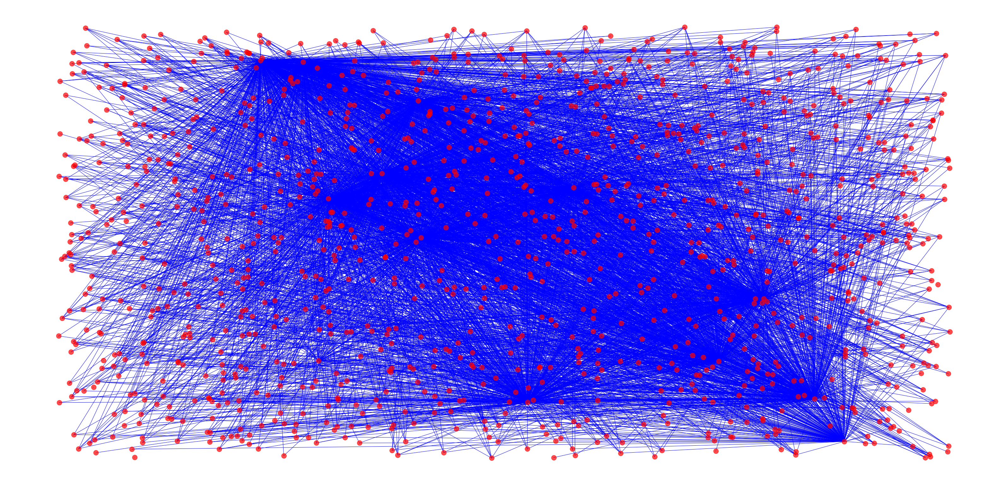

In [14]:
# nodes
nx.draw_networkx_nodes(G,pos,node_size=250, alpha=0.7, with_labels=False, edge_color='0.4')

# edges
nx.draw_networkx_edges(G, pos, edgelist=e,edge_color='b',
                       width=1)
# labels
nx.draw_networkx_labels(G, pos, font_size=2, font_family='sans-serif')

plt.axis('off')
plt.show()

### Centrality

In [16]:
deg_centrality = nx.degree_centrality(G)
deg_centrality

{201: 0.40240756663800514,
 219: 0.2897678417884781,
 242: 0.3757523645743766,
 255: 0.19690455717970765,
 259: 0.3473774720550301,
 262: 0.4316423043852107,
 263: 0.27773000859845226,
 264: 0.3886500429922614,
 267: 0.411006018916595,
 268: 0.3929492691315563,
 271: 0.3757523645743766,
 272: 0.3998280309544282,
 275: 0.3860705073086844,
 277: 0.3404987102321582,
 279: 0.38435081685296646,
 280: 0.2545141874462597,
 288: 0.4067067927773001,
 289: 0.2536543422184007,
 301: 0.294926913155632,
 315: 0.33963886500429924,
 332: 0.4935511607910576,
 334: 0.3276010318142734,
 335: 0.4170249355116079,
 336: 0.30266552020636284,
 338: 0.4032674118658642,
 340: 0.2536543422184007,
 342: 0.2553740326741187,
 344: 0.3654342218400688,
 347: 0.5021496130696474,
 351: 0.3619948409286329,
 355: 0.22012037833190026,
 357: 0.24333619948409288,
 360: 0.38005159071367156,
 361: 0.3250214961306965,
 363: 0.3009458297506449,
 370: 0.3404987102321582,
 376: 0.3946689595872743,
 380: 0.31900257953568356,
 382

### Mean Degree

### Communities

### Clustering Coefficient

#### Finding the most important nodes using degree centrality

In [58]:
d = sorted(deg_centrality.items(), key=lambda x: x[1],reverse=True) #sort the nodes according to the the deg. centrality values
values = [x[1] for x in d]

max_slope = 0
max_index = 0
for i in range(1,len(d)-1):
    
    slope = d[i][1] - d[i+1][1]
    if slope >= max_slope:
        max_slope = slope
        max_index = i
    #print(d[i][1] - d[i+1][1])

print(max_slope)
print(values[max_index])   

0.018916595012897663
0.5270851246775581


In [59]:
starting_nodes = []
for item in d:
    if item[1] > 0.45:
        starting_nodes.append(item[0])
        print(item[0],item[1])

1543 0.5967325881341359
1667 0.5546001719690455
1671 0.5485812553740327
1484 0.5365434221840069
959 0.532244196044712
880 0.529664660361135
918 0.5270851246775581
1764 0.5081685296646604
1966 0.5073086844368014
1854 0.5047291487532244
347 0.5021496130696474
1721 0.5012897678417885
1999 0.5012897678417885
1047 0.49871023215821153
1533 0.49699054170249357
1697 0.4961306964746346
332 0.4935511607910576
945 0.49097162510748066
1562 0.4892519346517627
712 0.48753224419604474
949 0.48667239896818576
724 0.4823731728288908
1851 0.4823731728288908
1855 0.47979363714531387
1973 0.4789337919174549
1630 0.47377472055030095
935 0.472055030094583
1015 0.471195184866724
1665 0.471195184866724
733 0.46775580395528804
578 0.4651762682717111
738 0.46345657781599314
1590 0.4591573516766982
623 0.4582975064488392
1294 0.4582975064488392
713 0.4582975064488392
761 0.4582975064488392
937 0.45743766122098023
246 0.45571797076526227
1869 0.45313843508168533
495 0.4522785898538263
1784 0.45055889939810834


In [60]:
starting_nodes #this is the list of starting nodes we'll start the cascades with based on deg. centrality

[1543,
 1667,
 1671,
 1484,
 959,
 880,
 918,
 1764,
 1966,
 1854,
 347,
 1721,
 1999,
 1047,
 1533,
 1697,
 332,
 945,
 1562,
 712,
 949,
 724,
 1851,
 1855,
 1973,
 1630,
 935,
 1015,
 1665,
 733,
 578,
 738,
 1590,
 623,
 1294,
 713,
 761,
 937,
 246,
 1869,
 495,
 1784]

In [61]:
total_food = 0 #get total food for entire graph
for index, row in data.iterrows():
    total_food += sum(row[2])

In [62]:
total_food

2113306.017000537

In [29]:
l =[2,3,4]
del l[2]
print(l)

[2, 3]


### Maximum weight cascading for Undirected Network


In [137]:
food_trans_list = [] #list to store the amount of food transferred for each cascade
for node in starting_nodes: #start from the one of the nodes in the starting cascading list made above
    food_trans = 0
    start_time = time.time() #start time for each cascade
    infect_list = [] #list of all nodes getting infected in the cascade
    df_copy = data.copy()
    G = make_graph(data) #initialize the graph
    
    infect_list.append(node) #append the starting node
      
    print("Starting node = ", node)
    while(True):
        selected_node = infect_list[-1]
        neighbors_list = list(G.neighbors(selected_node)) #get the neighbors of the node of the newly infected
        
        max_n = -1 #stores the max of all edge weights in neighbors list
        node_num = -1 #stores the node num having the max edge weight
    
        c = 0 #the number of empty lists
        #print("selected node =", selected_node)
        #print(neighbors_list)
        for n in neighbors_list: #iterate through the neighbors
                    
                    #print(str(n)+":"+str(max(G[selected_node][n]['weight'])))
                    if not G[selected_node][n]['weight']: #edge: node --> selected neighbor and empty list
                        
                        c+=1 #if count of edge list is zero, increase number of empty lists by one
                    else: #if not an empty list
                        
                        if max_n <= max(G[selected_node][n]['weight']):
                            node_num = n #get the node with the max. edge weight
                            max_n = max(G[selected_node][n]['weight'])
        
        if c == len(neighbors_list): #if all the neighbors have empty lists
                    break
                
        infect_list.append(node_num) #add the node with max edge weight to the infected list
        edge_weight_list = G[selected_node][node_num]['weight']
        i = edge_weight_list.index(max_n)
        food_trans += max_n #add cumulatively the amount of food time
        #print(max_n)
        del edge_weight_list[i] #pop the max. value from the edge list
         
        G[selected_node][node_num]['weight'] = edge_weight_list #modify the edge list
        
    food_trans_list.append(food_trans)
    print("Fraction of food transferred time =", food_trans/total_food)
    print("--- %s seconds Execution time ---" % (time.time() - start_time))
    #print("Bee cascade =", infect_list)
    print("Cascade length = ", len(infect_list))             
        
    
        
    
    

Starting node =  1543
Fraction of food transferred time = 0.9656879110660829
--- 251.31727981567383 seconds Execution time ---
Cascade length =  265964
Starting node =  1667
Fraction of food transferred time = 0.9644292197177403
--- 242.7049481868744 seconds Execution time ---
Cascade length =  264634
Starting node =  1671
Fraction of food transferred time = 0.9644670755698288
--- 249.84739995002747 seconds Execution time ---
Cascade length =  264674
Starting node =  1484
Fraction of food transferred time = 0.9660891738236663
--- 249.86087822914124 seconds Execution time ---
Cascade length =  266388
Starting node =  959
Fraction of food transferred time = 0.9650481584750594
--- 253.24099779129028 seconds Execution time ---
Cascade length =  265288
Starting node =  880
Fraction of food transferred time = 0.965815670603901
--- 249.9924681186676 seconds Execution time ---
Cascade length =  266099
Starting node =  918
Fraction of food transferred time = 0.9651532038391549
--- 252.035664796

In [ ]:
import matplotlib.pyplot as plt
matplotlib.rc('xtick', labelsize=30)     
matplotlib.rc('ytick', labelsize=30)
plt.plot(values)

### Random neigbor selection(Edge weights ignored) Undirected Network

In [ ]:
deg_centrality

In [ ]:


p = [0.1]
node_list = list(G.nodes())
cascade_list = []
for prob in p: 
    
    while len(node_list)!= 0:
        infect_list = []
        first = random.choice(node_list) #the first infected node
        infect_list.append(first)#the first infected node
        neighbors_current = list(G.neighbors(first))
        for potential_node in neighbors_current:
                        if potential_node not in infect_list:
                            if np.random.rand() < prob:
                                infect_list.append(potential_node)
        node_list.remove(first)
        #print(node_list)
        cascade_list.append(infect_list)


In [ ]:
print(len(cascade_list))

In [ ]:
print(len(list(G.nodes)))

In [ ]:
p = [0.1]
node_list = list(G.nodes())
cascade_list = []
for prob in p: 
    
    while len(node_list)!= 0:
        infect_list = [] #the nodes infected by first node
        first = random.choice(node_list) #the first infected node
        node_list.remove(first)
        infect_list.append(first)#the first infected node
        neighbors_current = list(G.neighbors(first))
        for potential_node in neighbors_current:
                        if potential_node not in infect_list:
                            if np.random.rand() < prob:
                                infect_list.append(potential_node)
                                node_list.remove(potential_node)
        
        #print(node_list)
        cascade_list.append(infect_list)

In [ ]:
G = nx.complete_graph(number_of_nodes)

In [ ]:
import random
from nxsim import BaseNetworkAgent

class ZombieOutbreak(BaseNetworkAgent):
    def __init__(self, environment=None, agent_id=0, state=()):
        super().__init__(environment=environment, agent_id=agent_id, state=state)
        self.bite_prob = 0.05

    def run(self):
        while True:
            if self.state['id'] == 1:
                self.zombify()
                yield self.env.timeout(1)
            else:
                yield self.env.event()

    def zombify(self):
        normal_neighbors = self.get_neighboring_agents(state_id=0)
        for neighbor in normal_neighbors:
            if random.random() < self.bite_prob:
                neighbor.state['id'] = 1  # zombie
                print(self.env.now, self.id, neighbor.id, sep='\t')
                break

In [ ]:
from nxsim import NetworkSimulation
number_of_nodes = 10
# Initialize agent states. Let's assume everyone is normal.
# Add keys as as necessary, but "id" must always refer to that state category
init_states = [{'id': 0, } for _ in range(number_of_nodes)]

# Seed a zombie
init_states[5] = {'id': 1}
sim = NetworkSimulation(topology=G, states=init_states, agent_type=ZombieOutbreak,
                        max_time=30, dir_path='sim_01', num_trials=1, logging_interval=1.0)

In [ ]:
sim.run_simulation()

In [ ]:

%matplotlib inline
nx.draw(G)
